In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pickle
import spacy

In [233]:
import string

In [3]:
nlp = spacy.load('en_core_web_sm')

In [43]:
doc = nlp("Gagandeep Singh is a great guy. He stays in Janakpuri") 

In [44]:
doc

Gagandeep Singh is a great guy. He stays in Janakpuri

In [45]:
type(doc)

spacy.tokens.doc.Doc

In [46]:
for ent in doc.ents:
    print(ent.text,ent.label_)

Gagandeep Singh PERSON
Janakpuri GPE


In [13]:
data=pd.read_csv("raw_data1.csv")

In [14]:
data.head(10)

,Patient Number,State Patient Number,Date Announced,Estimated Onset Date,Age Bracket,Gender,Detected City,Detected District,Detected State,State code,Current Status,Notes,Contracted from which Patient (Suspected),Nationality,Type of transmission,Status Change Date,Source_1,Source_2,Source_3,Backup Notes
0,1,KL-TS-P1,30/01/2020,NaN,20,F,Thrissur,Thrissur,Kerala,KL,Recovered,Travelled from Wuhan,NaN,India,Imported,14/02/2020,https://twitter.com/vijayanpinarayi/status/122...,https://weather.com/en-IN/india/news/news/2020...,NaN,Student from Wuhan
1,2,KL-AL-P1,02/02/2020,NaN,NaN,NaN,Alappuzha,Alappuzha,Kerala,KL,Recovered,Travelled from Wuhan,NaN,India,Imported,14/02/2020,https://www.indiatoday.in/india/story/kerala-r...,https://weather.com/en-IN/india/news/news/2020...,NaN,Student from Wuhan
2,3,KL-KS-P1,03/02/2020,NaN,NaN,NaN,Kasaragod,Kasaragod,Kerala,KL,Recovered,Travelled from Wuhan,NaN,India,Imported,14/02/2020,https://www.indiatoday.in/india/story/kerala-n...,https://twitter.com/ANI/status/122422148580539...,https://weather.com/en-IN/india/news/news/2020...,Student from Wuhan
3,4,DL-P1,02/03/2020,NaN,45,M,East Delhi (Mayur Vihar),East Delhi,Delhi,DL,Recovered,"Travelled from Austria, Italy",NaN,India,Imported,15/03/2020,https://www.indiatoday.in/india/story/not-a-ja...,https://economictimes.indiatimes.com/news/poli...,NaN,Travel history to Italy and Austria
4,5,TS-P1,02/03/2020,NaN,24,M,Hyderabad,Hyderabad,Telangana,TG,Recovered,"Travelled from Dubai to Bangalore on 20th Feb,...",NaN,India,Imported,02/03/2020,https://www.deccanherald.com/national/south/qu...,https://www.indiatoday.in/india/story/coronavi...,https://www.thehindu.com/news/national/coronav...,"Travel history to Dubai, Singapore contact"
5,6,NaN,03/03/2020,NaN,69,M,Jaipur,Italians,Rajasthan,RJ,Recovered,Travelled from Italy,NaN,Italy,Imported,03/03/2020,https://indianexpress.com/article/india/corona...,https://economictimes.indiatimes.com/news/poli...,https://twitter.com/PTI_News/status/1240878975...,Italian tourist
6,7,NaN,04/03/2020,NaN,55,NaN,Gurugram,Italians,Haryana,HR,Recovered,Travelled from Italy,P6,Italy,Imported,29/03/2020,https://indianexpress.com/article/india/corona...,https://www.indiatoday.in/india/story/coronavi...,NaN,Italian tourist
7,8,NaN,04/03/2020,NaN,55,NaN,Gurugram,Italians,Haryana,HR,Recovered,Travelled from Italy,P6,Italy,Imported,29/03/2020,https://indianexpress.com/article/india/corona...,https://www.indiatoday.in/india/story/coronavi...,NaN,Italian tourist
8,9,NaN,04/03/2020,NaN,55,NaN,Gurugram,Italians,Haryana,HR,Recovered,Travelled from Italy,P6,Italy,Imported,29/03/2020,https://indianexpress.com/article/india/corona...,https://www.indiatoday.in/india/story/coronavi...,NaN,Italian tourist
9,10,NaN,04/03/2020,NaN,55,NaN,Gurugram,Italians,Haryana,HR,Recovered,Travelled from Italy,P6,Italy,Imported,29/03/2020,https://indianexpress.com/article/india/corona...,https://www.indiatoday.in/india/story/coronavi...,NaN,Italian tourist


In [16]:
def getSite(link):
    l=link.split("/")
    print(l)
    if len(l)>3:
        return l[2]
    return ""

In [17]:
twitter=["twitter.com","mobile.twitter.com"]
tweet_links=[]
for ind,row in data.iterrows():
#     print(type(row['Source_1']),type(row['Source_2']),type(row['Source_3']))
    if isinstance(row['Source_1'],str):
        s1=getSite(row['Source_1'])
        if s1 in twitter:
            tweet_links.append(row['Source_1'])
    if isinstance(row['Source_2'],str):
        s2=getSite(row['Source_2'])
        if s2 in twitter:
            tweet_links.append(row['Source_2'])
    if isinstance(row['Source_3'],str):
        s3=getSite(row['Source_3'])
        if s3 in twitter:
            tweet_links.append(row['Source_3'])

['https:', '', 'twitter.com', 'vijayanpinarayi', 'status', '1222819465143832577']
['https:', '', 'weather.com', 'en-IN', 'india', 'news', 'news', '2020-02-14-kerala-defeats-coronavirus-indias-three-covid-19-patients-successfully']
['https:', '', 'www.indiatoday.in', 'india', 'story', 'kerala-reports-second-case-of-coronavirus-1642494-2020-02-02']
['https:', '', 'weather.com', 'en-IN', 'india', 'news', 'news', '2020-02-14-kerala-defeats-coronavirus-indias-three-covid-19-patients-successfully']
['https:', '', 'www.indiatoday.in', 'india', 'story', 'kerala-now-confirms-third-case-of-coronavirus-1642789-2020-02-03']
['https:', '', 'twitter.com', 'ANI', 'status', '1224221485805395968?s=20']
['https:', '', 'weather.com', 'en-IN', 'india', 'news', 'news', '2020-02-14-kerala-defeats-coronavirus-indias-three-covid-19-patients-successfully']
['https:', '', 'www.indiatoday.in', 'india', 'story', 'not-a-jail-delhi-s-1st-covid-19-patient-recalls-time-in-isolation-ward-has-this-one-tip-for-others-16

['https:', '', 'twitter.com', 'ANI', 'status', '1241966782216204288?s=19']
['https:', '', 'twitter.com', 'ArvindKejriwal', 'status', '1241957699916427268']
['https:', '', 'twitter.com', 'ANI', 'status', '1241966782216204288?s=19']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1241985785764532227']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1241985785764532227']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1241985785764532227']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1241987458679451648']
['https:', '', 'economictimes.indiatimes.com', 'news', 'politics-and-nation', 'chandigarh-21-year-old-man-tests-positive-for-coronavirus-total-cases-rise-to-7', 'articleshow', '74770865.cms']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1242033516927320064?s=19']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1242033516927320064?s=19']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1242100613174808576', 'photo', '1']
['https:', '

['https:', '', 'twitter.com', 'ANI', 'status', '1243386619018670083']
['https:', '', 'twitter.com', 'ANI', 'status', '1243386619018670083']
['https:', '', 'twitter.com', 'ANI', 'status', '1243405176515383300']
['https:', '', 'twitter.com', 'ANI', 'status', '1243405176515383300']
['https:', '', 'twitter.com', 'ANI', 'status', '1243405176515383300']
['https:', '', 'twitter.com', 'ANI', 'status', '1243405176515383300']
['https:', '', 'twitter.com', 'ANI', 'status', '1243405176515383300']
['https:', '', 'twitter.com', 'ArogyaAndhra', 'status', '1243417511212666880']
['https:', '', 'www.indiatoday.in', 'india', 'story', 'madhya-pradesh-second-coronavirus-death-man-indore-covid19-1660040-2020-03-26']
['https:', '', 'twitter.com', 'NHM_TN', 'status', '1243427398458081280']
['https:', '', 'twitter.com', 'NHM_TN', 'status', '1243427398458081280']
['https:', '', 'twitter.com', 'NHM_TN', 'status', '1243427398458081280']
['https:', '', 'twitter.com', 'NHM_TN', 'status', '1243427398458081280']
['ht

['https:', '', 'twitter.com', 'ANI', 'status', '1243881127485423617']
['https:', '', 'www.manoramaonline.com', 'district-news', 'kollam', '2020', '03', '28', 'kollam-covid-19-for-kollam-native.html']
['https:', '', 'twitter.com', 'ANI', 'status', '1243881127485423617']
['https:', '', 'twitter.com', 'ANI', 'status', '1243881127485423617']
['https:', '', 'www.facebook.com', 'permalink.php?story_fbid=158316895638147&id=100507158085788']
['https:', '', 'twitter.com', 'NHM_TN', 'status', '1243881744090136577']
['https:', '', 'twitter.com', 'ANI', 'status', '1243896303781740550']
['https:', '', 'www.livemint.com', 'news', 'india', 'family-of-six-tests-positive-for-covid-19-in-hyderabad-11585398131237.html']
['https:', '', 'twitter.com', 'ANI', 'status', '1243896303781740550']
['https:', '', 'twitter.com', 'ANI', 'status', '1243896303781740550']
['https:', '', 'twitter.com', 'ANI', 'status', '1243896303781740550']
['https:', '', 'twitter.com', 'ANI', 'status', '1243896303781740550']
['https:'

['https:', '', 'twitter.com', 'PTI_News', 'status', '1244470793909620742?s=19']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1244470793909620742?s=19']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1244500743505113089?s=20']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1244500743505113089?s=20']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1244500743505113089?s=20']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1244500743505113089?s=20']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1244500743505113089?s=20']
['https:', '', 'timesofindia.indiatimes.com', 'city', 'rajkot', '45-year-old-woman-dies-of-covid-19-in-gujarats-bhavnagar-state-toll-reaches-six', 'articleshow', '74883969.cms?utm_campaign=andapp&utm_medium=referral&utm_source=native_share_tray']
['https:', '', 'gujcovid19.gujarat.gov.in', 'uploads', 'pressbrief3003302020125519847.pdf']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1244500743505113089?s=20']
['https:', '', 'twitt

['https:', '', 'arogya.maharashtra.gov.in', 'pdf', 'epressnote31.pdf']
['https:', '', 'arogya.maharashtra.gov.in', 'pdf', 'epressnote31.pdf']
['https:', '', 'arogya.maharashtra.gov.in', 'pdf', 'epressnote31.pdf']
['https:', '', 'arogya.maharashtra.gov.in', 'pdf', 'epressnote31.pdf']
['https:', '', 'twitter.com', 'ANI', 'status', '1245213191228944387']
['https:', '', 'twitter.com', 'ANI', 'status', '1245213191228944387']
['https:', '', 'arogya.maharashtra.gov.in', 'pdf', 'epressnote31.pdf']
['https:', '', 'arogya.maharashtra.gov.in', 'pdf', 'epressnote31.pdf']
['https:', '', 'arogya.maharashtra.gov.in', 'pdf', 'epressnote31.pdf']
['https:', '', 'arogya.maharashtra.gov.in', 'pdf', 'epressnote31.pdf']
['https:', '', 'arogya.maharashtra.gov.in', 'pdf', 'epressnote31.pdf']
['https:', '', 'twitter.com', 'ANI', 'status', '1245213191228944387']
['https:', '', 'twitter.com', 'ANI', 'status', '1245213191228944387']
['https:', '', 'twitter.com', 'ANI', 'status', '1245213191228944387']
['https:', 

['https:', '', 'twitter.com', 'sriramulubjp', 'status', '1245265375626842113']
['https:', '', 'twitter.com', 'kbssidhu1961', 'status', '1245259345765347329']
['https:', '', 'twitter.com', 'kbssidhu1961', 'status', '1245259345765347329']
['https:', '', 'twitter.com', 'kbssidhu1961', 'status', '1245259345765347329']
['https:', '', 'twitter.com', 'ANI', 'status', '1245277405884715008']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1245280285081493504']
['https:', '', 'twitter.com', 'ANI', 'status', '1245277405884715008']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1245280285081493504']
['https:', '', 'twitter.com', 'ANI', 'status', '1245277405884715008']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1245280285081493504']
['https:', '', 'twitter.com', 'ANI', 'status', '1245277405884715008']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1245280285081493504']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1245288412954779649']
['https:', '', 'twitter.com'

['https:', '', 'twitter.com', 'HFWOdisha', 'status', '1245409739195834369?s=19']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1245399939485585410?s=19']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1245562248388464641?s=20']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1245562248388464641?s=20']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1245562248388464641?s=20']
['https:', '', 'twitter.com', 'Eatala_Rajender', 'status', '1245425932929617921']
['https:', '', 'twitter.com', 'Eatala_Rajender', 'status', '1245425932929617921']
['https:', '', 'twitter.com', 'Eatala_Rajender', 'status', '1245425932929617921']
['https:', '', 'twitter.com', 'Eatala_Rajender', 'status', '1245425932929617921']
['https:', '', 'twitter.com', 'Eatala_Rajender', 'status', '1245425932929617921']
['https:', '', 'twitter.com', 'Eatala_Rajender', 'status', '1245425932929617921']
['https:', '', 'twitter.com', 'Eatala_Rajender', 'status', '1245425932929617921']
['https:', '', 'twitter.

['https:', '', 'twitter.com', 'ANI', 'status', '1245693626472116226']
['https:', '', 'twitter.com', 'ANI', 'status', '1245693626472116226']
['https:', '', 'twitter.com', 'ANI', 'status', '1245693626472116226']
['https:', '', 'twitter.com', 'ANI', 'status', '1245693626472116226']
['https:', '', 'twitter.com', 'ANI', 'status', '1245693626472116226']
['https:', '', 'twitter.com', 'ANI', 'status', '1245693626472116226']
['https:', '', 'twitter.com', 'ANI', 'status', '1245693626472116226']
['https:', '', 'twitter.com', 'ANI', 'status', '1245693626472116226']
['https:', '', 'twitter.com', 'ANI', 'status', '1245693626472116226']
['https:', '', 'twitter.com', 'ANI', 'status', '1245693626472116226']
['https:', '', 'twitter.com', 'ANI', 'status', '1245693626472116226']
['https:', '', 'twitter.com', 'ANI', 'status', '1245693626472116226']
['https:', '', 'twitter.com', 'ANI', 'status', '1245693626472116226']
['https:', '', 'twitter.com', 'ANI', 'status', '1245693626472116226']
['https:', '', 'twit

['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1245971315019763718']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1245971315019763718']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1245971315019763718']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1245971315019763718']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1245971315019763718']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1245971315019763718']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1245971315019763718']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1245971315019763718']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1245971315019763718']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1245971315019763718']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1245971315019763718']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1245971315019763718']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1245971315019763718']
['https:', '

['https:', '', 'twitter.com', 'PTI_News', 'status', '1246097072761081856']
['https:', '', 'experience.arcgis.com', 'experience', '8167a61f882a4af4b9098e947dfd589f', '']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1246097072761081856']
['https:', '', 'experience.arcgis.com', 'experience', '8167a61f882a4af4b9098e947dfd589f', '']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1246097072761081856']
['https:', '', 'experience.arcgis.com', 'experience', '8167a61f882a4af4b9098e947dfd589f', '']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1246097072761081856']
['https:', '', 'experience.arcgis.com', 'experience', '8167a61f882a4af4b9098e947dfd589f', '']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1246097072761081856']
['https:', '', 'experience.arcgis.com', 'experience', '8167a61f882a4af4b9098e947dfd589f', '']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1246097072761081856']
['https:', '', 'experience.arcgis.com', 'experience', '8167a61f882a4af4b9098e947

['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1246412525890973697']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1246412525890973697']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1246412525890973697']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1246412525890973697']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1246412525890973697']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1246412525890973697']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1246412525890973697']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1246412525890973697']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1246412525890973697']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1246412525890973697']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1246412525890973697']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1246412525890973697']
['https:', '', 'twitter.com', 'ANINewsUP', 'status', '1246412525890973697']
['https:', '

['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1246482154852253697']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1246482154852253697']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1246482154852253697']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1246482154852253697']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1246482154852253697']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1246482154852253697']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1246482154852253697']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1246482154852253697']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1246482154852253697']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1246482154852253697']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1246482154852253697']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1246482154852253697']
['https:', '', 'twitter.com', 'rajeshtope11', 'statu

['https:', '', 'twitter.com', 'ANI', 'status', '1246793618855096320']
['https:', '', 'twitter.com', 'ANI', 'status', '1246793618855096320']
['https:', '', 'twitter.com', 'ANI', 'status', '1246793618855096320']
['https:', '', 'twitter.com', 'ANI', 'status', '1246793618855096320']
['https:', '', 'twitter.com', 'ANI', 'status', '1246793618855096320']
['https:', '', 'twitter.com', 'ANI', 'status', '1246793618855096320']
['https:', '', 'twitter.com', 'ANI', 'status', '1246793618855096320']
['https:', '', 'twitter.com', 'ANI', 'status', '1246793618855096320']
['https:', '', 'twitter.com', 'ANI', 'status', '1246793618855096320']
['https:', '', 'twitter.com', 'ANI', 'status', '1246793618855096320']
['https:', '', 'twitter.com', 'ANI', 'status', '1246793618855096320']
['https:', '', 'twitter.com', 'ANI', 'status', '1246793618855096320']
['https:', '', 'twitter.com', 'ANI', 'status', '1246793618855096320']
['https:', '', 'twitter.com', 'ANI', 'status', '1246793618855096320']
['https:', '', 'twit

['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1246847163855851520']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1246847163855851520']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1246847163855851520']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1246847163855851520']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1246847163855851520']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1246847163855851520']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1246847163855851520']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1246847163855851520']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1246847163855851520']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1246847163855851520']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1246847163855851520']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1246847163855851520']
['https:', '', 'twitter.com', 'IPRTelangana', 'statu

["CM's Meet"]
['https:', '', 'twitter.com', 'TOIHyderabad', 'status', '1247161225940627456']
["CM's Meet"]
['https:', '', 'twitter.com', 'TOIHyderabad', 'status', '1247161225940627456']
["CM's Meet"]
['https:', '', 'twitter.com', 'TOIHyderabad', 'status', '1247161225940627456']
["CM's Meet"]
['https:', '', 'twitter.com', 'TOIHyderabad', 'status', '1247161225940627456']
["CM's Meet"]
['https:', '', 'twitter.com', 'TOIHyderabad', 'status', '1247161225940627456']
["CM's Meet"]
['https:', '', 'twitter.com', 'TOIHyderabad', 'status', '1247161225940627456']
["CM's Meet"]
['https:', '', 'twitter.com', 'TOIHyderabad', 'status', '1247161225940627456']
["CM's Meet"]
['https:', '', 'twitter.com', 'TOIHyderabad', 'status', '1247161225940627456']
["CM's Meet"]
['https:', '', 'twitter.com', 'TOIHyderabad', 'status', '1247161225940627456']
["CM's Meet"]
['https:', '', 'twitter.com', 'TOIHyderabad', 'status', '1247161225940627456']
["CM's Meet"]
['https:', '', 'twitter.com', 'TOIHyderabad', 'status', 

['https:', '', 'twitter.com', 'HFWOdisha', 'status', '1247196539929292800']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1247199167157432322']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1247199167157432322']
['https:', '', 'twitter.com', 'BjpBiplab', 'status', '1247196259783327747']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1247197745678442504']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1247197745678442504']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1247197745678442504']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1247197745678442504']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1247197745678442504']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1247197745678442504']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1247197745678442504']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1247197745678442504']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1247197745678442504']
['https:', '',

['https:', '', 'twitter.com', 'mybmc', 'status', '1247523153707851776']
['https:', '', 'twitter.com', 'mybmc', 'status', '1247523153707851776']
['https:', '', 'twitter.com', 'mybmc', 'status', '1247523153707851776']
['https:', '', 'twitter.com', 'mybmc', 'status', '1247523153707851776']
['https:', '', 'twitter.com', 'mybmc', 'status', '1247523153707851776']
['https:', '', 'twitter.com', 'mybmc', 'status', '1247523153707851776']
['https:', '', 'twitter.com', 'mybmc', 'status', '1247523153707851776']
['https:', '', 'twitter.com', 'mybmc', 'status', '1247523153707851776']
['https:', '', 'twitter.com', 'mybmc', 'status', '1247523153707851776']
['https:', '', 'twitter.com', 'mybmc', 'status', '1247523153707851776']
['https:', '', 'twitter.com', 'mybmc', 'status', '1247523153707851776']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1247534051512053760?s=20']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1247534051512053760?s=20']
['https:', '', 'twitter.com', 'PIBAhmeda

['http:', '', 'www.nhmharyana.gov.in', 'WriteReadData', 'userfiles', 'file', 'CoronaVirus', 'bulletin%2008042020Morning.pdf']
['http:', '', 'www.nhmharyana.gov.in', 'WriteReadData', 'userfiles', 'file', 'CoronaVirus', 'bulletin%2008042020Morning.pdf']
['http:', '', 'www.nhmharyana.gov.in', 'WriteReadData', 'userfiles', 'file', 'CoronaVirus', 'bulletin%2008042020Morning.pdf']
['http:', '', 'www.nhmharyana.gov.in', 'WriteReadData', 'userfiles', 'file', 'CoronaVirus', 'bulletin%2008042020Morning.pdf']
['http:', '', 'www.nhmharyana.gov.in', 'WriteReadData', 'userfiles', 'file', 'CoronaVirus', 'bulletin%2008042020Morning.pdf']
['http:', '', 'www.nhmharyana.gov.in', 'WriteReadData', 'userfiles', 'file', 'CoronaVirus', 'bulletin%2008042020Morning.pdf']
['http:', '', 'www.nhmharyana.gov.in', 'WriteReadData', 'userfiles', 'file', 'CoronaVirus', 'bulletin%2008042020Morning.pdf']
['https:', '', 't.me', 'indiacovid', '1811']
['https:', '', 'twitter.com', 'ANI', 'status', '1247763684186677250']
['h

['https:', '', 'twitter.com', 'kansalrohit69', 'status', '1247877033993973765']
['https:', '', 'twitter.com', 'kansalrohit69', 'status', '1247877033993973765']
['https:', '', 'twitter.com', 'kansalrohit69', 'status', '1247877033993973765']
['https:', '', 'twitter.com', 'kansalrohit69', 'status', '1247877033993973765']
['https:', '', 'twitter.com', 'kansalrohit69', 'status', '1247877033993973765']
['https:', '', 'twitter.com', 'kansalrohit69', 'status', '1247877033993973765']
['https:', '', 'twitter.com', 'kansalrohit69', 'status', '1247877033993973765']
['https:', '', 'twitter.com', 'kansalrohit69', 'status', '1247877033993973765']
['https:', '', 'twitter.com', 'kansalrohit69', 'status', '1247877033993973765']
['https:', '', 'twitter.com', 'kansalrohit69', 'status', '1247877033993973765']
['https:', '', 'twitter.com', 'kansalrohit69', 'status', '1247877033993973765']
['https:', '', 'twitter.com', 'kansalrohit69', 'status', '1247877033993973765']
['https:', '', 'twitter.com', 'kansalroh

['https:', '', 'twitter.com', 'ANI', 'status', '1248120599282700288']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248126735008370688']
['https:', '', 'twitter.com', 'ANI', 'status', '1248120599282700288']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248126735008370688']
['https:', '', 'twitter.com', 'ANI', 'status', '1248120599282700288']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248126735008370688']
['https:', '', 'twitter.com', 'ANI', 'status', '1248120599282700288']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248126735008370688']
['https:', '', 'twitter.com', 'ANI', 'status', '1248120599282700288']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248126735008370688']
['https:', '', 'twitter.com', 'ANI', 'status', '1248120599282700288']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248126735008370688']
['https:', '', 'twitter.com', 'ANI', 'status', '1248120599282700288']
['https:', '', 'twitter.com', 'PIBAh

['https:', '', 'twitter.com', 'PTI_News', 'status', '1248126814301483009']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1248126814301483009']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1248126814301483009']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1248126814301483009']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1248126814301483009']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1248126814301483009']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1248126814301483009']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1248126814301483009']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1248126814301483009']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1248126814301483009']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1248126814301483009']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1248126814301483009']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1248126814301483009']
['https:', '', 'twitter.c

['https:', '', 'twitter.com', 'ANI', 'status', '1248248436643647489']
['https:', '', 'twitter.com', 'ANI', 'status', '1248248436643647489']
['https:', '', 'twitter.com', 'ANI', 'status', '1248248436643647489']
['https:', '', 'twitter.com', 'ANI', 'status', '1248248436643647489']
['https:', '', 'twitter.com', 'ANI', 'status', '1248248436643647489']
['https:', '', 'twitter.com', 'ANI', 'status', '1248248436643647489']
['https:', '', 'twitter.com', 'ANI', 'status', '1248248436643647489']
['https:', '', 'twitter.com', 'ANI', 'status', '1248248436643647489']
['https:', '', 'twitter.com', 'ANI', 'status', '1248248436643647489']
['https:', '', 'twitter.com', 'ANI', 'status', '1248248436643647489']
['https:', '', 'twitter.com', 'ANI', 'status', '1248248436643647489']
['https:', '', 'twitter.com', 'ANI', 'status', '1248248436643647489']
['https:', '', 'twitter.com', 'ANI', 'status', '1248248436643647489']
['https:', '', 'twitter.com', 'ANI', 'status', '1248248436643647489']
['https:', '', 'twit

['https:', '', 't.me', 'indiacovid', '1928']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1248277713103667200']
['https:', '', 't.me', 'indiacovid', '1928']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1248277713103667200']
['https:', '', 't.me', 'indiacovid', '1928']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1248277713103667200']
['https:', '', 't.me', 'indiacovid', '1928']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1248277713103667200']
['https:', '', 't.me', 'indiacovid', '1928']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1248277713103667200']
['https:', '', 'twitter.com', 'sanjayjavin', 'status', '1248295506033270784']
['https:', '', 'twitter.com', 'sanjayjavin', 'status', '1248295506033270784']
['https:', '', 'twitter.com', 'sanjayjavin', 'status', '1248295506033270784']
['https:', '', 'twitter.com', 'sanjayjavin', 'status', '1248295506033270784']
['https:', '', 'twitter.com', 'sanjayjavin', 'status', '1248295506033270784']
['htt

['https:', '', 'twitter.com', 'ANI', 'status', '1248598076912095234']
['https:', '', 'twitter.com', 'ANI', 'status', '1248598076912095234']
['https:', '', 'twitter.com', 'ANI', 'status', '1248598076912095234']
['https:', '', 'twitter.com', 'ANI', 'status', '1248598076912095234']
['https:', '', 'twitter.com', 'ANI', 'status', '1248598076912095234']
['https:', '', 'twitter.com', 'ANI', 'status', '1248598076912095234']
['https:', '', 'twitter.com', 'ANI', 'status', '1248598076912095234']
['https:', '', 'twitter.com', 'ANI', 'status', '1248598076912095234']
['https:', '', 'twitter.com', 'ANI', 'status', '1248598076912095234']
['https:', '', 'twitter.com', 'ANI', 'status', '1248598076912095234']
['https:', '', 'twitter.com', 'ANI', 'status', '1248598076912095234']
['https:', '', 'twitter.com', 'ANI', 'status', '1248598076912095234']
['https:', '', 'twitter.com', 'ANI', 'status', '1248598076912095234']
['https:', '', 'twitter.com', 'ANI', 'status', '1248598076912095234']
['https:', '', 'twit

['https:', '', 'twitter.com', 'CMODelhi', 'status', '1248629443230175232']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1248629443230175232']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1248629443230175232']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1248629443230175232']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1248629443230175232']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1248629443230175232']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1248629443230175232']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1248629443230175232']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1248629443230175232']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1248629443230175232']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1248629443230175232']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1248629443230175232']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1248629443230175232']
['https:', '', 'twitter.c

['https:', '', 'twitter.com', 'ANI', 'status', '1248853360901378049']
['https:', '', 'twitter.com', 'ANI', 'status', '1248853360901378049']
['https:', '', 'twitter.com', 'ANI', 'status', '1248853360901378049']
['https:', '', 'twitter.com', 'ANI', 'status', '1248853360901378049']
['https:', '', 'twitter.com', 'ANI', 'status', '1248853360901378049']
['https:', '', 'twitter.com', 'ANI', 'status', '1248853360901378049']
['https:', '', 'twitter.com', 'ANI', 'status', '1248853360901378049']
['https:', '', 'twitter.com', 'ANI', 'status', '1248853360901378049']
['https:', '', 'twitter.com', 'ANI', 'status', '1248853360901378049']
['https:', '', 'twitter.com', 'ANI', 'status', '1248853360901378049']
['https:', '', 'twitter.com', 'ANI', 'status', '1248853360901378049']
['https:', '', 'twitter.com', 'ANI', 'status', '1248853360901378049']
['https:', '', 'twitter.com', 'ANI', 'status', '1248853360901378049']
['https:', '', 'twitter.com', 'ANI', 'status', '1248853360901378049']
['https:', '', 'twit

['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248984762225774595']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248984762225774595']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248984762225774595']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248984762225774595']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248984762225774595']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248984762225774595']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248984762225774595']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248984762225774595']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248984762225774595']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248984762225774595']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248984762225774595']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1248984762225774595']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'statu

['https:', '', 'twitter.com', 'ANI', 'status', '1249051899929731072?s=19']
['https:', '', 'twitter.com', 'ANI', 'status', '1249051899929731072?s=19']
['https:', '', 'twitter.com', 'ANI', 'status', '1249051899929731072?s=19']
['https:', '', 'twitter.com', 'ANI', 'status', '1249051899929731072?s=19']
['https:', '', 'twitter.com', 'ANI', 'status', '1249051899929731072?s=19']
['https:', '', 'twitter.com', 'ANI', 'status', '1249051899929731072?s=19']
['https:', '', 'twitter.com', 'ANI', 'status', '1249051899929731072?s=19']
['https:', '', 't.me', 'Karnataka_KoViD19_Broadcast', '1875']
['https:', '', 't.me', 'Karnataka_KoViD19_Broadcast', '1875']
['https:', '', 't.me', 'Karnataka_KoViD19_Broadcast', '1875']
['https:', '', 't.me', 'Karnataka_KoViD19_Broadcast', '1875']
['https:', '', 't.me', 'Karnataka_KoViD19_Broadcast', '1875']
['https:', '', 't.me', 'Karnataka_KoViD19_Broadcast', '1875']
['https:', '', 't.me', 'Karnataka_KoViD19_Broadcast', '1875']
['https:', '', 't.me', 'Karnataka_KoViD19

['https:', '', 'twitter.com', 'ANI', 'status', '1249315297607073792']
['https:', '', 'twitter.com', 'THChennai', 'status', '1249313421092196353']
['https:', '', 'twitter.com', 'ANI', 'status', '1249315297607073792']
['https:', '', 'twitter.com', 'THChennai', 'status', '1249313421092196353']
['https:', '', 'twitter.com', 'ANI', 'status', '1249315297607073792']
['https:', '', 'twitter.com', 'THChennai', 'status', '1249313421092196353']
['https:', '', 'twitter.com', 'ANI', 'status', '1249315297607073792']
['https:', '', 'twitter.com', 'THChennai', 'status', '1249313421092196353']
['https:', '', 'twitter.com', 'ANI', 'status', '1249315297607073792']
['https:', '', 'twitter.com', 'THChennai', 'status', '1249313421092196353']
['https:', '', 'twitter.com', 'ANI', 'status', '1249315297607073792']
['https:', '', 'twitter.com', 'THChennai', 'status', '1249313421092196353']
['https:', '', 'twitter.com', 'ANI', 'status', '1249315297607073792']
['https:', '', 'twitter.com', 'THChennai', 'status', '

['https:', '', 'twitter.com', 'PTI_News', 'status', '1249354442656251904']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249354442656251904']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249354442656251904']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249354442656251904']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249354442656251904']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249354442656251904']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249354442656251904']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249354442656251904']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249354442656251904']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249354442656251904']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249354442656251904']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249354442656251904']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249354442656251904']
['https:', '', 'twitter.c

['https:', '', 'twitter.com', 'PTI_News', 'status', '1249684563674034177']
['https:', '', 'twitter.com', 'NHM_TN', 'status', '1249688607515959298']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249684563674034177']
['https:', '', 'twitter.com', 'NHM_TN', 'status', '1249688607515959298']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249684563674034177']
['https:', '', 'twitter.com', 'NHM_TN', 'status', '1249688607515959298']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249684563674034177']
['https:', '', 'twitter.com', 'NHM_TN', 'status', '1249688607515959298']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249684563674034177']
['https:', '', 'twitter.com', 'NHM_TN', 'status', '1249688607515959298']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249684563674034177']
['https:', '', 'twitter.com', 'NHM_TN', 'status', '1249688607515959298']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249684563674034177']
['https:', '', 'twitter.com', 'NHM_TN

['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 't.me', 'indiacovid', '2199']
['https:', '', 'twitter.com', 'IPRTelangana', 'status', '1249737633443377152']
['https:', '', 'twitter.com', 'TOIHyderabad', 'status', '124973567

['https:', '', 'twitter.com', 'CMODelhi', 'status', '1249744159491031047']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1249744159491031047']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1249744159491031047']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1249744159491031047']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1249744159491031047']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1249744159491031047']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1249744159491031047']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1249744159491031047']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1249744159491031047']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1249744159491031047']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1249744159491031047']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1249744159491031047']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1249744159491031047']
['https:', '', 'twitter.c

['https:', '', 'twitter.com', 'PTI_News', 'status', '1249950597534470145']
['https:', '', 'twitter.com', 'ANI', 'status', '1249951763781890049']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249950597534470145']
['https:', '', 'twitter.com', 'ANI', 'status', '1249951763781890049']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249950597534470145']
['https:', '', 'twitter.com', 'ANI', 'status', '1249951763781890049']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249950597534470145']
['https:', '', 'twitter.com', 'ANI', 'status', '1249951763781890049']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249950597534470145']
['https:', '', 'twitter.com', 'ANI', 'status', '1249951763781890049']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249950597534470145']
['https:', '', 'twitter.com', 'ANI', 'status', '1249951763781890049']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1249950597534470145']
['https:', '', 'twitter.com', 'ANI', 'status', '1249951

['https:', '', 'twitter.com', 'CMODelhi', 'status', '1250087698011803648', 'photo', '1']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1250087698011803648', 'photo', '1']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1250087698011803648', 'photo', '1']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1250087698011803648', 'photo', '1']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1250087698011803648', 'photo', '1']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1250087698011803648', 'photo', '1']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1250087698011803648', 'photo', '1']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1250087698011803648', 'photo', '1']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1250087698011803648', 'photo', '1']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1250087698011803648', 'photo', '1']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1250087698011803648', 'photo', '1']
['https:', '', 'twitt

['https:', '', 'twitter.com', 'ANI', 'status', '1250078725397504002?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1250078725397504002?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1250078725397504002?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1250078725397504002?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1250078725397504002?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1250078725397504002?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1250078725397504002?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1250078725397504002?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1250078725397504002?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1250078725397504002?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1250078725397504002?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1250078725397504002?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1250078725397504002?s=09']
['https:', '', 'twitter.c

['https:', '', 'twitter.com', 'ANI', 'status', '1250271721581469696']
['https:', '', 'twitter.com', 'ANI', 'status', '1250271721581469696']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1250349485063954436']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1250349485063954436']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1250349485063954436']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1250349485063954436']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1250349485063954436']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1250349485063954436']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1250349485063954436']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1250349485063954436']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1250349485063954436']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1250349485063954436']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1250349485063954436']
['https:', '', 'twitter.

['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1250440617420709894']
['https:', '', 'twitter.com', 'ANI', 'status', '1250436322763796492']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1250440617420709894']
['https:', '', 'twitter.com', 'ANI', 'status', '1250436322763796492']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1250440617420709894']
['https:', '', 'twitter.com', 'ANI', 'status', '1250436322763796492']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1250440617420709894']
['https:', '', 'twitter.com', 'ANI', 'status', '1250436322763796492']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1250440617420709894']
['https:', '', 'twitter.com', 'ANI', 'status', '1250436322763796492']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1250440617420709894']
['https:', '', 'twitter.com', 'ANI', 'status', '1250436322763796492']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1250440617420709894']
['https:', '', 'twitter.com

['https:', '', 'gujcovid19.gujarat.gov.in', 'uploads', 'pressbrief1504152020083126381.pdf']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1250442361018011649']
['https:', '', 'gujcovid19.gujarat.gov.in', 'uploads', 'pressbrief1504152020083126381.pdf']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1250442361018011649']
['https:', '', 'gujcovid19.gujarat.gov.in', 'uploads', 'pressbrief1504152020083126381.pdf']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1250442361018011649']
['https:', '', 'gujcovid19.gujarat.gov.in', 'uploads', 'pressbrief1504152020083126381.pdf']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1250442361018011649']
['https:', '', 'gujcovid19.gujarat.gov.in', 'uploads', 'pressbrief1504152020083126381.pdf']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1250442361018011649']
['https:', '', 'gujcovid19.gujarat.gov.in', 'uploads', 'pressbrief1504152020083126381.pdf']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status

['https:', '', 'twitter.com', 'ANI', 'status', '1250458699140698112']
['https:', '', 'twitter.com', 'ANI', 'status', '1250458699140698112']
['https:', '', 'twitter.com', 'ANI', 'status', '1250458699140698112']
['https:', '', 'twitter.com', 'ANI', 'status', '1250458699140698112']
['https:', '', 'twitter.com', 'ANI', 'status', '1250458699140698112']
['https:', '', 'twitter.com', 'ANI', 'status', '1250458699140698112']
['https:', '', 'twitter.com', 'ANI', 'status', '1250458699140698112']
['https:', '', 'twitter.com', 'ANI', 'status', '1250458699140698112']
['https:', '', 'twitter.com', 'ANI', 'status', '1250458699140698112']
['https:', '', 'twitter.com', 'ANI', 'status', '1250458699140698112']
['https:', '', 'twitter.com', 'ANI', 'status', '1250458699140698112']
['https:', '', 'twitter.com', 'ANI', 'status', '1250458699140698112']
['https:', '', 't.me', 'indiacovid', '2381']
['https:', '', 'twitter.com', 'ANI', 'status', '1250630770311360512']
['https:', '', 'twitter.com', 'ANI', 'status'

['https:', '', 'twitter.com', 'ANI', 'status', '1250678319399399425']
['https:', '', 'twitter.com', 'ANI', 'status', '1250678319399399425']
['https:', '', 'twitter.com', 'ANI', 'status', '1250678319399399425']
['https:', '', 'twitter.com', 'ANI', 'status', '1250678319399399425']
['https:', '', 'twitter.com', 'ANI', 'status', '1250678319399399425']
['https:', '', 'twitter.com', 'ANI', 'status', '1250678319399399425']
['https:', '', 'twitter.com', 'ANI', 'status', '1250678319399399425']
['https:', '', 'twitter.com', 'ANI', 'status', '1250678319399399425']
['https:', '', 'twitter.com', 'ANI', 'status', '1250678319399399425']
['https:', '', 'twitter.com', 'ANI', 'status', '1250678319399399425']
['https:', '', 'twitter.com', 'ANI', 'status', '1250678319399399425']
['https:', '', 'twitter.com', 'ANI', 'status', '1250678319399399425']
['https:', '', 'twitter.com', 'ANI', 'status', '1250678319399399425']
['https:', '', 'twitter.com', 'ANI', 'status', '1250678319399399425']
['https:', '', 'twit

['https:', '', 'twitter.com', 'ANI', 'status', '1250753385894227968']
['https:', '', 'twitter.com', 'ANI', 'status', '1250753385894227968']
['https:', '', 'twitter.com', 'ANI', 'status', '1250753385894227968']
['https:', '', 'twitter.com', 'ANI', 'status', '1250753385894227968']
['https:', '', 'twitter.com', 'ANI', 'status', '1250753385894227968']
['https:', '', 'twitter.com', 'ANI', 'status', '1250753385894227968']
['https:', '', 'twitter.com', 'ANI', 'status', '1250753385894227968']
['https:', '', 'twitter.com', 'ANI', 'status', '1250753385894227968']
['https:', '', 'twitter.com', 'ANI', 'status', '1250753385894227968']
['https:', '', 'twitter.com', 'ANI', 'status', '1250753385894227968']
['https:', '', 'twitter.com', 'ANI', 'status', '1250753385894227968']
['https:', '', 'twitter.com', 'ANI', 'status', '1250753385894227968']
['https:', '', 'twitter.com', 'ANI', 'status', '1250753385894227968']
['https:', '', 'twitter.com', 'ANI', 'status', '1250753385894227968']
['https:', '', 'twit

['https:', '', 'twitter.com', 'PTI_News', 'status', '1250811102721486849']
['https:', '', 'twitter.com', 'ANI', 'status', '1250813036895469568']
['https:', '', 'twitter.com', 'ANI', 'status', '1250813598651174913']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1250811102721486849']
['https:', '', 'twitter.com', 'ANI', 'status', '1250813036895469568']
['https:', '', 'twitter.com', 'ANI', 'status', '1250813598651174913']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1250811102721486849']
['https:', '', 'twitter.com', 'ANI', 'status', '1250813036895469568']
['https:', '', 'twitter.com', 'ANI', 'status', '1250813598651174913']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1250811102721486849']
['https:', '', 'twitter.com', 'ANI', 'status', '1250813036895469568']
['https:', '', 'twitter.com', 'ANI', 'status', '1250813598651174913']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1250811102721486849']
['https:', '', 'twitter.com', 'ANI', 'status', '12508130368954695

['https:', '', 'twitter.com', 'ArogyaAndhra', 'status', '1251031781714702336']
['https:', '', 'twitter.com', 'ArogyaAndhra', 'status', '1251031781714702336']
['https:', '', 'twitter.com', 'ArogyaAndhra', 'status', '1251031781714702336']
['https:', '', 'twitter.com', 'ArogyaAndhra', 'status', '1251031781714702336']
['https:', '', 'twitter.com', 'ArogyaAndhra', 'status', '1251031781714702336']
['https:', '', 'twitter.com', 'ArogyaAndhra', 'status', '1251031781714702336']
['https:', '', 'twitter.com', 'ArogyaAndhra', 'status', '1251031781714702336']
['https:', '', 'twitter.com', 'ArogyaAndhra', 'status', '1251031781714702336']
['https:', '', 'twitter.com', 'ArogyaAndhra', 'status', '1251031781714702336']
['https:', '', 'twitter.com', 'ArogyaAndhra', 'status', '1251031781714702336']
['https:', '', 'twitter.com', 'ArogyaAndhra', 'status', '1251031781714702336']
['https:', '', 'twitter.com', 'ArogyaAndhra', 'status', '1251031781714702336']
['https:', '', 'twitter.com', 'ArogyaAndhra', 'statu

['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'statu

['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'status', '1251155692213334018']
['https:', '', 'twitter.com', 'JansamparkMP', 'statu

['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1251194830962724865?s=19']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1251194830962724865?s=19']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1251194830962724865?s=19']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1251194830962724865?s=19']
['https:', '', 'twitter.com', 'rajeshtope11', 'status', '1251194830962724865?s=19']
['https:', '', 'twitter.com', 'ANI', 'status', '1251190867785900032?s=19']
['https:', '', 'twitter.com', 'ANI', 'status', '1251212407701110785?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1251212407701110785?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1251215851627384834?s=09']
['https:', '', 'twitter.com', 'ANI', 'status', '1251215851627384834?s=09']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['mohfw.gov.in']
['mohfw.gov.in']
['mohfw.gov.in']
['mohfw.gov.in']
['mohfw.gov.in']
['mohfw.gov.in']
['mohfw.gov.in']
['mohfw.gov

['https:', '', 'twitter.com', 'ANI', 'status', '1251492703436562432']
['https:', '', 'twitter.com', 'ANI', 'status', '1251492703436562432']
['https:', '', 'twitter.com', 'ANI', 'status', '1251492703436562432']
['https:', '', 'twitter.com', 'ANI', 'status', '1251492703436562432']
['https:', '', 'twitter.com', 'ANI', 'status', '1251492703436562432']
['https:', '', 'twitter.com', 'ANI', 'status', '1251492703436562432']
['https:', '', 'twitter.com', 'ANI', 'status', '1251492703436562432']
['https:', '', 'twitter.com', 'ANI', 'status', '1251492703436562432']
['https:', '', 'twitter.com', 'ANI', 'status', '1251492703436562432']
['https:', '', 'twitter.com', 'ANI', 'status', '1251492703436562432']
['https:', '', 'twitter.com', 'ANI', 'status', '1251492703436562432']
['https:', '', 'twitter.com', 'ANI', 'status', '1251492703436562432']
['https:', '', 'twitter.com', 'ANI', 'status', '1251492703436562432']
['https:', '', 'twitter.com', 'ANI', 'status', '1251492703436562432']
['https:', '', 'twit

['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.c

['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.com', 'PTI_News', 'status', '1251515227637604358']
['https:', '', 'twitter.c

['https:', '', 'twitter.com', 'CMODelhi', 'status', '1251559869494198282?s=19']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1251559869494198282?s=19']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1251559869494198282?s=19']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1251559869494198282?s=19']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1251559869494198282?s=19']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1251559869494198282?s=19']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1251559869494198282?s=19']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1251559869494198282?s=19']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1251559869494198282?s=19']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1251559869494198282?s=19']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1251559869494198282?s=19']
['https:', '', 'twitter.com', 'CMODelhi', 'status', '1251559869494198282?s=19']
['https:', '', 'twitter.com', 'CMODelhi'

['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1251751634364960769']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1251751634364960769']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1251751634364960769']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1251751634364960769']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1251751634364960769']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1251751634364960769']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1251751634364960769']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1251751634364960769']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1251751634364960769']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1251751634364960769']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1251751634364960769']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'status', '1251751634364960769']
['https:', '', 'twitter.com', 'PIBAhmedabad', 'statu

['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1251721197273911297']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1251721197273911297']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1251721197273911297']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1251721197273911297']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1251721197273911297']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1251721197273911297']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1251721197273911297']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1251721197273911297']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1251721197273911297']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1251721197273911297']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1251721197273911297']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1251721197273911297']
['https:', '', 'twitter.com', 'PIBJaipur', 'status', '1251721197273911297']
['https:', '

['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twit

['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twitter.com', 'ANI', 'status', '1251890669884444680']
['https:', '', 'twit

['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:', '', 't.me', 'indiacovid', '2691']
['https:',

In [18]:
def getTweetID(link):
    l=link.split("/")
    if len(l)<6:
        return -1
    string=l[5]
    return string.split('?')[0]

In [19]:
tweetID=[]
for i in tweet_links:
    ID=getTweetID(i)
    if ID!=-1:
        tweetID.append(ID)

In [21]:
import tweepy
apiKey = 'GrA3nnbfd72pCqfBGUR6RKnul'
apiSecretKey = 'mjZdyFx5sN38u2joIKNKzjgIuGOCpLOoXoKo1GoV9Vc44YH9HE'
auth = tweepy.OAuthHandler(apiKey,apiSecretKey)
accessToken = '1214429579030319105-GQTJuPKzWQfow9mwxvXCFxpO0cjsgi'
accessSecretToken = 'fksdPA39BXWBgpi4CpVKT1k537kFjzfCIt8vT8H3ReFci'

auth.set_access_token(accessToken,accessSecretToken)

api = tweepy.API(auth, wait_on_rate_limit=True, wait_on_rate_limit_notify=True, retry_count=10, retry_delay=5, retry_errors=set([503]))
if (api):
    print("Yaay")
else:
    print("Nahh")

Yaay


In [22]:
tweetID_orig=tweetID

In [23]:
tweetID=list(set(tweetID))

In [24]:
tweets=[]
for i in range(len(tweetID)):
    print(i)
    tw=api.get_status(tweetID[i],tweet_mode='extended')
    tweets.append(tw)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54


TweepError: [{'code': 144, 'message': 'No status found with that ID.'}]

In [38]:
for i in range(903,len(tweetID)):
    print(i)
    tw=api.get_status(tweetID[i],tweet_mode='extended')
    tweets.append(tw)

903


In [32]:
len(tweetID)

904

In [39]:
len(tweets)

893

# Part F

### Names

In [50]:
names={}
for tweet in tweets:
    doc = nlp(tweet.full_text)
    human=[]
    for ent in doc.ents:
        if ent.label_=="PERSON":
            print(ent.text,ent.label_)
            human.append(ent.text)
    if human:
        names[tweet.id]=human

CoronaUpdates PERSON
Coronavirus PERSON
Coronavirus PERSON
Coronavirus PERSON
Coronaindia PERSON
Bommanahalli PERSON
BBMP PERSON
StayHome PERSON
Gujarat PERSON
CovidUpdates PERSON
Rajasthan PERSON
Tonk PERSON
Jaipur PERSON
Punjab bulletin PERSON
Punjab PERSON
Kerala CM PERSON
Chatamali PERSON
Rajinder Kaur PERSON
Eatala Rajendra PERSON
Karnataka PERSON
Kodagu PERSON
Coronavirus PERSON
Prakasam PERSON
TS Singhdeo PERSON
West Bengal PERSON
Kolkata PERSON
Beleghata PERSON
Rajasthan PERSON
Rajasthan PERSON
Hanumangarh PERSON
Tonk PERSON
VD Paturkar PERSON
Civil Surgeon PERSON
Punjab PERSON
Coronavirus PERSON
Rohit Singh PERSON
Punjab PERSON
CovidUpdates PERSON
Coronavirus PERSON
Nizamuddin Markaz PERSON
Andhra Pradesh PERSON
Coronavirus PERSON
Eatala Rajendra PERSON
Coronavirus PERSON
Kangra PERSON
Kolkata PERSON
Nitin Madan Kulkarni PERSON
Azad Basti PERSON
Nitin Madan Kulkarni PERSON
Dhubri PERSON
Markaz PERSON
Covid PERSON
Assam PERSON
Nawabganj PERSON
Jalandhar PERSON
Nijatam Nagar PER

Khandwa Tanvi Sundriyal PERSON
Tamil Nadu PERSON
Nitin Madan Kulkarni PERSON
Coronavirus PERSON
Punjab PERSON
Ludhiana PERSON
Tablighi Jamaat PERSON
HimachalPradesh PERSON
TablighiJamaat PERSON
Surya Nagar Bhubaneswar PERSON
CoronaUpdates PERSON
Ahmednagar PERSON
Ahmednagar Collector PERSON
TN PERSON
Salem Med Colg,39 PERSON
Anna Nagar PERSON
KMCH PERSON
Arvind Kejriwal PERSON
Karnataka PERSON
COVID2019 PERSON
NM Nagarkar PERSON
JammuAndKashmir PERSON
Fightittogether PERSON
Ramganj PERSON
TablighiJamaat PERSON
Rajasthan PERSON
Jaipur PERSON
Jodhpur PERSON
Rajasthan PERSON
Bhilwara PERSON
Jhunjhunu PERSON
Vijayabaskar PERSON
Tamil Nadu PERSON
Coronavirus PERSON
Coronavirus PERSON
COVID PERSON
Tablighi Jamaat PERSON
Coronaupdate PERSON
RGGH PERSON
TNHealth PERSON
Vijayabaskar PERSON
🏥 PERSON
CoronaUpdates PERSON
నమోదయ్యాయి PERSON
COVID19 PERSON
Amit Mohan Prasad PERSON
Kannur PERSON
ഒരാൾക്ക് കൂടി PERSON
Punjab PERSON
JammuAndKashmir PERSON
Kasaragod PERSON
Kannur PERSON
KK Shailaja PERSO

CovidUpdates PERSON
Punjab PERSON
Corona Virus PERSON
Pathankot PERSON
Kishore Ram PERSON
Coronavirus PERSON
Coronavirus PERSON
Rajasthan PERSON
Jaisalmer PERSON
Bhairon Bazaar PERSON
StayHome PERSON
Tablighi Jamaat PERSON
Tablighi Jamaat PERSON
Banur PERSON
Rajasthan PERSON
Rajasthan PERSON
Tonk PERSON
Jhalawar PERSON
JustIn PERSON
Ratnagiri PERSON
COVID19 PERSON
Prabhat Kumar Singh PERSON
AIIMS Patna PERSON
Bihar PERSON


In [49]:
names

{1243912552972800002: ['CoronaUpdates'],
 1247403660096598016: ['Coronavirus'],
 1243386619018670083: ['Coronavirus'],
 1239099655780065282: ['Coronavirus', 'Coronaindia'],
 1242350440580124673: ['Bommanahalli', 'BBMP', 'StayHome'],
 1241673422272249857: ['Gujarat'],
 1248266500042981381: ['CovidUpdates'],
 1246074152840093697: ['Rajasthan', 'Tonk', 'Jaipur'],
 1251495458343579648: ['Punjab bulletin'],
 1251883032836927488: ['Punjab'],
 1248959427169767424: ['Kerala CM'],
 1246862947424407552: ['Chatamali', 'Rajinder Kaur'],
 1239894891678724097: ['Eatala Rajendra'],
 1240506778174910465: ['Karnataka', 'Kodagu'],
 1248995777289916417: ['Coronavirus'],
 1244190696455598080: ['Prakasam'],
 1248075886676639745: ['TS Singhdeo'],
 1240898037074948097: ['West Bengal', 'Kolkata', 'Beleghata'],
 1249364182463426560: ['Rajasthan', 'Rajasthan', 'Hanumangarh', 'Tonk'],
 1243111297320812544: ['VD Paturkar', 'Civil Surgeon'],
 1242807440455774208: ['Punjab'],
 1241767703146201090: ['Coronavirus', '

### Places

In [51]:
places={}
for tweet in tweets:
    doc = nlp(tweet.full_text)
    pl=[]
    for ent in doc.ents:
        if ent.label_=="GPE":
            print(ent.text,ent.label_)
            pl.append(ent.text)
    if pl:
        places[tweet.id]=pl

Nagpur GPE
Bihar GPE
Siwan GPE
Dubai GPE
Punjab GPE
Russia GPE
Kazakhstan GPE
India GPE
Bhagalpur GPE
Buldhana GPE
day.2 GPE
asansol GPE
west bengal GPE
Kerala GPE
Kannur GPE
Kozhikode GPE
ROPAR GPE
Delhi GPE
Telangana GPE
Saudi Arabia GPE
Rajasthan GPE
Iran GPE
Chirala GPE
Delhi GPE
Tripura GPE
Udaipur GPE
London GPE
Mar13 GPE
Mumbai GPE
Pune GPE
Nagpur GPE
Nagpur GPE
Nagpur GPE
కి GPE
Jhunjhunu GPE
Jaipur GPE
Rajasthan GPE
Assam GPE
Delhi GPE
Mumbai GPE
Uttar GPE
Andhra GPE
Delhi GPE
Telangana GPE
Punjab GPE
Dubai GPE
Singapore GPE
@PIB_India GPE
Hooghly GPE
West Bengal GPE
Bokaro GPE
Jharkhand GPE
Ranchi GPE
Hindpiri GPE
Jharkhand GPE
the United States GPE
Kanpur GPE
Ludhiana GPE
Delhi GPE
Hindpiri GPE
Ranchi GPE
Jharkhand GPE
Hosayellapur GPE
Haridwar GPE
Uttarakhand GPE
Jammu GPE
Telangana GPE
USA GPE
USA GPE
Chandigarh GPE
Bahamas GPE
oman GPE
Indore GPE
Rajaji Hosp GPE
USA GPE
Delhi GPE
Delhi GPE
Buldhana GPE
Jharkhand GPE
Ranchi GPE
Hindpiri GPE
Uttar GPE
Macherla GPE
Guntur Di

Buldhana GPE
Mumbai GPE
Kerala GPE
dubai GPE
સવારથી GPE
Uttarakhand GPE
Rajasthan GPE
Tonk GPE
Churu GPE
Markaz GPE
Delhi GPE
Telangana GPE
Uttarakhand GPE
Dausa GPE
Delhi GPE
Mumbai GPE
Australia GPE
Mumbai GPE
Jodhpur GPE
Dublin GPE
Ireland GPE
Jhunjhunu GPE
Philippines GPE
Uttarakhand GPE
Delhi GPE
Jammu GPE
Jharkhand GPE
Ranchi GPE
Hindpiri GPE
Koderma GPE
Hazaribagh GPE
Jharkhand GPE
Gujarat GPE
Ahmedabad GPE
Surat GPE
Vadodara GPE
Rajkot GPE
Bhavnagar GPE
Anand GPE
Amritsar GPE
negative&amp;and GPE
Jharkhand GPE
Ranchi GPE
Rajasthan GPE
Tonk GPE
Delhi GPE
Jharkhand GPE
Mohali GPE
Jawaharpur GPE
Banur GPE
Jharkhand GPE
Ranchi GPE
Hindipiri GPE
Bokaro GPE
Mumbai GPE
Nagpur GPE
Rajasthan GPE
Jaipur GPE
Mumbai GPE
day.6 GPE
ಬಿಡುಗಡೆಗೊಂಡಿದ್ದಾರೆ GPE
Noida GPE
Ghaziabad GPE
Lucknow GPE
Kerala GPE
Kasargod GPE
Dublin GPE
Ireland GPE
France GPE
Bhopal GPE
Gujarat GPE
Ahmedabad GPE
Surat GPE
Dahod GPE
Anand GPE
Ahmedabad GPE
Gujarat GPE
Telangana GPE
West Bengal GPE
Jharkhand GPE
Mohali GPE

In [52]:
places

{1247403660096598016: ['Nagpur'],
 1243386619018670083: ['Bihar', 'Siwan', 'Dubai'],
 1250771046388518914: ['Punjab'],
 1239099655780065282: ['Russia', 'Kazakhstan'],
 1241673422272249857: ['India'],
 1244261747621421056: ['Bhagalpur'],
 1244831986054623232: ['Buldhana'],
 1250709889757794306: ['day.2', 'asansol', 'west bengal'],
 1248959427169767424: ['Kerala', 'Kannur', 'Kozhikode'],
 1246862947424407552: ['ROPAR'],
 1239894891678724097: ['Delhi', 'Telangana'],
 1240506778174910465: ['Saudi Arabia'],
 1244912959765135360: ['Rajasthan', 'Iran'],
 1244190696455598080: ['Chirala', 'Delhi'],
 1247196259783327747: ['Tripura', 'Udaipur'],
 1240898037074948097: ['London', 'Mar13'],
 1244118188737957894: ['Mumbai', 'Pune', 'Nagpur'],
 1243111297320812544: ['Nagpur', 'Nagpur'],
 1247560252892966913: ['కి'],
 1240318435646525442: ['Jhunjhunu'],
 1244677217084293130: ['Jaipur', 'Rajasthan'],
 1246147959823028224: ['Assam', 'Delhi'],
 1250813036895469568: ['Mumbai'],
 1248262139292323841: ['Utta

### Nationality

In [53]:
groups={}
for tweet in tweets:
    doc = nlp(tweet.full_text)
    gr=[]
    for ent in doc.ents:
        if ent.label_=="NORP":
            print(ent.text,ent.label_)
            gr.append(ent.text)
    if gr:
        groups[tweet.id]=gr

Singasandra NORP
గోదావరి NORP
Italian NORP
Indonesian NORP
Indian NORP
Indian NORP
Rajasthan NORP
Malaysian NORP
Swiss NORP
Italian NORP
Italian NORP
Rajasthan NORP
Thai NORP
Italian NORP
Coronovirus NORP
Pimpri-Chinchwad NORP
Shillong NORP
Bomikhal NORP
Shopian NORP
Rajasthan NORP
Pathanamthitta NORP
Thai NORP
Muslim NORP
Bhatkal NORP
Indians NORP
Rajasthan NORP
Hist NORP
Gian NORP
Toatal NORP
Rajasthan NORP
Rajasthan NORP
Ambala-Patiala NORP
positive.62 NORP
Indonesian NORP
Markaz NORP
Indonesian NORP
Rajasthan NORP
Rajasthan NORP
Italian NORP
Sirsa NORP
Indian NORP
Italian NORP
Muslim NORP
Pimpri-Chinchwad NORP
Italian NORP
Malaysian NORP
Tibetan NORP
Italian NORP
Bomikhal NORP
Panchmahal NORP
Bomikhal NORP
Bhubaneswar NORP
ನಿನ್ನೆಯಿಂದ NORP
Idukki-1 NORP
రోజు NORP
Pimpri-Chinchwad NORP
Gian NORP
Gujarat NORP
Italian NORP
Rajasthan NORP
Maqsudan NORP
Gian NORP


In [54]:
groups

{1242350440580124673: ['Singasandra'],
 1248266500042981381: ['గోదావరి'],
 1246074152840093697: ['Italian'],
 1239894891678724097: ['Indonesian', 'Indian'],
 1244912959765135360: ['Indian'],
 1240318435646525442: ['Rajasthan'],
 1247015579703054341: ['Malaysian'],
 1242360657518845953: ['Swiss'],
 1245288412954779649: ['Italian'],
 1246275225559261184: ['Italian'],
 1244918292965232640: ['Rajasthan'],
 1242867032091058176: ['Thai'],
 1246316241108602880: ['Italian'],
 1246323461674369024: ['Coronovirus'],
 1238882567987662855: ['Pimpri-Chinchwad'],
 1249747992116002831: ['Shillong'],
 1246131083839561728: ['Bomikhal'],
 1244556295778095105: ['Shopian'],
 1243919962701303808: ['Rajasthan'],
 1247145881775689728: ['Pathanamthitta'],
 1241325941005012994: ['Thai'],
 1247417593968742400: ['Muslim'],
 1241717232972910593: ['Bhatkal'],
 1245344009637281792: ['Indians'],
 1244836107876884480: ['Rajasthan'],
 1244863131689422849: ['Hist'],
 1247079462929219589: ['Gian'],
 1245425932929617921: 

### Numbers

In [56]:
import re

In [57]:
mobile_numbers={}
for tweet in tweets:
    number=re.findall('(?:\s+|)((0|(?:(\+|)91))(?:\s|-)*(?:(?:\d(?:\s|-)*\d{9})|(?:\d{2}(?:\s|-)*\d{8})|(?:\d{3}(?:\s|-)*\d{7}))|\d{10})(?:\s+|)',tweet.full_text)
    real_num=[]
    for num in number:
        for val in num:
            if len(val)>=8:
                real_num.append(val)
    if len(number)>0:
        mobile_numbers[tweet.id]=real_num

In [58]:
mobile_numbers

{1245265375626842113: ['080-29711171']}

In [59]:
tw=api.get_status(1245265375626842113,tweet_mode='extended')
tw.full_text

'Till date 105 COVID-19 positive cases have been confirmed this includes 3 deaths &amp; 9 discharges.  \n\nAny person who has attended Tablighi Jamaat Congregration at Nizamuddin Markaz Masjid in New Delhi, kindly contact 080-29711171 Arogya Sayavaani.'

### Relious and other Organisations

In [60]:
org={}
for tweet in tweets:
    doc = nlp(tweet.full_text)
    label=[]
    for ent in doc.ents:
        if ent.label_=="ORG":
            print(ent.text,ent.label_)
            label.append(ent.text)
    if label:
        org[tweet.id]=label

Maharashtra ORG
Maharashtra ORG
Pimpri-Chinchwad ORG
BMC ORG
Thane 1 &amp ORG
Nalanda ORG
Rajendra Memorial Research Institute of Medical Sciences ORG
RMRI ORG
contact history &amp ORG
Severe Acute Respiratory Infections ORG
SARI ORG
cured &amp ORG
State Health Department ORG
Maharashtra Health Department ORG
ANI ORG
Jawaharlal Nehru Medical College &amp ORG
Coronavirus ORG
Maharashtra ORG
Maharashtra Health Department ORG
కి ORG
Kasaragod ORG
deaths &amp ORG
AndhraPradesh ORG
First #COVID19 ORG
Maharashtra ORG
Coronavirus ORG
Sangli ORG
Coronavirus ORG
Maharashtra ORG
Coronavirus ORG
Maharashtra ORG
Rajasthan Health Department ORG
Department of Health ORG
Maharashtra ORG
NizamuddinMarkaz ORG
Pune &amp ORG
Maharashtra ORG
3202 &amp ORG
State Health Department ORG
ಮೆಕ್ಕಾ ಪ್ರವಾಸದಿಂದ ORG
ಚಿಕಿತ್ಸೆಗೆ ORG
cured &amp ORG
Severe Acute Respiratory Infections ORG
SARI ORG
State Health Dept https://t.co/055bUZpt93 ORG
Madhya Pradesh ORG
State Health Department ORG
State ORG
Sector 30 ORG
District

State Principal Health ORG
Maharashtra Health Department ORG
Maharashtra ORG
Sangli ORG
Kolhapur &amp ORG
Maharashtra Health Department ORG
Maharashtra ORG
@kansalrohit69 @DDNewslive ORG
@ANI @ddnewsSrinagar @MoHFW_INDIA ORG
Abu Dhabi ORG
Kasargod ORG
Office of Kerala Health ORG
Nalbari ORG
Coronavirus ORG
Health Department ORG
Madhya Pradesh Health Department ORG
Chetan Sanghi ORG
Andaman and Nicobar Islands ORG
Mumbai &amp ORG
Brihanmumbai Municipal Corporation ORG
CM ORG
Tablighi Jamaat ORG
Rajasthan Health Department ORG
Bhopal ORG
State ORG
Coronavirus ORG
Madhya Pradesh ORG
First Coronavirus ORG
Bhaktiyar Marg ORG
Army ORG
Army ORG
State ORG
Gomti Nagar ORG
COVID ORG
State ORG
Maharashtra ORG
Coronavirus ORG
Rajasthan Health Department ORG
Coronavirus ORG
Sangli ORG
Maharashtra ORG
Maharashtra Health Department ORG
State ORG
Gandhinagar ORG
CH Moga ORG
TamilNadu ORG
@DennisJesudasan ORG
है ORG
Jammu Division ORG
Kannur,1 ORG
Tablighi ORG
Delhi &amp ORG
Maharashtra ORG
COVID ORG
N

In [61]:
org

{1250440617420709894: ['Maharashtra'],
 1247403660096598016: ['Maharashtra',
  'Pimpri-Chinchwad',
  'BMC',
  'Thane 1 &amp'],
 1243386619018670083: ['Nalanda',
  'Rajendra Memorial Research Institute of Medical Sciences',
  'RMRI'],
 1250771046388518914: ['contact history &amp',
  'Severe Acute Respiratory Infections',
  'SARI',
  'cured &amp',
  'State Health Department'],
 1239099655780065282: ['Maharashtra Health Department', 'ANI'],
 1244261747621421056: ['Jawaharlal Nehru Medical College &amp'],
 1244831986054623232: ['Coronavirus',
  'Maharashtra',
  'Maharashtra Health Department'],
 1248266500042981381: ['కి'],
 1248959427169767424: ['Kasaragod'],
 1245736945654755334: ['deaths &amp'],
 1244190696455598080: ['AndhraPradesh'],
 1247196259783327747: ['First #COVID19'],
 1248641729013547008: ['Maharashtra'],
 1240898037074948097: ['Coronavirus'],
 1244118188737957894: ['Sangli'],
 1243111297320812544: ['Coronavirus', 'Maharashtra'],
 1241595506037415936: ['Coronavirus', 'Maharash

# Part G

In [175]:
len(tweets)

893

In [177]:
with open('tweets.pkl', 'wb') as f:
    pickle.dump(tweets,f)

In [178]:
tweet_dict={}
for tweet in tweets:
    tweet_dict[tweet.id]=tweet
    

In [192]:
len(tweet_dict)

893

In [193]:
tweet_dict

{1250440617420709894: Status(_api=<tweepy.api.API object at 0x1051bb590>, _json={'created_at': 'Wed Apr 15 15:07:29 +0000 2020', 'id': 1250440617420709894, 'id_str': '1250440617420709894', 'full_text': 'The current count of COVID19 patients in the state of Maharashtra is 2916 Today newly 232 patients have been identified as positive for Covid19. From these, 295 Covid19 patients have been cured and discharged from the respective hospitals.\n#CoronaVirusUpdates #MeechMazaRakshak', 'truncated': False, 'display_text_range': [0, 277], 'entities': {'hashtags': [{'text': 'CoronaVirusUpdates', 'indices': [240, 259]}, {'text': 'MeechMazaRakshak', 'indices': [260, 277]}], 'symbols': [], 'user_mentions': [], 'urls': []}, 'source': '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 183145

In [185]:
text="Travel history to Italy and Austria"

doc = nlp(text)
for ent in doc.ents:
    if ent.label_=='GPE':
        print(ent.text,ent.label_)

Italy GPE
Austria GPE


In [201]:
text="Travel history - Italy, S Korea, Iran"

doc = nlp(text)
for ent in doc.ents:
    if ent.label_=='GPE':
        print(ent.text,ent.label_)

Wuhan GPE


In [203]:
text="Update on #Coronavirus incident: A patient has been tested positive for Novel #Coronavirus infection and is kept in isolation.The infected patient is a student of Wuhan University. We are closely monitoring the situation."

doc = nlp(text)
for ent in doc.ents:
    print(ent.text,ent.label_)

Coronavirus PERSON
Coronavirus PERSON
Wuhan University ORG


In [182]:
def getTweetID(link):
    l=link.split("/")
    if len(l)<6:
        return -1
    string=l[5]
    return string.split('?')[0]

In [227]:
def getSite(link):
    l=link.split("/")
#     print(l)
    if len(l)>3:
        return l[2]
    return ""

In [190]:
twitter=["twitter.com","mobile.twitter.com"]


In [188]:
data.columns

Index(['Patient Number', 'State Patient Number', 'Date Announced',
       'Estimated Onset Date', 'Age Bracket', 'Gender', 'Detected City',
       'Detected District', 'Detected State', 'State code', 'Current Status',
       'Notes', 'Contracted from which Patient (Suspected)', 'Nationality',
       'Type of transmission', 'Status Change Date', 'Source_1', 'Source_2',
       'Source_3', 'Backup Notes'],
      dtype='object')

In [235]:
locationMatch=0
notesMatch=0
for ind,row in data.iterrows():
    print(ind)
    tweet_links=[]
    if isinstance(row['Source_1'],str):
        s1=getSite(row['Source_1'])
        if s1 in twitter:
            tweet_links.append(row['Source_1'])
    if isinstance(row['Source_2'],str):
        s2=getSite(row['Source_2'])
        if s2 in twitter:
            tweet_links.append(row['Source_2'])
    if isinstance(row['Source_3'],str):
        s3=getSite(row['Source_3'])
        if s3 in twitter:
            tweet_links.append(row['Source_3'])
    
    tweet_id=[]
    for i in tweet_links:
        ID=getTweetID(i)
        if ID!=-1:
            tweet_id.append(ID)
    if not tweet_id:
        continue
    tweet_id=list(set(tweet_id))
#     print("ID",tweet_id)
    
    #taking locations in notes
    
    doc = nlp(str(row['Backup Notes']))
    notes_loc=[]
    for ent in doc.ents:
        if ent.label_=='GPE':
            notes_loc.append(str(ent.text).lower())
    print("Notes",notes_loc,row['Backup Notes'])  
     #taking locations given as columns
    
    loc=[str(row['Detected City']).lower(),str(row['Detected District']).lower(),str(row['Detected State']).lower()]
    print("loc",loc)
    
    print("Tweet")
    #taking locations in tweet
    for ID in tweet_id:
        ID=int(ID)
#         tweet_text=api.get_status(ID,full)
        if ID in tweet_dict:
            tweet_text=tweet_dict[ID].full_text
            doc = nlp(tweet_text)
            print(tweet_text)
            tweet_loc=[]
            for i in tweet_text.split(" "):
#                 if i in loc:
#                     locationMatch+=1
                if str(i).lower() in notes_loc:
                    notesMatch+=1
            for ent in doc.ents:
                if ent.label_=='GPE':
                    tweet_loc.append(str(ent.text).lower())
            for i in tweet_loc:
                if i in loc:
                    locationMatch+=1
            for i in tweet_loc:
                if i in notes_loc:
                    notesMatch+=1
    print(locationMatch,notesMatch)
#     break

        

        
    
    
                
        

0
Notes ['wuhan'] Student from Wuhan
loc ['thrissur', 'thrissur', 'kerala']
Tweet
Update on #Coronavirus incident: A patient has been tested positive for Novel #Coronavirus infection and is kept in isolation.The infected patient is a student of Wuhan University. We are closely monitoring the situation.
0 1
1
2
Notes ['wuhan'] Student from Wuhan
loc ['kasaragod', 'kasaragod', 'kerala']
Tweet
Kerala Health Minister KK Shailaja: Third case of #coronavirus tested positive in Kerala in Kasargod. https://t.co/g39OgJ98JO
1 1
3
4
5
Notes [] Italian tourist
loc ['jaipur', 'italians', 'rajasthan']
Tweet
69-year-old Italian tourist, who had recovered from COVID-19, dies of cardiac arrest in Jaipur private hospital: SMS Hospital official
2 1
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
Notes ['italy'] Arrived from Italy on March 6th
loc ['nellore', 's

Notes ['us'] Travelled from the US on March 7
loc ['mumbai', 'mumbai', 'maharashtra']
Tweet
Public Health Department, Maharashtra: A 49-year-old person has also been tested positive for #COVID19 in Mumbai today; he has travel history to USA. With this, total number of COVID19 cases rises to 41 in #Maharashtra https://t.co/xNJWxeLouA
15 15
138
Notes ['us'] Travelled from the US on March 14
loc ['pimpri-chinchwad', 'pune', 'maharashtra']
Tweet
Deepak Mhaisekar, Divisional Commissioner of Pune: One person has been tested positive for #COVID19 in Pimpri-Chinchwad today; he has travel history to USA. With this, total number of COVID19 cases rises to 40 in #Maharashtra https://t.co/idA7jlvWMV
15 15
139
Notes [] Travel history UAE
loc ['mahe', 'mahe', 'puducherry']
Tweet
Puducherry reports its first confirmed COVID-19 case; 68- year old woman tests positive in Mahe region: Health department official
16 15
140
Notes ['delhi', 'karimnagar', 'hyderabad', 'indonesia', 'malaysia'] Indonesian natio

B Sriramulu, Karnataka Health Minister: One person has been tested positive for #COVID19 in Kodagu today; he has travel history to Saudi Arabia. He is being treated in an isolated hospital. Total number of positive cases reaches 15 in the state.(File pic) https://t.co/wa3Khzjo6C
36 28
175
Notes ['uk'] Travel History to UK
loc ['ongole', 'prakasam', 'andhra pradesh']
Tweet
Person who returned to Andhra Pradesh from England on Sunday tests positive for novel #coronavirus; second confirmed case in state: Health Department
36 28
176
Notes ['uk'] Travel History to UK
loc ['raipur', 'raipur', 'chhattisgarh']
Tweet
24-year-old woman, who returned to Raipur from London on Sunday, tests positive for novel #coronavirus; first confirmed #COVID19 case in Chhattisgarh: Health officials
36 28
177
Notes [] HCL Emp, Returned from International trip
loc ['noida', 'gautam buddha nagar', 'uttar pradesh']
Tweet
HCL Technologies statement: One employee from our Noida office has tested positive for #Coronav

#CoronaVirusUpdate https://t.co/dNSzD3cur1
55 48
216
Notes [] Doctor
loc ['bhilwara', 'bhilwara', 'rajasthan']
Tweet
Latest Update on #CoronaVirus in Rajasthan:
Total sample till date 657
Positive -17 (3 recovered, 14 positive)
Negative -603
Under process - 37

Out of 14 positive: 
Jaipur -5
Jhunjhunu- 3
Bhilwara - 6
#CoronaVirusUpdate https://t.co/dNSzD3cur1
56 48
217
218
Notes ['uk'] Travel history to UK
loc ['hyderabad', 'hyderabad', 'telangana']
Tweet
One more #COVID19 positive case confirmed in Hyderabad, total number of positive cases reach 17 in the state. The person has travel history to London: Telangana Health Ministry https://t.co/FOV0Xr9ucs
57 48
219
Notes [] Details awaited
loc ['jaipur', 'jaipur', 'rajasthan']
Tweet
Latest Update on #CoronaVirus in Rajasthan:
Total sample till date 657
Positive -17 (3 recovered, 14 positive)
Negative -603
Under process - 37

Out of 14 positive: 
Jaipur -5
Jhunjhunu- 3
Bhilwara - 6
#CoronaVirusUpdate https://t.co/dNSzD3cur1
58 48
220
Notes

Notes ['dubai'] Travel history to Dubai and Thailand(Family)
loc ['jabalpur', 'jabalpur', 'madhya pradesh']
Tweet
Madhya Pradesh sees first Covid-19 cases; four test positive for novel coronavirus in Jabalpur
80 51
249
Notes ['germany', 'switzerland'] Travel history to Germany and Switzerland, civil lines
loc ['jabalpur', 'jabalpur', 'madhya pradesh']
Tweet
Madhya Pradesh sees first Covid-19 cases; four test positive for novel coronavirus in Jabalpur
81 51
250
Notes [] Indonesian citizen
loc ['karimnagar', 'karimnagar', 'telangana']
Tweet
Media Bulletin on #COVID19 (Date 20.03.2020) https://t.co/pv6uS2TT1n
81 51
251
Notes [] Indonesian citizen
loc ['karimnagar', 'karimnagar', 'telangana']
Tweet
Media Bulletin on #COVID19 (Date 20.03.2020) https://t.co/pv6uS2TT1n
81 51
252
Notes ['france'] Travel history to France
loc ['west delhi', 'west delhi', 'delhi']
Tweet
Total number of coronavirus cases in national capital climbs to 20: Delhi Health Department
81 51
253
Notes [] Details awaited


Ladakh Administration: Three more people have been tested positive for #Covid_19 in Leh (two persons) and Kargil (one person), taking the total number of cases to 13  in the Union Territory. The condition of all the infected people is stable.
86 55
288
Notes [] Relative of Leh Patient (ID Unknown)
loc ['leh', 'leh', 'ladakh']
Tweet
Ladakh Administration: Three more people have been tested positive for #Covid_19 in Leh (two persons) and Kargil (one person), taking the total number of cases to 13  in the Union Territory. The condition of all the infected people is stable.
87 55
289
Notes [] Relative of P132
loc ['sankoo valley', 'kargil', 'ladakh']
Tweet
Ladakh Administration: Three more people have been tested positive for #Covid_19 in Leh (two persons) and Kargil (one person), taking the total number of cases to 13  in the Union Territory. The condition of all the infected people is stable.
87 55
290
Notes [] Details awaited
loc ['ahmedabad', 'ahmedabad', 'gujarat']
Tweet
Gujarat Home 

Notes ['delhi', 'dubai', 'varanasi'] Arrived in Delhi from Dubai on March 17 and went to Varanasi on March 18 in train
loc ['varanasi', 'varanasi', 'uttar pradesh']
Tweet
A 30-year-old man from Varanasi has been tested positive for #Coronavirus at BHU testing lab. He had arrived in Delhi from Dubai on March 17 and went to Varanasi on March 18 in train: Kaushal Raj Sharma, Varanasi District Magistrate.
107 67
334
Notes [] Scondary contact of Chandigarh's first positive case, has tested positive
loc ['chandigarh', 'chandigarh', 'chandigarh']
Tweet
Department of Public Relations, Chandigarh: One person, a secondary contact of Chandigarh's first positive case, has tested positive for #COVID19. Total number of positive cases rises to 6 in Chandigarh. Health condition of all the 6 positive cases is stable.
108 67
335
Notes [] Foreign travel history
loc ['hosayellapur', 'dharwad', 'karnataka']
Tweet
A 33-year-old man with recent foreign travel history has tested positive for Coronavirus, cont

Notes [] nan
loc ['hyderabad', 'hyderabad', 'telangana']
Tweet
TS records five more #COVIDー19 positive cases on Sunday, says CM KCR @iAbhinayD
114 72
368
Notes [] nan
loc ['hyderabad', 'hyderabad', 'telangana']
Tweet
TS records five more #COVIDー19 positive cases on Sunday, says CM KCR @iAbhinayD
114 72
369
Notes [] nan
loc ['kothagudem', 'bhadradri kothagudem', 'telangana']
Tweet
TS records five more #COVIDー19 positive cases on Sunday, says CM KCR @iAbhinayD
114 72
370
Notes [] nan
loc ['kukatpally', 'hyderabad', 'telangana']
Tweet
TS records five more #COVIDー19 positive cases on Sunday, says CM KCR @iAbhinayD
114 72
371
Notes [] nan
loc ['hyderabad', 'hyderabad', 'telangana']
Tweet
TS records five more #COVIDー19 positive cases on Sunday, says CM KCR @iAbhinayD
114 72
372
Notes [] nan
loc ['bhatkal', 'uttara kannada', 'karnataka']
Tweet
A 22-year-old man from Bhatkal who had returned from Dubai on March 19 has been tested positive for #CoronaVirus: Sindhu B Rupesh, District commissione

Coronavirus positive cases in Maharashtra rise to 89; 15 more cases found since Sunday evening: Official
124 72
417
Notes [] nan
loc ['vasai-virar', 'palghar', 'maharashtra']
Tweet
Coronavirus positive cases in Maharashtra rise to 89; 15 more cases found since Sunday evening: Official
124 72
418
Notes [] nan
loc ['mysuru', 'mysuru', 'karnataka']
Tweet
There are 27 positive Coronavirus cases in Karnataka. One hospital in every district is dedicated to Covid19 treatment. We have placed an order for 1000 ventilators: Karnataka Health Minister B Sriramalu https://t.co/dAj8WwjVbV
125 72
419
420
Notes [] nan
loc ['surat', 'surat', 'gujarat']
Tweet
11 new coronavirus cases in Gujarat; total number of patients rises to 29: Official
126 72
421
Notes [] nan
loc ['ahmedabad', 'ahmedabad', 'gujarat']
Tweet
11 new coronavirus cases in Gujarat; total number of patients rises to 29: Official
127 72
422
Notes [] nan
loc ['ahmedabad', 'ahmedabad', 'gujarat']
Tweet
11 new coronavirus cases in Gujarat; t

28 #Coronavirus cases reported in Kerala today, taking the total cases in the state to 95 (including 4 patients who have been discharged and 91 who are undergoing treatment): Kerala CM Pinarayi Vijayan https://t.co/RJ4O1OaW3Y
164 72
455
Notes [] nan
loc ['kasaragod', 'kasaragod', 'kerala']
Tweet
28 #Coronavirus cases reported in Kerala today, taking the total cases in the state to 95 (including 4 patients who have been discharged and 91 who are undergoing treatment): Kerala CM Pinarayi Vijayan https://t.co/RJ4O1OaW3Y
165 72
456
Notes [] nan
loc ['kasaragod', 'kasaragod', 'kerala']
Tweet
28 #Coronavirus cases reported in Kerala today, taking the total cases in the state to 95 (including 4 patients who have been discharged and 91 who are undergoing treatment): Kerala CM Pinarayi Vijayan https://t.co/RJ4O1OaW3Y
166 72
457
Notes [] nan
loc ['kasaragod', 'kasaragod', 'kerala']
Tweet
28 #Coronavirus cases reported in Kerala today, taking the total cases in the state to 95 (including 4 patien

Notes ['birmingham', 'delhi', 'thagarapuvalasa'] Birmingham to Delhi (Recommended Home Quarantine) -> Vizag airport to Thagarapuvalasa in a car with father -> develops symptoms, visits hospital (Gayatri Vidya Parishad Hospital) -> hospitalised
loc ['visakhapatnam', 'visakhapatnam', 'andhra pradesh']
Tweet
Media Bulletin on #COVID19 (Date 24.03.2020) #AndhraPradesh. @MoHFW_INDIA @AndhraPradeshCM 

#APFightsCorona #StayAtHome #CoronavirusIndia #Corona #CoronaVirusUpdate #CoronaVirusUpdate #Coronawarriors https://t.co/wLuu4K8mtE
187 72
485
486
487
488
489
490
491
Notes [] nan
loc ['chennai', 'chennai', 'tamil nadu']
Tweet
#coronaupdate: 3 new #COVID19 positive cases in TN. 25 Y M Purasaivakkam, London return at #RGGH. 48 Y M Tiruppur,London return at #ESI Hosp. 54 Y M,MDU - Annanagar at #Rajaji Hosp. All 3 in isolation &amp; treatment. @MoHFW_INDIA @CMOTamilNadu #Vijayabaskar
187 72
492
Notes [] nan
loc ['tiruppur', 'tiruppur', 'tamil nadu']
Tweet
#coronaupdate: 3 new #COVID19 positive ca

Two more people test positive for coronavirus in Srinagar, taking total cases in Jammu and Kashmir to six: Officials
201 72
531
Notes [] nan
loc ['natipora', 'srinagar', 'jammu and kashmir']
Tweet
Two more people test positive for coronavirus in Srinagar, taking total cases in Jammu and Kashmir to six: Officials
202 72
532
533
534
535
Notes [] nan
loc ['kalyan-dombivali', 'thane', 'maharashtra']
Tweet
COVID-19: Maharashtra tally 107; six more test coronavirus positive
202 72
536
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
COVID-19: Maharashtra tally 107; six more test coronavirus positive
202 72
537
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
COVID-19: Maharashtra tally 107; six more test coronavirus positive
202 72
538
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
COVID-19: Maharashtra tally 107; six more test coronavirus positive
202 72
539
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
COVID-19: Maharashtra tally 107; six more test coronavi

Notes [] nan
loc ['bhilwara', 'bhilwara', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan 

Today 4 new cases found positive 

#Bhilwara-3
Two are Hospital staff and one is infected by the Doctor who was tested positive a few days back

#Jodhpur-1
The lady came from Mumbai to Jodhpur in same coupe along with two other positive patients https://t.co/PBZkwaNQ0M
212 72
590
Notes [] nan
loc ['jodhpur', 'jodhpur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan 

Today 4 new cases found positive 

#Bhilwara-3
Two are Hospital staff and one is infected by the Doctor who was tested positive a few days back

#Jodhpur-1
The lady came from Mumbai to Jodhpur in same coupe along with two other positive patients https://t.co/PBZkwaNQ0M
213 72
591
Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 116. In Sangli 5  people from one family are identified as positive due to contacts and 4 people from mumbai are ident

Today's Corona related Press Release- 25:03:2020 https://t.co/LQ4sWAgfBL
241 72
629
Notes [] nan
loc ['bengaluru', 'bengaluru urban', 'karnataka']
Tweet
Today's Corona related Press Release- 25:03:2020 https://t.co/LQ4sWAgfBL
Mid-day Media Bulletin 13-04-2020
@CMofKarnataka @sriramulubjp @drashwathcn @BSBommai @mla_sudhakar  @BBMP_MAYOR @BBMPCOMM @CCBBangalore @BlrCityPolice https://t.co/9FC6SmNXzq
241 72
630
Notes [] nan
loc ['bengaluru', 'bengaluru urban', 'karnataka']
Tweet
Today's Corona related Press Release- 25:03:2020 https://t.co/LQ4sWAgfBL
Mid-day Media Bulletin 13-04-2020
@CMofKarnataka @sriramulubjp @drashwathcn @BSBommai @mla_sudhakar  @BBMP_MAYOR @BBMPCOMM @CCBBangalore @BlrCityPolice https://t.co/9FC6SmNXzq
241 72
631
Notes [] nan
loc ['bengaluru', 'bengaluru urban', 'karnataka']
Tweet
Today's Corona related Press Release- 25:03:2020 https://t.co/LQ4sWAgfBL
241 72
632
Notes [] nan
loc ['bengaluru', 'bengaluru urban', 'karnataka']
Tweet
Today's Corona related Press Release

Media bulletin - 1 on status of positive cases of #COVID19 in Telangana (Dated: 26.03.2020) https://t.co/8IyrqOnBiO
250 72
682
Notes [] nan
loc ['domalguda', 'hyderabad', 'telangana']
Tweet
Media bulletin - 1 on status of positive cases of #COVID19 in Telangana (Dated: 26.03.2020) https://t.co/8IyrqOnBiO
251 72
683
Notes [] nan
loc ['jaipur', 'jaipur', 'rajasthan']
Tweet
Rajasthan:Two more people test positive in the state, a 45-year-old man in Jaipur and a 35-year-old man from Jhunjhunu. Both have a foreign travel history. Contact tracing underway. The total number of cases in the state rises to 40. #coronavirus
252 72
684
Notes [] nan
loc ['jhunjhunu', 'jhunjhunu', 'rajasthan']
Tweet
Rajasthan:Two more people test positive in the state, a 45-year-old man in Jaipur and a 35-year-old man from Jhunjhunu. Both have a foreign travel history. Contact tracing underway. The total number of cases in the state rises to 40. #coronavirus
252 72
685
Notes [] nan
loc ['nan', 'shahid bhagat singh n

#CoronaVirusUpdate 
#Rajasthan

Today’s positive cases - 5
#Bhilwara 2 and 1 each in #Jaipur #Jhunjhunu and #Jodhpur 

Total positive cases - 43
Total samples so far - 2325
Samples negative- 2192
Under process- 90 https://t.co/XfDPZ2AQFH
278 72
724
Notes [] nan
loc ['nan', 'bhilwara', 'rajasthan']
Tweet
#CoronaVirusUpdate 
#Rajasthan

Today’s positive cases - 5
#Bhilwara 2 and 1 each in #Jaipur #Jhunjhunu and #Jodhpur 

Total positive cases - 43
Total samples so far - 2325
Samples negative- 2192
Under process- 90 https://t.co/XfDPZ2AQFH
278 72
725
726
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥 Health Bulletin for Delhi - 26 March 2020 🏥

Total cases - 39
Travel history - 29
Contact cases - 10
Discharged from hospital - 05
Death - 01
Admitted at hospital - 32

#DelhiFightsCorona
278 72
727
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥 Health Bulletin for Delhi - 26 March 2020 🏥

Total cases - 39
Travel history - 29
Contact cases - 10
Discharged from hospital - 05
Death - 01
Adm

Two women in Noida, man in Greater Noida test positive for novel coronavirus, cases in UP's Gautam Buddha Nagar rise to 17: Officials
287 72
762
Notes [] nan
loc ['nan', 'gautam buddha nagar', 'uttar pradesh']
Tweet
Two women in Noida, man in Greater Noida test positive for novel coronavirus, cases in UP's Gautam Buddha Nagar rise to 17: Officials
287 72
763
Notes [] nan
loc ['nan', 'sangli', 'maharashtra']
Tweet
12 more people (contacts of earlier positive cases) test positive for Coronavirus in Sangli; Till now, there are 147 positive cases in Maharashtra: PRO, Maharashtra Health Department https://t.co/u8Poc8xhGY
287 72
764
Notes [] nan
loc ['nan', 'sangli', 'maharashtra']
Tweet
12 more people (contacts of earlier positive cases) test positive for Coronavirus in Sangli; Till now, there are 147 positive cases in Maharashtra: PRO, Maharashtra Health Department https://t.co/u8Poc8xhGY
287 72
765
Notes [] nan
loc ['nan', 'sangli', 'maharashtra']
Tweet
12 more people (contacts of earlier

Notes [] nan
loc ['nan', 'kannur', 'kerala']
Tweet
39 fresh coronavirus cases in Kerala on Friday,the highest reported so far: Chief Minister Pinarayi Vijayan
289 72
805
Notes [] nan
loc ['nan', 'kannur', 'kerala']
Tweet
39 fresh coronavirus cases in Kerala on Friday,the highest reported so far: Chief Minister Pinarayi Vijayan
290 72
806
Notes [] nan
loc ['nan', 'thrissur', 'kerala']
Tweet
39 fresh coronavirus cases in Kerala on Friday,the highest reported so far: Chief Minister Pinarayi Vijayan
291 72
807
Notes [] nan
loc ['nan', 'kozhikode', 'kerala']
Tweet
39 fresh coronavirus cases in Kerala on Friday,the highest reported so far: Chief Minister Pinarayi Vijayan
292 72
808
Notes [] nan
loc ['prakulam', 'kollam', 'kerala']
Tweet
39 fresh coronavirus cases in Kerala on Friday,the highest reported so far: Chief Minister Pinarayi Vijayan
293 72
809
Notes [] nan
loc ['nan', 'kasaragod', 'kerala']
Tweet
39 fresh coronavirus cases in Kerala on Friday,the highest reported so far: Chief Mini

Update: 4 more #Andamans islanders #COVID19 positive. Belong to same group returning on 24th from Delhi by air. 
Age 23 to 64.

#StayHomeStaySafe cannot be over emphasised
330 72
850
Notes [] nan
loc ['nan', 'south andaman', 'andaman and nicobar islands']
Tweet
Update: 4 more #Andamans islanders #COVID19 positive. Belong to same group returning on 24th from Delhi by air. 
Age 23 to 64.

#StayHomeStaySafe cannot be over emphasised
330 72
851
Notes [] nan
loc ['nan', 'south andaman', 'andaman and nicobar islands']
Tweet
Update: 4 more #Andamans islanders #COVID19 positive. Belong to same group returning on 24th from Delhi by air. 
Age 23 to 64.

#StayHomeStaySafe cannot be over emphasised
330 72
852
Notes [] nan
loc ['nan', 'south andaman', 'andaman and nicobar islands']
Tweet
Update: 4 more #Andamans islanders #COVID19 positive. Belong to same group returning on 24th from Delhi by air. 
Age 23 to 64.

#StayHomeStaySafe cannot be over emphasised
330 72
853
Notes [] nan
loc ['nan', 'ghazi

6 new #Coronavirus positive cases found in the state today - 5 in Mumbai and 1 in Nagpur. The total number of positive cases in the state rises to 159: Maharashtra Health Ministry https://t.co/OoQuIb1GOq
COVID-19: Maharashtra tally now 159; six more test coronavirus positive
349 72
888
Notes [] nan
loc ['mumbai', 'mumbai', 'maharashtra']
Tweet
6 new #Coronavirus positive cases found in the state today - 5 in Mumbai and 1 in Nagpur. The total number of positive cases in the state rises to 159: Maharashtra Health Ministry https://t.co/OoQuIb1GOq
COVID-19: Maharashtra tally now 159; six more test coronavirus positive
350 72
889
Notes [] nan
loc ['mumbai', 'mumbai', 'maharashtra']
Tweet
6 new #Coronavirus positive cases found in the state today - 5 in Mumbai and 1 in Nagpur. The total number of positive cases in the state rises to 159: Maharashtra Health Ministry https://t.co/OoQuIb1GOq
COVID-19: Maharashtra tally now 159; six more test coronavirus positive
351 72
890
Notes [] nan
loc ['mu

5 new #Coronavirus positive cases found in Noida today: Noida District Magistrate (DM) BN Singh (file pic) https://t.co/Z5181fikRI
369 72
929
Notes [] nan
loc ['noida', 'gautam buddha nagar', 'uttar pradesh']
Tweet
5 new #Coronavirus positive cases found in Noida today: Noida District Magistrate (DM) BN Singh (file pic) https://t.co/Z5181fikRI
370 72
930
Notes [] nan
loc ['noida', 'gautam buddha nagar', 'uttar pradesh']
Tweet
5 new #Coronavirus positive cases found in Noida today: Noida District Magistrate (DM) BN Singh (file pic) https://t.co/Z5181fikRI
371 72
931
Notes [] nan
loc ['noida', 'gautam buddha nagar', 'uttar pradesh']
Tweet
5 new #Coronavirus positive cases found in Noida today: Noida District Magistrate (DM) BN Singh (file pic) https://t.co/Z5181fikRI
372 72
932
Notes [] nan
loc ['noida', 'gautam buddha nagar', 'uttar pradesh']
Tweet
5 new #Coronavirus positive cases found in Noida today: Noida District Magistrate (DM) BN Singh (file pic) https://t.co/Z5181fikRI
373 72
93

Total no. of COVID19 patients in the state is at 181, after 28 new patients found positive today. Till now, a total of 26 patients have recovered/discharged. 104 tests found negative for COVID19 today: Maharashtra Government
383 72
969
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Total no. of COVID19 patients in the state is at 181, after 28 new patients found positive today. Till now, a total of 26 patients have recovered/discharged. 104 tests found negative for COVID19 today: Maharashtra Government
383 72
970
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Total no. of COVID19 patients in the state is at 181, after 28 new patients found positive today. Till now, a total of 26 patients have recovered/discharged. 104 tests found negative for COVID19 today: Maharashtra Government
383 72
971
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Total no. of COVID19 patients in the state is at 181, after 28 new patients found positive today. Till now, a total of 26 pa

Six more people test positive for coronavirus in Andhra Pradesh. Total rises to 19. State govt
399 72
1004
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin - 1 on status of positive cases of #COVID19 in Telangana (Dated: 28.03.2020) https://t.co/qy7jbBnkUs
400 72
1005
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin - 1 on status of positive cases of #COVID19 in Telangana (Dated: 28.03.2020) https://t.co/qy7jbBnkUs
401 72
1006
Notes [] nan
loc ['nan', 'kalimpong', 'west bengal']
Tweet
NEWS COMING IN: The lady doesn’t have any foreign travel history. She had only travelled to Chennai with her daughter on 7th-19th March. She returned in SpiceJet SG327 to Bagdogra. She doesn’t have any medical history.
401 72
1007
Notes [] nan
loc ['nan', 'meerut', 'uttar pradesh']
Tweet
@omar7rashid Correction: All four new #COVID19 cases in #UttarPradesh are from Meerut, Health Department clarifies. The total number of infections in the State stands at 65.
V

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
#CoronavirusOutbreak | Seven more Covid-19 cases reported in the Maharashtra, four from Mumbai, 1 from Pune and 1 each from Sangli and Nagpur. Total number of cases in the state rises to 193, reports ANI

#CautionYesPanicNo
Maharashtra: 7 more #COVID19 cases reported in the state(4 from Mumbai, 1 from Pune and 1 each from Sangli and Nagpur). Total number of cases in the state rises to 193
421 72
1033
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
#CoronavirusOutbreak | Seven more Covid-19 cases reported in the Maharashtra, four from Mumbai, 1 from Pune and 1 each from Sangli and Nagpur. Total number of cases in the state rises to 193, reports ANI

#CautionYesPanicNo
Maharashtra: 7 more #COVID19 cases reported in the state(4 from Mumbai, 1 from Pune and 1 each from Sangli and Nagpur). Total number of cases in the state rises to 193
423 72
1034
Notes [] nan
loc ['nan', 'sangli', 'maharashtra']
Tweet
#CoronavirusOutbreak | Sev

20 more positive cases in Kerala; 18 have foreign travel history and 2 have contact history with positive cases. Total number of cases in the state rise to 202, of which 181 are active. 4 people under treatment tested negative today: Kerala Health Minister's Office https://t.co/x7jSS5t0Ia
442 72
1065
Notes [] nan
loc ['nan', 'kasaragod', 'kerala']
Tweet
20 more positive cases in Kerala; 18 have foreign travel history and 2 have contact history with positive cases. Total number of cases in the state rise to 202, of which 181 are active. 4 people under treatment tested negative today: Kerala Health Minister's Office https://t.co/x7jSS5t0Ia
443 72
1066
Notes [] nan
loc ['nan', 'kasaragod', 'kerala']
Tweet
20 more positive cases in Kerala; 18 have foreign travel history and 2 have contact history with positive cases. Total number of cases in the state rise to 202, of which 181 are active. 4 people under treatment tested negative today: Kerala Health Minister's Office https://t.co/x7jSS5t0I

Notes [] nan
loc ['nan', 'munger', 'bihar']
Tweet
Bihar: 4 new positive #COVID19 cases reported at Jawaharlal Nehru Medical College &amp; Hospital in Bhagalpur today. Total number of positive cases in the state rises to 15. https://t.co/XtnY9Qm6Qz
462 72
1101
Notes [] nan
loc ['nan', 'munger', 'bihar']
Tweet
Bihar: 4 new positive #COVID19 cases reported at Jawaharlal Nehru Medical College &amp; Hospital in Bhagalpur today. Total number of positive cases in the state rises to 15. https://t.co/XtnY9Qm6Qz
462 72
1102
Notes [] nan
loc ['nan', 'kolkata', 'west bengal']
Tweet
West Bengal: Two more persons tested positive for #COVID19 today; Total number of positive cases in the state rises to 20.
463 72
1103
Notes [] nan
loc ['nan', 'north 24 parganas', 'west bengal']
Tweet
West Bengal: Two more persons tested positive for #COVID19 today; Total number of positive cases in the state rises to 20.
464 72
1104
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
23 fresh coronavirus cases reported in 

12 new #Coronavirus positive cases in #Maharashtra- 5-Pune ,3-Mumbai, 2-Nagpur, 1-Kolhapur,1-Nashik; Total number of Coronavirus cases in the state rises to 215: Maharashtra Health Department
490 72
1146
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
12 new #Coronavirus positive cases in #Maharashtra- 5-Pune ,3-Mumbai, 2-Nagpur, 1-Kolhapur,1-Nashik; Total number of Coronavirus cases in the state rises to 215: Maharashtra Health Department
490 72
1147
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
12 new #Coronavirus positive cases in #Maharashtra- 5-Pune ,3-Mumbai, 2-Nagpur, 1-Kolhapur,1-Nashik; Total number of Coronavirus cases in the state rises to 215: Maharashtra Health Department
490 72
1148
Notes [] nan
loc ['nagpur', 'nagpur', 'maharashtra']
Tweet
12 new #Coronavirus positive cases in #Maharashtra- 5-Pune ,3-Mumbai, 2-Nagpur, 1-Kolhapur,1-Nashik; Total number of Coronavirus cases in the state rises to 215: Maharashtra Health Department
490 72
1149
Notes [] nan


Just in | So far 67 persons have been tested positive for #Covid_19, including 17 today: #TamilNadu Chief Minister Edappadi K. Palaniswami  

- via @DennisJesudasan
498 72
1179
Notes [] nan
loc ['perundurai', 'erode', 'tamil nadu']
Tweet
#TN: 17 new +ve cases for #Covid_19. #Madurai: 25 Y M at Rajaji Hosp. #Chennai:4 ppl via contact of USA return Pt at PvtHosp. 50 Y F,Broadway at RGGH.#Erode 10 M Pts travel history Delhi at IRTT,Perundurai. #Kulithalai :42 Y M at #Karur MC,Trav.Hist to Delhi tested at Thiruvarur
Just in | So far 67 persons have been tested positive for #Covid_19, including 17 today: #TamilNadu Chief Minister Edappadi K. Palaniswami  

- via @DennisJesudasan
498 72
1180
Notes [] nan
loc ['perundurai', 'erode', 'tamil nadu']
Tweet
#TN: 17 new +ve cases for #Covid_19. #Madurai: 25 Y M at Rajaji Hosp. #Chennai:4 ppl via contact of USA return Pt at PvtHosp. 50 Y F,Broadway at RGGH.#Erode 10 M Pts travel history Delhi at IRTT,Perundurai. #Kulithalai :42 Y M at #Karur MC,Trav

5 more #COVID19 cases confirmed in Chandigarh taking the total positive cases in the Union Territory to 13. Two of the five new cases, a couple, has history of travel to Canada. Another case is the mother of a person who had tested positive earlier: Chandigarh Administration
UT CHANDIGARH— Discouraging News:

5 News Cases positive in Chandigarh, Now total figure reached 13 in Chandigarh Of Covid 19 Positive 

Latest update of cases :
(1/n) follow the thread.
509 72
1206
Notes [] nan
loc ['nan', 'chandigarh', 'chandigarh']
Tweet
5 more #COVID19 cases confirmed in Chandigarh taking the total positive cases in the Union Territory to 13. Two of the five new cases, a couple, has history of travel to Canada. Another case is the mother of a person who had tested positive earlier: Chandigarh Administration
UT CHANDIGARH— Discouraging News:

5 News Cases positive in Chandigarh, Now total figure reached 13 in Chandigarh Of Covid 19 Positive 

Latest update of cases :
(1/n) follow the thread.
511

#COVID19 cases rise to 88 including 14 cured in Uttar Pradesh. Maximum 36 cases have been reported in Gautam Budh Nagar following by Meerut (13). Thus, 50 per cent cases reported in two clusters where containment exercise is underway: UP Principal Health Secretary AM Prasad https://t.co/dapEyd8TYA
520 72
1229
Notes [] nan
loc ['nan', 'bulandshahr', 'uttar pradesh']
Tweet
#COVID19 cases rise to 88 including 14 cured in Uttar Pradesh. Maximum 36 cases have been reported in Gautam Budh Nagar following by Meerut (13). Thus, 50 per cent cases reported in two clusters where containment exercise is underway: UP Principal Health Secretary AM Prasad https://t.co/dapEyd8TYA
520 72
1230
Notes [] nan
loc ['nan', 'lucknow', 'uttar pradesh']
Tweet
#COVID19 cases rise to 88 including 14 cured in Uttar Pradesh. Maximum 36 cases have been reported in Gautam Budh Nagar following by Meerut (13). Thus, 50 per cent cases reported in two clusters where containment exercise is underway: UP Principal Health S

Notes [] nan
loc ['nan', 'kannur', 'kerala']
Tweet
Covid-19:32 more tests positive in Kerala 
Kasargod -17
Kannur-11
Wayanad -2
Idukki-2
കേരളത്തിൽ 32 പേർക്ക് കൂടി കോവിഡ് 19.
കാസർഗോഡ് -17
കണ്ണൂർ -11
വയനാട് -2
ഇടുക്കി -2
#PIBKochi @PIB_India
#BreakTheChain #SocialDistancing https://t.co/EydFppgp4J
544 72
1255
Notes [] nan
loc ['nan', 'kannur', 'kerala']
Tweet
Covid-19:32 more tests positive in Kerala 
Kasargod -17
Kannur-11
Wayanad -2
Idukki-2
കേരളത്തിൽ 32 പേർക്ക് കൂടി കോവിഡ് 19.
കാസർഗോഡ് -17
കണ്ണൂർ -11
വയനാട് -2
ഇടുക്കി -2
#PIBKochi @PIB_India
#BreakTheChain #SocialDistancing https://t.co/EydFppgp4J
545 72
1256
Notes [] nan
loc ['nan', 'kannur', 'kerala']
Tweet
Covid-19:32 more tests positive in Kerala 
Kasargod -17
Kannur-11
Wayanad -2
Idukki-2
കേരളത്തിൽ 32 പേർക്ക് കൂടി കോവിഡ് 19.
കാസർഗോഡ് -17
കണ്ണൂർ -11
വയനാട് -2
ഇടുക്കി -2
#PIBKochi @PIB_India
#BreakTheChain #SocialDistancing https://t.co/EydFppgp4J
546 72
1257
Notes [] nan
loc ['nan', 'kannur', 'kerala']
Tweet
Covid-19:32 more tests

Notes [] nan
loc ['nizamuddin area', 'south delhi', 'delhi']
Tweet
25 new #Coronavirus cases reported In Delhi today, taking the number of positive cases in the national capital to 97: Delhi Health Department https://t.co/X7dQ2bJOqE
561 72
1290
Notes [] nan
loc ['nizamuddin area', 'south delhi', 'delhi']
Tweet
25 new #Coronavirus cases reported In Delhi today, taking the number of positive cases in the national capital to 97: Delhi Health Department https://t.co/X7dQ2bJOqE
562 72
1291
Notes [] nan
loc ['nizamuddin area', 'south delhi', 'delhi']
Tweet
25 new #Coronavirus cases reported In Delhi today, taking the number of positive cases in the national capital to 97: Delhi Health Department https://t.co/X7dQ2bJOqE
563 72
1292
Notes [] nan
loc ['nizamuddin area', 'south delhi', 'delhi']
Tweet
25 new #Coronavirus cases reported In Delhi today, taking the number of positive cases in the national capital to 97: Delhi Health Department https://t.co/X7dQ2bJOqE
564 72
1293
Notes [] nan
loc ['n

Eight more #COVID19 positive cases reported in Jaipur, all are family members of a person who is already positive. A person from Alwar with travel history to Philippines has been tested positive: Rohit Singh, Additional Chief Secretary, Rajasthan Health Department (30.03)
20 fresh coronavirus cases, including 10 in Jaipur, reported in Rajasthan; total rises to 79: Officials
609 72
1324
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
20 fresh coronavirus cases, including 10 in Jaipur, reported in Rajasthan; total rises to 79: Officials
610 72
1325
Notes [] nan
loc ['nan', 'korba', 'chhattisgarh']
Tweet
Man who returned from London tests positive; Chhattisgarh COVID-19 tally now 8
A resident of Korba has been tested positive for #Cornavirus: NM Nagarkar, Director, Raipur AIIMS 

This takes the total number of Coronavirus positive cases in Chhattisgarh to 8.
611 72
1326
Notes [] nan
loc ['hospet', 'ballari', 'karnataka']
Tweet
ಇಂದು ಹೊಸಪೇಟೆಯಲ್ಲಿ ಒಂದೇ ಕುಟುಂಬದ ಮೂವರಿಗೆ #COVID19 ಸೋಂಕು ಖ

17 new coronavirus cases in Indore; Madhya Pradesh tally jumps to 66: Health official
617 72
1372
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
17 new coronavirus cases in Indore; Madhya Pradesh tally jumps to 66: Health official
617 72
1373
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
17 new coronavirus cases in Indore; Madhya Pradesh tally jumps to 66: Health official
617 72
1374
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
17 new coronavirus cases in Indore; Madhya Pradesh tally jumps to 66: Health official
617 72
1375
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
17 new coronavirus cases in Indore; Madhya Pradesh tally jumps to 66: Health official
617 72
1376
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
17 new coronavirus cases in Indore; Madhya Pradesh tally jumps to 66: Health official
617 72
1377
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
17 new coronavirus cases in Indore; Madhya Pradesh tally j

Till date, 98 COVID-19 positive cases have been confirmed  including 3 deaths &amp; 6 discharges: Government of Karnataka
629 72
1424
Notes [] nan
loc ['nan', 'srinagar', 'jammu and kashmir']
Tweet
#JammuAndKashmir 
UPDATE : 6 new positive cases confirmed in Kashmir Division.  All contacts of previous positive cases. Meanwhile contact tracing continues in both Jammu and Kashmir Divisions.  Please cooperate. Let's #Fightittogether 
@diprjk @HealthMedicalE1 @HealthMedicalE1
6 new positive cases confirmed in Kashmir Division. All contacts of previous positive cases. Meanwhile contact tracing continues in both Jammu and Kashmir Divisions: Rohit Kansal, Principal Secretary (Planning), J&amp;K Govt https://t.co/HeFx2HFU2d
629 72
1425
Notes [] nan
loc ['nan', 'srinagar', 'jammu and kashmir']
Tweet
#JammuAndKashmir 
UPDATE : 6 new positive cases confirmed in Kashmir Division.  All contacts of previous positive cases. Meanwhile contact tracing continues in both Jammu and Kashmir Divisions.  Ple

Notes [] nan
loc ['nan', 'thrissur', 'kerala']
Tweet
One #COVID19 patient died in Kerala today, he was from Thiruvananthapuram. 7 more persons have tested positive (2 from Thiruvananthapuram, 2 from Kasaragod, 1 each from Thrissur, Kollam &amp; Kannur). Total cases in state are 215 (excluding those discharged): CM Pinarayi Vijayan https://t.co/TolAJe8aqJ
655 72
1451
Notes [] nan
loc ['nan', 'kannur', 'kerala']
Tweet
One #COVID19 patient died in Kerala today, he was from Thiruvananthapuram. 7 more persons have tested positive (2 from Thiruvananthapuram, 2 from Kasaragod, 1 each from Thrissur, Kollam &amp; Kannur). Total cases in state are 215 (excluding those discharged): CM Pinarayi Vijayan https://t.co/TolAJe8aqJ
656 72
1452
Notes [] nan
loc ['silchar', 'cachar', 'assam']
Tweet
A 52-year-old person has been found positive for #Coronavirus and is Assam's first #COVID19 patient. He is undergoing treatment at Silchar Medical College. His condition is stable: Assam Minister Himanta Biswa 

#UPDATE: 50 new #COVID19 positive cases in TN. 45 of them have travel history to Delhi. All admitted in Kanyakumari, Tirunelveli, Chennai and Namakkal hospitals and are stable. Will update details soon @MoHFW_INDIA  #Vijayabaskar #Corona #CoronavirusOutbreak
669 72
1527
Notes [] nan
loc ['nan', 'tirunelveli', 'tamil nadu']
Tweet
#UPDATE: 50 new #COVID19 positive cases in TN. 45 of them have travel history to Delhi. All admitted in Kanyakumari, Tirunelveli, Chennai and Namakkal hospitals and are stable. Will update details soon @MoHFW_INDIA  #Vijayabaskar #Corona #CoronavirusOutbreak
670 72
1528
Notes [] nan
loc ['nan', 'tirunelveli', 'tamil nadu']
Tweet
#UPDATE: 50 new #COVID19 positive cases in TN. 45 of them have travel history to Delhi. All admitted in Kanyakumari, Tirunelveli, Chennai and Namakkal hospitals and are stable. Will update details soon @MoHFW_INDIA  #Vijayabaskar #Corona #CoronavirusOutbreak
671 72
1529
Notes [] nan
loc ['nan', 'tirunelveli', 'tamil nadu']
Tweet
#UPDATE

Notes [] nan
loc ['nan', 'thoothukkudi', 'tamil nadu']
Tweet
#UPDATE: 50 new #COVID19 positive cases in TN. 45 of them have travel history to Delhi. All admitted in Kanyakumari, Tirunelveli, Chennai and Namakkal hospitals and are stable. Will update details soon @MoHFW_INDIA  #Vijayabaskar #Corona #CoronavirusOutbreak
701 72
1560
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
#UPDATE: 50 new #COVID19 positive cases in TN. 45 of them have travel history to Delhi. All admitted in Kanyakumari, Tirunelveli, Chennai and Namakkal hospitals and are stable. Will update details soon @MoHFW_INDIA  #Vijayabaskar #Corona #CoronavirusOutbreak
701 72
1561
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
#UPDATE: 50 new #COVID19 positive cases in TN. 45 of them have travel history to Delhi. All admitted in Kanyakumari, Tirunelveli, Chennai and Namakkal hospitals and are stable. Will update details soon @MoHFW_INDIA  #Vijayabaskar #Corona #CoronavirusOutbreak
701 72
1562
Notes [] nan
l

6 persons have tested positive for #Coronavirus in Bihar. 4 are from Siwan, and 1 each from Gopalganj &amp; Gaya: State Health Department.
 
More details awaited.
721 72
1582
Notes [] nan
loc ['nan', 'siwan', 'bihar']
Tweet
#BiharFightsCorona 6 more covid-19 positive cases in bihar taking the total to 21.  5 of them have travel history from the  middle east and 4 of them are  asymptomatic.1 came in touch with covid +ve.people with foreign travel history need to be aggressively tested.
6 persons have tested positive for #Coronavirus in Bihar. 4 are from Siwan, and 1 each from Gopalganj &amp; Gaya: State Health Department.
 
More details awaited.
723 72
1583
Notes [] nan
loc ['nan', 'siwan', 'bihar']
Tweet
#BiharFightsCorona 6 more covid-19 positive cases in bihar taking the total to 21.  5 of them have travel history from the  middle east and 4 of them are  asymptomatic.1 came in touch with covid +ve.people with foreign travel history need to be aggressively tested.
6 persons have teste

There are four new Covid positive cases reported in the state totalling the count of COVID positive patients to 44 in the state. 
#APFightsCorona
753 72
1612
Notes [] nan
loc ['nan', 'visakhapatnam', 'andhra pradesh']
Tweet
4 new #Coronavirus positive cases reported in Visakhapatnam. They had attended the Markaz gathering in Nizamuddin (Delhi). We are trying to trace the others who attended the gathering: Visakhapatnam Administration

Total number of positive cases in Andhra Pradesh rise to 44
There are four new Covid positive cases reported in the state totalling the count of COVID positive patients to 44 in the state. 
#APFightsCorona
754 72
1613
Notes [] nan
loc ['nan', 'bhadrak', 'odisha']
Tweet
Fourth COVID-19 confirmed case; 29 years old male of Bhadrak district with travel history to Dubai.
755 72
1614
1615
1616
Notes [] nan
loc ['noida', 'gautam buddha nagar', 'uttar pradesh']
Tweet
Three positive cases in Noida. Mother and son from sector 37 where another family member had ret

Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Twenty new coronavirus cases in MP; total jumps to 86: Official
19 more people have been tested positive for #COVID19, taking the total number of cases to 63 in Indore, Madhya Pradesh. Most of the new cases are contacts of infected people. 600 people have been placed in quarantine in Indore: Dr Praveen Jadiya, Chief Medical Health Officer https://t.co/WuciVD2bMU
776 72
1659
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Twenty new coronavirus cases in MP; total jumps to 86: Official
19 more people have been tested positive for #COVID19, taking the total number of cases to 63 in Indore, Madhya Pradesh. Most of the new cases are contacts of infected people. 600 people have been placed in quarantine in Indore: Dr Praveen Jadiya, Chief Medical Health Officer https://t.co/WuciVD2bMU
776 72
1660
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Twenty new coronavirus cases in MP; total jumps to 86: Official
19 mo

8 new #COVID19 positive cases have been detected in Ahmedabad taking the total number of positive cases in Gujarat to 82. As of now, only three patients are on ventilator support: Gujarat Health Department
788 72
1681
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
8 new #COVID19 positive cases have been detected in Ahmedabad taking the total number of positive cases in Gujarat to 82. As of now, only three patients are on ventilator support: Gujarat Health Department
790 72
1682
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
8 new #COVID19 positive cases have been detected in Ahmedabad taking the total number of positive cases in Gujarat to 82. As of now, only three patients are on ventilator support: Gujarat Health Department
792 72
1683
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
8 new #COVID19 positive cases have been detected in Ahmedabad taking the total number of positive cases in Gujarat to 82. As of now, only three patients are on ventilator support: G

All the 43 patients tested positive for #COVID19 today in Andhra Pradesh have returned after attending the event at Delhi's Nizamuddin Markaz: Chief Minister's Office, Andhra Pradesh https://t.co/jTeQkruz4L
రాష్ట్రంలో నిన్న (31.3.2020) సాయంత్రం 9 గంటల తర్వాత నుంచి ఈ రోజు (01.04.2020) ఉదయం 9:00 వరకు 43 కొత్త కొవిడ్-19 పోజిటివ్  కేసులు నమోదయ్యాయి. 
వీటితో కలిపి మొత్తం 87 పాజిటివ్ కేసులు రాష్ట్రము లో నమోదయ్యాయి.
@AndhraPradeshCM @MoHFW_INDIA 
#APFightsCoronaVirus #COVID #covidupdate https://t.co/NgP9hMi8FN
794 72
1701
Notes [] nan
loc ['nan', 'west godavari', 'andhra pradesh']
Tweet
All the 43 patients tested positive for #COVID19 today in Andhra Pradesh have returned after attending the event at Delhi's Nizamuddin Markaz: Chief Minister's Office, Andhra Pradesh https://t.co/jTeQkruz4L
రాష్ట్రంలో నిన్న (31.3.2020) సాయంత్రం 9 గంటల తర్వాత నుంచి ఈ రోజు (01.04.2020) ఉదయం 9:00 వరకు 43 కొత్త కొవిడ్-19 పోజిటివ్  కేసులు నమోదయ్యాయి. 
వీటితో కలిపి మొత్తం 87 పాజిటివ్ కేసులు రాష్ట్రము లో నమోదయ్యాయి.


రాష్ట్రంలో నిన్న (31.3.2020) సాయంత్రం 9 గంటల తర్వాత నుంచి ఈ రోజు (01.04.2020) ఉదయం 9:00 వరకు 43 కొత్త కొవిడ్-19 పోజిటివ్  కేసులు నమోదయ్యాయి. 
వీటితో కలిపి మొత్తం 87 పాజిటివ్ కేసులు రాష్ట్రము లో నమోదయ్యాయి.
@AndhraPradeshCM @MoHFW_INDIA 
#APFightsCoronaVirus #COVID #covidupdate https://t.co/NgP9hMi8FN
794 72
1719
Notes [] nan
loc ['nan', 'y.s.r. kadapa', 'andhra pradesh']
Tweet
All the 43 patients tested positive for #COVID19 today in Andhra Pradesh have returned after attending the event at Delhi's Nizamuddin Markaz: Chief Minister's Office, Andhra Pradesh https://t.co/jTeQkruz4L
రాష్ట్రంలో నిన్న (31.3.2020) సాయంత్రం 9 గంటల తర్వాత నుంచి ఈ రోజు (01.04.2020) ఉదయం 9:00 వరకు 43 కొత్త కొవిడ్-19 పోజిటివ్  కేసులు నమోదయ్యాయి. 
వీటితో కలిపి మొత్తం 87 పాజిటివ్ కేసులు రాష్ట్రము లో నమోదయ్యాయి.
@AndhraPradeshCM @MoHFW_INDIA 
#APFightsCoronaVirus #COVID #covidupdate https://t.co/NgP9hMi8FN
794 72
1720
Notes [] nan
loc ['nan', 'y.s.r. kadapa', 'andhra pradesh']
Tweet
All the 43 patients tested positi

Notes [] nan
loc ['nan', 's.a.s. nagar', 'punjab']
Tweet
BREAKING: 3 new Positive Cases in Mohali town of Punjab.

Please follow the link below of a short video uploaded live by me on Facebook regarding the details.

https://t.co/wUS7DGIR9C

RETWEET:
797 72
1737
Notes [] nan
loc ['nan', 'kamrup metropolitan', 'assam']
Tweet
Total 5 #COVID19 positive cases have been reported in Assam - 1 shifted to Silchar Medical College and Hospital and 4 to Gauhati Medical College in Guwahati: Assam Minister Himanta Biswa Sarma https://t.co/2pIo9scs4a
4 more test positive for COVID-19 in Guwahati, taking total in Assam to 5; all attended Tablighi Jamaat congregation in Delhi: Officials
798 72
1738
Notes [] nan
loc ['nan', 'kamrup metropolitan', 'assam']
Tweet
Total 5 #COVID19 positive cases have been reported in Assam - 1 shifted to Silchar Medical College and Hospital and 4 to Gauhati Medical College in Guwahati: Assam Minister Himanta Biswa Sarma https://t.co/2pIo9scs4a
4 more test positive for COV

Notes [] nan
loc ['nan', 'new delhi', 'delhi']
Tweet
Two resident doctors of Safdarjung Hospital in Delhi test positive for COVID-19: Official sources
802 72
1755
Notes [] nan
loc ['nan', 'new delhi', 'delhi']
Tweet
Two resident doctors of Safdarjung Hospital in Delhi test positive for COVID-19: Official sources
803 72
1756
1757
1758
1759
1760
1761
1762
1763
1764
1765
1766
1767
1768
1769
1770
Notes [] nan
loc ['annaimalai', 'coimbatore', 'tamil nadu']
Tweet
#UPDATE: 110 new cases reported in 15 districts of Tamil Nadu bringing the total count to 234. @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
803 72
1771
Notes [] nan
loc ['annaimalai', 'coimbatore', 'tamil nadu']
Tweet
#UPDATE: 110 new cases reported in 15 districts of Tamil Nadu bringing the total count to 234. @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
803 72
1772
Notes [] nan
loc ['pollachi', 'coimbatore', 'tamil nadu']
Tweet
#UPDATE: 110 new cases reported in 15 districts of Tamil Nadu bringing the total count to 234. @CMOTamilNa

#UPDATE: 110 new cases reported in 15 districts of Tamil Nadu bringing the total count to 234. @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
803 72
1813
Notes [] nan
loc ['bodi', 'theni', 'tamil nadu']
Tweet
#UPDATE: 110 new cases reported in 15 districts of Tamil Nadu bringing the total count to 234. @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
803 72
1814
Notes [] nan
loc ['bodi', 'theni', 'tamil nadu']
Tweet
#UPDATE: 110 new cases reported in 15 districts of Tamil Nadu bringing the total count to 234. @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
803 72
1815
Notes [] nan
loc ['chinnamanur', 'theni', 'tamil nadu']
Tweet
#UPDATE: 110 new cases reported in 15 districts of Tamil Nadu bringing the total count to 234. @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
803 72
1816
Notes [] nan
loc ['uthamapalayam', 'theni', 'tamil nadu']
Tweet
#UPDATE: 110 new cases reported in 15 districts of Tamil Nadu bringing the total count to 234. @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
803 72
1817
Notes [] 

#UPDATE: 110 new cases reported in 15 districts of Tamil Nadu bringing the total count to 234. @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
803 72
1857
Notes [] nan
loc ['nan', 'chengalpattu', 'tamil nadu']
Tweet
#UPDATE: 110 new cases reported in 15 districts of Tamil Nadu bringing the total count to 234. @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
803 72
1858
Notes [] nan
loc ['nan', 'chengalpattu', 'tamil nadu']
Tweet
#UPDATE: 110 new cases reported in 15 districts of Tamil Nadu bringing the total count to 234. @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
803 72
1859
Notes [] nan
loc ['thirupathur', 'sivaganga', 'tamil nadu']
Tweet
#UPDATE: 110 new cases reported in 15 districts of Tamil Nadu bringing the total count to 234. @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
803 72
1860
Notes [] nan
loc ['thirupathur', 'sivaganga', 'tamil nadu']
Tweet
#UPDATE: 110 new cases reported in 15 districts of Tamil Nadu bringing the total count to 234. @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
803

Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
#COVID19 cases have risen to 62 in Jammu &amp; Kashmir out which 58 are active cases. While 58 of the active cases have been reported in Kashmir division, 10 are in Jammu. 17041 people are under active surveillance: Rohit Kansal, Principal Secretary (Planning), J&amp;K Administration https://t.co/2kcIdjtmg7
827 72
1908
Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
#COVID19 cases have risen to 62 in Jammu &amp; Kashmir out which 58 are active cases. While 58 of the active cases have been reported in Kashmir division, 10 are in Jammu. 17041 people are under active surveillance: Rohit Kansal, Principal Secretary (Planning), J&amp;K Administration https://t.co/2kcIdjtmg7
827 72
1909
Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
#COVID19 cases have risen to 62 in Jammu &amp; Kashmir out which 58 are active cases. While 58 of the active cases have been reported in Kashmir division, 10 are i

🏥 Delhi Health Bulletin - 1st April 2020 🏥

New Positive Cases - 32
Total Positive Cases - 152
Foreign Travel Cases - 51
Contacts History Cases - 29
Markaz Masjid Cases - 53
Under Investigation - 19
Discharged/Migrated out - 06/01
Death - 02

#DelhiFightsCorona
829 72
1941
Notes [] nan
loc ['nan', 'porbandar', 'gujarat']
Tweet
Five new #coronavirus cases reported in #Gujarat; state's tally climbs to 87 #CoronavirusOutbreak #CautionYesPanicNo
829 72
1942
Notes [] nan
loc ['nan', 'porbandar', 'gujarat']
Tweet
Five new #coronavirus cases reported in #Gujarat; state's tally climbs to 87 #CoronavirusOutbreak #CautionYesPanicNo
829 72
1943
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
Five new #coronavirus cases reported in #Gujarat; state's tally climbs to 87 #CoronavirusOutbreak #CautionYesPanicNo
829 72
1944
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
Five new #coronavirus cases reported in #Gujarat; state's tally climbs to 87 #CoronavirusOutbreak #CautionYesPanicNo
829 72
194

ఈరోజు (01/04/2020) సాయంత్రం 7:00 గంటల తర్వాత విడుదలైన ల్యాబ్ ఫలితాలలో కొత్తగా 24 కేసులు పాజిటివ్ గా నమోదయ్యాయి. వీటితో కలిపి రాష్ట్రంలో మొత్తం కొవిడ్-19  కేసుల సంఖ్య 111 కి చేరింది.
@AndhraPradeshCM #ApFightsCorona #COVID19 https://t.co/qS8uvbXzmB
868 72
1975
Notes [] nan
loc ['nan', 'east godavari', 'andhra pradesh']
Tweet
ఈరోజు (01/04/2020) సాయంత్రం 7:00 గంటల తర్వాత విడుదలైన ల్యాబ్ ఫలితాలలో కొత్తగా 24 కేసులు పాజిటివ్ గా నమోదయ్యాయి. వీటితో కలిపి రాష్ట్రంలో మొత్తం కొవిడ్-19  కేసుల సంఖ్య 111 కి చేరింది.
@AndhraPradeshCM #ApFightsCorona #COVID19 https://t.co/qS8uvbXzmB
868 72
1976
Notes [] nan
loc ['nan', 'east godavari', 'andhra pradesh']
Tweet
ఈరోజు (01/04/2020) సాయంత్రం 7:00 గంటల తర్వాత విడుదలైన ల్యాబ్ ఫలితాలలో కొత్తగా 24 కేసులు పాజిటివ్ గా నమోదయ్యాయి. వీటితో కలిపి రాష్ట్రంలో మొత్తం కొవిడ్-19  కేసుల సంఖ్య 111 కి చేరింది.
@AndhraPradeshCM #ApFightsCorona #COVID19 https://t.co/qS8uvbXzmB
868 72
1977
Notes [] nan
loc ['nan', 'east godavari', 'andhra pradesh']
Tweet
ఈరోజు (01/04/2020) సాయ

12 positive cases were reported in the state today - 4 in Tonk, 1 in Alwar and 7 in Churu. All of them had attended Tablighi Jamaat event at Markaz in Delhi. Total number of positive cases in the state rises to 120: Rajasthan Health Department #Coronavirus
871 72
2001
Notes [] nan
loc ['nan', 'tonk', 'rajasthan']
Tweet
12 positive cases were reported in the state today - 4 in Tonk, 1 in Alwar and 7 in Churu. All of them had attended Tablighi Jamaat event at Markaz in Delhi. Total number of positive cases in the state rises to 120: Rajasthan Health Department #Coronavirus
872 72
2002
Notes [] nan
loc ['nan', 'churu', 'rajasthan']
Tweet
12 positive cases were reported in the state today - 4 in Tonk, 1 in Alwar and 7 in Churu. All of them had attended Tablighi Jamaat event at Markaz in Delhi. Total number of positive cases in the state rises to 120: Rajasthan Health Department #Coronavirus
873 72
2003
Notes [] nan
loc ['nan', 'churu', 'rajasthan']
Tweet
12 positive cases were reported in 

882 72
2043
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
01.04. 2020
Today positive cases: 30. 
Dealths :3
 (2 in Gandhi, 1 in yashoda)

Toatal deaths till now :9.
882 72
2044
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
01.04. 2020
Today positive cases: 30. 
Dealths :3
 (2 in Gandhi, 1 in yashoda)

Toatal deaths till now :9.
882 72
2045
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
01.04. 2020
Today positive cases: 30. 
Dealths :3
 (2 in Gandhi, 1 in yashoda)

Toatal deaths till now :9.
882 72
2046
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
01.04. 2020
Today positive cases: 30. 
Dealths :3
 (2 in Gandhi, 1 in yashoda)

Toatal deaths till now :9.
882 72
2047
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Madhya Pradesh: 12 new #Coronavirus positive cases have been reported in Indore, taking the total number of cases to 75 in Indore. Total positive cases in the state stand at 98.
883 72
2048
Notes [] nan
loc ['nan', 'indore', 

Notes [] nan
loc ['nan', 'krishna', 'andhra pradesh']
Tweet
21 more #COVID19 cases reported in Andhra Pradesh, taking the total number of positive cases in the state to 132: Arja Srikanth, State Nodal Officer https://t.co/hT0jxlbSPE
#CoronaUpdates: నిన్న (01/04/2020) రాత్రి 10:00 గంటల తరువాత నుంచి ఈ రోజు ఉదయం వరకు విడుదలైన ల్యాబ్ ఫలితాలలో కొత్తగా 21 కేసులు పాజిటివ్ గా నమోదయ్యాయి. వీటితో కలిపి రాష్ట్రంలో మొత్తం కొవిడ్-19  కేసుల సంఖ్య 132 కి చేరింది. @AndhraPradeshCM @MoHFW_INDIA 
#APFightsCorona #COVID19 https://t.co/jAvNq6n0kU
899 72
2073
Notes [] nan
loc ['nan', 'krishna', 'andhra pradesh']
Tweet
21 more #COVID19 cases reported in Andhra Pradesh, taking the total number of positive cases in the state to 132: Arja Srikanth, State Nodal Officer https://t.co/hT0jxlbSPE
#CoronaUpdates: నిన్న (01/04/2020) రాత్రి 10:00 గంటల తరువాత నుంచి ఈ రోజు ఉదయం వరకు విడుదలైన ల్యాబ్ ఫలితాలలో కొత్తగా 21 కేసులు పాజిటివ్ గా నమోదయ్యాయి. వీటితో కలిపి రాష్ట్రంలో మొత్తం కొవిడ్-19  కేసుల సంఖ్య 132 కి చేరింది. @A

21 more #COVID19 cases reported in Andhra Pradesh, taking the total number of positive cases in the state to 132: Arja Srikanth, State Nodal Officer https://t.co/hT0jxlbSPE
#CoronaUpdates: నిన్న (01/04/2020) రాత్రి 10:00 గంటల తరువాత నుంచి ఈ రోజు ఉదయం వరకు విడుదలైన ల్యాబ్ ఫలితాలలో కొత్తగా 21 కేసులు పాజిటివ్ గా నమోదయ్యాయి. వీటితో కలిపి రాష్ట్రంలో మొత్తం కొవిడ్-19  కేసుల సంఖ్య 132 కి చేరింది. @AndhraPradeshCM @MoHFW_INDIA 
#APFightsCorona #COVID19 https://t.co/jAvNq6n0kU
899 72
2088
Notes [] nan
loc ['nan', 's.p.s. nellore', 'andhra pradesh']
Tweet
21 more #COVID19 cases reported in Andhra Pradesh, taking the total number of positive cases in the state to 132: Arja Srikanth, State Nodal Officer https://t.co/hT0jxlbSPE
#CoronaUpdates: నిన్న (01/04/2020) రాత్రి 10:00 గంటల తరువాత నుంచి ఈ రోజు ఉదయం వరకు విడుదలైన ల్యాబ్ ఫలితాలలో కొత్తగా 21 కేసులు పాజిటివ్ గా నమోదయ్యాయి. వీటితో కలిపి రాష్ట్రంలో మొత్తం కొవిడ్-19  కేసుల సంఖ్య 132 కి చేరింది. @AndhraPradeshCM @MoHFW_INDIA 
#APFightsCorona #COVID19

Out of 2346 people brought from Markaz Nizamuddin,1810 persons quarantined &amp; 536 people admitted to city hospitals; Tests of all 2346 persons are being done. Due to this it is possible that the no. of COVID19 cases in the city might rise in coming days: Delhi CM https://t.co/dOG8OqDHxY
910 72
2115
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Out of 2346 people brought from Markaz Nizamuddin,1810 persons quarantined &amp; 536 people admitted to city hospitals; Tests of all 2346 persons are being done. Due to this it is possible that the no. of COVID19 cases in the city might rise in coming days: Delhi CM https://t.co/dOG8OqDHxY
910 72
2116
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Out of 2346 people brought from Markaz Nizamuddin,1810 persons quarantined &amp; 536 people admitted to city hospitals; Tests of all 2346 persons are being done. Due to this it is possible that the no. of COVID19 cases in the city might rise in coming days: Delhi CM https://t.co/dOG8OqDHxY
910 72
21

Out of 2346 people brought from Markaz Nizamuddin,1810 persons quarantined &amp; 536 people admitted to city hospitals; Tests of all 2346 persons are being done. Due to this it is possible that the no. of COVID19 cases in the city might rise in coming days: Delhi CM https://t.co/dOG8OqDHxY
910 72
2139
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Out of 2346 people brought from Markaz Nizamuddin,1810 persons quarantined &amp; 536 people admitted to city hospitals; Tests of all 2346 persons are being done. Due to this it is possible that the no. of COVID19 cases in the city might rise in coming days: Delhi CM https://t.co/dOG8OqDHxY
910 72
2140
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Out of 2346 people brought from Markaz Nizamuddin,1810 persons quarantined &amp; 536 people admitted to city hospitals; Tests of all 2346 persons are being done. Due to this it is possible that the no. of COVID19 cases in the city might rise in coming days: Delhi CM https://t.co/dOG8OqDHxY
910 72
21

Out of 2346 people brought from Markaz Nizamuddin,1810 persons quarantined &amp; 536 people admitted to city hospitals; Tests of all 2346 persons are being done. Due to this it is possible that the no. of COVID19 cases in the city might rise in coming days: Delhi CM https://t.co/dOG8OqDHxY
910 72
2165
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Out of 2346 people brought from Markaz Nizamuddin,1810 persons quarantined &amp; 536 people admitted to city hospitals; Tests of all 2346 persons are being done. Due to this it is possible that the no. of COVID19 cases in the city might rise in coming days: Delhi CM https://t.co/dOG8OqDHxY
910 72
2166
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Out of 2346 people brought from Markaz Nizamuddin,1810 persons quarantined &amp; 536 people admitted to city hospitals; Tests of all 2346 persons are being done. Due to this it is possible that the no. of COVID19 cases in the city might rise in coming days: Delhi CM https://t.co/dOG8OqDHxY
910 72
21

Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
2nd April: Media Bulletin on Novel #Coronavirus #COVID19 
@kansalrohit69 @DDNewslive @ddnews_jammu
 @ANI @ddnewsSrinagar @MoHFW_INDIA
 @HealthMedicalE1 @airnewsalerts https://t.co/tUNTadbO4C
910 72
2190
Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
2nd April: Media Bulletin on Novel #Coronavirus #COVID19 
@kansalrohit69 @DDNewslive @ddnews_jammu
 @ANI @ddnewsSrinagar @MoHFW_INDIA
 @HealthMedicalE1 @airnewsalerts https://t.co/tUNTadbO4C
910 72
2191
Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
2nd April: Media Bulletin on Novel #Coronavirus #COVID19 
@kansalrohit69 @DDNewslive @ddnews_jammu
 @ANI @ddnewsSrinagar @MoHFW_INDIA
 @HealthMedicalE1 @airnewsalerts https://t.co/tUNTadbO4C
910 72
2192
2193
2194
2195
2196
Notes [] nan
loc ['nan', 'y.s.r. kadapa', 'andhra pradesh']
Tweet
#CoronaUpdates 
రాష్ట్రం లో  ఈరోజు మరో 3 పాజిటివ్ కేసు లు నమోదయ్యాయి. వీటి తో రాష్ట్రం లో మొత్తం కరోనా కేసు ల 

75 more persons have tested positive for #COVID19 in Tamil Nadu of which 74 are those who participated in the Tablighi Jamaat event in Delhi. 
Total positive cases in the state are 309 including 264 who attended the Tablighi event: Beela Rajesh, Tamil Nadu Health Secretary https://t.co/DGpQfUty2V
931 72
2226
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
75 more persons have tested positive for #COVID19 in Tamil Nadu of which 74 are those who participated in the Tablighi Jamaat event in Delhi. 
Total positive cases in the state are 309 including 264 who attended the Tablighi event: Beela Rajesh, Tamil Nadu Health Secretary https://t.co/DGpQfUty2V
931 72
2227
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
75 more persons have tested positive for #COVID19 in Tamil Nadu of which 74 are those who participated in the Tablighi Jamaat event in Delhi. 
Total positive cases in the state are 309 including 264 who attended the Tablighi event: Beela Rajesh, Tamil Nadu Health Secr

75 more persons have tested positive for #COVID19 in Tamil Nadu of which 74 are those who participated in the Tablighi Jamaat event in Delhi. 
Total positive cases in the state are 309 including 264 who attended the Tablighi event: Beela Rajesh, Tamil Nadu Health Secretary https://t.co/DGpQfUty2V
931 72
2249
Notes [] nan
loc ['nan', 'chengalpattu', 'tamil nadu']
Tweet
75 more persons have tested positive for #COVID19 in Tamil Nadu of which 74 are those who participated in the Tablighi Jamaat event in Delhi. 
Total positive cases in the state are 309 including 264 who attended the Tablighi event: Beela Rajesh, Tamil Nadu Health Secretary https://t.co/DGpQfUty2V
931 72
2250
Notes [] nan
loc ['nan', 'chengalpattu', 'tamil nadu']
Tweet
75 more persons have tested positive for #COVID19 in Tamil Nadu of which 74 are those who participated in the Tablighi Jamaat event in Delhi. 
Total positive cases in the state are 309 including 264 who attended the Tablighi event: Beela Rajesh, Tamil Nadu H

75 more persons have tested positive for #COVID19 in Tamil Nadu of which 74 are those who participated in the Tablighi Jamaat event in Delhi. 
Total positive cases in the state are 309 including 264 who attended the Tablighi event: Beela Rajesh, Tamil Nadu Health Secretary https://t.co/DGpQfUty2V
931 72
2273
Notes [] nan
loc ['nan', 'virudhunagar', 'tamil nadu']
Tweet
75 more persons have tested positive for #COVID19 in Tamil Nadu of which 74 are those who participated in the Tablighi Jamaat event in Delhi. 
Total positive cases in the state are 309 including 264 who attended the Tablighi event: Beela Rajesh, Tamil Nadu Health Secretary https://t.co/DGpQfUty2V
931 72
2274
Notes [] nan
loc ['nan', 'virudhunagar', 'tamil nadu']
Tweet
75 more persons have tested positive for #COVID19 in Tamil Nadu of which 74 are those who participated in the Tablighi Jamaat event in Delhi. 
Total positive cases in the state are 309 including 264 who attended the Tablighi event: Beela Rajesh, Tamil Nadu H

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
81 fresh #COVID19 positive cases reported in Maharashtra; Total number positive cases in the state rises to 416, 19 deaths: Maharashtra Health Department https://t.co/SMrBQuk9pI
Out of the 81 fresh COVID19 cases, 57 have been reported in Mumbai. Till now, 42 people have been discharged: Maharashtra Health Department https://t.co/Ks7IUX2vtF
933 72
2297
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
81 fresh #COVID19 positive cases reported in Maharashtra; Total number positive cases in the state rises to 416, 19 deaths: Maharashtra Health Department https://t.co/SMrBQuk9pI
Out of the 81 fresh COVID19 cases, 57 have been reported in Mumbai. Till now, 42 people have been discharged: Maharashtra Health Department https://t.co/Ks7IUX2vtF
934 72
2298
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
81 fresh #COVID19 positive cases reported in Maharashtra; Total number positive cases in the state rises to 416, 19 deaths: 

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
81 fresh #COVID19 positive cases reported in Maharashtra; Total number positive cases in the state rises to 416, 19 deaths: Maharashtra Health Department https://t.co/SMrBQuk9pI
Out of the 81 fresh COVID19 cases, 57 have been reported in Mumbai. Till now, 42 people have been discharged: Maharashtra Health Department https://t.co/Ks7IUX2vtF
957 72
2321
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
81 fresh #COVID19 positive cases reported in Maharashtra; Total number positive cases in the state rises to 416, 19 deaths: Maharashtra Health Department https://t.co/SMrBQuk9pI
Out of the 81 fresh COVID19 cases, 57 have been reported in Mumbai. Till now, 42 people have been discharged: Maharashtra Health Department https://t.co/Ks7IUX2vtF
958 72
2322
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
81 fresh #COVID19 positive cases reported in Maharashtra; Total number positive cases in the state rises to 416, 19 deaths: 

Out of the 81 fresh COVID19 cases, 57 have been reported in Mumbai. Till now, 42 people have been discharged: Maharashtra Health Department https://t.co/Ks7IUX2vtF
980 72
2344
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
81 fresh #COVID19 positive cases reported in Maharashtra; Total number positive cases in the state rises to 416, 19 deaths: Maharashtra Health Department https://t.co/SMrBQuk9pI
Out of the 81 fresh COVID19 cases, 57 have been reported in Mumbai. Till now, 42 people have been discharged: Maharashtra Health Department https://t.co/Ks7IUX2vtF
981 72
2345
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
81 fresh #COVID19 positive cases reported in Maharashtra; Total number positive cases in the state rises to 416, 19 deaths: Maharashtra Health Department https://t.co/SMrBQuk9pI
Out of the 81 fresh COVID19 cases, 57 have been reported in Mumbai. Till now, 42 people have been discharged: Maharashtra Health Department https://t.co/Ks7IUX2vtF
982 72
2346
Note

With four more deaths during the past 24 hours, the death count from #Covid19 shot up to 7 in #WestBengal on Thursday, as 16 more persons tested positive for the #coronavirus infection taking the disease tally to 53, state Health Department officials said. 

#COVID2019 https://t.co/tqKSZF1xN9
984 72
2373
Notes [] nan
loc ['nan', 'nan', 'west bengal']
Tweet
With four more deaths during the past 24 hours, the death count from #Covid19 shot up to 7 in #WestBengal on Thursday, as 16 more persons tested positive for the #coronavirus infection taking the disease tally to 53, state Health Department officials said. 

#COVID2019 https://t.co/tqKSZF1xN9
984 72
2374
Notes [] nan
loc ['nan', 'nan', 'west bengal']
Tweet
With four more deaths during the past 24 hours, the death count from #Covid19 shot up to 7 in #WestBengal on Thursday, as 16 more persons tested positive for the #coronavirus infection taking the disease tally to 53, state Health Department officials said. 

#COVID2019 https://t.co

Total COVID19 positive cases in Delhi rises to 293 including 182 positive cases from Markaz Nizamuddin: Government of Delhi https://t.co/9B4CtFbXyy
998 72
2406
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Total COVID19 positive cases in Delhi rises to 293 including 182 positive cases from Markaz Nizamuddin: Government of Delhi https://t.co/9B4CtFbXyy
1000 72
2407
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Total COVID19 positive cases in Delhi rises to 293 including 182 positive cases from Markaz Nizamuddin: Government of Delhi https://t.co/9B4CtFbXyy
1002 72
2408
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Total COVID19 positive cases in Delhi rises to 293 including 182 positive cases from Markaz Nizamuddin: Government of Delhi https://t.co/9B4CtFbXyy
1004 72
2409
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Total COVID19 positive cases in Delhi rises to 293 including 182 positive cases from Markaz Nizamuddin: Government of Delhi https://t.co/9B4CtFbXyy
1006 72
2410
Notes []

Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Total COVID19 positive cases in Delhi rises to 293 including 182 positive cases from Markaz Nizamuddin: Government of Delhi https://t.co/9B4CtFbXyy
1090 72
2452
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Total COVID19 positive cases in Delhi rises to 293 including 182 positive cases from Markaz Nizamuddin: Government of Delhi https://t.co/9B4CtFbXyy
1092 72
2453
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Total COVID19 positive cases in Delhi rises to 293 including 182 positive cases from Markaz Nizamuddin: Government of Delhi https://t.co/9B4CtFbXyy
1094 72
2454
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Total COVID19 positive cases in Delhi rises to 293 including 182 positive cases from Markaz Nizamuddin: Government of Delhi https://t.co/9B4CtFbXyy
1096 72
2455
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Total COVID19 positive cases in Delhi rises to 293 including 182 positive cases from Markaz Nizamuddin: Government of Del

27 more persons have tested positive for #Coronavirus in Telangana, taking the total number of cases to 154 including 17 cured/discharged and 9 deaths: State Health Department
1146 72
2495
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
27 more persons have tested positive for #Coronavirus in Telangana, taking the total number of cases to 154 including 17 cured/discharged and 9 deaths: State Health Department
1147 72
2496
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
27 more persons have tested positive for #Coronavirus in Telangana, taking the total number of cases to 154 including 17 cured/discharged and 9 deaths: State Health Department
1148 72
2497
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
27 more persons have tested positive for #Coronavirus in Telangana, taking the total number of cases to 154 including 17 cured/discharged and 9 deaths: State Health Department
1149 72
2498
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
27 more persons 

Notes [] nan
loc ['nan', 'una', 'himachal pradesh']
Tweet
Himachal Pradesh: Three more #COVID19 positive cases were found in Una district today.

With this, the number of confirmed cases in the hill-state has risen to 6. 

#IndiaFightsCorona https://t.co/kxfeMcQEvV
Three people in #HimachalPradesh who have returned to the state after attending a religious congregation of #TablighiJamaat markaz in the #Nizamuddin area of #Delhi were tested #coronavirus positive on Thursday, an official said. 

#COVID #Covid19India https://t.co/GFpLfAC9vG
1164 72
2530
Notes [] nan
loc ['pimpri-chinchwad', 'pune', 'maharashtra']
Tweet
There are 1062 people in Maharashtra who attended Delhi's Nizamuddin Markaz, of which 890 have been traced. Of them, 4 persons are #COVID19 positive;2 each from Pimpri-Chinchwad &amp; Ahmednagar. There are total 423 positive cases in state &amp; 20 deaths, so far: State Health Department
1164 72
2531
Notes [] nan
loc ['ahmednagar', 'ahmednagar', 'maharashtra']
Tweet
There ar

14 more ppl tested positive for #COVID19 in Rajasthan; 7 in Tonk (contacts of positive #Coronavirus patients who attended Delhi's Tablighi Jamaat)&amp;7 others (6 from Maharashtra &amp; 1 from Jharkhand who attended Tablighi Jamaat event). Total no. of cases is 154 now: State Health Dept
1190 72
2564
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
14 more ppl tested positive for #COVID19 in Rajasthan; 7 in Tonk (contacts of positive #Coronavirus patients who attended Delhi's Tablighi Jamaat)&amp;7 others (6 from Maharashtra &amp; 1 from Jharkhand who attended Tablighi Jamaat event). Total no. of cases is 154 now: State Health Dept
1191 72
2565
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
14 more ppl tested positive for #COVID19 in Rajasthan; 7 in Tonk (contacts of positive #Coronavirus patients who attended Delhi's Tablighi Jamaat)&amp;7 others (6 from Maharashtra &amp; 1 from Jharkhand who attended Tablighi Jamaat event). Total no. of cases is 154 now: State Health Dept

Notes [] nan
loc ['nan', 'kanpur nagar', 'uttar pradesh']
Tweet
172 new positive #COVID19 cases reported in the state today, of which 42 persons had attended the Tablighi Jamaat event in Delhi: UP Govt Sources
1206 72
2600
Notes [] nan
loc ['nan', 'meerut', 'uttar pradesh']
Tweet
172 new positive #COVID19 cases reported in the state today, of which 42 persons had attended the Tablighi Jamaat event in Delhi: UP Govt Sources
1206 72
2601
Notes [] nan
loc ['nan', 'meerut', 'uttar pradesh']
Tweet
172 new positive #COVID19 cases reported in the state today, of which 42 persons had attended the Tablighi Jamaat event in Delhi: UP Govt Sources
1206 72
2602
Notes [] nan
loc ['nan', 'meerut', 'uttar pradesh']
Tweet
172 new positive #COVID19 cases reported in the state today, of which 42 persons had attended the Tablighi Jamaat event in Delhi: UP Govt Sources
1206 72
2603
Notes [] nan
loc ['nan', 'meerut', 'uttar pradesh']
Tweet
172 new positive #COVID19 cases reported in the state today, of whic

A total of 384 #coronavirus positive cases have been found in Delhi till now. There has been a rise of 91 cases in the last 24 hours: Delhi CM Arvind Kejriwal https://t.co/KZ4HUIicbX
1218 72
2664
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
A total of 384 #coronavirus positive cases have been found in Delhi till now. There has been a rise of 91 cases in the last 24 hours: Delhi CM Arvind Kejriwal https://t.co/KZ4HUIicbX
1219 72
2665
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
A total of 384 #coronavirus positive cases have been found in Delhi till now. There has been a rise of 91 cases in the last 24 hours: Delhi CM Arvind Kejriwal https://t.co/KZ4HUIicbX
1220 72
2666
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
A total of 384 #coronavirus positive cases have been found in Delhi till now. There has been a rise of 91 cases in the last 24 hours: Delhi CM Arvind Kejriwal https://t.co/KZ4HUIicbX
1221 72
2667
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
A total of 384 #coronavirus 

loc ['nan', 'nan', 'delhi']
Tweet
A total of 384 #coronavirus positive cases have been found in Delhi till now. There has been a rise of 91 cases in the last 24 hours: Delhi CM Arvind Kejriwal https://t.co/KZ4HUIicbX
1253 72
2699
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
A total of 384 #coronavirus positive cases have been found in Delhi till now. There has been a rise of 91 cases in the last 24 hours: Delhi CM Arvind Kejriwal https://t.co/KZ4HUIicbX
1254 72
2700
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
A total of 384 #coronavirus positive cases have been found in Delhi till now. There has been a rise of 91 cases in the last 24 hours: Delhi CM Arvind Kejriwal https://t.co/KZ4HUIicbX
1255 72
2701
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
A total of 384 #coronavirus positive cases have been found in Delhi till now. There has been a rise of 91 cases in the last 24 hours: Delhi CM Arvind Kejriwal https://t.co/KZ4HUIicbX
1256 72
2702
Notes [] nan
loc ['nan', 'nan', 'delhi']


A total of 384 #coronavirus positive cases have been found in Delhi till now. There has been a rise of 91 cases in the last 24 hours: Delhi CM Arvind Kejriwal https://t.co/KZ4HUIicbX
1295 72
2741
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
A total of 384 #coronavirus positive cases have been found in Delhi till now. There has been a rise of 91 cases in the last 24 hours: Delhi CM Arvind Kejriwal https://t.co/KZ4HUIicbX
1296 72
2742
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
A total of 384 #coronavirus positive cases have been found in Delhi till now. There has been a rise of 91 cases in the last 24 hours: Delhi CM Arvind Kejriwal https://t.co/KZ4HUIicbX
1297 72
2743
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
102 more persons have tested positive for #COVID19 in Tamil Nadu. Total positive cases in the state are 411. https://t.co/GGpuL5N6jt
Today 102 positive cases reported in Tamil Nadu, out of them 100 people had participated in Tableeghi Jamaat event in Delhi. Tota

Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
102 more persons have tested positive for #COVID19 in Tamil Nadu. Total positive cases in the state are 411. https://t.co/GGpuL5N6jt
Today 102 positive cases reported in Tamil Nadu, out of them 100 people had participated in Tableeghi Jamaat event in Delhi. Total number of positive cases in the state stands at 411,out of them 364 had participated in Delhi's Jamaat event: Beela Rajesh,State Health Secy #COVID19 https://t.co/kYMUt9zKLa
1297 72
2764
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
102 more persons have tested positive for #COVID19 in Tamil Nadu. Total positive cases in the state are 411. https://t.co/GGpuL5N6jt
Today 102 positive cases reported in Tamil Nadu, out of them 100 people had participated in Tableeghi Jamaat event in Delhi. Total number of positive cases in the state stands at 411,out of them 364 had participated in Delhi's Jamaat event: Beela Rajesh,State Health Secy #COVID19 https://t.co/kYMUt9zKLa

Notes [] nan
loc ['nan', 'namakkal', 'tamil nadu']
Tweet
102 more persons have tested positive for #COVID19 in Tamil Nadu. Total positive cases in the state are 411. https://t.co/GGpuL5N6jt
Today 102 positive cases reported in Tamil Nadu, out of them 100 people had participated in Tableeghi Jamaat event in Delhi. Total number of positive cases in the state stands at 411,out of them 364 had participated in Delhi's Jamaat event: Beela Rajesh,State Health Secy #COVID19 https://t.co/kYMUt9zKLa
1297 72
2781
Notes [] nan
loc ['nan', 'namakkal', 'tamil nadu']
Tweet
102 more persons have tested positive for #COVID19 in Tamil Nadu. Total positive cases in the state are 411. https://t.co/GGpuL5N6jt
Today 102 positive cases reported in Tamil Nadu, out of them 100 people had participated in Tableeghi Jamaat event in Delhi. Total number of positive cases in the state stands at 411,out of them 364 had participated in Delhi's Jamaat event: Beela Rajesh,State Health Secy #COVID19 https://t.co/kYMUt9zK

Today 102 positive cases reported in Tamil Nadu, out of them 100 people had participated in Tableeghi Jamaat event in Delhi. Total number of positive cases in the state stands at 411,out of them 364 had participated in Delhi's Jamaat event: Beela Rajesh,State Health Secy #COVID19 https://t.co/kYMUt9zKLa
1297 72
2797
Notes [] nan
loc ['nan', 'dindigul', 'tamil nadu']
Tweet
102 more persons have tested positive for #COVID19 in Tamil Nadu. Total positive cases in the state are 411. https://t.co/GGpuL5N6jt
Today 102 positive cases reported in Tamil Nadu, out of them 100 people had participated in Tableeghi Jamaat event in Delhi. Total number of positive cases in the state stands at 411,out of them 364 had participated in Delhi's Jamaat event: Beela Rajesh,State Health Secy #COVID19 https://t.co/kYMUt9zKLa
1297 72
2798
Notes [] nan
loc ['nan', 'dindigul', 'tamil nadu']
Tweet
102 more persons have tested positive for #COVID19 in Tamil Nadu. Total positive cases in the state are 411. https://

102 more persons have tested positive for #COVID19 in Tamil Nadu. Total positive cases in the state are 411. https://t.co/GGpuL5N6jt
Today 102 positive cases reported in Tamil Nadu, out of them 100 people had participated in Tableeghi Jamaat event in Delhi. Total number of positive cases in the state stands at 411,out of them 364 had participated in Delhi's Jamaat event: Beela Rajesh,State Health Secy #COVID19 https://t.co/kYMUt9zKLa
1297 72
2814
Notes [] nan
loc ['nan', 'viluppuram', 'tamil nadu']
Tweet
102 more persons have tested positive for #COVID19 in Tamil Nadu. Total positive cases in the state are 411. https://t.co/GGpuL5N6jt
Today 102 positive cases reported in Tamil Nadu, out of them 100 people had participated in Tableeghi Jamaat event in Delhi. Total number of positive cases in the state stands at 411,out of them 364 had participated in Delhi's Jamaat event: Beela Rajesh,State Health Secy #COVID19 https://t.co/kYMUt9zKLa
1297 72
2815
Notes [] nan
loc ['nan', 'viluppuram', 

Notes [] nan
loc ['nan', 'thiruvarur', 'tamil nadu']
Tweet
102 more persons have tested positive for #COVID19 in Tamil Nadu. Total positive cases in the state are 411. https://t.co/GGpuL5N6jt
Today 102 positive cases reported in Tamil Nadu, out of them 100 people had participated in Tableeghi Jamaat event in Delhi. Total number of positive cases in the state stands at 411,out of them 364 had participated in Delhi's Jamaat event: Beela Rajesh,State Health Secy #COVID19 https://t.co/kYMUt9zKLa
1297 72
2831
Notes [] nan
loc ['nan', 'thiruvarur', 'tamil nadu']
Tweet
102 more persons have tested positive for #COVID19 in Tamil Nadu. Total positive cases in the state are 411. https://t.co/GGpuL5N6jt
Today 102 positive cases reported in Tamil Nadu, out of them 100 people had participated in Tableeghi Jamaat event in Delhi. Total number of positive cases in the state stands at 411,out of them 364 had participated in Delhi's Jamaat event: Beela Rajesh,State Health Secy #COVID19 https://t.co/kYMU

Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
75 #COVID19 cases have been reported in Jammu &amp; Kashmir, with 5 cases being reported today out of which 70 are active. Four of the new cases are from Kashmir while one came into light in Jammu: Rohit Kansal, Principal Secretary (Planning) Jammu and Kashmir https://t.co/bMPvafreIv
1301 72
2850
Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
75 #COVID19 cases have been reported in Jammu &amp; Kashmir, with 5 cases being reported today out of which 70 are active. Four of the new cases are from Kashmir while one came into light in Jammu: Rohit Kansal, Principal Secretary (Planning) Jammu and Kashmir https://t.co/bMPvafreIv
1301 72
2851
Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
75 #COVID19 cases have been reported in Jammu &amp; Kashmir, with 5 cases being reported today out of which 70 are active. Four of the new cases are from Kashmir while one came into light in Jammu: Rohit Kansa

03.04.2020 https://t.co/wjMo2G9N9K
1305 72
2906
Notes [] nan
loc ['nan', 'warangal urban', 'telangana']
Tweet
03.04.2020 https://t.co/wjMo2G9N9K
1305 72
2907
Notes [] nan
loc ['nan', 'warangal urban', 'telangana']
Tweet
03.04.2020 https://t.co/wjMo2G9N9K
1305 72
2908
Notes [] nan
loc ['nan', 'warangal urban', 'telangana']
Tweet
03.04.2020 https://t.co/wjMo2G9N9K
1305 72
2909
Notes [] nan
loc ['nan', 'warangal urban', 'telangana']
Tweet
03.04.2020 https://t.co/wjMo2G9N9K
1305 72
2910
Notes [] nan
loc ['nan', 'warangal urban', 'telangana']
Tweet
03.04.2020 https://t.co/wjMo2G9N9K
1305 72
2911
Notes [] nan
loc ['nan', 'warangal urban', 'telangana']
Tweet
03.04.2020 https://t.co/wjMo2G9N9K
1305 72
2912
Notes [] nan
loc ['nan', 'warangal urban', 'telangana']
Tweet
03.04.2020 https://t.co/wjMo2G9N9K
1305 72
2913
Notes [] nan
loc ['nan', 'warangal urban', 'telangana']
Tweet
03.04.2020 https://t.co/wjMo2G9N9K
1305 72
2914
Notes [] nan
loc ['nan', 'warangal urban', 'telangana']
Tweet
03.04.2020

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra COVID-19 tally now 490 after 67 more test coronavirus positive
1305 72
2988
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra COVID-19 tally now 490 after 67 more test coronavirus positive
1305 72
2989
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra COVID-19 tally now 490 after 67 more test coronavirus positive
1305 72
2990
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra COVID-19 tally now 490 after 67 more test coronavirus positive
1305 72
2991
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra COVID-19 tally now 490 after 67 more test coronavirus positive
1305 72
2992
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra COVID-19 tally now 490 after 67 more test coronavirus positive
1305 72
2993
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra COVID-19 tally now 490 after 67 more test coronavirus positive
1305 

#CoronaUpdates - 3 new #Covid19 positive cases have been reported after 6pm today. 1 in Vizag &amp; 2 in East Godavari. Total cases are now 164 in Andhra Pradesh. 2 more patients have been discharged. #covid19pandemic
1315 72
3052
Notes [] nan
loc ['nan', 'visakhapatnam', 'andhra pradesh']
Tweet
#CoronaUpdates - 3 new #Covid19 positive cases have been reported after 6pm today. 1 in Vizag &amp; 2 in East Godavari. Total cases are now 164 in Andhra Pradesh. 2 more patients have been discharged. #covid19pandemic
1315 72
3053
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona 
#JansamparkMP https://t.co/KCS6bnhnBn
1315 72
3054
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona 
#JansamparkMP https://t.co/KCS6bnhnBn
1315 72
3055
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona 
#JansamparkMP https://t.co/KCS6bnhnBn
1315 72
3056
Notes [] nan
loc ['

Notes [] nan
loc ['nan', 'morena', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona 
#JansamparkMP https://t.co/KCS6bnhnBn
Madhya Pradesh: 10 more people have tested positive for #Coronavirus in Morena. All of them are kin of a Dubai-returned couple who had tested positive earlier. Priyanka Das, Collector says," samples of the other 18 family members have been found negative." (3.4) https://t.co/GSHarTW1A3
1324 72
3096
Notes [] nan
loc ['nan', 'morena', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona 
#JansamparkMP https://t.co/KCS6bnhnBn
Madhya Pradesh: 10 more people have tested positive for #Coronavirus in Morena. All of them are kin of a Dubai-returned couple who had tested positive earlier. Priyanka Das, Collector says," samples of the other 18 family members have been found negative." (3.4) https://t.co/GSHarTW1A3
1325 72
3097
Notes [] nan
loc ['nan', 'morena', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona 
#JansamparkMP https://t.

#CoronaVirusUpdates 
#Rajasthan

Today’s Positive 17
#Jodhpur 5, #Jhunjhunu 6, #Bhilwara 1, #Bikaner 1, #Churu 2, #Banswara 2

Total positive in state 169 (including 2 Italian) 

Evacuees from Iran Positive 27

Overall cumulative positive 196 https://t.co/MlMAUrU4mg
1333 72
3127
Notes [] nan
loc ['nan', 'y.s.r. kadapa', 'andhra pradesh']
Tweet
#CovidUpdates 04/04/2020: From 10:30 PM yesterday till 10 AM this morning with the new 16 positive cases, the total positive cases in the state increased to 180
@AndhraPradeshCM @MoHFW_INDIA 
#APFightsCorona #COVID19Pandemic
1333 72
3128
Notes [] nan
loc ['nan', 'y.s.r. kadapa', 'andhra pradesh']
Tweet
#CovidUpdates 04/04/2020: From 10:30 PM yesterday till 10 AM this morning with the new 16 positive cases, the total positive cases in the state increased to 180
@AndhraPradeshCM @MoHFW_INDIA 
#APFightsCorona #COVID19Pandemic
1333 72
3129
Notes [] nan
loc ['nan', 'y.s.r. kadapa', 'andhra pradesh']
Tweet
#CovidUpdates 04/04/2020: From 10:30 PM yester

With 47 new coronavirus positive cases in Maharashtra state tally jumps to 537: Officials
1350 72
3157
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
47 fresh Coronovirus positive cases reported in Maharashtra today- 28 in Mumbai, 15 in Thane district, 1 in Amravati, 2 in Pune and 1 in Pimpri Chinchwad; The total number of positive cases in the state rises to 537: Maharashtra Health Department https://t.co/vUnbMq4YtX
With 47 new coronavirus positive cases in Maharashtra state tally jumps to 537: Officials
1351 72
3158
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
47 fresh Coronovirus positive cases reported in Maharashtra today- 28 in Mumbai, 15 in Thane district, 1 in Amravati, 2 in Pune and 1 in Pimpri Chinchwad; The total number of positive cases in the state rises to 537: Maharashtra Health Department https://t.co/vUnbMq4YtX
With 47 new coronavirus positive cases in Maharashtra state tally jumps to 537: Officials
1352 72
3159
Notes [] nan
loc ['nan', 'mumbai', 'm

With 47 new coronavirus positive cases in Maharashtra state tally jumps to 537: Officials
1373 72
3180
Notes [] nan
loc ['kalyan-dombivali', 'thane', 'maharashtra']
Tweet
47 fresh Coronovirus positive cases reported in Maharashtra today- 28 in Mumbai, 15 in Thane district, 1 in Amravati, 2 in Pune and 1 in Pimpri Chinchwad; The total number of positive cases in the state rises to 537: Maharashtra Health Department https://t.co/vUnbMq4YtX
With 47 new coronavirus positive cases in Maharashtra state tally jumps to 537: Officials
1374 72
3181
Notes [] nan
loc ['kalyan-dombivali', 'thane', 'maharashtra']
Tweet
47 fresh Coronovirus positive cases reported in Maharashtra today- 28 in Mumbai, 15 in Thane district, 1 in Amravati, 2 in Pune and 1 in Pimpri Chinchwad; The total number of positive cases in the state rises to 537: Maharashtra Health Department https://t.co/vUnbMq4YtX
With 47 new coronavirus positive cases in Maharashtra state tally jumps to 537: Officials
1375 72
3182
Notes [] nan


18 more #COVID19 cases reported in Haryana today (13 in Palwal, 1 in Kaithal and 2 each in Gurugram &amp; Bhiwani), taking the total number of active cases in the state to 48. 14 people have been cured/discharged from hospitals: Haryana Health Department
1397 72
3218
Notes [] nan
loc ['nan', 'palwal', 'haryana']
Tweet
18 more #COVID19 cases reported in Haryana today (13 in Palwal, 1 in Kaithal and 2 each in Gurugram &amp; Bhiwani), taking the total number of active cases in the state to 48. 14 people have been cured/discharged from hospitals: Haryana Health Department
1399 72
3219
Notes [] nan
loc ['nan', 'palwal', 'haryana']
Tweet
18 more #COVID19 cases reported in Haryana today (13 in Palwal, 1 in Kaithal and 2 each in Gurugram &amp; Bhiwani), taking the total number of active cases in the state to 48. 14 people have been cured/discharged from hospitals: Haryana Health Department
1401 72
3220
Notes [] nan
loc ['nan', 'palwal', 'haryana']
Tweet
18 more #COVID19 cases reported in Harya

Delhi has 40 cases of local transmission out of 445 cases: Delhi CM Arvind Kejriwal
1423 72
3251
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Delhi has 40 cases of local transmission out of 445 cases: Delhi CM Arvind Kejriwal
1424 72
3252
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Delhi has 40 cases of local transmission out of 445 cases: Delhi CM Arvind Kejriwal
1425 72
3253
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Delhi has 40 cases of local transmission out of 445 cases: Delhi CM Arvind Kejriwal
1426 72
3254
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Delhi has 40 cases of local transmission out of 445 cases: Delhi CM Arvind Kejriwal
1427 72
3255
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Delhi has 40 cases of local transmission out of 445 cases: Delhi CM Arvind Kejriwal
1428 72
3256
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
Delhi has 40 cases of local transmission out of 445 cases: Delhi CM Arvind Kejriwal
1429 72
3257
Notes [] nan
loc ['nan', 'nan', 'delhi'

#COVID19
#JammuAndKashmir 
Status Update @diprjk https://t.co/DpWzXum63u
1478 72
3308
Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
4th April: Media Bulletin on Novel #Coronavirus #COVID19 
@kansalrohit69 @DDNewslive @ddnews_jammu
@ANI @ddnewsSrinagar @MoHFW_INDIA
 @HealthMedicalE1 @airnewsalerts https://t.co/nRaaoSn938
#COVID19
#JammuAndKashmir 
Status Update @diprjk https://t.co/DpWzXum63u
1478 72
3309
Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
4th April: Media Bulletin on Novel #Coronavirus #COVID19 
@kansalrohit69 @DDNewslive @ddnews_jammu
@ANI @ddnewsSrinagar @MoHFW_INDIA
 @HealthMedicalE1 @airnewsalerts https://t.co/nRaaoSn938
#COVID19
#JammuAndKashmir 
Status Update @diprjk https://t.co/DpWzXum63u
1478 72
3310
Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
4th April: Media Bulletin on Novel #Coronavirus #COVID19 
@kansalrohit69 @DDNewslive @ddnews_jammu
@ANI @ddnewsSrinagar @MoHFW_INDIA
 @HealthMedicalE1 @airnewsalerts h

Total #COVID cases in Uttar Pradesh now stands at 227 including 21 people who have been discharged :UP Principal Health Secretary Amit Mohan https://t.co/rk4eZShq4z
1478 72
3340
Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
Total #COVID cases in Uttar Pradesh now stands at 227 including 21 people who have been discharged :UP Principal Health Secretary Amit Mohan https://t.co/rk4eZShq4z
1478 72
3341
Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
Total #COVID cases in Uttar Pradesh now stands at 227 including 21 people who have been discharged :UP Principal Health Secretary Amit Mohan https://t.co/rk4eZShq4z
1478 72
3342
Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
Total #COVID cases in Uttar Pradesh now stands at 227 including 21 people who have been discharged :UP Principal Health Secretary Amit Mohan https://t.co/rk4eZShq4z
1478 72
3343
Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
Total #COVID cases in Uttar Pradesh now stands at 227 including 

Notes [] nan
loc ['nan', 'nainital', 'uttarakhand']
Tweet
6 more #COVID19 positive cases ( 5 in Nainital &amp; 1 in Haridwar) reported in Uttarakhand today taking the total number of positive cases in the state to 22. Till now, 350 Tableeghi Jamaat members have been put under quarantine in the state: State Health Department https://t.co/7DkcBsAYpC
1481 72
3376
Notes [] nan
loc ['nan', 'nainital', 'uttarakhand']
Tweet
6 more #COVID19 positive cases ( 5 in Nainital &amp; 1 in Haridwar) reported in Uttarakhand today taking the total number of positive cases in the state to 22. Till now, 350 Tableeghi Jamaat members have been put under quarantine in the state: State Health Department https://t.co/7DkcBsAYpC
1482 72
3377
Notes [] nan
loc ['nan', 'nainital', 'uttarakhand']
Tweet
6 more #COVID19 positive cases ( 5 in Nainital &amp; 1 in Haridwar) reported in Uttarakhand today taking the total number of positive cases in the state to 22. Till now, 350 Tableeghi Jamaat members have been put und

74 #COVID19 positive cases reported in Tamil Nadu today out of which 73 had attended the Tableeghi Jamaat event at Markaz Nizamuddin, Delhi: Beela Rajesh Tamil Nadu Health Secretary https://t.co/cpHHqoXOBO
1485 72
3411
Notes [] nan
loc ['nan', 'thiruvallur', 'tamil nadu']
Tweet
74 #COVID19 positive cases reported in Tamil Nadu today out of which 73 had attended the Tableeghi Jamaat event at Markaz Nizamuddin, Delhi: Beela Rajesh Tamil Nadu Health Secretary https://t.co/cpHHqoXOBO
1485 72
3412
Notes [] nan
loc ['nan', 'tirunelveli', 'tamil nadu']
Tweet
74 #COVID19 positive cases reported in Tamil Nadu today out of which 73 had attended the Tableeghi Jamaat event at Markaz Nizamuddin, Delhi: Beela Rajesh Tamil Nadu Health Secretary https://t.co/cpHHqoXOBO
1485 72
3413
Notes [] nan
loc ['nan', 'tiruppur', 'tamil nadu']
Tweet
74 #COVID19 positive cases reported in Tamil Nadu today out of which 73 had attended the Tableeghi Jamaat event at Markaz Nizamuddin, Delhi: Beela Rajesh Tamil Nadu H

74 #COVID19 positive cases reported in Tamil Nadu today out of which 73 had attended the Tableeghi Jamaat event at Markaz Nizamuddin, Delhi: Beela Rajesh Tamil Nadu Health Secretary https://t.co/cpHHqoXOBO
1485 72
3447
Notes [] nan
loc ['nan', 'ranipet', 'tamil nadu']
Tweet
74 #COVID19 positive cases reported in Tamil Nadu today out of which 73 had attended the Tableeghi Jamaat event at Markaz Nizamuddin, Delhi: Beela Rajesh Tamil Nadu Health Secretary https://t.co/cpHHqoXOBO
1485 72
3448
Notes [] nan
loc ['nan', 'ranipet', 'tamil nadu']
Tweet
74 #COVID19 positive cases reported in Tamil Nadu today out of which 73 had attended the Tableeghi Jamaat event at Markaz Nizamuddin, Delhi: Beela Rajesh Tamil Nadu Health Secretary https://t.co/cpHHqoXOBO
1485 72
3449
Notes [] nan
loc ['nan', 'ranipet', 'tamil nadu']
Tweet
74 #COVID19 positive cases reported in Tamil Nadu today out of which 73 had attended the Tableeghi Jamaat event at Markaz Nizamuddin, Delhi: Beela Rajesh Tamil Nadu Health Sec

#COVID19 मीडिया बुलेटिन
#MPFightsCorona 
#JansamparkMP https://t.co/kZHbAStp5S
1487 72
3508
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona 
#JansamparkMP https://t.co/kZHbAStp5S
1487 72
3509
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona 
#JansamparkMP https://t.co/kZHbAStp5S
1487 72
3510
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona 
#JansamparkMP https://t.co/kZHbAStp5S
1487 72
3511
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona 
#JansamparkMP https://t.co/kZHbAStp5S
1487 72
3512
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona 
#JansamparkMP https://t.co/kZHbAStp5S
1487 72
3513
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona 
#JansamparkMP https://t.co/kZHbAStp5S
1487 72
3514
No

Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/YEgnMjSzJw
1518 72
3557
Notes [] nan
loc ['nan', 'karimnagar', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/YEgnMjSzJw
1519 72
3558
Notes [] nan
loc ['nan', 'karimnagar', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/YEgnMjSzJw
1520 72
3559
Notes [] nan
loc ['nan', 'karimnagar', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/YEgnMjSzJw
1521 72
3560
Notes [] nan
loc ['nan', 'karimnagar', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/YEgnMjSzJw
1522 72
3561
Notes [] nan
loc ['nan', 'karimnagar', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t

Notes [] nan
loc ['nan', 'latur', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 635. Including 377 cases of Mumbai Region.  
Tilldate 52 people have been cured and discharged from the hospital.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
1531 72
3594
Notes [] nan
loc ['nan', 'latur', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 635. Including 377 cases of Mumbai Region.  
Tilldate 52 people have been cured and discharged from the hospital.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
1531 72
3595
Notes [] nan
loc ['nan', 'latur', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 635. Including 377 cases of Mumbai Region.  
Tilldate 52 people have been cured and discharged from the hospital.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
1531 72
3596
Notes [] nan
loc ['nan', 'latur', 'ma

The current count of COVID19 patients in the state of Maharashtra is 635. Including 377 cases of Mumbai Region.  
Tilldate 52 people have been cured and discharged from the hospital.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
1557 72
3626
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 635. Including 377 cases of Mumbai Region.  
Tilldate 52 people have been cured and discharged from the hospital.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
1558 72
3627
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 635. Including 377 cases of Mumbai Region.  
Tilldate 52 people have been cured and discharged from the hospital.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
1559 72
3628
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patie

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 635. Including 377 cases of Mumbai Region.  
Tilldate 52 people have been cured and discharged from the hospital.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
1590 72
3659
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 635. Including 377 cases of Mumbai Region.  
Tilldate 52 people have been cured and discharged from the hospital.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
1591 72
3660
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 635. Including 377 cases of Mumbai Region.  
Tilldate 52 people have been cured and discharged from the hospital.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
1592 72
3661
Notes [] nan
loc ['nan', 'mumbai',

Notes [] nan
loc ['banaganapalli', 'kurnool', 'andhra pradesh']
Tweet
1606 72
3701
Notes [] nan
loc ['nandyala', 'kurnool', 'andhra pradesh']
Tweet
1606 72
3702
Notes [] nan
loc ['nandyala', 'kurnool', 'andhra pradesh']
Tweet
1606 72
3703
Notes [] nan
loc ['nandyala', 'kurnool', 'andhra pradesh']
Tweet
1606 72
3704
Notes [] nan
loc ['gani gali street', 'kurnool', 'andhra pradesh']
Tweet
1606 72
3705
Notes [] nan
loc ['islam petta, atmakur', 'kurnool', 'andhra pradesh']
Tweet
1606 72
3706
Notes [] nan
loc ['nandyala', 'kurnool', 'andhra pradesh']
Tweet
1606 72
3707
Notes [] nan
loc ['thyagaraja nagar,tirupathi', 'chittoor', 'andhra pradesh']
Tweet
1606 72
3708
Notes [] nan
loc ['nindra', 'chittoor', 'andhra pradesh']
Tweet
1606 72
3709
Notes [] nan
loc ['chinna masjid', 'chittoor', 'andhra pradesh']
Tweet
1606 72
3710
Notes [] nan
loc ['thyagaraja nagar,tirupathi', 'chittoor', 'andhra pradesh']
Tweet
1606 72
3711
Notes [] nan
loc ['keelapattu nagari', 'chittoor', 'andhra pradesh']
Tweet

Current count of #COVID19 patients in Maharashtra is 690. Till now, Mumbai 29, Pune 17, PCMC 04, Ahmednagar 3, Aurangabad 2, such 55 people have been newly identified as positive. Till date 56 people have been cured &amp; discharged from hospital: Maharashtra Health Min Rajesh Tope https://t.co/QNC9L0hdFX
1628 72
3756
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Current count of #COVID19 patients in Maharashtra is 690. Till now, Mumbai 29, Pune 17, PCMC 04, Ahmednagar 3, Aurangabad 2, such 55 people have been newly identified as positive. Till date 56 people have been cured &amp; discharged from hospital: Maharashtra Health Min Rajesh Tope https://t.co/QNC9L0hdFX
1629 72
3757
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Current count of #COVID19 patients in Maharashtra is 690. Till now, Mumbai 29, Pune 17, PCMC 04, Ahmednagar 3, Aurangabad 2, such 55 people have been newly identified as positive. Till date 56 people have been cured &amp; discharged from hospital: 

Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
Current count of #COVID19 patients in Maharashtra is 690. Till now, Mumbai 29, Pune 17, PCMC 04, Ahmednagar 3, Aurangabad 2, such 55 people have been newly identified as positive. Till date 56 people have been cured &amp; discharged from hospital: Maharashtra Health Min Rajesh Tope https://t.co/QNC9L0hdFX
1640 72
3781
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
Current count of #COVID19 patients in Maharashtra is 690. Till now, Mumbai 29, Pune 17, PCMC 04, Ahmednagar 3, Aurangabad 2, such 55 people have been newly identified as positive. Till date 56 people have been cured &amp; discharged from hospital: Maharashtra Health Min Rajesh Tope https://t.co/QNC9L0hdFX
1640 72
3782
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
Current count of #COVID19 patients in Maharashtra is 690. Till now, Mumbai 29, Pune 17, PCMC 04, Ahmednagar 3, Aurangabad 2, such 55 people have been newly identified as positive. Till date 56 peopl

Total #Coronavirus positive cases rise to 68 in Punjab after 3 more cases were reported today - 1 each in Ludhiana, SAS Nagar &amp; Barnala. The person found positive in Ludhiana had attended Tablighi Jamaat event in Delhi. 6 deaths so far: Dept of Health and Family Welfare Punjab https://t.co/CFX4QofVSg
1642 72
3819
Notes [] nan
loc ['nan', 'dehradun', 'uttarakhand']
Tweet
4 new #COVID19 positive cases reported in Uttarakhand today, taking the total number of positive cases in the state to 26. 4 persons have been treated and discharged till date: Directorate of Health Services, Uttarakhand https://t.co/mRP3ivXZHL
1644 72
3820
Notes [] nan
loc ['nan', 'dehradun', 'uttarakhand']
Tweet
4 new #COVID19 positive cases reported in Uttarakhand today, taking the total number of positive cases in the state to 26. 4 persons have been treated and discharged till date: Directorate of Health Services, Uttarakhand https://t.co/mRP3ivXZHL
1646 72
3821
Notes [] nan
loc ['nan', 'dehradun', 'uttarakhand

58 new #Coronavirus positive cases reported in Delhi today. Total number of positive cases here increases to 503 (including 320 who had attended Tablighi Jamaat event, 61 who have a foreign travel history &amp; 18 people who were discharged from hospital after recovering): Delhi Govt https://t.co/VEmYuLwcrg
1677 72
3943
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
58 new #Coronavirus positive cases reported in Delhi today. Total number of positive cases here increases to 503 (including 320 who had attended Tablighi Jamaat event, 61 who have a foreign travel history &amp; 18 people who were discharged from hospital after recovering): Delhi Govt https://t.co/VEmYuLwcrg
1678 72
3944
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
58 new #Coronavirus positive cases reported in Delhi today. Total number of positive cases here increases to 503 (including 320 who had attended Tablighi Jamaat event, 61 who have a foreign travel history &amp; 18 people who were discharged from hospital after r

58 new #Coronavirus positive cases reported in Delhi today. Total number of positive cases here increases to 503 (including 320 who had attended Tablighi Jamaat event, 61 who have a foreign travel history &amp; 18 people who were discharged from hospital after recovering): Delhi Govt https://t.co/VEmYuLwcrg
1701 72
3967
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
58 new #Coronavirus positive cases reported in Delhi today. Total number of positive cases here increases to 503 (including 320 who had attended Tablighi Jamaat event, 61 who have a foreign travel history &amp; 18 people who were discharged from hospital after recovering): Delhi Govt https://t.co/VEmYuLwcrg
1702 72
3968
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
58 new #Coronavirus positive cases reported in Delhi today. Total number of positive cases here increases to 503 (including 320 who had attended Tablighi Jamaat event, 61 who have a foreign travel history &amp; 18 people who were discharged from hospital after r

Total number of #Coronavirus positive cases in Maharashtra rises to 748 after 113 positive cases reported in the state today so far, 56 people have been discharged after recovering from the disease: Maharashtra Health Department https://t.co/VJlicneEcW
1714 72
3992
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Total number of #Coronavirus positive cases in Maharashtra rises to 748 after 113 positive cases reported in the state today so far, 56 people have been discharged after recovering from the disease: Maharashtra Health Department https://t.co/VJlicneEcW
1714 72
3993
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Total number of #Coronavirus positive cases in Maharashtra rises to 748 after 113 positive cases reported in the state today so far, 56 people have been discharged after recovering from the disease: Maharashtra Health Department https://t.co/VJlicneEcW
1714 72
3994
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Total number of #Coronavirus posit

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Total number of #Coronavirus positive cases in Maharashtra rises to 748 after 113 positive cases reported in the state today so far, 56 people have been discharged after recovering from the disease: Maharashtra Health Department https://t.co/VJlicneEcW
1714 72
4026
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Total number of #Coronavirus positive cases in Maharashtra rises to 748 after 113 positive cases reported in the state today so far, 56 people have been discharged after recovering from the disease: Maharashtra Health Department https://t.co/VJlicneEcW
1714 72
4027
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Total number of #Coronavirus positive cases in Maharashtra rises to 748 after 113 positive cases reported in the state today so far, 56 people have been discharged after recovering from the disease: Maharashtra Health Department https://t.co/VJlicneEcW
1714 72
4028
Notes [] nan
loc ['nan', 'mumbai',

Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
47 new #Coronavirus positive cases reported in Rajasthan today, taking the total number of positive cases in the state to 253. Out of the 47 cases found to be positive today, 39 were found in Jaipur: Rajasthan state health department https://t.co/Zu52BR1cEE
1757 72
4060
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
47 new #Coronavirus positive cases reported in Rajasthan today, taking the total number of positive cases in the state to 253. Out of the 47 cases found to be positive today, 39 were found in Jaipur: Rajasthan state health department https://t.co/Zu52BR1cEE
1759 72
4061
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
47 new #Coronavirus positive cases reported in Rajasthan today, taking the total number of positive cases in the state to 253. Out of the 47 cases found to be positive today, 39 were found in Jaipur: Rajasthan state health department https://t.co/Zu52BR1cEE
1761 72
4062
Notes [] nan
loc ['nan', 

#CoronaUpdates - 26 new #Covid19 positive cases have been reported after 5pm today in Kurnool. Total cases are now 252 in the state. 5 patients have been recovered &amp; discharged. #covid19pandemic #ApFightsCorona
1806 72
4093
Notes [] nan
loc ['panyam', 'kurnool', 'andhra pradesh']
Tweet
#CoronaUpdates - 26 new #Covid19 positive cases have been reported after 5pm today in Kurnool. Total cases are now 252 in the state. 5 patients have been recovered &amp; discharged. #covid19pandemic #ApFightsCorona
1807 72
4094
Notes [] nan
loc ['-', 'kurnool', 'andhra pradesh']
Tweet
#CoronaUpdates - 26 new #Covid19 positive cases have been reported after 5pm today in Kurnool. Total cases are now 252 in the state. 5 patients have been recovered &amp; discharged. #covid19pandemic #ApFightsCorona
1808 72
4095
Notes [] nan
loc ['nandyal', 'kurnool', 'andhra pradesh']
Tweet
#CoronaUpdates - 26 new #Covid19 positive cases have been reported after 5pm today in Kurnool. Total cases are now 252 in the state

4164
4165
Notes [] nan
loc ['bhubaneswar', 'khordha', 'odisha']
Tweet
16 more COVID positive cases confirmed in Bhubaneswar.
1822 72
4166
Notes [] nan
loc ['bhubaneswar', 'khordha', 'odisha']
Tweet
16 more COVID positive cases confirmed in Bhubaneswar.
1822 72
4167
Notes [] nan
loc ['bhubaneswar', 'khordha', 'odisha']
Tweet
16 more COVID positive cases confirmed in Bhubaneswar.
1822 72
4168
Notes [] nan
loc ['bhubaneswar', 'khordha', 'odisha']
Tweet
16 more COVID positive cases confirmed in Bhubaneswar.
1822 72
4169
Notes [] nan
loc ['bhubaneswar', 'khordha', 'odisha']
Tweet
16 more COVID positive cases confirmed in Bhubaneswar.
1822 72
4170
Notes [] nan
loc ['bhubaneswar', 'khordha', 'odisha']
Tweet
16 more COVID positive cases confirmed in Bhubaneswar.
1822 72
4171
Notes [] nan
loc ['bhubaneswar', 'khordha', 'odisha']
Tweet
16 more COVID positive cases confirmed in Bhubaneswar.
1822 72
4172
Notes [] nan
loc ['bhubaneswar', 'khordha', 'odisha']
Tweet
16 more COVID positive cases confi

Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/4xXU3lqfnN
1863 72
4222
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/4xXU3lqfnN
1864 72
4223
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/4xXU3lqfnN
1865 72
4224
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/4xXU3lqfnN
1866 72
4225
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/4xXU3lqfnN
1867 72
4226
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases 

Notes [] nan
loc ['nan', 'jhunjhunu', 'rajasthan']
Tweet
8 more people test positive for #Coronavirus in Rajasthan - 5 in Jhunjhunu, 2 in Dungarpur &amp; 1 in Kota. The 5 people in Jhunjhunu and 1 in Dungarpur had attended Tablighi Jamaat event in Delhi. The total number of positive cases in the state increased to 274:Rajasthan Health Dept https://t.co/qEGVXOCzCW
1887 72
4296
Notes [] nan
loc ['nan', 'jhunjhunu', 'rajasthan']
Tweet
8 more people test positive for #Coronavirus in Rajasthan - 5 in Jhunjhunu, 2 in Dungarpur &amp; 1 in Kota. The 5 people in Jhunjhunu and 1 in Dungarpur had attended Tablighi Jamaat event in Delhi. The total number of positive cases in the state increased to 274:Rajasthan Health Dept https://t.co/qEGVXOCzCW
1889 72
4297
Notes [] nan
loc ['nan', 'jhunjhunu', 'rajasthan']
Tweet
8 more people test positive for #Coronavirus in Rajasthan - 5 in Jhunjhunu, 2 in Dungarpur &amp; 1 in Kota. The 5 people in Jhunjhunu and 1 in Dungarpur had attended Tablighi Jamaat eve

Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
33 new #Coronavirus positive cases reported in Maharashtra today - 19 in Pimpri-Chinchwad, 11 in Mumbai, 1 each in Ahmednagar, Satara and Vasai. Total number of positive cases in the state now stands at 781: Maharashtra State Health Department
1898 72
4321
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
33 new #Coronavirus positive cases reported in Maharashtra today - 19 in Pimpri-Chinchwad, 11 in Mumbai, 1 each in Ahmednagar, Satara and Vasai. Total number of positive cases in the state now stands at 781: Maharashtra State Health Department
1898 72
4322
Notes [] nan
loc ['ahmednagar rural', 'ahmednagar', 'maharashtra']
Tweet
33 new #Coronavirus positive cases reported in Maharashtra today - 19 in Pimpri-Chinchwad, 11 in Mumbai, 1 each in Ahmednagar, Satara and Vasai. Total number of positive cases in the state now stands at 781: Maharashtra State Health Department
1899 72
4323
Notes [] nan
loc ['nan', 'satara', 'maharashtra'

Notes [] nan
loc ['anandpet', 'guntur', 'andhra pradesh']
Tweet
#CoronaUpdates - 14 new #Covid19 cases have been reported throughout the state. The total no. of cases are now 266. 2 people have deceased in Ananthapur &amp; Krishna district each.
#ApFightsCorona
1943 72
4353
Notes [] nan
loc ['gandhi nagar', 'guntur', 'andhra pradesh']
Tweet
#CoronaUpdates - 14 new #Covid19 cases have been reported throughout the state. The total no. of cases are now 266. 2 people have deceased in Ananthapur &amp; Krishna district each.
#ApFightsCorona
1943 72
4354
Notes [] nan
loc ['nan', 'kurnool', 'andhra pradesh']
Tweet
#CoronaUpdates - 14 new #Covid19 cases have been reported throughout the state. The total no. of cases are now 266. 2 people have deceased in Ananthapur &amp; Krishna district each.
#ApFightsCorona
1943 72
4355
Notes [] nan
loc ['nan', 'kurnool', 'andhra pradesh']
Tweet
#CoronaUpdates - 14 new #Covid19 cases have been reported throughout the state. The total no. of cases are now 266.

#CoronaVirusUpdates 
#Rajasthan

Today 22 New #Covid19 positive cases found in #Rajasthan 

#Jaipur 8, #Jhunjhunu 5 ,  #Dausa 3 #Dungarpur 2, #Kota 1 #Jodhpur 1, #IranEvacuees 2

Overall cumulative positive 288 https://t.co/IgBBr8JgLU
1946 72
4387
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

Today 22 New #Covid19 positive cases found in #Rajasthan 

#Jaipur 8, #Jhunjhunu 5 ,  #Dausa 3 #Dungarpur 2, #Kota 1 #Jodhpur 1, #IranEvacuees 2

Overall cumulative positive 288 https://t.co/IgBBr8JgLU
1946 72
4388
Notes [] nan
loc ['nan', 'evacuees', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

Today 22 New #Covid19 positive cases found in #Rajasthan 

#Jaipur 8, #Jhunjhunu 5 ,  #Dausa 3 #Dungarpur 2, #Kota 1 #Jodhpur 1, #IranEvacuees 2

Overall cumulative positive 288 https://t.co/IgBBr8JgLU
1946 72
4389
Notes [] nan
loc ['nan', 'evacuees', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

Today 22 New #Covid19 positive cases found in #Rajasthan

#COVID19 cases reach 523 in Delhi, with 20 fresh cases being reported in the last 24 hours including 10 attendees of Tablighi Jamaat event in Nizamuddin. One person died of COVID-19 in the last 24 hours, total deaths stand at 7. 25 patients are on ventilators: CM Arvind Kejriwal https://t.co/hPvTDLeTNC
1966 72
4440
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
There are 50 new COVID19 positive cases in Tamil Nadu today including 48 from Tablighi Jamaat; Total positive cases in the state is 621 including 570 Tablighi Jamaat returnees: Tamil Nadu Health Secretary Beela Rajesh (file pic) https://t.co/POcK8TuDqJ
1966 72
4441
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
There are 50 new COVID19 positive cases in Tamil Nadu today including 48 from Tablighi Jamaat; Total positive cases in the state is 621 including 570 Tablighi Jamaat returnees: Tamil Nadu Health Secretary Beela Rajesh (file pic) https://t.co/POcK8TuDqJ
1966 72
4442
Notes [] nan
loc ['nan', 'chennai', 'ta

Notes [] nan
loc ['nan', 'tiruchirappalli', 'tamil nadu']
Tweet
There are 50 new COVID19 positive cases in Tamil Nadu today including 48 from Tablighi Jamaat; Total positive cases in the state is 621 including 570 Tablighi Jamaat returnees: Tamil Nadu Health Secretary Beela Rajesh (file pic) https://t.co/POcK8TuDqJ
1966 72
4466
Notes [] nan
loc ['nan', 'tiruchirappalli', 'tamil nadu']
Tweet
There are 50 new COVID19 positive cases in Tamil Nadu today including 48 from Tablighi Jamaat; Total positive cases in the state is 621 including 570 Tablighi Jamaat returnees: Tamil Nadu Health Secretary Beela Rajesh (file pic) https://t.co/POcK8TuDqJ
1966 72
4467
Notes [] nan
loc ['nan', 'cuddalore', 'tamil nadu']
Tweet
There are 50 new COVID19 positive cases in Tamil Nadu today including 48 from Tablighi Jamaat; Total positive cases in the state is 621 including 570 Tablighi Jamaat returnees: Tamil Nadu Health Secretary Beela Rajesh (file pic) https://t.co/POcK8TuDqJ
1966 72
4468
Notes [] nan
loc

Covid-19: 13more tests positive in Kerala 
Kasargod -9
Malappuram -2
Kollam-1
Pathanamthitta -1
കേരളത്തിൽ 13 പേർക്ക് കൂടി കോവിഡ് 19.
കാസർഗോഡ് -9
മലപ്പുറം -2
കൊല്ലം -1
പത്തനംതിട്ട -1
Total number of cases 327 of which 61 recovered.
#PIBKochi @PIB_India https://t.co/MYiknO3rs0
1974 72
4498
Notes [] nan
loc ['nan', 'kasaragod', 'kerala']
Tweet
Covid-19: 13more tests positive in Kerala 
Kasargod -9
Malappuram -2
Kollam-1
Pathanamthitta -1
കേരളത്തിൽ 13 പേർക്ക് കൂടി കോവിഡ് 19.
കാസർഗോഡ് -9
മലപ്പുറം -2
കൊല്ലം -1
പത്തനംതിട്ട -1
Total number of cases 327 of which 61 recovered.
#PIBKochi @PIB_India https://t.co/MYiknO3rs0
1975 72
4499
Notes [] nan
loc ['nan', 'kollam', 'kerala']
Tweet
Covid-19: 13more tests positive in Kerala 
Kasargod -9
Malappuram -2
Kollam-1
Pathanamthitta -1
കേരളത്തിൽ 13 പേർക്ക് കൂടി കോവിഡ് 19.
കാസർഗോഡ് -9
മലപ്പുറം -2
കൊല്ലം -1
പത്തനംതിട്ട -1
Total number of cases 327 of which 61 recovered.
#PIBKochi @PIB_India https://t.co/MYiknO3rs0
1976 72
4500
Notes [] nan
loc ['nan', 'ma

#CoronaUpdates - 37 new #Covid19 cases have been reported throughout the state; Kurnool 18, Nellore 8, West Godavari 5, Kadapa 4, Krishna 1 &amp; Prakasam 1. The total no. of cases are now 303. 
#ApFightsCorona #COVIDpandemic
1999 72
4529
Notes [] nan
loc ['penugonda', 'west godavari', 'andhra pradesh']
Tweet
#CoronaUpdates - 37 new #Covid19 cases have been reported throughout the state; Kurnool 18, Nellore 8, West Godavari 5, Kadapa 4, Krishna 1 &amp; Prakasam 1. The total no. of cases are now 303. 
#ApFightsCorona #COVIDpandemic
2000 72
4530
Notes [] nan
loc ['penugonda', 'west godavari', 'andhra pradesh']
Tweet
#CoronaUpdates - 37 new #Covid19 cases have been reported throughout the state; Kurnool 18, Nellore 8, West Godavari 5, Kadapa 4, Krishna 1 &amp; Prakasam 1. The total no. of cases are now 303. 
#ApFightsCorona #COVIDpandemic
2001 72
4531
Notes [] nan
loc ['penugonda', 'west godavari', 'andhra pradesh']
Tweet
#CoronaUpdates - 37 new #Covid19 cases have been reported throughou

364 #coronavirus positive cases and 11 deaths have been reported in #Telangana so far in both government and private hospitals. 308 patients are undergoing treatment at  #GandhiHospital: @TelanganaCMO addressing a press conference https://t.co/nX1OKduFZj
2019 72
4569
Notes [] nan
loc ['nan', 'jogulamba gadwal', 'telangana']
Tweet
364 #coronavirus positive cases and 11 deaths have been reported in #Telangana so far in both government and private hospitals. 308 patients are undergoing treatment at  #GandhiHospital: @TelanganaCMO addressing a press conference https://t.co/nX1OKduFZj
2019 72
4570
Notes [] nan
loc ['nan', 'jogulamba gadwal', 'telangana']
Tweet
364 #coronavirus positive cases and 11 deaths have been reported in #Telangana so far in both government and private hospitals. 308 patients are undergoing treatment at  #GandhiHospital: @TelanganaCMO addressing a press conference https://t.co/nX1OKduFZj
2019 72
4571
Notes [] nan
loc ['nan', 'jogulamba gadwal', 'telangana']
Tweet
364 

364 #coronavirus positive cases and 11 deaths have been reported in #Telangana so far in both government and private hospitals. 308 patients are undergoing treatment at  #GandhiHospital: @TelanganaCMO addressing a press conference https://t.co/nX1OKduFZj
2019 72
4594
Notes [] nan
loc ['nan', 'suryapet', 'telangana']
Tweet
364 #coronavirus positive cases and 11 deaths have been reported in #Telangana so far in both government and private hospitals. 308 patients are undergoing treatment at  #GandhiHospital: @TelanganaCMO addressing a press conference https://t.co/nX1OKduFZj
2019 72
4595
Notes [] nan
loc ['nan', 'suryapet', 'telangana']
Tweet
364 #coronavirus positive cases and 11 deaths have been reported in #Telangana so far in both government and private hospitals. 308 patients are undergoing treatment at  #GandhiHospital: @TelanganaCMO addressing a press conference https://t.co/nX1OKduFZj
2019 72
4596
Notes [] nan
loc ['dadra and nagar haveli', 'mumbai', 'maharashtra']
Tweet
With 120 

With 120 fresh cases, Maharashtra's COVID-19 tally jumps to 868: Official
2019 72
4651
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
With 120 fresh cases, Maharashtra's COVID-19 tally jumps to 868: Official
2019 72
4652
Notes [] nan
loc ['nashik rural', 'nashik', 'maharashtra']
Tweet
With 120 fresh cases, Maharashtra's COVID-19 tally jumps to 868: Official
2019 72
4653
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
With 120 fresh cases, Maharashtra's COVID-19 tally jumps to 868: Official
2019 72
4654
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
With 120 fresh cases, Maharashtra's COVID-19 tally jumps to 868: Official
2019 72
4655
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
With 120 fresh cases, Maharashtra's COVID-19 tally jumps to 868: Official
2019 72
4656
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
With 120 fresh cases, Maharashtra's COVID-19 tally jumps to 868: Official
2019 72
4657
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet


Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona https://t.co/ulg65fXv8T
2021 72
4718
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona https://t.co/ulg65fXv8T
2021 72
4719
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona https://t.co/ulg65fXv8T
2021 72
4720
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona https://t.co/ulg65fXv8T
2021 72
4721
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona https://t.co/ulg65fXv8T
2021 72
4722
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona https://t.co/ulg65fXv8T
2021 72
4723
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona https://t.co/ulg65fXv8T
2021 72
4724
Notes [] nan
loc ['nan', 'bhopal', 'madhya prade

#CoronaVirusUpdates 
#Rajasthan

Today 35 New #Covid19 positive cases found in #Rajasthan 

#Kota 10, #Jaipur 8, #Jhunjhunu 5 , #Bikaner 1, #Dausa 3 #Dungarpur 2,  #Jodhpur 1, #Tonk 2 #Evacuees 3

Overall cumulative positive 301 https://t.co/D3vCHAAxDH
2023 72
4773
Notes [] nan
loc ['nan', 'kota', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

Today 35 New #Covid19 positive cases found in #Rajasthan 

#Kota 10, #Jaipur 8, #Jhunjhunu 5 , #Bikaner 1, #Dausa 3 #Dungarpur 2,  #Jodhpur 1, #Tonk 2 #Evacuees 3

Overall cumulative positive 301 https://t.co/D3vCHAAxDH
2023 72
4774
Notes [] nan
loc ['tissa', 'chamba', 'himachal pradesh']
Tweet
4 new positive cases of Coronavirus reported in the state today; the total number of positive cases in the state now stands at 18: RD Dhiman, Aditional Chief Secretary Health Department, Himachal Pradesh
2023 72
4775
Notes [] nan
loc ['tissa', 'chamba', 'himachal pradesh']
Tweet
4 new positive cases of Coronavirus reported in the state today; the tota

#GujaratCoronaUpdate #COVID2019 
આજે કોરોનાના બીજા 19 પોઝિટિવ કેસ નોંધાયા છે.જેમાં 13 કેસ અમદાવાદના છે અને ત્રણ કેસ પાટણના છે, જયારે બાકીના ભાવનગર,આણંદ અને સાબરકાંઠા જિલ્લાના છે. કુલ પોઝિટીવ કેસની સંખ્યા 165 થઇ, 23 દર્દીઓ સાજા થયા,જયારે અત્યાર સુધી કુલ 12ના મોત થયા છે. https://t.co/Xp3YTPLsey
2024 72
4807
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#GujaratCoronaUpdate #COVID2019 
આજે કોરોનાના બીજા 19 પોઝિટિવ કેસ નોંધાયા છે.જેમાં 13 કેસ અમદાવાદના છે અને ત્રણ કેસ પાટણના છે, જયારે બાકીના ભાવનગર,આણંદ અને સાબરકાંઠા જિલ્લાના છે. કુલ પોઝિટીવ કેસની સંખ્યા 165 થઇ, 23 દર્દીઓ સાજા થયા,જયારે અત્યાર સુધી કુલ 12ના મોત થયા છે. https://t.co/Xp3YTPLsey
2024 72
4808
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#GujaratCoronaUpdate #COVID2019 
આજે કોરોનાના બીજા 19 પોઝિટિવ કેસ નોંધાયા છે.જેમાં 13 કેસ અમદાવાદના છે અને ત્રણ કેસ પાટણના છે, જયારે બાકીના ભાવનગર,આણંદ અને સાબરકાંઠા જિલ્લાના છે. કુલ પોઝિટીવ કેસની સંખ્યા 165 થઇ, 23 દર્દીઓ સાજા થયા,જયારે અત્યાર સુધી કુલ 12ના મોત થયા છે. https:

23 new #Coronavirus positive cases reported in Maharashtra today - Sangali 1, Pimpri-Chinchwad 4, Ahmednagar 3, Buldhana 2. BMC 10, Thane 1 &amp; Nagpur 2. The total number of positive cases in the state rises to 891. https://t.co/reUnosaqoR
2025 72
4831
Notes [] nan
loc ['nagpur', 'nagpur', 'maharashtra']
Tweet
23 new #Coronavirus positive cases reported in Maharashtra today - Sangali 1, Pimpri-Chinchwad 4, Ahmednagar 3, Buldhana 2. BMC 10, Thane 1 &amp; Nagpur 2. The total number of positive cases in the state rises to 891. https://t.co/reUnosaqoR
2026 72
4832
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
23 new #Coronavirus positive cases reported in Maharashtra today - Sangali 1, Pimpri-Chinchwad 4, Ahmednagar 3, Buldhana 2. BMC 10, Thane 1 &amp; Nagpur 2. The total number of positive cases in the state rises to 891. https://t.co/reUnosaqoR
2026 72
4833
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
23 new #Coronavirus positive cases reported in Maharashtra today - S

BREAKING: 2 TJ  Marqaz women in Mansa test positive.

They were already under Civil Hospital Mansa isolation, as a Precautionary measure.

They all come from the State of Chhattisgarh.

GOOD NEWS—the remaining 20 samples of their contacts have come out to be negative.
2047 72
4916
Notes [] nan
loc ['cheeda', 'moga', 'punjab']
Tweet
MOGA-- One tests Positive

A Muslim man, 35 years old from V. Cheeda of tehsil Baghapurana tests +ve. Not strictly a TZ Marqaz person but they're a group of 12, including the Iman of local mosque-- most with extensive travel history to Mumbai.

Shifted to CH Moga, Isolation Ward.
BREAKING--Three more test Positive in Moga.

All connected with the Muslim boy from V. Cheeda, who had tested positive earlier. The renaming members of the group have tested negative.

The positive ones shall be shifted to CH Moga.
2047 72
4917
4918
Notes [] nan
loc ['nan', 'pathankot', 'punjab']
Tweet
BREAKING--Pathankot: The husband of Sujjanpur lady, Rani Rani who died because of

Notes [] nan
loc ['nan', 'thoothukkudi', 'tamil nadu']
Tweet
Today 69 people tested positive of which 63 persons are those who attended Tableeghi Jamaat event in Delhi.
Total number of positive cases in the state rises to 690 of which 636 are Tableeghi Jamaat attendees: Beela Rajesh,Tamil Nadu Health Secretary #COVID19 (file pic) https://t.co/WfvVS4i1CQ
2060 72
4941
Notes [] nan
loc ['nan', 'madurai', 'tamil nadu']
Tweet
Today 69 people tested positive of which 63 persons are those who attended Tableeghi Jamaat event in Delhi.
Total number of positive cases in the state rises to 690 of which 636 are Tableeghi Jamaat attendees: Beela Rajesh,Tamil Nadu Health Secretary #COVID19 (file pic) https://t.co/WfvVS4i1CQ
2060 72
4942
Notes [] nan
loc ['nan', 'madurai', 'tamil nadu']
Tweet
Today 69 people tested positive of which 63 persons are those who attended Tableeghi Jamaat event in Delhi.
Total number of positive cases in the state rises to 690 of which 636 are Tableeghi Jamaat attendees: B

Today 69 people tested positive of which 63 persons are those who attended Tableeghi Jamaat event in Delhi.
Total number of positive cases in the state rises to 690 of which 636 are Tableeghi Jamaat attendees: Beela Rajesh,Tamil Nadu Health Secretary #COVID19 (file pic) https://t.co/WfvVS4i1CQ
2060 72
4964
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Today 69 people tested positive of which 63 persons are those who attended Tableeghi Jamaat event in Delhi.
Total number of positive cases in the state rises to 690 of which 636 are Tableeghi Jamaat attendees: Beela Rajesh,Tamil Nadu Health Secretary #COVID19 (file pic) https://t.co/WfvVS4i1CQ
2060 72
4965
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Today 69 people tested positive of which 63 persons are those who attended Tableeghi Jamaat event in Delhi.
Total number of positive cases in the state rises to 690 of which 636 are Tableeghi Jamaat attendees: Beela Rajesh,Tamil Nadu Health Secretary #COVID19 (file pic) h

Today 69 people tested positive of which 63 persons are those who attended Tableeghi Jamaat event in Delhi.
Total number of positive cases in the state rises to 690 of which 636 are Tableeghi Jamaat attendees: Beela Rajesh,Tamil Nadu Health Secretary #COVID19 (file pic) https://t.co/WfvVS4i1CQ
2060 72
4988
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Today 69 people tested positive of which 63 persons are those who attended Tableeghi Jamaat event in Delhi.
Total number of positive cases in the state rises to 690 of which 636 are Tableeghi Jamaat attendees: Beela Rajesh,Tamil Nadu Health Secretary #COVID19 (file pic) https://t.co/WfvVS4i1CQ
2060 72
4989
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Today 69 people tested positive of which 63 persons are those who attended Tableeghi Jamaat event in Delhi.
Total number of positive cases in the state rises to 690 of which 636 are Tableeghi Jamaat attendees: Beela Rajesh,Tamil Nadu Health Secretary #COVID19 (file pic) h

Notes [] nan
loc ['nan', 'srinagar', 'jammu and kashmir']
Tweet
There are 125 cases as of now, 118 are active cases; 24 in Jammu Division, 94 in Kashmir. 6 new cases in Jammu division today and 9 in Kashmir. Aggressive contact tracing; red zones to continue: Rohit Kansal, Principal Secretary(Planning), J&amp;K Government (file pic) https://t.co/8NefBTuPcz
2066 72
5012
Notes [] nan
loc ['nan', 'srinagar', 'jammu and kashmir']
Tweet
There are 125 cases as of now, 118 are active cases; 24 in Jammu Division, 94 in Kashmir. 6 new cases in Jammu division today and 9 in Kashmir. Aggressive contact tracing; red zones to continue: Rohit Kansal, Principal Secretary(Planning), J&amp;K Government (file pic) https://t.co/8NefBTuPcz
2066 72
5013
Notes [] nan
loc ['nan', 'srinagar', 'jammu and kashmir']
Tweet
There are 125 cases as of now, 118 are active cases; 24 in Jammu Division, 94 in Kashmir. 6 new cases in Jammu division today and 9 in Kashmir. Aggressive contact tracing; red zones to continue:

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
#CoronavirusUpdates
As on 7-April, 4:00pm

#NaToCorona https://t.co/Dmxb6CMMuY https://t.co/6e9eolHHit
2066 72
5070
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
#CoronavirusUpdates
As on 7-April, 4:00pm

#NaToCorona https://t.co/Dmxb6CMMuY https://t.co/6e9eolHHit
2066 72
5071
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
#CoronavirusUpdates
As on 7-April, 4:00pm

#NaToCorona https://t.co/Dmxb6CMMuY https://t.co/6e9eolHHit
2066 72
5072
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
#CoronavirusUpdates
As on 7-April, 4:00pm

#NaToCorona https://t.co/Dmxb6CMMuY https://t.co/6e9eolHHit
2066 72
5073
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
#CoronavirusUpdates
As on 7-April, 4:00pm

#NaToCorona https://t.co/Dmxb6CMMuY https://t.co/6e9eolHHit
2066 72
5074
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
#CoronavirusUpdates
As on 7-April, 4:00pm

#NaToCorona https://t.co/Dmxb6CMMuY https

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1018. Newly, Mumbai 116, Pune 18, Ahmednagar 03, Buldhana 02, Thane 02, Nagpur 03, Satara 01, Aurangabad 03, Ratnagiri 01, Sangli 01 , such 150 patients have been identified as positive. Discharges 79
2073 72
5106
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1018. Newly, Mumbai 116, Pune 18, Ahmednagar 03, Buldhana 02, Thane 02, Nagpur 03, Satara 01, Aurangabad 03, Ratnagiri 01, Sangli 01 , such 150 patients have been identified as positive. Discharges 79
2074 72
5107
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1018. Newly, Mumbai 116, Pune 18, Ahmednagar 03, Buldhana 02, Thane 02, Nagpur 03, Satara 01, Aurangabad 03, Ratnagiri 01, Sangli 01 , such 150 patients have been identified as positive. Discharges

The current count of COVID19 patients in the state of Maharashtra is 1018. Newly, Mumbai 116, Pune 18, Ahmednagar 03, Buldhana 02, Thane 02, Nagpur 03, Satara 01, Aurangabad 03, Ratnagiri 01, Sangli 01 , such 150 patients have been identified as positive. Discharges 79
2103 72
5136
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1018. Newly, Mumbai 116, Pune 18, Ahmednagar 03, Buldhana 02, Thane 02, Nagpur 03, Satara 01, Aurangabad 03, Ratnagiri 01, Sangli 01 , such 150 patients have been identified as positive. Discharges 79
2104 72
5137
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1018. Newly, Mumbai 116, Pune 18, Ahmednagar 03, Buldhana 02, Thane 02, Nagpur 03, Satara 01, Aurangabad 03, Ratnagiri 01, Sangli 01 , such 150 patients have been identified as positive. Discharges 79
2105 72
5138
Notes [] nan
loc ['nan', 'mumbai', 'mah

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1018. Newly, Mumbai 116, Pune 18, Ahmednagar 03, Buldhana 02, Thane 02, Nagpur 03, Satara 01, Aurangabad 03, Ratnagiri 01, Sangli 01 , such 150 patients have been identified as positive. Discharges 79
2125 72
5161
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1018. Newly, Mumbai 116, Pune 18, Ahmednagar 03, Buldhana 02, Thane 02, Nagpur 03, Satara 01, Aurangabad 03, Ratnagiri 01, Sangli 01 , such 150 patients have been identified as positive. Discharges 79
2126 72
5162
Notes [] nan
loc ['pune rural', 'pune', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1018. Newly, Mumbai 116, Pune 18, Ahmednagar 03, Buldhana 02, Thane 02, Nagpur 03, Satara 01, Aurangabad 03, Ratnagiri 01, Sangli 01 , such 150 patients have been identified as positive. Disch

loc ['nan', 'jogulamba gadwal', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/sisnvcVBgz
2151 72
5197
Notes [] nan
loc ['nan', 'jogulamba gadwal', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/sisnvcVBgz
2152 72
5198
Notes [] nan
loc ['nan', 'jogulamba gadwal', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/sisnvcVBgz
2153 72
5199
Notes [] nan
loc ['nan', 'mahabubnagar', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/sisnvcVBgz
2154 72
5200
Notes [] nan
loc ['nan', 'mahabubnagar', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/sisnvcVBgz
2155 72
5201
Notes [] nan
loc ['nan', 'mahabubnagar', 'telangana']
Tweet
Media bulletin on status o

#CovidUpdates: రాష్ట్రంలో ఈరోజు ఉదయం 9 నుంచి సాయంత్రం  వరకు జరిగిన కోవిడ్19 పరీక్షల్లో కొత్త గా గుంటూరు లో 8, కడప మరియు నెల్లూరు జిల్లాలో ఒక్కో కేసు నమోదయ్యాయి.కొత్తగా నమోదైన 10 కేసుల తో కలిపి రాష్ట్రం లో మొత్తం కోవిడ్ పాజిటివ్ కేసుల సంఖ్య 314  కి పెరిగింది.  
#ApFightsCorona https://t.co/WptsX4cI54
2166 72
5244
Notes [] nan
loc ['buchayathota', 'guntur', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో ఈరోజు ఉదయం 9 నుంచి సాయంత్రం  వరకు జరిగిన కోవిడ్19 పరీక్షల్లో కొత్త గా గుంటూరు లో 8, కడప మరియు నెల్లూరు జిల్లాలో ఒక్కో కేసు నమోదయ్యాయి.కొత్తగా నమోదైన 10 కేసుల తో కలిపి రాష్ట్రం లో మొత్తం కోవిడ్ పాజిటివ్ కేసుల సంఖ్య 314  కి పెరిగింది.  
#ApFightsCorona https://t.co/WptsX4cI54
2166 72
5245
Notes [] nan
loc ['kurnool', 'kurnool', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో ఈరోజు ఉదయం 9 నుంచి సాయంత్రం  వరకు జరిగిన కోవిడ్19 పరీక్షల్లో కొత్త గా గుంటూరు లో 8, కడప మరియు నెల్లూరు జిల్లాలో ఒక్కో కేసు నమోదయ్యాయి.కొత్తగా నమోదైన 10 కేసుల తో కలిపి రాష్ట్రం లో మొత్తం కోవిడ్ పాజిటివ్ కేసుల సంఖ్య 

Notes [] nan
loc ['nan', 'gwalior', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona https://t.co/7XM5a1m0DX
2166 72
5308
Notes [] nan
loc ['nan', 'gwalior', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona https://t.co/7XM5a1m0DX
2166 72
5309
Notes [] nan
loc ['nan', 'gwalior', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona https://t.co/7XM5a1m0DX
2166 72
5310
Notes [] nan
loc ['nan', 'sheopur', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन
#MPFightsCorona https://t.co/7XM5a1m0DX
2166 72
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
Notes [] nan
loc ['nan', 'siwan', 'bihar']
Tweet
#BiharFightsCorona second update of the day.4 more covid-19 positive cases in bihar taking the total to 38. 2-1 male 26 years and 1 female 20 years from the same family in siwan.2 boys aged 15 and 16 from begusarai.we are ascertaining their travel history.
2166 72
5338
Not

#CovidUpdates: There are 15 new cases reported in the state; 6 in Nellore, 6 in Krishna &amp; 3 in Chittoor. The total number of cases in the state increased to 329.
#ApFightsCorona #Covid19
2167 72
5368
Notes [] nan
loc ['vijayawada', 'krishna', 'andhra pradesh']
Tweet
#CovidUpdates: There are 15 new cases reported in the state; 6 in Nellore, 6 in Krishna &amp; 3 in Chittoor. The total number of cases in the state increased to 329.
#ApFightsCorona #Covid19
2167 72
5369
Notes [] nan
loc ['vijayawada', 'krishna', 'andhra pradesh']
Tweet
#CovidUpdates: There are 15 new cases reported in the state; 6 in Nellore, 6 in Krishna &amp; 3 in Chittoor. The total number of cases in the state increased to 329.
#ApFightsCorona #Covid19
2167 72
5370
Notes [] nan
loc ['vijayawada', 'krishna', 'andhra pradesh']
Tweet
#CovidUpdates: There are 15 new cases reported in the state; 6 in Nellore, 6 in Krishna &amp; 3 in Chittoor. The total number of cases in the state increased to 329.
#ApFightsCorona #Covi

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
60 new coronavirus cases in Maharashtra; state tally jumps to 1,078: Health official
Number of #COVID19 cases has reached 1078 in Maharashtra as 60 more people tested positive today. 44 fresh cases have been found under Brihanmumbai Municipal Corporation area, 9 under Pune Municipal Corporation area, 4 in Nagpur, &amp; 1 each in Ahmednagar, Akola &amp; Buldhana.
2169 72
5417
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
60 new coronavirus cases in Maharashtra; state tally jumps to 1,078: Health official
Number of #COVID19 cases has reached 1078 in Maharashtra as 60 more people tested positive today. 44 fresh cases have been found under Brihanmumbai Municipal Corporation area, 9 under Pune Municipal Corporation area, 4 in Nagpur, &amp; 1 each in Ahmednagar, Akola &amp; Buldhana.
2169 72
5418
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
60 new coronavirus cases in Maharashtra; state tally jumps to 1,078: Health 

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
60 new coronavirus cases in Maharashtra; state tally jumps to 1,078: Health official
Number of #COVID19 cases has reached 1078 in Maharashtra as 60 more people tested positive today. 44 fresh cases have been found under Brihanmumbai Municipal Corporation area, 9 under Pune Municipal Corporation area, 4 in Nagpur, &amp; 1 each in Ahmednagar, Akola &amp; Buldhana.
2169 72
5440
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
60 new coronavirus cases in Maharashtra; state tally jumps to 1,078: Health official
Number of #COVID19 cases has reached 1078 in Maharashtra as 60 more people tested positive today. 44 fresh cases have been found under Brihanmumbai Municipal Corporation area, 9 under Pune Municipal Corporation area, 4 in Nagpur, &amp; 1 each in Ahmednagar, Akola &amp; Buldhana.
2169 72
5441
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
60 new coronavirus cases in Maharashtra; state tally jumps to 1,078: Health 

Number of #COVID19 cases has reached 1078 in Maharashtra as 60 more people tested positive today. 44 fresh cases have been found under Brihanmumbai Municipal Corporation area, 9 under Pune Municipal Corporation area, 4 in Nagpur, &amp; 1 each in Ahmednagar, Akola &amp; Buldhana.
2169 72
5462
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 15

Positive cases in #Rajasthan today : 20

#Banswara 1
#Bikaner 6
#Jaipur 12
#Jodhpur 1

Overall cumulative positive: 363 https://t.co/DnWOT3NGPU
2169 72
5463
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 15

Positive cases in #Rajasthan today : 20

#Banswara 1
#Bikaner 6
#Jaipur 12
#Jodhpur 1

Overall cumulative positive: 363 https://t.co/DnWOT3NGPU
2169 72
5464
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 15

Positive cases in #Rajasthan t

8th April: Media Bulletin on Novel #Coronavirus #COVID19 
@kansalrohit69 @DDNewslive @ddnews_jammu
 @ANI @ddnewsSrinagar @MoHFW_INDIA @HealthMedicalE1 @airnewsalerts @DrSyedSehrish https://t.co/fPQKZovrp0
#COVID19
#JammuAndKashmir 
Status Update
14 new cases today; 11 in Kashmir, 3 in Jammu
139 cases in all now; 130 active cases; 27 in Jammu Division, 103 in Kashmir. Good News too: 2 patients discharged from SKIMS @diprjk @HealthMedicalE1 @MoHFW_INDIA
2173 72
5491
Notes [] nan
loc ['nan', 'srinagar', 'jammu and kashmir']
Tweet
8th April: Media Bulletin on Novel #Coronavirus #COVID19 
@kansalrohit69 @DDNewslive @ddnews_jammu
 @ANI @ddnewsSrinagar @MoHFW_INDIA @HealthMedicalE1 @airnewsalerts @DrSyedSehrish https://t.co/fPQKZovrp0
#COVID19
#JammuAndKashmir 
Status Update
14 new cases today; 11 in Kashmir, 3 in Jammu
139 cases in all now; 130 active cases; 27 in Jammu Division, 103 in Kashmir. Good News too: 2 patients discharged from SKIMS @diprjk @HealthMedicalE1 @MoHFW_INDIA
2173 72
549

Notes [] nan
loc ['nan', 's.a.s. nagar', 'punjab']
Tweet
Punjab Bulletin:

Total Infected: 106
Cured: 14
Deaths: 8 https://t.co/DWF36xhqrW
Seven persons tested positive for #COVID19 in Punjab today. Total positive cases in the state stands at 106: Government of Punjab
2184 72
5556
Notes [] nan
loc ['nan', 's.a.s. nagar', 'punjab']
Tweet
49 #Coronavirus positive cases reported today. Total 453 positive cases&amp;11 deaths reported in the state, as of now. 45 patients cured/discharged till now. 397 Active cases isolated&amp;being treated. No patient is on ventilator or ICU: Telangana Health Minister Etela Rajender https://t.co/JIJpREzFLM
2184 72
5557
Notes [] nan
loc ['nan', 'nizamabad', 'telangana']
Tweet
49 #Coronavirus positive cases reported today. Total 453 positive cases&amp;11 deaths reported in the state, as of now. 45 patients cured/discharged till now. 397 Active cases isolated&amp;being treated. No patient is on ventilator or ICU: Telangana Health Minister Etela Rajender https

49 #Coronavirus positive cases reported today. Total 453 positive cases&amp;11 deaths reported in the state, as of now. 45 patients cured/discharged till now. 397 Active cases isolated&amp;being treated. No patient is on ventilator or ICU: Telangana Health Minister Etela Rajender https://t.co/JIJpREzFLM
2184 72
5579
Notes [] nan
loc ['nan', 'nalgonda', 'telangana']
Tweet
49 #Coronavirus positive cases reported today. Total 453 positive cases&amp;11 deaths reported in the state, as of now. 45 patients cured/discharged till now. 397 Active cases isolated&amp;being treated. No patient is on ventilator or ICU: Telangana Health Minister Etela Rajender https://t.co/JIJpREzFLM
2184 72
5580
Notes [] nan
loc ['nan', 'nalgonda', 'telangana']
Tweet
49 #Coronavirus positive cases reported today. Total 453 positive cases&amp;11 deaths reported in the state, as of now. 45 patients cured/discharged till now. 397 Active cases isolated&amp;being treated. No patient is on ventilator or ICU: Telangana He

Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
49 #Coronavirus positive cases reported today. Total 453 positive cases&amp;11 deaths reported in the state, as of now. 45 patients cured/discharged till now. 397 Active cases isolated&amp;being treated. No patient is on ventilator or ICU: Telangana Health Minister Etela Rajender https://t.co/JIJpREzFLM
2184 72
5604
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
49 #Coronavirus positive cases reported today. Total 453 positive cases&amp;11 deaths reported in the state, as of now. 45 patients cured/discharged till now. 397 Active cases isolated&amp;being treated. No patient is on ventilator or ICU: Telangana Health Minister Etela Rajender https://t.co/JIJpREzFLM
2184 72
5605
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
49 #Coronavirus positive cases reported today. Total 453 positive cases&amp;11 deaths reported in the state, as of now. 45 patients cured/discharged till now. 397 Active cases isolated&amp;bein

Of the 453 #coronavirus positive cases, 397 are active cases. No deaths were reported today and no patients were discharged. No of cases in #Hyderabad mounts to 154, highest in the state. None of the 397 patients undergoing treatment are in ICU or on ventilator: @Eatala_Rajender https://t.co/8GALs6BKv4
2184 72
5639
Notes [] nan
loc ['nan', 'kaushambi', 'uttar pradesh']
Tweet
Of the 453 #coronavirus positive cases, 397 are active cases. No deaths were reported today and no patients were discharged. No of cases in #Hyderabad mounts to 154, highest in the state. None of the 397 patients undergoing treatment are in ICU or on ventilator: @Eatala_Rajender https://t.co/8GALs6BKv4
2184 72
5640
Notes [] nan
loc ['nan', 'sitapur', 'uttar pradesh']
Tweet
Of the 453 #coronavirus positive cases, 397 are active cases. No deaths were reported today and no patients were discharged. No of cases in #Hyderabad mounts to 154, highest in the state. None of the 397 patients undergoing treatment are in ICU o

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
117 #COVID19 positive cases and 8 deaths have been reported in Maharashtra today. Death toll rises to 72. Total positive cases in the state stands at 1135: Health Department, Maharashtra
2184 72
5675
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
117 #COVID19 positive cases and 8 deaths have been reported in Maharashtra today. Death toll rises to 72. Total positive cases in the state stands at 1135: Health Department, Maharashtra
2184 72
5676
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
117 #COVID19 positive cases and 8 deaths have been reported in Maharashtra today. Death toll rises to 72. Total positive cases in the state stands at 1135: Health Department, Maharashtra
2184 72
5677
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
117 #COVID19 positive cases and 8 deaths have been reported in Maharashtra today. Death toll rises to 72. Total positive cases in the state stands at 1135: Health Department, M

117 #COVID19 positive cases and 8 deaths have been reported in Maharashtra today. Death toll rises to 72. Total positive cases in the state stands at 1135: Health Department, Maharashtra
2184 72
5709
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
117 #COVID19 positive cases and 8 deaths have been reported in Maharashtra today. Death toll rises to 72. Total positive cases in the state stands at 1135: Health Department, Maharashtra
2184 72
5710
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
117 #COVID19 positive cases and 8 deaths have been reported in Maharashtra today. Death toll rises to 72. Total positive cases in the state stands at 1135: Health Department, Maharashtra
2184 72
5711
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
117 #COVID19 positive cases and 8 deaths have been reported in Maharashtra today. Death toll rises to 72. Total positive cases in the state stands at 1135: Health Department, Maharashtra
2184 72
5712
Notes [] nan
loc ['nan', 'pune', 'maha

7 new cases of #COVID19 have been reported in Gujarat today. Total cases in the state stands at 186 of which 143 are active cases. Two patients are cases on ventilator. There has been no COVID19 related death or discharge since last bulletin: Health Department, Gujarat Government
2185 72
5743
Notes [] nan
loc ['nan', 'bhavnagar', 'gujarat']
Tweet
7 new cases of #COVID19 have been reported in Gujarat today. Total cases in the state stands at 186 of which 143 are active cases. Two patients are cases on ventilator. There has been no COVID19 related death or discharge since last bulletin: Health Department, Gujarat Government
2186 72
5744
Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
7 new cases of #COVID19 have been reported in Gujarat today. Total cases in the state stands at 186 of which 143 are active cases. Two patients are cases on ventilator. There has been no COVID19 related death or discharge since last bulletin: Health Department, Gujarat Government
2187 72
5745
Notes [] 

Notes [] nan
loc ['nan', 'khargone', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन 8 अप्रैल 2020
#MPFightsCorona https://t.co/MMunYkxdHb
2191 72
5793
Notes [] nan
loc ['nan', 'khargone', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन 8 अप्रैल 2020
#MPFightsCorona https://t.co/MMunYkxdHb
2191 72
5794
Notes [] nan
loc ['nan', 'khargone', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन 8 अप्रैल 2020
#MPFightsCorona https://t.co/MMunYkxdHb
2191 72
5795
Notes [] nan
loc ['nan', 'khargone', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन 8 अप्रैल 2020
#MPFightsCorona https://t.co/MMunYkxdHb
2191 72
5796
Notes [] nan
loc ['nan', 'khargone', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन 8 अप्रैल 2020
#MPFightsCorona https://t.co/MMunYkxdHb
2191 72
5797
Notes [] nan
loc ['nan', 'khargone', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन 8 अप्रैल 2020
#MPFightsCorona https://t.co/MMunYkxdHb
2191 72
5798
Notes [] nan
loc ['nan', 'khargone', 'madhya pradesh']
Tweet
#COVID19 मीडिया बुलेटिन 8 अ

Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 8th April 2020 🏥

#DelhiFightsCorona https://t.co/4Qpw6NY3IZ
2196 72
5827
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 8th April 2020 🏥

#DelhiFightsCorona https://t.co/4Qpw6NY3IZ
2196 72
5828
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 8th April 2020 🏥

#DelhiFightsCorona https://t.co/4Qpw6NY3IZ
2196 72
5829
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 8th April 2020 🏥

#DelhiFightsCorona https://t.co/4Qpw6NY3IZ
2196 72
5830
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 8th April 2020 🏥

#DelhiFightsCorona https://t.co/4Qpw6NY3IZ
2196 72
5831
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 8th April 2020 🏥

#DelhiFightsCorona https://t.co/4Qpw6NY3IZ
2196 72
5832
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 8th April 2020 🏥

#DelhiFightsCorona https://t.co/4Q

🏥Delhi Health Bulletin - 8th April 2020 🏥

#DelhiFightsCorona https://t.co/4Qpw6NY3IZ
2196 72
5884
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 8th April 2020 🏥

#DelhiFightsCorona https://t.co/4Qpw6NY3IZ
2196 72
5885
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 8th April 2020 🏥

#DelhiFightsCorona https://t.co/4Qpw6NY3IZ
2196 72
5886
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 8th April 2020 🏥

#DelhiFightsCorona https://t.co/4Qpw6NY3IZ
2196 72
5887
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 8th April 2020 🏥

#DelhiFightsCorona https://t.co/4Qpw6NY3IZ
2196 72
5888
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 8th April 2020 🏥

#DelhiFightsCorona https://t.co/4Qpw6NY3IZ
2196 72
5889
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 8th April 2020 🏥

#DelhiFightsCorona https://t.co/4Qpw6NY3IZ
2196 72
5890
Notes [] nan
loc ['nan', 

Notes [] nan
loc ['nan', 'bokaro', 'jharkhand']
Tweet
4 more confirmed cases of COVID 19 reported in the state- 1 from a COVID19 infected family in Ranchi and the other 3 from an infected family in Bokaro; Total positive cases in the state are 13: Jharkhand Health Secretary Nitin Madan Kulkarni.
2216 72
5930
Notes [] nan
loc ['nan', 'bokaro', 'jharkhand']
Tweet
4 more confirmed cases of COVID 19 reported in the state- 1 from a COVID19 infected family in Ranchi and the other 3 from an infected family in Bokaro; Total positive cases in the state are 13: Jharkhand Health Secretary Nitin Madan Kulkarni.
2218 72
5931
5932
5933
5934
5935
Notes [] nan
loc ['nan', 'sirmaur', 'himachal pradesh']
Tweet
#UPDATE One more person has tested positive for #Coronavirus in Himachal Pradesh's Sirmaur district, taking the total number of cases in the state to 28: Special Secretary (Health) Nipun Jindal https://t.co/QoXqd3sa2g
2219 72
5936
Notes [] nan
loc ['nan', 'siwan', 'bihar']
Tweet
#BiharFightsCorona

Notes [] nan
loc ['nan', 'jhalawar', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 30

Positive cases in #Rajasthan today : 30

#Banswara 2
#Jaisalmer 5
#Jodhpur 1
#Jhunjhunu 7
#Tonk 7
#Jhalawar 7
#Barmer 1

Overall cumulative positive: 413 https://t.co/X8pO5lLgzD
2220 72
5966
Notes [] nan
loc ['nan', 'jhalawar', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 30

Positive cases in #Rajasthan today : 30

#Banswara 2
#Jaisalmer 5
#Jodhpur 1
#Jhunjhunu 7
#Tonk 7
#Jhalawar 7
#Barmer 1

Overall cumulative positive: 413 https://t.co/X8pO5lLgzD
2220 72
5967
Notes [] nan
loc ['nan', 'jhalawar', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 30

Positive cases in #Rajasthan today : 30

#Banswara 2
#Jaisalmer 5
#Jodhpur 1
#Jhunjhunu 7
#Tonk 7
#Jhalawar 7
#Barmer 1

Overall cumulative positive: 413 https://t.co/X8pO5lLgzD
2220 72
5968
Notes [] nan
loc ['nan', 'jhalawar', 'rajasthan']
Tweet
#C

55 new positive cases of COVID19 reported in Gujarat including 50 cases in Ahmedabad, 2 in Surat, 1 case each in Dahod, Anand and Chotta Udepur each; The total number of positive cases in the state are 241: Gujarat Health Department
2247 72
5994
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona

રાજ્યમાં #COVID19 ના આજે વધુ 55 નવા કેસ નોંધાયા જેમાં અમદાવાદમાં 50,સુરતમાં 2,આણંદમાં 1,છોટાઉદેપુરમાં 1,દાહોદમાં 1, કુલ 241 પોઝિટિવ કેસ, કુલ 17 લોકોના મોત થયા છે,અત્યાર સુધી કુલ 26 દર્દીઓને ડિસ્ચાર્જ કરાયા. https://t.co/QP1xGmdN5b
55 new positive cases of COVID19 reported in Gujarat including 50 cases in Ahmedabad, 2 in Surat, 1 case each in Dahod, Anand and Chotta Udepur each; The total number of positive cases in the state are 241: Gujarat Health Department
2249 72
5995
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona

રાજ્યમાં #COVID19 ના આજે વધુ 55 નવા કેસ નોંધાયા જેમાં અમદાવાદમાં 50,સુરતમાં 2

55 new positive cases of COVID19 reported in Gujarat including 50 cases in Ahmedabad, 2 in Surat, 1 case each in Dahod, Anand and Chotta Udepur each; The total number of positive cases in the state are 241: Gujarat Health Department
2279 72
6010
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona

રાજ્યમાં #COVID19 ના આજે વધુ 55 નવા કેસ નોંધાયા જેમાં અમદાવાદમાં 50,સુરતમાં 2,આણંદમાં 1,છોટાઉદેપુરમાં 1,દાહોદમાં 1, કુલ 241 પોઝિટિવ કેસ, કુલ 17 લોકોના મોત થયા છે,અત્યાર સુધી કુલ 26 દર્દીઓને ડિસ્ચાર્જ કરાયા. https://t.co/QP1xGmdN5b
55 new positive cases of COVID19 reported in Gujarat including 50 cases in Ahmedabad, 2 in Surat, 1 case each in Dahod, Anand and Chotta Udepur each; The total number of positive cases in the state are 241: Gujarat Health Department
2281 72
6011
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona

રાજ્યમાં #COVID19 ના આજે વધુ 55 નવા કેસ નોંધાયા જેમાં અમદાવાદમાં 50,સુરતમાં 2

Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona

રાજ્યમાં #COVID19 ના આજે વધુ 55 નવા કેસ નોંધાયા જેમાં અમદાવાદમાં 50,સુરતમાં 2,આણંદમાં 1,છોટાઉદેપુરમાં 1,દાહોદમાં 1, કુલ 241 પોઝિટિવ કેસ, કુલ 17 લોકોના મોત થયા છે,અત્યાર સુધી કુલ 26 દર્દીઓને ડિસ્ચાર્જ કરાયા. https://t.co/QP1xGmdN5b
55 new positive cases of COVID19 reported in Gujarat including 50 cases in Ahmedabad, 2 in Surat, 1 case each in Dahod, Anand and Chotta Udepur each; The total number of positive cases in the state are 241: Gujarat Health Department
2311 72
6026
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona

રાજ્યમાં #COVID19 ના આજે વધુ 55 નવા કેસ નોંધાયા જેમાં અમદાવાદમાં 50,સુરતમાં 2,આણંદમાં 1,છોટાઉદેપુરમાં 1,દાહોદમાં 1, કુલ 241 પોઝિટિવ કેસ, કુલ 17 લોકોના મોત થયા છે,અત્યાર સુધી કુલ 26 દર્દીઓને ડિસ્ચાર્જ કરાયા. https://t.co/QP1xGmdN5b
55 new positive cases of COVID19 reported in Gujarat including 50 cases in Ahmedabad, 2 in S

162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6043
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6044
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6045
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6046
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6047
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6048
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6049
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 ne

162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6102
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6103
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6104
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6105
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6106
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6107
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6108
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 ne

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6161
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6162
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6163
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6164
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6165
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6166
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
162 new coronavirus cases in Maha; tally jumps to 1,297: Health official
2335 72
6167
Notes 

Three more positive #COVID19 cases have been detected in Jalandhar today: TP Singh, Nodal Officer, Jalandhar. #Punjab https://t.co/rBB93vKZMQ
BREAKING-- Three more positive cases in JALANDHAR.

Woman, 42F
96, GT Road Purani Sabzi Mandi

Married woman
EA 74,  Bhairon Bazaar

Man,  63M
New Anand Nagar
Maqsudan

Respective areas being sealed.
2337 72
6218
Notes [] nan
loc ['nan', 'jalandhar', 'punjab']
Tweet
Three more positive #COVID19 cases have been detected in Jalandhar today: TP Singh, Nodal Officer, Jalandhar. #Punjab https://t.co/rBB93vKZMQ
BREAKING-- Three more positive cases in JALANDHAR.

Woman, 42F
96, GT Road Purani Sabzi Mandi

Married woman
EA 74,  Bhairon Bazaar

Man,  63M
New Anand Nagar
Maqsudan

Respective areas being sealed.
2339 72
6219
Notes [] nan
loc ['nan', 'jalandhar', 'punjab']
Tweet
Three more positive #COVID19 cases have been detected in Jalandhar today: TP Singh, Nodal Officer, Jalandhar. #Punjab https://t.co/rBB93vKZMQ
BREAKING-- Three more positive cases in 

#COVID19 
#JammuAndKashmir 
24 more positive in Kashmir. Total 184. 32 in Jammu, 152 in Kashmir. All are contacts. A result of aggressive testing. @diprjk @HealthMedicalE1 @MoHFW_INDIA
2341 72
6251
Notes [] nan
loc ['nan', 'kupwara', 'jammu and kashmir']
Tweet
#COVID19 
#JammuAndKashmir 
24 more positive in Kashmir. Total 184. 32 in Jammu, 152 in Kashmir. All are contacts. A result of aggressive testing. @diprjk @HealthMedicalE1 @MoHFW_INDIA
2341 72
6252
Notes [] nan
loc ['nan', 'kupwara', 'jammu and kashmir']
Tweet
#COVID19 
#JammuAndKashmir 
24 more positive in Kashmir. Total 184. 32 in Jammu, 152 in Kashmir. All are contacts. A result of aggressive testing. @diprjk @HealthMedicalE1 @MoHFW_INDIA
2341 72
6253
Notes [] nan
loc ['nan', 'kupwara', 'jammu and kashmir']
Tweet
#COVID19 
#JammuAndKashmir 
24 more positive in Kashmir. Total 184. 32 in Jammu, 152 in Kashmir. All are contacts. A result of aggressive testing. @diprjk @HealthMedicalE1 @MoHFW_INDIA
2341 72
6254
Notes [] nan
loc ['

Notes [] nan
loc ['nan', 'kollam', 'kerala']
Tweet
Covid-19:12 more tests positive in Kerala 
Kannur -4
Kasargod -4
Malappuram -2
Thiruvananthapuram -1
Kollam -1
 
കേരളത്തിൽ  12പേർക്ക് കൂടി കോവിഡ് 19.
കണ്ണൂർ -4
കാസർഗോഡ് -4
മലപ്പുറം -2
തിരുവനന്തപുരം -1
കൊല്ലം -1
Total 13 recovery today.
#PIBKochi @PIB_India https://t.co/VeSPdpQrtU
2370 72
6287
Notes [] nan
loc ['nan', 'thiruvananthapuram', 'kerala']
Tweet
Covid-19:12 more tests positive in Kerala 
Kannur -4
Kasargod -4
Malappuram -2
Thiruvananthapuram -1
Kollam -1
 
കേരളത്തിൽ  12പേർക്ക് കൂടി കോവിഡ് 19.
കണ്ണൂർ -4
കാസർഗോഡ് -4
മലപ്പുറം -2
തിരുവനന്തപുരം -1
കൊല്ലം -1
Total 13 recovery today.
#PIBKochi @PIB_India https://t.co/VeSPdpQrtU
2371 72
6288
Notes [] nan
loc ['nan', 'malappuram', 'kerala']
Tweet
Covid-19:12 more tests positive in Kerala 
Kannur -4
Kasargod -4
Malappuram -2
Thiruvananthapuram -1
Kollam -1
 
കേരളത്തിൽ  12പേർക്ക് കൂടി കോവിഡ് 19.
കണ്ണൂർ -4
കാസർഗോഡ് -4
മലപ്പുറം -2
തിരുവനന്തപുരം -1
കൊല്ലം -1
Total 13 recovery today.
#PIBKoc

84 persons out of the 96 persons who tested positive for #COVID19 today are from "single source" event; 763 cases out of the total 834 cases in the state are from "single source" event: Beela Rajesh, Tamil Nadu Health Secretary (File pic) https://t.co/xCwxBki7Qa
2375 72
6318
Notes [] nan
loc ['nan', 'erode', 'tamil nadu']
Tweet
84 persons out of the 96 persons who tested positive for #COVID19 today are from "single source" event; 763 cases out of the total 834 cases in the state are from "single source" event: Beela Rajesh, Tamil Nadu Health Secretary (File pic) https://t.co/xCwxBki7Qa
2375 72
6319
Notes [] nan
loc ['nan', 'erode', 'tamil nadu']
Tweet
84 persons out of the 96 persons who tested positive for #COVID19 today are from "single source" event; 763 cases out of the total 834 cases in the state are from "single source" event: Beela Rajesh, Tamil Nadu Health Secretary (File pic) https://t.co/xCwxBki7Qa
2375 72
6320
Notes [] nan
loc ['nan', 'erode', 'tamil nadu']
Tweet
84 persons

Notes [] nan
loc ['nan', 'namakkal', 'tamil nadu']
Tweet
84 persons out of the 96 persons who tested positive for #COVID19 today are from "single source" event; 763 cases out of the total 834 cases in the state are from "single source" event: Beela Rajesh, Tamil Nadu Health Secretary (File pic) https://t.co/xCwxBki7Qa
2375 72
6343
Notes [] nan
loc ['nan', 'namakkal', 'tamil nadu']
Tweet
84 persons out of the 96 persons who tested positive for #COVID19 today are from "single source" event; 763 cases out of the total 834 cases in the state are from "single source" event: Beela Rajesh, Tamil Nadu Health Secretary (File pic) https://t.co/xCwxBki7Qa
2375 72
6344
Notes [] nan
loc ['nan', 'namakkal', 'tamil nadu']
Tweet
84 persons out of the 96 persons who tested positive for #COVID19 today are from "single source" event; 763 cases out of the total 834 cases in the state are from "single source" event: Beela Rajesh, Tamil Nadu Health Secretary (File pic) https://t.co/xCwxBki7Qa
2375 72
6345
N

Notes [] nan
loc ['nan', 'tirunelveli', 'tamil nadu']
Tweet
84 persons out of the 96 persons who tested positive for #COVID19 today are from "single source" event; 763 cases out of the total 834 cases in the state are from "single source" event: Beela Rajesh, Tamil Nadu Health Secretary (File pic) https://t.co/xCwxBki7Qa
2375 72
6373
Notes [] nan
loc ['nan', 'tirunelveli', 'tamil nadu']
Tweet
84 persons out of the 96 persons who tested positive for #COVID19 today are from "single source" event; 763 cases out of the total 834 cases in the state are from "single source" event: Beela Rajesh, Tamil Nadu Health Secretary (File pic) https://t.co/xCwxBki7Qa
2375 72
6374
Notes [] nan
loc ['nan', 'tirunelveli', 'tamil nadu']
Tweet
84 persons out of the 96 persons who tested positive for #COVID19 today are from "single source" event; 763 cases out of the total 834 cases in the state are from "single source" event: Beela Rajesh, Tamil Nadu Health Secretary (File pic) https://t.co/xCwxBki7Qa
2375 

Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
18 new #Coronavirus positive cases have been reported in Telangana today. Total number of positive cases in the state now stands at 471: Telangana State Health Minister Eatala Rajendra (file pic) https://t.co/IIEoCdQYJr
#JUSTIN || 18 new #coronavirus cases detected in #Telangana today taking the total no of cases in the state to 471. Of the 665 samples tested, 18 tested positive and remaining tested negative. One death reported today mounting the total no of deaths to 12: @Eatala_Rajender https://t.co/TXQC6z3vE8
2381 72
6405
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
18 new #Coronavirus positive cases have been reported in Telangana today. Total number of positive cases in the state now stands at 471: Telangana State Health Minister Eatala Rajendra (file pic) https://t.co/IIEoCdQYJr
#JUSTIN || 18 new #coronavirus cases detected in #Telangana today taking the total no of cases in the state to 471. Of the 665 samples 

Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Number of #COVID19 cases reaches 397 including 24 deaths in Madhya Pradesh, with maximum 221 cases being reported in Indore, followed by Bhopal at 98: State Principal Health Secretary
2399 72
6423
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Number of #COVID19 cases reaches 397 including 24 deaths in Madhya Pradesh, with maximum 221 cases being reported in Indore, followed by Bhopal at 98: State Principal Health Secretary
2400 72
6424
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Number of #COVID19 cases reaches 397 including 24 deaths in Madhya Pradesh, with maximum 221 cases being reported in Indore, followed by Bhopal at 98: State Principal Health Secretary
2401 72
6425
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Number of #COVID19 cases reaches 397 including 24 deaths in Madhya Pradesh, with maximum 221 cases being reported in Indore, followed by Bhopal at 98: State Principal Health

Number of #COVID19 cases reaches 397 including 24 deaths in Madhya Pradesh, with maximum 221 cases being reported in Indore, followed by Bhopal at 98: State Principal Health Secretary
2434 72
6458
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Number of #COVID19 cases reaches 397 including 24 deaths in Madhya Pradesh, with maximum 221 cases being reported in Indore, followed by Bhopal at 98: State Principal Health Secretary
2435 72
6459
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Number of #COVID19 cases reaches 397 including 24 deaths in Madhya Pradesh, with maximum 221 cases being reported in Indore, followed by Bhopal at 98: State Principal Health Secretary
2436 72
6460
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Number of #COVID19 cases reaches 397 including 24 deaths in Madhya Pradesh, with maximum 221 cases being reported in Indore, followed by Bhopal at 98: State Principal Health Secretary
2437 72
6461
Notes [] nan
loc ['nan', 'indore', 

Notes [] nan
loc ['kalyan-dombivali', 'thane', 'maharashtra']
Tweet
There are 1346 cases of #COVID19 in Maharashtra out of which 746 patients are in Mumbai. We are planning to deploy the State Reserve Police Force in congested areas for effective enforcement of #CoronavirusLockdown: State Health Minister Rajesh Tope https://t.co/c0tr7lVUpW
2441 72
6492
Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']
Tweet
There are 1346 cases of #COVID19 in Maharashtra out of which 746 patients are in Mumbai. We are planning to deploy the State Reserve Police Force in congested areas for effective enforcement of #CoronavirusLockdown: State Health Minister Rajesh Tope https://t.co/c0tr7lVUpW
2441 72
6493
Notes [] nan
loc ['thane', 'thane', 'maharashtra']
Tweet
There are 1346 cases of #COVID19 in Maharashtra out of which 746 patients are in Mumbai. We are planning to deploy the State Reserve Police Force in congested areas for effective enforcement of #CoronavirusLockdown: State Health Minister 

51 #COVID19 positive cases reported in Delhi today (including 35 with a history of foreign travel, 4 cases related to Markaz, 3 deaths &amp; 5 discharged). Total number of positive cases in the national capital rises to 720 (including 12 deaths and 25 discharged): Govt of Delhi https://t.co/viesCw15jo
🏥Delhi Health Bulletin - 9th April 2020 🏥

#DelhiFightsCorona https://t.co/a7AbFKVmvS
2442 72
6517
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
51 #COVID19 positive cases reported in Delhi today (including 35 with a history of foreign travel, 4 cases related to Markaz, 3 deaths &amp; 5 discharged). Total number of positive cases in the national capital rises to 720 (including 12 deaths and 25 discharged): Govt of Delhi https://t.co/viesCw15jo
🏥Delhi Health Bulletin - 9th April 2020 🏥

#DelhiFightsCorona https://t.co/a7AbFKVmvS
2443 72
6518
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
51 #COVID19 positive cases reported in Delhi today (including 35 with a history of foreign travel, 4 c

51 #COVID19 positive cases reported in Delhi today (including 35 with a history of foreign travel, 4 cases related to Markaz, 3 deaths &amp; 5 discharged). Total number of positive cases in the national capital rises to 720 (including 12 deaths and 25 discharged): Govt of Delhi https://t.co/viesCw15jo
🏥Delhi Health Bulletin - 9th April 2020 🏥

#DelhiFightsCorona https://t.co/a7AbFKVmvS
2465 72
6540
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
51 #COVID19 positive cases reported in Delhi today (including 35 with a history of foreign travel, 4 cases related to Markaz, 3 deaths &amp; 5 discharged). Total number of positive cases in the national capital rises to 720 (including 12 deaths and 25 discharged): Govt of Delhi https://t.co/viesCw15jo
🏥Delhi Health Bulletin - 9th April 2020 🏥

#DelhiFightsCorona https://t.co/a7AbFKVmvS
2466 72
6541
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
51 #COVID19 positive cases reported in Delhi today (including 35 with a history of foreign travel, 4 c

51 #COVID19 positive cases reported in Delhi today (including 35 with a history of foreign travel, 4 cases related to Markaz, 3 deaths &amp; 5 discharged). Total number of positive cases in the national capital rises to 720 (including 12 deaths and 25 discharged): Govt of Delhi https://t.co/viesCw15jo
🏥Delhi Health Bulletin - 9th April 2020 🏥

#DelhiFightsCorona https://t.co/a7AbFKVmvS
2488 72
6563
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
51 #COVID19 positive cases reported in Delhi today (including 35 with a history of foreign travel, 4 cases related to Markaz, 3 deaths &amp; 5 discharged). Total number of positive cases in the national capital rises to 720 (including 12 deaths and 25 discharged): Govt of Delhi https://t.co/viesCw15jo
🏥Delhi Health Bulletin - 9th April 2020 🏥

#DelhiFightsCorona https://t.co/a7AbFKVmvS
2489 72
6564
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
51 #COVID19 positive cases reported in Delhi today (including 35 with a history of foreign travel, 4 c

Number of corona positive cases reaches 410 in Uttar Pradesh

#IndiaFightsCorona 

https://t.co/8AxpDOvkF9
2534 72
6594
Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
Number of corona positive cases reaches 410 in Uttar Pradesh

#IndiaFightsCorona 

https://t.co/8AxpDOvkF9
2534 72
6595
Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
Number of corona positive cases reaches 410 in Uttar Pradesh

#IndiaFightsCorona 

https://t.co/8AxpDOvkF9
2534 72
6596
Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
Number of corona positive cases reaches 410 in Uttar Pradesh

#IndiaFightsCorona 

https://t.co/8AxpDOvkF9
2534 72
6597
Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
Number of corona positive cases reaches 410 in Uttar Pradesh

#IndiaFightsCorona 

https://t.co/8AxpDOvkF9
2534 72
6598
Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
Number of corona positive cases reaches 410 in Uttar Pradesh

#IndiaFightsCorona 

https://t.co/8AxpDOvkF9
2534 72
6599


#CovidUpdates: రాష్ట్రంలో ఈరోజు జరిగిన కోవిడ్19 పరీక్షల్లో ప్రకాశం లో 11, గుంటూరు లో 2 , తూర్పు గోదావరి మరియు కడప జిల్లాలో ఒక్కో కేసు నమోదయ్యాయి. కొత్తగా నమోదైన 15 కేసుల తో కలిపి రాష్ట్రం లో మొత్తం కోవిడ్ పాజిటివ్ కేసుల సంఖ్య 363  కి పెరిగింది
#ApFightsCorona #CovidPandemic https://t.co/o0dkFgngra
2534 72
6639
Notes [] nan
loc ['ongole', 'prakasam', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో ఈరోజు జరిగిన కోవిడ్19 పరీక్షల్లో ప్రకాశం లో 11, గుంటూరు లో 2 , తూర్పు గోదావరి మరియు కడప జిల్లాలో ఒక్కో కేసు నమోదయ్యాయి. కొత్తగా నమోదైన 15 కేసుల తో కలిపి రాష్ట్రం లో మొత్తం కోవిడ్ పాజిటివ్ కేసుల సంఖ్య 363  కి పెరిగింది
#ApFightsCorona #CovidPandemic https://t.co/o0dkFgngra
2534 72
6640
Notes [] nan
loc ['ongole', 'prakasam', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో ఈరోజు జరిగిన కోవిడ్19 పరీక్షల్లో ప్రకాశం లో 11, గుంటూరు లో 2 , తూర్పు గోదావరి మరియు కడప జిల్లాలో ఒక్కో కేసు నమోదయ్యాయి. కొత్తగా నమోదైన 15 కేసుల తో కలిపి రాష్ట్రం లో మొత్తం కోవిడ్ పాజిటివ్ కేసుల సంఖ్య 363  కి పెరిగింది
#ApF

#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 33

Positive cases in #Rajasthan today : 80

#Banswara 2
#Bhilwara 1
#Jaipur 39
#Jaisalmer 5
#Jodhpur 3
#Jhunjhunu 7
#Tonk 7
#Kota 2
#Jhalawar 7
#Barmer 1
#Evacuees 6

Overall cumulative positive: 463 https://t.co/0oy6E8vgHI
2534 72
6663
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 33

Positive cases in #Rajasthan today : 80

#Banswara 2
#Bhilwara 1
#Jaipur 39
#Jaisalmer 5
#Jodhpur 3
#Jhunjhunu 7
#Tonk 7
#Kota 2
#Jhalawar 7
#Barmer 1
#Evacuees 6

Overall cumulative positive: 463 https://t.co/0oy6E8vgHI
2534 72
6664
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 33

Positive cases in #Rajasthan today : 80

#Banswara 2
#Bhilwara 1
#Jaipur 39
#Jaisalmer 5
#Jodhpur 3
#Jhunjhunu 7
#Tonk 7
#Kota 2
#Jhalawar 7
#Barmer 1
#Evacuees 6

Overall cumulative positive: 463 https://t.co/0oy6E8vgHI
25

#BiharFightsCorona fifth update of the day.7 more covid-19 positive cases in bihar taking the total to 58. 5 females-age 19,22,25,19 and 11 years and 2 males-19 and 60 years from the same family/village in siwan.came in touch with a positive who came in from oman.
2534 72
6693
Notes [] nan
loc ['malegaon', 'nashik', 'maharashtra']
Tweet
राज्यात आज कोरोनाच्या 229 नवीन रुग्णांची नोंद झाली. एकूण रुग्ण संख्या 1364 झाली आहे.  कोरोनाबाधित 125 रुग्ण बरे झाल्याने त्यांना घरी सोडण्यात आले आहे. सध्या राज्यात 1142 रुग्णांवर उपचार सुरू आहेत.
#CoronaVirusUpdates 
#MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
2534 72
6694
Notes [] nan
loc ['malegaon', 'nashik', 'maharashtra']
Tweet
राज्यात आज कोरोनाच्या 229 नवीन रुग्णांची नोंद झाली. एकूण रुग्ण संख्या 1364 झाली आहे.  कोरोनाबाधित 125 रुग्ण बरे झाल्याने त्यांना घरी सोडण्यात आले आहे. सध्या राज्यात 1142 रुग्णांवर उपचार सुरू आहेत.
#CoronaVirusUpdates 
#MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
2534 72
6695
Notes [] nan
loc ['nan', 'akola', 'mah

Notes [] nan
loc ['nan', 'dewas', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in Madhya Pradesh stands at 411 which includes 33 deaths. 221 cases have been reported from Indore and 98 cases have been reported from Bhopal: Health Department, Madhya Pradesh
2534 72
6724
Notes [] nan
loc ['nan', 'dewas', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in Madhya Pradesh stands at 411 which includes 33 deaths. 221 cases have been reported from Indore and 98 cases have been reported from Bhopal: Health Department, Madhya Pradesh
2534 72
6725
Notes [] nan
loc ['golamunda', 'kalahandi', 'odisha']
Tweet
#Covid19 Case #Odisha 
9th April, 2020

Total 6 new Cases on 9th April, 2020
Total Positive Cases so far: 48 https://t.co/POhTdshaGP
2534 72
6726
Notes [] nan
loc ['jharpada', 'khordha', 'odisha']
Tweet
Travel History of #Covid19 #Odisha 
Case No: 45, 46, 47 &amp; 48 https://t.co/ixAgppM8BX
#Covid19 Case #Odisha 
9th April, 2020

Total 6 new Cases on 9th April, 2020
Total Positiv

26 more #COVID19 positive cases reported in Rajasthan, taking the total number of coronavirus cases in the state to 489. 25 of the new positive cases have contact history, while details of 1 case are being ascertained: Rajasthan Health Department
2557 72
6764
Notes [] nan
loc ['nan', 'jhalawar', 'rajasthan']
Tweet
26 more #COVID19 positive cases reported in Rajasthan, taking the total number of coronavirus cases in the state to 489. 25 of the new positive cases have contact history, while details of 1 case are being ascertained: Rajasthan Health Department
2558 72
6765
Notes [] nan
loc ['nan', 'jhalawar', 'rajasthan']
Tweet
26 more #COVID19 positive cases reported in Rajasthan, taking the total number of coronavirus cases in the state to 489. 25 of the new positive cases have contact history, while details of 1 case are being ascertained: Rajasthan Health Department
2559 72
6766
Notes [] nan
loc ['nan', 'jhalawar', 'rajasthan']
Tweet
26 more #COVID19 positive cases reported in Rajastha

Notes [] nan
loc ['nan', 'patan', 'gujarat']
Tweet
In the last 24 hours we have tested 978 samples, out of which 67 are #COVID19 positive. Total number of coronavirus positive cases in the state at 308, including 259 active cases, of which 2 are on ventilators: Jayanti Ravi, Principal Secretary (Health), Gujarat https://t.co/L1sBaY6KoQ
2562 72
6794
Notes [] nan
loc ['nan', 'patan', 'gujarat']
Tweet
In the last 24 hours we have tested 978 samples, out of which 67 are #COVID19 positive. Total number of coronavirus positive cases in the state at 308, including 259 active cases, of which 2 are on ventilators: Jayanti Ravi, Principal Secretary (Health), Gujarat https://t.co/L1sBaY6KoQ
2562 72
6795
Notes [] nan
loc ['nan', 'rajkot', 'gujarat']
Tweet
In the last 24 hours we have tested 978 samples, out of which 67 are #COVID19 positive. Total number of coronavirus positive cases in the state at 308, including 259 active cases, of which 2 are on ventilators: Jayanti Ravi, Principal Secretary (

In the last 24 hours we have tested 978 samples, out of which 67 are #COVID19 positive. Total number of coronavirus positive cases in the state at 308, including 259 active cases, of which 2 are on ventilators: Jayanti Ravi, Principal Secretary (Health), Gujarat https://t.co/L1sBaY6KoQ
2562 72
6818
Notes [] nan
loc ['nan', 'bhavnagar', 'gujarat']
Tweet
In the last 24 hours we have tested 978 samples, out of which 67 are #COVID19 positive. Total number of coronavirus positive cases in the state at 308, including 259 active cases, of which 2 are on ventilators: Jayanti Ravi, Principal Secretary (Health), Gujarat https://t.co/L1sBaY6KoQ
2562 72
6819
6820
6821
6822
6823
6824
6825
Notes [] nan
loc ['nan', 'bengaluru urban', 'karnataka']
Tweet
10 new positive cases have been reported from 9th April 2020, 5:00 PM   to 10th April 2020, 12:00 noon, taking the total number of #COVID19-19 positive cases to 207 in Karnataka. https://t.co/HIhRejnPZm
2563 72
6826
Notes [] nan
loc ['nan', 'bengaluru 

Notes [] nan
loc ['nan', 'evacuees', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 31

Positive cases in #Rajasthan today : 57

#Alwar 1
#Banswara 12
#Bharatpur 1
#Jaipur 15
#Jaisalmer 8
#Jodhpur 8
#Kota 1
#Jhalawar 3
#Evacuees 8

Overall cumulative positive: 520 https://t.co/An5h90TGdY
2572 72
6854
Notes [] nan
loc ['nan', 'evacuees', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 31

Positive cases in #Rajasthan today : 57

#Alwar 1
#Banswara 12
#Bharatpur 1
#Jaipur 15
#Jaisalmer 8
#Jodhpur 8
#Kota 1
#Jhalawar 3
#Evacuees 8

Overall cumulative positive: 520 https://t.co/An5h90TGdY
2572 72
6855
Notes [] nan
loc ['nan', 'evacuees', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 31

Positive cases in #Rajasthan today : 57

#Alwar 1
#Banswara 12
#Bharatpur 1
#Jaipur 15
#Jaisalmer 8
#Jodhpur 8
#Kota 1
#Jhalawar 3
#Evacuees 8

Overall cumulative positive: 520 https://t.co/An5h90TGdY
25

Notes [] nan
loc ['nan', 'udhampur', 'jammu and kashmir']
Tweet
#COVID19 
#JammuAndKashmir 
Today's Update: 
Total positive cases in J&amp;K now 207. Jammu-39;  Kashmir-168. Adetailed bulletin follows shortly.
@diprjk @HealthMedicalE1 @MoHFW_INDIA
2572 72
6886
Notes [] nan
loc ['nan', 'samba', 'jammu and kashmir']
Tweet
#COVID19 
#JammuAndKashmir 
Today's Update: 
Total positive cases in J&amp;K now 207. Jammu-39;  Kashmir-168. Adetailed bulletin follows shortly.
@diprjk @HealthMedicalE1 @MoHFW_INDIA
2572 72
6887
Notes [] nan
loc ['nan', 'samba', 'jammu and kashmir']
Tweet
#COVID19 
#JammuAndKashmir 
Today's Update: 
Total positive cases in J&amp;K now 207. Jammu-39;  Kashmir-168. Adetailed bulletin follows shortly.
@diprjk @HealthMedicalE1 @MoHFW_INDIA
2572 72
6888
Notes [] nan
loc ['nan', 'samba', 'jammu and kashmir']
Tweet
#COVID19 
#JammuAndKashmir 
Today's Update: 
Total positive cases in J&amp;K now 207. Jammu-39;  Kashmir-168. Adetailed bulletin follows shortly.
@diprjk @HealthM

Notes [] nan
loc ['nan', 'chengalpattu', 'tamil nadu']
Tweet
77 new COVID19 cases reported in the state today; the total number of COVID19 cases in the state is 911: Tamil Nadu Chief Secretary CS Shanmugam https://t.co/kJ8rVHOeSZ
2574 72
6917
Notes [] nan
loc ['nan', 'chengalpattu', 'tamil nadu']
Tweet
77 new COVID19 cases reported in the state today; the total number of COVID19 cases in the state is 911: Tamil Nadu Chief Secretary CS Shanmugam https://t.co/kJ8rVHOeSZ
2574 72
6918
Notes [] nan
loc ['nan', 'chengalpattu', 'tamil nadu']
Tweet
77 new COVID19 cases reported in the state today; the total number of COVID19 cases in the state is 911: Tamil Nadu Chief Secretary CS Shanmugam https://t.co/kJ8rVHOeSZ
2574 72
6919
Notes [] nan
loc ['nan', 'chengalpattu', 'tamil nadu']
Tweet
77 new COVID19 cases reported in the state today; the total number of COVID19 cases in the state is 911: Tamil Nadu Chief Secretary CS Shanmugam https://t.co/kJ8rVHOeSZ
2574 72
6920
Notes [] nan
loc ['nan', 'ch

Notes [] nan
loc ['nan', 'coimbatore', 'tamil nadu']
Tweet
77 new COVID19 cases reported in the state today; the total number of COVID19 cases in the state is 911: Tamil Nadu Chief Secretary CS Shanmugam https://t.co/kJ8rVHOeSZ
2574 72
6953
Notes [] nan
loc ['nan', 'coimbatore', 'tamil nadu']
Tweet
77 new COVID19 cases reported in the state today; the total number of COVID19 cases in the state is 911: Tamil Nadu Chief Secretary CS Shanmugam https://t.co/kJ8rVHOeSZ
2574 72
6954
Notes [] nan
loc ['nan', 'coimbatore', 'tamil nadu']
Tweet
77 new COVID19 cases reported in the state today; the total number of COVID19 cases in the state is 911: Tamil Nadu Chief Secretary CS Shanmugam https://t.co/kJ8rVHOeSZ
2574 72
6955
Notes [] nan
loc ['nan', 'coimbatore', 'tamil nadu']
Tweet
77 new COVID19 cases reported in the state today; the total number of COVID19 cases in the state is 911: Tamil Nadu Chief Secretary CS Shanmugam https://t.co/kJ8rVHOeSZ
2574 72
6956
Notes [] nan
loc ['nan', 'coimbatore

Notes [] nan
loc ['nan', 'viluppuram', 'tamil nadu']
Tweet
77 new COVID19 cases reported in the state today; the total number of COVID19 cases in the state is 911: Tamil Nadu Chief Secretary CS Shanmugam https://t.co/kJ8rVHOeSZ
2574 72
6989
Notes [] nan
loc ['nan', 'viluppuram', 'tamil nadu']
Tweet
77 new COVID19 cases reported in the state today; the total number of COVID19 cases in the state is 911: Tamil Nadu Chief Secretary CS Shanmugam https://t.co/kJ8rVHOeSZ
2574 72
6990
Notes [] nan
loc ['nan', 'viluppuram', 'tamil nadu']
Tweet
77 new COVID19 cases reported in the state today; the total number of COVID19 cases in the state is 911: Tamil Nadu Chief Secretary CS Shanmugam https://t.co/kJ8rVHOeSZ
2574 72
6991
Notes [] nan
loc ['nan', 'kasaragod', 'kerala']
Tweet
Covid-19:7 more tests positive in Kerala 
Kasargod -3
Malappuram -2
Kannur -2
കേരളത്തിൽ  7 പേർക്ക് കൂടി കോവിഡ് 19.
കാസർഗോഡ് -3
കണ്ണൂർ -2
മലപ്പുറം -2

Total 27 recovery today. Total  cases reported 364 and active cases 238 o

Notes [] nan
loc ['nan', 'vidisha', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/frZzq4rEky
2602 72
7027
Notes [] nan
loc ['nan', 'sagar', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/frZzq4rEky
2602 72
7028
Notes [] nan
loc ['nan', 'shajapur', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/frZzq4rEky
2602 72
7029
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/frZzq4rEky
2602 72
7030
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/frZzq4rEky
2602 72
7031
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिय

Notes [] nan
loc ['kathipudi', 'east godavari', 'andhra pradesh']
Tweet
#CovidUpdates: 16 new cases reported in the state today; Guntur 7, East Godavari 5, Kurnool 2 and Prakasam 2. The total number of positive cases in the state increased to 381
#APFightsCorona #COVID19
2603 72
7073
Notes [] nan
loc ['kathipudi', 'east godavari', 'andhra pradesh']
Tweet
#CovidUpdates: 16 new cases reported in the state today; Guntur 7, East Godavari 5, Kurnool 2 and Prakasam 2. The total number of positive cases in the state increased to 381
#APFightsCorona #COVID19
2603 72
7074
Notes [] nan
loc ['kurnool', 'kurnool', 'andhra pradesh']
Tweet
#CovidUpdates: 16 new cases reported in the state today; Guntur 7, East Godavari 5, Kurnool 2 and Prakasam 2. The total number of positive cases in the state increased to 381
#APFightsCorona #COVID19
2603 72
7075
Notes [] nan
loc ['athmakur', 'kurnool', 'andhra pradesh']
Tweet
#CovidUpdates: 16 new cases reported in the state today; Guntur 7, East Godavari 5, Kurn

Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7184
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7185
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7186
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7187
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7188
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7189
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://

Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7241
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7242
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7243
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7244
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7245
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7246
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://

🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7298
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7299
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7300
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7301
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7302
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7303
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 10th April 2020 🏥

#DelhiFightsCorona https://t.co/D3U6sbxca1
2619 72
7304
Notes [] nan
loc [

7354
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7355
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7356
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdat

The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7386
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7387
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7388
Notes [] nan

The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7410
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7411
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7412
Notes [] nan

The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7434
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7435
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7436
Notes [] nan

#मीचमाझारक्षक
2619 72
7458
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7459
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7460
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.

Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7483
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7484
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMa

Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7508
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7509
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMa

The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7539
Notes [] nan
loc ['mira-bhayandar', 'thane', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 72
7540
Notes [] nan
loc ['mira-bhayandar', 'thane', 'maharashtra']
Tweet
The current count of COVID19 patients in the state of Maharashtra is 1574. Newly 210 patients have been identified as positive in the state today. From these, 188 patients have been cured and discharged from the hospital.  
 
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक
2619 

Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 41

Positive cases in #Rajasthan today : 98

#Alwar 1
#Banswara 12
#Bharatpur 1
#Jaipur 53
#Jaisalmer 8
#Jodhpur 9
#Kota 2
#Jhalawar 3
#Dausa 1
#Evacuees 8

Overall cumulative positive: 561 https://t.co/6VOYHlGmCg
2619 72
7564
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 41

Positive cases in #Rajasthan today : 98

#Alwar 1
#Banswara 12
#Bharatpur 1
#Jaipur 53
#Jaisalmer 8
#Jodhpur 9
#Kota 2
#Jhalawar 3
#Dausa 1
#Evacuees 8

Overall cumulative positive: 561 https://t.co/6VOYHlGmCg
2619 72
7565
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 41

Positive cases in #Rajasthan today : 98

#Alwar 1
#Banswara 12
#Bharatpur 1
#Jaipur 53
#Jaisalmer 8
#Jodhpur 9
#Kota 2
#Jhalawar 3
#Dausa 1
#Evacuees 8

Overall cumulative positive: 561 https

#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 41

Positive cases in #Rajasthan today : 98

#Alwar 1
#Banswara 12
#Bharatpur 1
#Jaipur 53
#Jaisalmer 8
#Jodhpur 9
#Kota 2
#Jhalawar 3
#Dausa 1
#Evacuees 8

Overall cumulative positive: 561 https://t.co/6VOYHlGmCg
2619 72
7595
Notes [] nan
loc ['nan', 'kota', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 41

Positive cases in #Rajasthan today : 98

#Alwar 1
#Banswara 12
#Bharatpur 1
#Jaipur 53
#Jaisalmer 8
#Jodhpur 9
#Kota 2
#Jhalawar 3
#Dausa 1
#Evacuees 8

Overall cumulative positive: 561 https://t.co/6VOYHlGmCg
2619 72
7596
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 41

Positive cases in #Rajasthan today : 98

#Alwar 1
#Banswara 12
#Bharatpur 1
#Jaipur 53
#Jaisalmer 8
#Jodhpur 9
#Kota 2
#Jhalawar 3
#Dausa 1
#Evacuees 8

Overall cumulative positive: 561 https://t.co/6VOYHlGmCg
2619 72
7597
Notes [] nan
loc ['nan'

54 new #COVID19 cases in Gujarat. Total of 432 positive cases in the state. In last 24 hrs 1593 tests conducted, out of which 1187 cases are negative &amp; 124 are positive, 282 are pending. Ahmedabad &amp; Vadodara are most infected with 228 &amp; 77 cases respectively: Health Dept Gujarat
2645 72
7644
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
54 new #COVID19 cases in Gujarat. Total of 432 positive cases in the state. In last 24 hrs 1593 tests conducted, out of which 1187 cases are negative &amp; 124 are positive, 282 are pending. Ahmedabad &amp; Vadodara are most infected with 228 &amp; 77 cases respectively: Health Dept Gujarat
2646 72
7645
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
54 new #COVID19 cases in Gujarat. Total of 432 positive cases in the state. In last 24 hrs 1593 tests conducted, out of which 1187 cases are negative &amp; 124 are positive, 282 are pending. Ahmedabad &amp; Vadodara are most infected with 228 &amp; 77 cases respectively: Health D

54 new #COVID19 cases in Gujarat. Total of 432 positive cases in the state. In last 24 hrs 1593 tests conducted, out of which 1187 cases are negative &amp; 124 are positive, 282 are pending. Ahmedabad &amp; Vadodara are most infected with 228 &amp; 77 cases respectively: Health Dept Gujarat
2687 72
7668
Notes [] nan
loc ['nan', 'bhavnagar', 'gujarat']
Tweet
54 new #COVID19 cases in Gujarat. Total of 432 positive cases in the state. In last 24 hrs 1593 tests conducted, out of which 1187 cases are negative &amp; 124 are positive, 282 are pending. Ahmedabad &amp; Vadodara are most infected with 228 &amp; 77 cases respectively: Health Dept Gujarat
2688 72
7669
Notes [] nan
loc ['nan', 'anand', 'gujarat']
Tweet
54 new #COVID19 cases in Gujarat. Total of 432 positive cases in the state. In last 24 hrs 1593 tests conducted, out of which 1187 cases are negative &amp; 124 are positive, 282 are pending. Ahmedabad &amp; Vadodara are most infected with 228 &amp; 77 cases respectively: Health Dept 

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
92 more #COVID19 positive cases reported in Maharashtra today, taking the total number of positive coronavirus cases in the state to 1,666: Maharashtra Health Department https://t.co/LJMrIxjw1F
2700 72
7703
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
92 more #COVID19 positive cases reported in Maharashtra today, taking the total number of positive coronavirus cases in the state to 1,666: Maharashtra Health Department https://t.co/LJMrIxjw1F
2700 72
7704
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
92 more #COVID19 positive cases reported in Maharashtra today, taking the total number of positive coronavirus cases in the state to 1,666: Maharashtra Health Department https://t.co/LJMrIxjw1F
2700 72
7705
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
92 more #COVID19 positive cases reported in Maharashtra today, taking the total number of positive coronavirus cases in the state to 1,666: Maharashtra Hea

92 more #COVID19 positive cases reported in Maharashtra today, taking the total number of positive coronavirus cases in the state to 1,666: Maharashtra Health Department https://t.co/LJMrIxjw1F
2700 72
7738
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
92 more #COVID19 positive cases reported in Maharashtra today, taking the total number of positive coronavirus cases in the state to 1,666: Maharashtra Health Department https://t.co/LJMrIxjw1F
2700 72
7739
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
92 more #COVID19 positive cases reported in Maharashtra today, taking the total number of positive coronavirus cases in the state to 1,666: Maharashtra Health Department https://t.co/LJMrIxjw1F
2700 72
7740
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
92 more #COVID19 positive cases reported in Maharashtra today, taking the total number of positive coronavirus cases in the state to 1,666: Maharashtra Health Department https://t.co/LJMrIxjw1F
2700 72
7741
Note

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
92 more #COVID19 positive cases reported in Maharashtra today, taking the total number of positive coronavirus cases in the state to 1,666: Maharashtra Health Department https://t.co/LJMrIxjw1F
2700 72
7774
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
92 more #COVID19 positive cases reported in Maharashtra today, taking the total number of positive coronavirus cases in the state to 1,666: Maharashtra Health Department https://t.co/LJMrIxjw1F
2700 72
7775
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
92 more #COVID19 positive cases reported in Maharashtra today, taking the total number of positive coronavirus cases in the state to 1,666: Maharashtra Health Department https://t.co/LJMrIxjw1F
2700 72
7776
Notes [] nan
loc ['nan', 'banswara', 'rajasthan']
Tweet
117 #COVID19 cases reported in Rajasthan today, taking the total number of coronavirus positive cases in the state to 678: Rajasthan Health Department http

117 #COVID19 cases reported in Rajasthan today, taking the total number of coronavirus positive cases in the state to 678: Rajasthan Health Department https://t.co/O9pKyPtF0u
2733 72
7809
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
117 #COVID19 cases reported in Rajasthan today, taking the total number of coronavirus positive cases in the state to 678: Rajasthan Health Department https://t.co/O9pKyPtF0u
2734 72
7810
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
117 #COVID19 cases reported in Rajasthan today, taking the total number of coronavirus positive cases in the state to 678: Rajasthan Health Department https://t.co/O9pKyPtF0u
2735 72
7811
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
117 #COVID19 cases reported in Rajasthan today, taking the total number of coronavirus positive cases in the state to 678: Rajasthan Health Department https://t.co/O9pKyPtF0u
2736 72
7812
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
117 #COVID19 cases reported in R

117 #COVID19 cases reported in Rajasthan today, taking the total number of coronavirus positive cases in the state to 678: Rajasthan Health Department https://t.co/O9pKyPtF0u
2769 72
7845
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
117 #COVID19 cases reported in Rajasthan today, taking the total number of coronavirus positive cases in the state to 678: Rajasthan Health Department https://t.co/O9pKyPtF0u
2770 72
7846
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
117 #COVID19 cases reported in Rajasthan today, taking the total number of coronavirus positive cases in the state to 678: Rajasthan Health Department https://t.co/O9pKyPtF0u
2771 72
7847
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
117 #COVID19 cases reported in Rajasthan today, taking the total number of coronavirus positive cases in the state to 678: Rajasthan Health Department https://t.co/O9pKyPtF0u
2772 72
7848
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
117 #COVID19 cases reported in R

Today's  Status Update
17 new cases reported in J&amp;K. 5 from Jammu Division and 12 from Kashmir. Total positive cases now 224. Detailed bulletin follows @diprjk
2799 72
7882
Notes [] nan
loc ['nan', 'srinagar', 'jammu and kashmir']
Tweet
Today's  Status Update
17 new cases reported in J&amp;K. 5 from Jammu Division and 12 from Kashmir. Total positive cases now 224. Detailed bulletin follows @diprjk
2799 72
7883
Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
Today's  Status Update
17 new cases reported in J&amp;K. 5 from Jammu Division and 12 from Kashmir. Total positive cases now 224. Detailed bulletin follows @diprjk
2799 72
7884
Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
Today's  Status Update
17 new cases reported in J&amp;K. 5 from Jammu Division and 12 from Kashmir. Total positive cases now 224. Detailed bulletin follows @diprjk
2799 72
7885
Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
Today's  Status Update
17 new cas

Notes [] nan
loc ['kummari bazar', 'guntur', 'andhra pradesh']
Tweet
రాష్ట్రంలో నిన్న రాత్రి 9 నుంచి ఈరోజు సాయంత్రం 5 వరకు జరిగిన కోవిడ్19 పరీక్షల్లో గుంటూరు లో 17, కర్నూల్ లో 5, ప్రకాశం మరియు కడప జిల్లాలో ఒక్కొక్క కేసు నమోదైంది. కొత్తగా నమోదైన 24 కేసుల తో కలిపి రాష్ట్రం లో మొత్తం కోవిడ్ పాజిటివ్ కేసుల సంఖ్య 405  కి పెరిగింది. 
#APFightsCorona https://t.co/4ZQfPrM8UV
2818 72
7917
Notes [] nan
loc ['kummari bazar', 'guntur', 'andhra pradesh']
Tweet
రాష్ట్రంలో నిన్న రాత్రి 9 నుంచి ఈరోజు సాయంత్రం 5 వరకు జరిగిన కోవిడ్19 పరీక్షల్లో గుంటూరు లో 17, కర్నూల్ లో 5, ప్రకాశం మరియు కడప జిల్లాలో ఒక్కొక్క కేసు నమోదైంది. కొత్తగా నమోదైన 24 కేసుల తో కలిపి రాష్ట్రం లో మొత్తం కోవిడ్ పాజిటివ్ కేసుల సంఖ్య 405  కి పెరిగింది. 
#APFightsCorona https://t.co/4ZQfPrM8UV
2818 72
7918
Notes [] nan
loc ['arundelpeta', 'guntur', 'andhra pradesh']
Tweet
రాష్ట్రంలో నిన్న రాత్రి 9 నుంచి ఈరోజు సాయంత్రం 5 వరకు జరిగిన కోవిడ్19 పరీక్షల్లో గుంటూరు లో 17, కర్నూల్ లో 5, ప్రకాశం మరియు కడప జిల్లాలో ఒక్కొక్క కేసు నమోదైంది. కొత్తగ

Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Tamil Nadu reports 58 new COVID 19 cases, one more death. Total stands at 969: Govt
2818 72
7941
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Tamil Nadu reports 58 new COVID 19 cases, one more death. Total stands at 969: Govt
2818 72
7942
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Tamil Nadu reports 58 new COVID 19 cases, one more death. Total stands at 969: Govt
2818 72
7943
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Tamil Nadu reports 58 new COVID 19 cases, one more death. Total stands at 969: Govt
2818 72
7944
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Tamil Nadu reports 58 new COVID 19 cases, one more death. Total stands at 969: Govt
2818 72
7945
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Tamil Nadu reports 58 new COVID 19 cases, one more death. Total stands at 969: Govt
2818 72
7946
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Tamil Nadu reports 58 new 

Notes [] nan
loc ['bengaluru', 'bengaluru urban', 'karnataka']
Tweet
Corona related press release 11:04:2020
@BMTC_BENGALURU  @NammaBESCOM @tv9kannada @publictvnews @suvarnanewstv @timesofindia @prajavani @udayavani_web @TV5kannada @Vijaykarnataka @VVani4U https://t.co/Mfjz70FcF9
2818 72
8008
8009
8010
8011
8012
8013
8014
8015
8016
8017
8018
8019
8020
8021
8022
8023
8024
8025
8026
8027
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં આજે સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 36 નવા કેસ નોંધાયા જેમાં સૌથી વધારે વડોદરાના 18 કેસ નોધાયા છે. કુલ 468 પોઝિટિવ કેસ, કુલ 22 લોકોના મોત થયા છે, આજે 3 વ્યક્તિઓના મૃત્યુ થયા છે. કુલ 44દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/0FeCCi8Vo0
2818 72
8028
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં આજે સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 36 નવા કેસ નોંધાયા જેમાં સૌથી વધારે વડોદરાના 18 કેસ નોધાયા છે. કુલ 468 પોઝિટિવ કેસ, કુલ 22 લોકોના મોત

#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં આજે સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 36 નવા કેસ નોંધાયા જેમાં સૌથી વધારે વડોદરાના 18 કેસ નોધાયા છે. કુલ 468 પોઝિટિવ કેસ, કુલ 22 લોકોના મોત થયા છે, આજે 3 વ્યક્તિઓના મૃત્યુ થયા છે. કુલ 44દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/0FeCCi8Vo0
2818 72
8050
Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં આજે સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 36 નવા કેસ નોંધાયા જેમાં સૌથી વધારે વડોદરાના 18 કેસ નોધાયા છે. કુલ 468 પોઝિટિવ કેસ, કુલ 22 લોકોના મોત થયા છે, આજે 3 વ્યક્તિઓના મૃત્યુ થયા છે. કુલ 44દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/0FeCCi8Vo0
2818 72
8051
Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં આજે સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 36 નવા કેસ નોંધાયા જેમાં સૌથી વધારે વડોદરાના 18 કેસ નોધાયા છે. કુલ 468 પોઝિટિવ કેસ, કુલ 22 લોકોના મોત થયા છે, આજે 3 વ્યક્તિઓના મૃત્યુ થયા છે. કુલ 44દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://

Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8086
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8087
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8088
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8089
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8090
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8091
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://

🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8142
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8143
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8144
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8145
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8146
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8147
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8148
Notes [] nan
loc [

🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8201
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8202
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8203
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8204
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8205
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8206
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin - 11th April 2020 🏥

#DelhiFightsCorona https://t.co/TeMFB2ig5z
2818 72
8207
Notes [] nan
loc [

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 187 new #COVID19 positive cases &amp; 17 deaths reported today, taking the total number of positive #Coronavirus cases in the state to 1761. https://t.co/UExfpyE1ob
2818 72
8249
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 187 new #COVID19 positive cases &amp; 17 deaths reported today, taking the total number of positive #Coronavirus cases in the state to 1761. https://t.co/UExfpyE1ob
2818 72
8250
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 187 new #COVID19 positive cases &amp; 17 deaths reported today, taking the total number of positive #Coronavirus cases in the state to 1761. https://t.co/UExfpyE1ob
2818 72
8251
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 187 new #COVID19 positive cases &amp; 17 deaths reported today, taking the total number of positive #Coronavirus cases in the state to 1761. https://t.co/UExfpyE1ob
2818 72
8252
Notes [] nan

Maharashtra: 187 new #COVID19 positive cases &amp; 17 deaths reported today, taking the total number of positive #Coronavirus cases in the state to 1761. https://t.co/UExfpyE1ob
2818 72
8283
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
Maharashtra: 187 new #COVID19 positive cases &amp; 17 deaths reported today, taking the total number of positive #Coronavirus cases in the state to 1761. https://t.co/UExfpyE1ob
2818 72
8284
Notes [] nan
loc ['thane', 'thane', 'maharashtra']
Tweet
Maharashtra: 187 new #COVID19 positive cases &amp; 17 deaths reported today, taking the total number of positive #Coronavirus cases in the state to 1761. https://t.co/UExfpyE1ob
2818 72
8285
Notes [] nan
loc ['kalyan-dombivali', 'thane', 'maharashtra']
Tweet
Maharashtra: 187 new #COVID19 positive cases &amp; 17 deaths reported today, taking the total number of positive #Coronavirus cases in the state to 1761. https://t.co/UExfpyE1ob
2818 72
8286
Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']


Maharashtra: 187 new #COVID19 positive cases &amp; 17 deaths reported today, taking the total number of positive #Coronavirus cases in the state to 1761. https://t.co/UExfpyE1ob
2818 72
8319
Notes [] nan
loc ['malegaon', 'nashik', 'maharashtra']
Tweet
Maharashtra: 187 new #COVID19 positive cases &amp; 17 deaths reported today, taking the total number of positive #Coronavirus cases in the state to 1761. https://t.co/UExfpyE1ob
2818 72
8320
Notes [] nan
loc ['vasai-virar', 'palghar', 'maharashtra']
Tweet
Maharashtra: 187 new #COVID19 positive cases &amp; 17 deaths reported today, taking the total number of positive #Coronavirus cases in the state to 1761. https://t.co/UExfpyE1ob
2818 72
8321
Notes [] nan
loc ['vasai-virar', 'palghar', 'maharashtra']
Tweet
Maharashtra: 187 new #COVID19 positive cases &amp; 17 deaths reported today, taking the total number of positive #Coronavirus cases in the state to 1761. https://t.co/UExfpyE1ob
2818 72
8322
Notes [] nan
loc ['palghar rural', 'palghar',

नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/Td6NchK86p
2818 72
8382
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/Td6NchK86p
2818 72
8383
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/Td6NchK86p
2818 72
8384
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/Td6NchK86p
2818 72
8385
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/Td6NchK86p
2818 72
8386
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/Td6NchK86p
2818 72
83

Notes [] nan
loc ['nan', 'korba', 'chhattisgarh']
Tweet
7 more persons have tested positive for #Coronavirus in Chhattisgarh's Korba district: AIIMS Raipur

Total positive cases in the state stand at  25 including 10 discharged/cured.
2822 72
8448
Notes [] nan
loc ['nan', 'korba', 'chhattisgarh']
Tweet
7 more persons have tested positive for #Coronavirus in Chhattisgarh's Korba district: AIIMS Raipur

Total positive cases in the state stand at  25 including 10 discharged/cured.
2823 72
8449
Notes [] nan
loc ['nan', 'korba', 'chhattisgarh']
Tweet
7 more persons have tested positive for #Coronavirus in Chhattisgarh's Korba district: AIIMS Raipur

Total positive cases in the state stand at  25 including 10 discharged/cured.
2824 72
8450
Notes [] nan
loc ['nan', 'korba', 'chhattisgarh']
Tweet
7 more persons have tested positive for #Coronavirus in Chhattisgarh's Korba district: AIIMS Raipur

Total positive cases in the state stand at  25 including 10 discharged/cured.
2825 72
8451
Notes []

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai Virar 2 each. The total positive cases in the state rise to 1895: State Health Department https://t.co/Awb7GJ3RsK
2828 72
8498
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai Virar 2 each. The total positive cases in the state rise to 1895: State Health Department https://t.co/Awb7GJ3RsK
2828 72
8499
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai

134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai Virar 2 each. The total positive cases in the state rise to 1895: State Health Department https://t.co/Awb7GJ3RsK
2828 72
8521
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai Virar 2 each. The total positive cases in the state rise to 1895: State Health Department https://t.co/Awb7GJ3RsK
2828 72
8522
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai Virar 2 each. The total positive cases in the state ris

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai Virar 2 each. The total positive cases in the state rise to 1895: State Health Department https://t.co/Awb7GJ3RsK
2828 72
8544
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai Virar 2 each. The total positive cases in the state rise to 1895: State Health Department https://t.co/Awb7GJ3RsK
2828 72
8545
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai

134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai Virar 2 each. The total positive cases in the state rise to 1895: State Health Department https://t.co/Awb7GJ3RsK
2828 72
8566
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai Virar 2 each. The total positive cases in the state rise to 1895: State Health Department https://t.co/Awb7GJ3RsK
2828 72
8567
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai Virar 2 each. The total positive cases in the state ris

134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai Virar 2 each. The total positive cases in the state rise to 1895: State Health Department https://t.co/Awb7GJ3RsK
2828 72
8590
Notes [] nan
loc ['pimpri-chinchwad', 'pune', 'maharashtra']
Tweet
134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai Virar 2 each. The total positive cases in the state rise to 1895: State Health Department https://t.co/Awb7GJ3RsK
2828 72
8591
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
134 new #Coronavirus positive cases reported in Maharashtra today - Mumbai 113, Raigad, Amravati, Bhiwandi, Pimpri-Chinchwad 1 each, Pune 4, Mira Bhayandar 7 and Navi Mumbai, Thane &amp; Vasai Virar 2 each. The total positive cases in the 

Notes [] nan
loc ['nan', 'banswara', 'rajasthan']
Tweet
96 new #COVID19 cases have been reported today including 35 from Jaipur and 11 from Tonk. Total positive cases rise to 796: Rajasthan Health Department. https://t.co/suFfEB6HM5
2828 72
8639
Notes [] nan
loc ['nan', 'banswara', 'rajasthan']
Tweet
96 new #COVID19 cases have been reported today including 35 from Jaipur and 11 from Tonk. Total positive cases rise to 796: Rajasthan Health Department. https://t.co/suFfEB6HM5
2828 72
8640
Notes [] nan
loc ['nan', 'banswara', 'rajasthan']
Tweet
96 new #COVID19 cases have been reported today including 35 from Jaipur and 11 from Tonk. Total positive cases rise to 796: Rajasthan Health Department. https://t.co/suFfEB6HM5
2828 72
8641
Notes [] nan
loc ['nan', 'banswara', 'rajasthan']
Tweet
96 new #COVID19 cases have been reported today including 35 from Jaipur and 11 from Tonk. Total positive cases rise to 796: Rajasthan Health Department. https://t.co/suFfEB6HM5
2828 72
8642
Notes [] nan
loc

96 new #COVID19 cases have been reported today including 35 from Jaipur and 11 from Tonk. Total positive cases rise to 796: Rajasthan Health Department. https://t.co/suFfEB6HM5
2828 72
8674
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
96 new #COVID19 cases have been reported today including 35 from Jaipur and 11 from Tonk. Total positive cases rise to 796: Rajasthan Health Department. https://t.co/suFfEB6HM5
2828 72
8675
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
96 new #COVID19 cases have been reported today including 35 from Jaipur and 11 from Tonk. Total positive cases rise to 796: Rajasthan Health Department. https://t.co/suFfEB6HM5
2828 72
8676
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
96 new #COVID19 cases have been reported today including 35 from Jaipur and 11 from Tonk. Total positive cases rise to 796: Rajasthan Health Department. https://t.co/suFfEB6HM5
2828 72
8677
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
96 new #COVID19 case

96 new #COVID19 cases have been reported today including 35 from Jaipur and 11 from Tonk. Total positive cases rise to 796: Rajasthan Health Department. https://t.co/suFfEB6HM5
2828 72
8710
Notes [] nan
loc ['nan', 'tonk', 'rajasthan']
Tweet
96 new #COVID19 cases have been reported today including 35 from Jaipur and 11 from Tonk. Total positive cases rise to 796: Rajasthan Health Department. https://t.co/suFfEB6HM5
2828 72
8711
Notes [] nan
loc ['nan', 'tonk', 'rajasthan']
Tweet
96 new #COVID19 cases have been reported today including 35 from Jaipur and 11 from Tonk. Total positive cases rise to 796: Rajasthan Health Department. https://t.co/suFfEB6HM5
2828 72
8712
Notes [] nan
loc ['nan', 'tonk', 'rajasthan']
Tweet
96 new #COVID19 cases have been reported today including 35 from Jaipur and 11 from Tonk. Total positive cases rise to 796: Rajasthan Health Department. https://t.co/suFfEB6HM5
2828 72
8713
Notes [] nan
loc ['nan', 'tonk', 'rajasthan']
Tweet
96 new #COVID19 cases have been 

Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/tfw5ZpQf5I
2831 72
8757
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/tfw5ZpQf5I
2831 72
8758
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/tfw5ZpQf5I
2831 72
8759
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/tfw5ZpQf5I
2831 72
8760
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
36 people have recovered from #COVID19 in a single day in Kerala, while just 2 new COVID-19 cases reported in the state today: Kerala Health Minister KK Shailaja (File pic) https://t.co/KTkeX2uDrw
2831 72
8761
Notes [] nan
loc ['moor

Just In I 106 new #Covid19 positive cases in #TamilNadu on Sunday.
2834 72
8793
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Just In I 106 new #Covid19 positive cases in #TamilNadu on Sunday.
2834 72
8794
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Just In I 106 new #Covid19 positive cases in #TamilNadu on Sunday.
2834 72
8795
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Just In I 106 new #Covid19 positive cases in #TamilNadu on Sunday.
2834 72
8796
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Just In I 106 new #Covid19 positive cases in #TamilNadu on Sunday.
2834 72
8797
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Just In I 106 new #Covid19 positive cases in #TamilNadu on Sunday.
2834 72
8798
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Just In I 106 new #Covid19 positive cases in #TamilNadu on Sunday.
2834 72
8799
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
Just In I 106 new #Covid19 positive cases in #Ta

Notes [] nan
loc ['nan', 'tiruppur', 'tamil nadu']
Tweet
Just In I 106 new #Covid19 positive cases in #TamilNadu on Sunday.
2834 72
8861
Notes [] nan
loc ['nan', 'tiruppur', 'tamil nadu']
Tweet
Just In I 106 new #Covid19 positive cases in #TamilNadu on Sunday.
2834 72
8862
Notes [] nan
loc ['nan', 'tiruppur', 'tamil nadu']
Tweet
Just In I 106 new #Covid19 positive cases in #TamilNadu on Sunday.
2834 72
8863
Notes [] nan
loc ['nan', 'tiruppur', 'tamil nadu']
Tweet
Just In I 106 new #Covid19 positive cases in #TamilNadu on Sunday.
2834 72
8864
Notes [] nan
loc ['nan', 'tiruppur', 'tamil nadu']
Tweet
Just In I 106 new #Covid19 positive cases in #TamilNadu on Sunday.
2834 72
8865
Notes [] nan
loc ['nan', 'tiruppur', 'tamil nadu']
Tweet
Just In I 106 new #Covid19 positive cases in #TamilNadu on Sunday.
2834 72
8866
Notes [] nan
loc ['nan', 'tiruppur', 'tamil nadu']
Tweet
Just In I 106 new #Covid19 positive cases in #TamilNadu on Sunday.
2834 72
8867
Notes [] nan
loc ['nan', 'tiruppur', 'tam

Notes [] nan
loc ['anandpet', 'guntur', 'andhra pradesh']
Tweet
#CovidUpdates: 15 new positive cases reported in the state; Guntur 7, Nellore 4, Kurnool 2, Chittoor 1, Kadapa 1.
Total number of cases in the state increased to 420. 
Active Cases: 401; Deceased:7; Discharged: 12
2834 72
8932
Notes [] nan
loc ['kortepadu', 'guntur', 'andhra pradesh']
Tweet
#CovidUpdates: 15 new positive cases reported in the state; Guntur 7, Nellore 4, Kurnool 2, Chittoor 1, Kadapa 1.
Total number of cases in the state increased to 420. 
Active Cases: 401; Deceased:7; Discharged: 12
2834 72
8933
Notes [] nan
loc ['thirumuru', 's.p.s. nellore', 'andhra pradesh']
Tweet
#CovidUpdates: 15 new positive cases reported in the state; Guntur 7, Nellore 4, Kurnool 2, Chittoor 1, Kadapa 1.
Total number of cases in the state increased to 420. 
Active Cases: 401; Deceased:7; Discharged: 12
2834 72
8934
Notes [] nan
loc ['kotamitta', 's.p.s. nellore', 'andhra pradesh']
Tweet
#CovidUpdates: 15 new positive cases reporte

#COVID19 cases rise to 480 in Uttar Pradesh. Out of this, 45 people have completely recovered and discharged. 41 districts are affected till now: State Principal Health Secretary Amit Mohan Prasad https://t.co/8WyqK4lhet
28 new #COVID19 cases in Uttar Pradesh, total rises to 480: Official
2834 72
8958
Notes [] nan
loc ['nan', 'meerut', 'uttar pradesh']
Tweet
#COVID19 cases rise to 480 in Uttar Pradesh. Out of this, 45 people have completely recovered and discharged. 41 districts are affected till now: State Principal Health Secretary Amit Mohan Prasad https://t.co/8WyqK4lhet
28 new #COVID19 cases in Uttar Pradesh, total rises to 480: Official
2834 72
8959
Notes [] nan
loc ['nan', 'firozabad', 'uttar pradesh']
Tweet
#COVID19 cases rise to 480 in Uttar Pradesh. Out of this, 45 people have completely recovered and discharged. 41 districts are affected till now: State Principal Health Secretary Amit Mohan Prasad https://t.co/8WyqK4lhet
28 new #COVID19 cases in Uttar Pradesh, total rises to

#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવારથી લઈ સાંજ સુધીમા #COVID19 ના વધુ 23 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 16 કેસ નોધાયા છે. કુલ 516 પોઝિટિવ કેસ, કુલ 24 લોકોના મોત થયા છે, અમદાવાદની એક મહિલાનુ મૃત્યુ થયુ છે. કુલ 44 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/jEPb9WKLF0
2834 72
8986
Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવારથી લઈ સાંજ સુધીમા #COVID19 ના વધુ 23 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 16 કેસ નોધાયા છે. કુલ 516 પોઝિટિવ કેસ, કુલ 24 લોકોના મોત થયા છે, અમદાવાદની એક મહિલાનુ મૃત્યુ થયુ છે. કુલ 44 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/jEPb9WKLF0
2834 72
8987
Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવારથી લઈ સાંજ સુધીમા #COVID19 ના વધુ 23 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 16 કેસ નોધાયા છે. કુલ 516 પોઝિટિવ કેસ, કુલ 24 લોકોના મોત થયા છે, અમદાવાદની એક મહિલાનુ મૃત્યુ થયુ છે. કુલ 44 દર્દીઓને ડિસ્ચાર્જ કરાયા 

Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 12th April 2020 🏥

#DelhiFightsCorona https://t.co/qFziLtQNwz
2834 72
9032
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 12th April 2020 🏥

#DelhiFightsCorona https://t.co/qFziLtQNwz
2834 72
9033
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 12th April 2020 🏥

#DelhiFightsCorona https://t.co/qFziLtQNwz
2834 72
9034
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 12th April 2020 🏥

#DelhiFightsCorona https://t.co/qFziLtQNwz
2834 72
9035
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 12th April 2020 🏥

#DelhiFightsCorona https://t.co/qFziLtQNwz
2834 72
9036
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 12th April 2020 🏥

#DelhiFightsCorona https://t.co/qFziLtQNwz
2834 72
9037
Note

Total number of positive #COVID19 cases in Uttar Pradesh stands at 483 today, of which 272 cases are linked to Tablighi Jamaat event: State Health Department https://t.co/4IA2MtHVIw
2834 72
9080
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
221 new COVID-19 cases in Maharashtra; state tally rises to 1,982: Health official
2834 72
9081
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
221 new COVID-19 cases in Maharashtra; state tally rises to 1,982: Health official
2834 72
9082
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
221 new COVID-19 cases in Maharashtra; state tally rises to 1,982: Health official
2834 72
9083
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
221 new COVID-19 cases in Maharashtra; state tally rises to 1,982: Health official
2834 72
9084
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
221 new COVID-19 cases in Maharashtra; state tally rises to 1,982: Health official
2834 72
9085
Notes [] nan
loc ['nan', 'mumbai', 'maharasht

Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']
Tweet
221 new COVID-19 cases in Maharashtra; state tally rises to 1,982: Health official
2834 72
9138
Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']
Tweet
221 new COVID-19 cases in Maharashtra; state tally rises to 1,982: Health official
2834 72
9139
Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']
Tweet
221 new COVID-19 cases in Maharashtra; state tally rises to 1,982: Health official
2834 72
9140
Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']
Tweet
221 new COVID-19 cases in Maharashtra; state tally rises to 1,982: Health official
2834 72
9141
Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']
Tweet
221 new COVID-19 cases in Maharashtra; state tally rises to 1,982: Health official
2834 72
9142
Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']
Tweet
221 new COVID-19 cases in Maharashtra; state tally rises to 1,982: Health official
2834 72
9143
Notes [] nan
loc ['navi mumbai', 'mumbai', 'ma

Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/dnZaIwju6M
2843 72
9182
Notes [] nan
loc ['nan', 'nizamabad', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/dnZaIwju6M
2844 72
9183
Notes [] nan
loc ['nan', 'warangal urban', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/dnZaIwju6M
2845 72
9184
Notes [] nan
loc ['nan', 'suryapet', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/dnZaIwju6M
2846 72
9185
Notes [] nan
loc ['nan', 'suryapet', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/dnZaIwju6M
2847 72
9186
Notes [] nan
loc ['nan', 'suryapet', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co

12 new #COVID19 cases in Andhra Pradesh, total rises to 432: Health Department
2866 72
9253
9254
Notes [] nan
loc ['hubballi', 'dharwad', 'karnataka']
Tweet
Mid-day Media Bulletin 13-04-2020
@CMofKarnataka @sriramulubjp @drashwathcn @BSBommai @mla_sudhakar  @BBMP_MAYOR @BBMPCOMM @CCBBangalore @BlrCityPolice https://t.co/9FC6SmNXzq
2866 72
9255
Notes [] nan
loc ['hubballi', 'dharwad', 'karnataka']
Tweet
Mid-day Media Bulletin 13-04-2020
@CMofKarnataka @sriramulubjp @drashwathcn @BSBommai @mla_sudhakar  @BBMP_MAYOR @BBMPCOMM @CCBBangalore @BlrCityPolice https://t.co/9FC6SmNXzq
2866 72
9256
Notes [] nan
loc ['hubballi', 'dharwad', 'karnataka']
Tweet
Mid-day Media Bulletin 13-04-2020
@CMofKarnataka @sriramulubjp @drashwathcn @BSBommai @mla_sudhakar  @BBMP_MAYOR @BBMPCOMM @CCBBangalore @BlrCityPolice https://t.co/9FC6SmNXzq
2866 72
9257
Notes [] nan
loc ['malavalli', 'mandya', 'karnataka']
Tweet
Mid-day Media Bulletin 13-04-2020
@CMofKarnataka @sriramulubjp @drashwathcn @BSBommai @mla_sudha

#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં  #COVID19 ના વધુ 22 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 13 કેસ નોધાયા છે. કુલ 538 પોઝિટિવ કેસ, કુલ 26 લોકોના મોત થયા છે, અમદાવાદ અને વડોદરાના એક એક વ્યક્તિનુ મૃત્યુ થયુ છે. કુલ 47 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/HCG7F1fCas
2866 72
9288
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં  #COVID19 ના વધુ 22 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 13 કેસ નોધાયા છે. કુલ 538 પોઝિટિવ કેસ, કુલ 26 લોકોના મોત થયા છે, અમદાવાદ અને વડોદરાના એક એક વ્યક્તિનુ મૃત્યુ થયુ છે. કુલ 47 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/HCG7F1fCas
2866 72
9289
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં  #COVID19 ના વધુ 22 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 13 કેસ નોધાયા છે. કુલ 538 પોઝિટિવ કેસ, કુલ 26 લોકોના મોત થયા છે, અમદાવાદ અને વડોદરાના એક એક વ્યક્તિનુ મૃત્યુ થયુ છે. કુલ 47 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/HCG7

82 new COVID19 cases including 59 cases in Mumbai reported in the state today; the total number of positive cases in the state is now 2064: Maharashtra Health Department https://t.co/vQFBOh4rqr
2898 72
9323
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
82 new COVID19 cases including 59 cases in Mumbai reported in the state today; the total number of positive cases in the state is now 2064: Maharashtra Health Department https://t.co/vQFBOh4rqr
2899 72
9324
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
82 new COVID19 cases including 59 cases in Mumbai reported in the state today; the total number of positive cases in the state is now 2064: Maharashtra Health Department https://t.co/vQFBOh4rqr
2900 72
9325
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
82 new COVID19 cases including 59 cases in Mumbai reported in the state today; the total number of positive cases in the state is now 2064: Maharashtra Health Department https://t.co/vQFBOh4rqr
2901 72
9326
Note

82 new COVID19 cases including 59 cases in Mumbai reported in the state today; the total number of positive cases in the state is now 2064: Maharashtra Health Department https://t.co/vQFBOh4rqr
2926 72
9358
Notes [] nan
loc ['vasai-virar', 'palghar', 'maharashtra']
Tweet
82 new COVID19 cases including 59 cases in Mumbai reported in the state today; the total number of positive cases in the state is now 2064: Maharashtra Health Department https://t.co/vQFBOh4rqr
2926 72
9359
Notes [] nan
loc ['pune', 'pune', 'maharashtra']
Tweet
82 new COVID19 cases including 59 cases in Mumbai reported in the state today; the total number of positive cases in the state is now 2064: Maharashtra Health Department https://t.co/vQFBOh4rqr
2926 72
9360
Notes [] nan
loc ['pune', 'pune', 'maharashtra']
Tweet
82 new COVID19 cases including 59 cases in Mumbai reported in the state today; the total number of positive cases in the state is now 2064: Maharashtra Health Department https://t.co/vQFBOh4rqr
2926 72
93

#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 32

Positive cases in #Rajasthan today : 43

#Bharatpur 11
#Banswara 1
#Dausa 3
#Jaipur 20
#Jodhpur 7
#Jhalawar 1

Overall cumulative positive: 847 https://t.co/ttS71vv0k1
2926 72
9392
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 32

Positive cases in #Rajasthan today : 43

#Bharatpur 11
#Banswara 1
#Dausa 3
#Jaipur 20
#Jodhpur 7
#Jhalawar 1

Overall cumulative positive: 847 https://t.co/ttS71vv0k1
2926 72
9393
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 32

Positive cases in #Rajasthan today : 43

#Bharatpur 11
#Banswara 1
#Dausa 3
#Jaipur 20
#Jodhpur 7
#Jhalawar 1

Overall cumulative positive: 847 https://t.co/ttS71vv0k1
2926 72
9394
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 32

Positive cases in #Rajastha

Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
#JKStatusUpdate
25 new cases of Covid-19 reported in J&amp;K. All from Kashmir. Total now at 270. Further details in daily bulletin being released shortly @diprjk @MoHFW_INDIA @HealthMedicalE1
25 new cases of #COVID19 reported in J&amp;K today; all from Kashmir Division. Total number of positive cases stands now at 270 in the Union Territory: Rohit Kansal, Principal Secretary-Planning, Jammu and Kashmir https://t.co/5Mw9sEa1CQ
2926 72
9420
Notes [] nan
loc ['nan', 'bandipora', 'jammu and kashmir']
Tweet
#JKStatusUpdate
25 new cases of Covid-19 reported in J&amp;K. All from Kashmir. Total now at 270. Further details in daily bulletin being released shortly @diprjk @MoHFW_INDIA @HealthMedicalE1
25 new cases of #COVID19 reported in J&amp;K today; all from Kashmir Division. Total number of positive cases stands now at 270 in the Union Territory: Rohit Kansal, Principal Secretary-Planning, Jammu and Kashmir https://t.co/5Mw9sE

#UPDATE: 98 new COVID-19 positive cases reported in Tamil Nadu bringing the total count to 1,173 @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
Tamil Nadu reports 98 more COVID19 cases; Tally goes up to 1,173. State govt
2929 72
9445
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
#UPDATE: 98 new COVID-19 positive cases reported in Tamil Nadu bringing the total count to 1,173 @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
Tamil Nadu reports 98 more COVID19 cases; Tally goes up to 1,173. State govt
2929 72
9446
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
#UPDATE: 98 new COVID-19 positive cases reported in Tamil Nadu bringing the total count to 1,173 @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
Tamil Nadu reports 98 more COVID19 cases; Tally goes up to 1,173. State govt
2929 72
9447
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
#UPDATE: 98 new COVID-19 positive cases reported in Tamil Nadu bringing the total count to 1,173 @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDI

#UPDATE: 98 new COVID-19 positive cases reported in Tamil Nadu bringing the total count to 1,173 @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
Tamil Nadu reports 98 more COVID19 cases; Tally goes up to 1,173. State govt
2929 72
9478
Notes [] nan
loc ['nan', 'madurai', 'tamil nadu']
Tweet
#UPDATE: 98 new COVID-19 positive cases reported in Tamil Nadu bringing the total count to 1,173 @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
Tamil Nadu reports 98 more COVID19 cases; Tally goes up to 1,173. State govt
2929 72
9479
Notes [] nan
loc ['nan', 'madurai', 'tamil nadu']
Tweet
#UPDATE: 98 new COVID-19 positive cases reported in Tamil Nadu bringing the total count to 1,173 @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
Tamil Nadu reports 98 more COVID19 cases; Tally goes up to 1,173. State govt
2929 72
9480
Notes [] nan
loc ['nan', 'madurai', 'tamil nadu']
Tweet
#UPDATE: 98 new COVID-19 positive cases reported in Tamil Nadu bringing the total count to 1,173 @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDI

Tweet
#UPDATE: 98 new COVID-19 positive cases reported in Tamil Nadu bringing the total count to 1,173 @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
Tamil Nadu reports 98 more COVID19 cases; Tally goes up to 1,173. State govt
2929 72
9510
Notes [] nan
loc ['nan', 'thoothukkudi', 'tamil nadu']
Tweet
#UPDATE: 98 new COVID-19 positive cases reported in Tamil Nadu bringing the total count to 1,173 @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
Tamil Nadu reports 98 more COVID19 cases; Tally goes up to 1,173. State govt
2929 72
9511
Notes [] nan
loc ['nan', 'tiruppur', 'tamil nadu']
Tweet
#UPDATE: 98 new COVID-19 positive cases reported in Tamil Nadu bringing the total count to 1,173 @CMOTamilNadu @Vijayabaskarofl @MoHFW_INDIA
Tamil Nadu reports 98 more COVID19 cases; Tally goes up to 1,173. State govt
2929 72
9512
Notes [] nan
loc ['nan', 'tiruppur', 'tamil nadu']
Tweet
#UPDATE: 98 new COVID-19 positive cases reported in Tamil Nadu bringing the total count to 1,173 @CMOTamilNadu @Vijayabaskarof

Notes [] nan
loc ['ranganayakakulapeta', 's.p.s. nellore', 'andhra pradesh']
Tweet
#CovidUpdates: 7 new #COVID19 positive cases reported in the state; Guntur 3, Nellore 4. Total number of cases in the state increased to 439 
@AndhraPradeshCM @MoHFW_INDIA 
#APFightsCorona #COVID2019
2929 72
9543
Notes [] nan
loc ['pedda bazar', 's.p.s. nellore', 'andhra pradesh']
Tweet
#CovidUpdates: 7 new #COVID19 positive cases reported in the state; Guntur 3, Nellore 4. Total number of cases in the state increased to 439 
@AndhraPradeshCM @MoHFW_INDIA 
#APFightsCorona #COVID2019
2929 72
9544
Notes [] nan
loc ['narasarao peta', 'guntur', 'andhra pradesh']
Tweet
#CovidUpdates: 7 new #COVID19 positive cases reported in the state; Guntur 3, Nellore 4. Total number of cases in the state increased to 439 
@AndhraPradeshCM @MoHFW_INDIA 
#APFightsCorona #COVID2019
2929 72
9545
Notes [] nan
loc ['narasarao peta', 'guntur', 'andhra pradesh']
Tweet
#CovidUpdates: 7 new #COVID19 positive cases reported in the st

नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/jrYlczuzlK
2929 72
9589
Notes [] nan
loc ['nan', 'khargone', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/jrYlczuzlK
2929 72
9590
Notes [] nan
loc ['nan', 'morena', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/jrYlczuzlK
2929 72
9591
Notes [] nan
loc ['nan', 'chhindwara', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/jrYlczuzlK
2929 72
9592
Notes [] nan
loc ['nan', 'chhindwara', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/jrYlczuzlK
2929 72
9593
Notes [] nan
loc ['nan', 'raisen', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 4 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/jrYlczuzlK


#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવારથી સાંજ સુધીમા  #COVID19 ના વધુ 34 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 25 કેસ નોધાયા છે. કુલ 572 પોઝિટિવ કેસ, કુલ 26 લોકોના મોત થયા છે, કુલ 54 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/Ir0V951xAC
2929 72
9624
Notes [] nan
loc ['nan', 'bharuch', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવારથી સાંજ સુધીમા  #COVID19 ના વધુ 34 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 25 કેસ નોધાયા છે. કુલ 572 પોઝિટિવ કેસ, કુલ 26 લોકોના મોત થયા છે, કુલ 54 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/Ir0V951xAC
2929 72
9625
Notes [] nan
loc ['nan', 'bharuch', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવારથી સાંજ સુધીમા  #COVID19 ના વધુ 34 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 25 કેસ નોધાયા છે. કુલ 572 પોઝિટિવ કેસ, કુલ 26 લોકોના મોત થયા છે, કુલ 54 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/Ir0V951xAC
2929 72
9626
Notes [] nan
loc ['nan', 'bharuch', 'gujarat']
Tweet
#Gujarat #CoronaVirusU

93 new #Coronavirus positive cases reported in Rajasthan today (including 2 evacuees) - 7 in Banswara, 11 in Bharatpur, 3 in Dausa, 29 in Jaipur, 31 in Jodhpur, 9 in Kota, 1 in Jhalawar. Total number of positive cases in the state rises to 897: Rajasthan Health department https://t.co/WUtngTxduA
2975 72
9657
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
93 new #Coronavirus positive cases reported in Rajasthan today (including 2 evacuees) - 7 in Banswara, 11 in Bharatpur, 3 in Dausa, 29 in Jaipur, 31 in Jodhpur, 9 in Kota, 1 in Jhalawar. Total number of positive cases in the state rises to 897: Rajasthan Health department https://t.co/WUtngTxduA
2977 72
9658
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
93 new #Coronavirus positive cases reported in Rajasthan today (including 2 evacuees) - 7 in Banswara, 11 in Bharatpur, 3 in Dausa, 29 in Jaipur, 31 in Jodhpur, 9 in Kota, 1 in Jhalawar. Total number of positive cases in the state rises to 897: Rajasthan Health departme

93 new #Coronavirus positive cases reported in Rajasthan today (including 2 evacuees) - 7 in Banswara, 11 in Bharatpur, 3 in Dausa, 29 in Jaipur, 31 in Jodhpur, 9 in Kota, 1 in Jhalawar. Total number of positive cases in the state rises to 897: Rajasthan Health department https://t.co/WUtngTxduA
3033 72
9686
Notes [] nan
loc ['nan', 'banswara', 'rajasthan']
Tweet
93 new #Coronavirus positive cases reported in Rajasthan today (including 2 evacuees) - 7 in Banswara, 11 in Bharatpur, 3 in Dausa, 29 in Jaipur, 31 in Jodhpur, 9 in Kota, 1 in Jhalawar. Total number of positive cases in the state rises to 897: Rajasthan Health department https://t.co/WUtngTxduA
3035 72
9687
Notes [] nan
loc ['nan', 'banswara', 'rajasthan']
Tweet
93 new #Coronavirus positive cases reported in Rajasthan today (including 2 evacuees) - 7 in Banswara, 11 in Bharatpur, 3 in Dausa, 29 in Jaipur, 31 in Jodhpur, 9 in Kota, 1 in Jhalawar. Total number of positive cases in the state rises to 897: Rajasthan Health depart

Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/eRJErMnMhJ
3057 72
9783
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
#JUSTIN || One death and 61 new #Covid_19 cases recorded in #Telangana today taking the total no of cases to 592. Of these, 472 are active cases. No of cases in #Hyderabad mounts to 216 with @TelanganaCMO instructing officials to focus on @GHMCOnline limits @timesofindia https://t.co/JaAoNbtpIL
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/eRJErMnMhJ
3058 72
9784
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
#JUSTIN || One death and 61 new #Covid_19 cases recorded in #Telangana today taking the total no of cases to 592. Of these, 472 are active cases. No of cases in #Hyderabad mounts to 216 with @TelanganaCMO instructing officials to focus on @GHMCOnline limits @timesofindia https://t.co/JaAoNbtpIL
Media bulletin on status of positive cases of #C

Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
#JUSTIN || One death and 61 new #Covid_19 cases recorded in #Telangana today taking the total no of cases to 592. Of these, 472 are active cases. No of cases in #Hyderabad mounts to 216 with @TelanganaCMO instructing officials to focus on @GHMCOnline limits @timesofindia https://t.co/JaAoNbtpIL
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/eRJErMnMhJ
3075 72
9801
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
#JUSTIN || One death and 61 new #Covid_19 cases recorded in #Telangana today taking the total no of cases to 592. Of these, 472 are active cases. No of cases in #Hyderabad mounts to 216 with @TelanganaCMO instructing officials to focus on @GHMCOnline limits @timesofindia https://t.co/JaAoNbtpIL
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/eRJErMnMhJ
3076 72
9802
Notes [] nan
loc ['nan', 'hyderabad', 'telangana

#JUSTIN || One death and 61 new #Covid_19 cases recorded in #Telangana today taking the total no of cases to 592. Of these, 472 are active cases. No of cases in #Hyderabad mounts to 216 with @TelanganaCMO instructing officials to focus on @GHMCOnline limits @timesofindia https://t.co/JaAoNbtpIL
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/eRJErMnMhJ
3096 72
9822
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
#JUSTIN || One death and 61 new #Covid_19 cases recorded in #Telangana today taking the total no of cases to 592. Of these, 472 are active cases. No of cases in #Hyderabad mounts to 216 with @TelanganaCMO instructing officials to focus on @GHMCOnline limits @timesofindia https://t.co/JaAoNbtpIL
Media bulletin on status of positive cases of #COVID19 in Telangana .@TelanganaHealth https://t.co/eRJErMnMhJ
3097 72
9823
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
#JUSTIN || One death and 61 new #Covid_19 cases 

352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9855
Notes [] nan
loc ['mira-bhayandar', 'thane', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9856
Notes [] nan
loc ['mira-bhayandar', 'thane', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9857
Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Departmen

352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9891
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9892
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9893
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72

352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9927
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9928
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9929
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9962
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9963
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9964
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334:

352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9995
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9996
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
9997
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3

352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
10031
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
10032
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
10033
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg

352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
10067
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
10068
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg4
3100 72
10069
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
352 new #Coronavirus positive cases and 11 deaths reported in Maharashtra today. The total number of positive cases in the state rises to 2334: Maharashtra Health Department https://t.co/nAq1IhLWg

Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10104
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10105
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10106
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10107
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10108
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
1010

🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10162
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10163
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10164
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10165
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10166
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10167
Notes [] nan
loc ['nan', 'nan', 'delhi']
Twee

Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10219
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10220
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10221
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10222
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10223
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
1022

Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10276
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10277
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10278
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10279
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10280
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
1028

Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10331
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10332
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10333
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10334
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10335
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
1033

🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10389
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10390
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10391
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10392
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10393
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10394
Notes [] nan
loc ['nan', 'nan', 'delhi']
Twee

Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10446
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10447
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10448
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10449
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
10450
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 13th April 2020 🏥

#DelhiFightsCorona https://t.co/fh4it1G6UV
3100 72
1045

#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 48

Positive cases in #Rajasthan today : 48

#Jaipur 48 

Overall cumulative positive: 945 https://t.co/LanPoJ3KOf
3102 72
10482
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 48

Positive cases in #Rajasthan today : 48

#Jaipur 48 

Overall cumulative positive: 945 https://t.co/LanPoJ3KOf
3102 72
10483
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 48

Positive cases in #Rajasthan today : 48

#Jaipur 48 

Overall cumulative positive: 945 https://t.co/LanPoJ3KOf
3102 72
10484
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 48

Positive cases in #Rajasthan today : 48

#Jaipur 48 

Overall cumulative positive: 945 https://t.co/LanPoJ3KOf
3102 72
10485
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpda

#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં #COVID19 ના વધુ 45 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 31 કેસ નોધાયા છે. કુલ 617 પોઝિટિવ કેસ, કુલ 26 લોકોના મોત થયા છે, કુલ 55 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/9xJIzIbVuT
3102 72
10555
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં #COVID19 ના વધુ 45 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 31 કેસ નોધાયા છે. કુલ 617 પોઝિટિવ કેસ, કુલ 26 લોકોના મોત થયા છે, કુલ 55 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/9xJIzIbVuT
3102 72
10556
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં #COVID19 ના વધુ 45 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 31 કેસ નોધાયા છે. કુલ 617 પોઝિટિવ કેસ, કુલ 26 લોકોના મોત થયા છે, કુલ 55 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/9xJIzIbVuT
3102 72
10557
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં #COVID19 ના વધુ 45 ન

Notes [] nan
loc ['arundelpeta', 'guntur', 'andhra pradesh']
Tweet
.
#CovidUpdates: 34 new #COVID positive cases reported in the state from last night; Guntur 16, Krishna 8, Kurnool 7, Anantapur 2 &amp; Nellore 1. Total number of cases 473; Active cases 450; Discharged 14; Deceased 9
3102 72
10589
Notes [] nan
loc ['guntur', 'guntur', 'andhra pradesh']
Tweet
.
#CovidUpdates: 34 new #COVID positive cases reported in the state from last night; Guntur 16, Krishna 8, Kurnool 7, Anantapur 2 &amp; Nellore 1. Total number of cases 473; Active cases 450; Discharged 14; Deceased 9
3102 72
10590
Notes [] nan
loc ['guntur', 'guntur', 'andhra pradesh']
Tweet
.
#CovidUpdates: 34 new #COVID positive cases reported in the state from last night; Guntur 16, Krishna 8, Kurnool 7, Anantapur 2 &amp; Nellore 1. Total number of cases 473; Active cases 450; Discharged 14; Deceased 9
3102 72
10591
Notes [] nan
loc ['guntur', 'guntur', 'andhra pradesh']
Tweet
.
#CovidUpdates: 34 new #COVID positive cases repor

.
#CovidUpdates: 34 new #COVID positive cases reported in the state from last night; Guntur 16, Krishna 8, Kurnool 7, Anantapur 2 &amp; Nellore 1. Total number of cases 473; Active cases 450; Discharged 14; Deceased 9
3102 72
10620
Notes [] nan
loc ['nan', 's.p.s. nellore', 'andhra pradesh']
Tweet
.
#CovidUpdates: 34 new #COVID positive cases reported in the state from last night; Guntur 16, Krishna 8, Kurnool 7, Anantapur 2 &amp; Nellore 1. Total number of cases 473; Active cases 450; Discharged 14; Deceased 9
3102 72
10621
Notes [] nan
loc ['nan', 'amravati', 'maharashtra']
Tweet
121 new coronavirus cases in Maharashtra; state tally surges to 2,455: Health official
121 new COVID19 positive cases reported in the state today; the total number of positive cases in the state rise to 2,455: Maharashtra Health Department https://t.co/C1O0UwW4pv
3102 72
10622
Notes [] nan
loc ['nagpur rural', 'nagpur', 'maharashtra']
Tweet
121 new coronavirus cases in Maharashtra; state tally surges to 2,45

121 new COVID19 positive cases reported in the state today; the total number of positive cases in the state rise to 2,455: Maharashtra Health Department https://t.co/C1O0UwW4pv
3102 72
10645
Notes [] nan
loc ['nan', 'ratnagiri', 'maharashtra']
Tweet
121 new coronavirus cases in Maharashtra; state tally surges to 2,455: Health official
121 new COVID19 positive cases reported in the state today; the total number of positive cases in the state rise to 2,455: Maharashtra Health Department https://t.co/C1O0UwW4pv
3102 72
10646
Notes [] nan
loc ['pune rural', 'pune', 'maharashtra']
Tweet
121 new coronavirus cases in Maharashtra; state tally surges to 2,455: Health official
121 new COVID19 positive cases reported in the state today; the total number of positive cases in the state rise to 2,455: Maharashtra Health Department https://t.co/C1O0UwW4pv
3102 72
10647
Notes [] nan
loc ['pune rural', 'pune', 'maharashtra']
Tweet
121 new coronavirus cases in Maharashtra; state tally surges to 2,455: H

121 new coronavirus cases in Maharashtra; state tally surges to 2,455: Health official
121 new COVID19 positive cases reported in the state today; the total number of positive cases in the state rise to 2,455: Maharashtra Health Department https://t.co/C1O0UwW4pv
3102 72
10670
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
121 new coronavirus cases in Maharashtra; state tally surges to 2,455: Health official
121 new COVID19 positive cases reported in the state today; the total number of positive cases in the state rise to 2,455: Maharashtra Health Department https://t.co/C1O0UwW4pv
3102 72
10671
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
121 new coronavirus cases in Maharashtra; state tally surges to 2,455: Health official
121 new COVID19 positive cases reported in the state today; the total number of positive cases in the state rise to 2,455: Maharashtra Health Department https://t.co/C1O0UwW4pv
3102 72
10672
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
121 

Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']
Tweet
121 new coronavirus cases in Maharashtra; state tally surges to 2,455: Health official
121 new COVID19 positive cases reported in the state today; the total number of positive cases in the state rise to 2,455: Maharashtra Health Department https://t.co/C1O0UwW4pv
3102 72
10695
Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']
Tweet
121 new coronavirus cases in Maharashtra; state tally surges to 2,455: Health official
121 new COVID19 positive cases reported in the state today; the total number of positive cases in the state rise to 2,455: Maharashtra Health Department https://t.co/C1O0UwW4pv
3102 72
10696
Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']
Tweet
121 new coronavirus cases in Maharashtra; state tally surges to 2,455: Health official
121 new COVID19 positive cases reported in the state today; the total number of positive cases in the state rise to 2,455: Maharashtra Health Department https://t.co/C1

121 new COVID19 positive cases reported in the state today; the total number of positive cases in the state rise to 2,455: Maharashtra Health Department https://t.co/C1O0UwW4pv
3102 72
10724
Notes [] nan
loc ['thane', 'thane', 'maharashtra']
Tweet
121 new coronavirus cases in Maharashtra; state tally surges to 2,455: Health official
121 new COVID19 positive cases reported in the state today; the total number of positive cases in the state rise to 2,455: Maharashtra Health Department https://t.co/C1O0UwW4pv
3102 72
10725
Notes [] nan
loc ['thane', 'thane', 'maharashtra']
Tweet
121 new coronavirus cases in Maharashtra; state tally surges to 2,455: Health official
121 new COVID19 positive cases reported in the state today; the total number of positive cases in the state rise to 2,455: Maharashtra Health Department https://t.co/C1O0UwW4pv
3102 72
10726
Notes [] nan
loc ['thane', 'thane', 'maharashtra']
Tweet
121 new coronavirus cases in Maharashtra; state tally surges to 2,455: Health offi

72 new cases have been reported today in Rajasthan so far - 71 in Jaipur and 1 in Jhunjhunu. The total number of #Coronavirus positive cases in the state rises to 969: Rajasthan state health department https://t.co/dDbkBgytj0
3118 72
10761
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
72 new cases have been reported today in Rajasthan so far - 71 in Jaipur and 1 in Jhunjhunu. The total number of #Coronavirus positive cases in the state rises to 969: Rajasthan state health department https://t.co/dDbkBgytj0
3120 72
10762
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
72 new cases have been reported today in Rajasthan so far - 71 in Jaipur and 1 in Jhunjhunu. The total number of #Coronavirus positive cases in the state rises to 969: Rajasthan state health department https://t.co/dDbkBgytj0
3122 72
10763
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
72 new cases have been reported today in Rajasthan so far - 71 in Jaipur and 1 in Jhunjhunu. The total number of #Coro

Notes [] nan
loc ['nan', 'gautam buddha nagar', 'uttar pradesh']
Tweet
There are 657 #Coronavirus positive cases in Uttar Pradesh including 49 cured/discharged and 8 deaths, so far : State Principal Secretary (Health), Amit Mohan Prasad. https://t.co/sGJJVdBwq6
3150 72
10797
Notes [] nan
loc ['nan', 'gautam buddha nagar', 'uttar pradesh']
Tweet
There are 657 #Coronavirus positive cases in Uttar Pradesh including 49 cured/discharged and 8 deaths, so far : State Principal Secretary (Health), Amit Mohan Prasad. https://t.co/sGJJVdBwq6
3150 72
10798
Notes [] nan
loc ['nan', 'gautam buddha nagar', 'uttar pradesh']
Tweet
There are 657 #Coronavirus positive cases in Uttar Pradesh including 49 cured/discharged and 8 deaths, so far : State Principal Secretary (Health), Amit Mohan Prasad. https://t.co/sGJJVdBwq6
3150 72
10799
Notes [] nan
loc ['nan', 'gautam buddha nagar', 'uttar pradesh']
Tweet
There are 657 #Coronavirus positive cases in Uttar Pradesh including 49 cured/discharged and 8 deaths

Notes [] nan
loc ['nan', 'baghpat', 'uttar pradesh']
Tweet
There are 657 #Coronavirus positive cases in Uttar Pradesh including 49 cured/discharged and 8 deaths, so far : State Principal Secretary (Health), Amit Mohan Prasad. https://t.co/sGJJVdBwq6
3150 72
10830
Notes [] nan
loc ['nan', 'baghpat', 'uttar pradesh']
Tweet
There are 657 #Coronavirus positive cases in Uttar Pradesh including 49 cured/discharged and 8 deaths, so far : State Principal Secretary (Health), Amit Mohan Prasad. https://t.co/sGJJVdBwq6
3150 72
10831
Notes [] nan
loc ['nan', 'baghpat', 'uttar pradesh']
Tweet
There are 657 #Coronavirus positive cases in Uttar Pradesh including 49 cured/discharged and 8 deaths, so far : State Principal Secretary (Health), Amit Mohan Prasad. https://t.co/sGJJVdBwq6
3150 72
10832
Notes [] nan
loc ['nan', 'baghpat', 'uttar pradesh']
Tweet
There are 657 #Coronavirus positive cases in Uttar Pradesh including 49 cured/discharged and 8 deaths, so far : State Principal Secretary (Health), A

There are 657 #Coronavirus positive cases in Uttar Pradesh including 49 cured/discharged and 8 deaths, so far : State Principal Secretary (Health), Amit Mohan Prasad. https://t.co/sGJJVdBwq6
3150 72
10865
Notes [] nan
loc ['nan', 'bijnor', 'uttar pradesh']
Tweet
There are 657 #Coronavirus positive cases in Uttar Pradesh including 49 cured/discharged and 8 deaths, so far : State Principal Secretary (Health), Amit Mohan Prasad. https://t.co/sGJJVdBwq6
3150 72
10866
Notes [] nan
loc ['nan', 'bijnor', 'uttar pradesh']
Tweet
There are 657 #Coronavirus positive cases in Uttar Pradesh including 49 cured/discharged and 8 deaths, so far : State Principal Secretary (Health), Amit Mohan Prasad. https://t.co/sGJJVdBwq6
3150 72
10867
Notes [] nan
loc ['nan', 'sitapur', 'uttar pradesh']
Tweet
There are 657 #Coronavirus positive cases in Uttar Pradesh including 49 cured/discharged and 8 deaths, so far : State Principal Secretary (Health), Amit Mohan Prasad. https://t.co/sGJJVdBwq6
3150 72
10868
Notes

Number of samples positive till y'day 1173, no.of samples positive today are 31. Out of the 31 samples, 21 belong to a single source contact, 1 is an inter-state travel, &amp; 9 are other contacts. Everybody has been traced to a particular contact: Tamil Nadu Health Secy Beela Rajesh https://t.co/I62DtT223Q
3163 72
10899
Notes [] nan
loc ['nan', 'dindigul', 'tamil nadu']
Tweet
Number of samples positive till y'day 1173, no.of samples positive today are 31. Out of the 31 samples, 21 belong to a single source contact, 1 is an inter-state travel, &amp; 9 are other contacts. Everybody has been traced to a particular contact: Tamil Nadu Health Secy Beela Rajesh https://t.co/I62DtT223Q
3163 72
10900
Notes [] nan
loc ['nan', 'dindigul', 'tamil nadu']
Tweet
Number of samples positive till y'day 1173, no.of samples positive today are 31. Out of the 31 samples, 21 belong to a single source contact, 1 is an inter-state travel, &amp; 9 are other contacts. Everybody has been traced to a particular 

Number of samples positive till y'day 1173, no.of samples positive today are 31. Out of the 31 samples, 21 belong to a single source contact, 1 is an inter-state travel, &amp; 9 are other contacts. Everybody has been traced to a particular contact: Tamil Nadu Health Secy Beela Rajesh https://t.co/I62DtT223Q
3163 72
10922
Notes [] nan
loc ['nan', 'thanjavur', 'tamil nadu']
Tweet
Number of samples positive till y'day 1173, no.of samples positive today are 31. Out of the 31 samples, 21 belong to a single source contact, 1 is an inter-state travel, &amp; 9 are other contacts. Everybody has been traced to a particular contact: Tamil Nadu Health Secy Beela Rajesh https://t.co/I62DtT223Q
3163 72
10923
Notes [] nan
loc ['nan', 'pathankot', 'punjab']
Tweet
8 more #COVID19 cases reported in Punjab today, taking total number of coronavirus cases in the state to 184, including 27 cured &amp; 13 deaths. Of the 8 positive cases today, 6 have contact history &amp; 2 have a history of Severe Acute Res

#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 33 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 22 કેસ નોધાયા છે. કુલ 650 પોઝિટિવ કેસ, આજે વઘુ બે વ્યક્તિઓના મોત થયા.કુલ 28 લોકોના મોત થયા છે, કુલ 59 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/xfkqOoJNdu
3173 72
10946
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 33 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 22 કેસ નોધાયા છે. કુલ 650 પોઝિટિવ કેસ, આજે વઘુ બે વ્યક્તિઓના મોત થયા.કુલ 28 લોકોના મોત થયા છે, કુલ 59 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/xfkqOoJNdu
3173 72
10947
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 33 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 22 કેસ નોધાયા છે. કુલ 650 પોઝિટિવ કેસ, આજે વઘુ બે વ્યક્તિઓના મોત થયા.કુલ 28 લોકોના મોત થયા છે, કુલ 59 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/xfk

Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 33 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 22 કેસ નોધાયા છે. કુલ 650 પોઝિટિવ કેસ, આજે વઘુ બે વ્યક્તિઓના મોત થયા.કુલ 28 લોકોના મોત થયા છે, કુલ 59 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/xfkqOoJNdu
3173 72
10970
Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 33 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 22 કેસ નોધાયા છે. કુલ 650 પોઝિટિવ કેસ, આજે વઘુ બે વ્યક્તિઓના મોત થયા.કુલ 28 લોકોના મોત થયા છે, કુલ 59 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/xfkqOoJNdu
3173 72
10971
Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 33 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 22 કેસ નોધાયા છે. કુલ 650 પોઝિટિવ કેસ, આજે વઘુ બે વ્યક્તિઓના મોત થયા.કુલ 28 લોકોના મોત થયા છે, 

🏥Delhi Health Bulletin and Testing Status - 14th April 2020 🏥

#DelhiFightsCorona https://t.co/GAoHY5Zb0b
3180 72
11018
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 14th April 2020 🏥

#DelhiFightsCorona https://t.co/GAoHY5Zb0b
3180 72
11019
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 14th April 2020 🏥

#DelhiFightsCorona https://t.co/GAoHY5Zb0b
3180 72
11020
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 14th April 2020 🏥

#DelhiFightsCorona https://t.co/GAoHY5Zb0b
3180 72
11021
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 14th April 2020 🏥

#DelhiFightsCorona https://t.co/GAoHY5Zb0b
3180 72
11022
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 14th April 2020 🏥

#DelhiFightsCorona https://t.co/GAoHY5Zb0b
3180 72
11023
Notes [] nan
loc ['nan', 'nan', 'delhi']
Twee

Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/HyfjeM7a67
3180 72
11066
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/HyfjeM7a67
3180 72
11067
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/HyfjeM7a67
3180 72
11068
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/HyfjeM7a67
3180 72
11069
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/HyfjeM7a67
3180 72
11070
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मी

नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/HyfjeM7a67
3180 72
11121
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/HyfjeM7a67
3180 72
11122
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/HyfjeM7a67
3180 72
11123
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/HyfjeM7a67
3180 72
11124
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/HyfjeM7a67
3180 72
11125
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 का आज शाम 6 बजे तक का मीडिया बुलेटिन 
#MPFightsCorona https://t.co/HyfjeM7a67
3180 

Media bulletin with district wise break up on status of positive cases of #COVID19 in Telangana (Dated: 14.04.2020) https://t.co/iv6WAm2JVD
3195 72
11175
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin with district wise break up on status of positive cases of #COVID19 in Telangana (Dated: 14.04.2020) https://t.co/iv6WAm2JVD
3196 72
11176
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin with district wise break up on status of positive cases of #COVID19 in Telangana (Dated: 14.04.2020) https://t.co/iv6WAm2JVD
3197 72
11177
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin with district wise break up on status of positive cases of #COVID19 in Telangana (Dated: 14.04.2020) https://t.co/iv6WAm2JVD
3198 72
11178
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin with district wise break up on status of positive cases of #COVID19 in Telangana (Dated: 14.04.2020) https://t.co/iv6WAm2JVD
3199 72
11179
No

108 new #Coronavirus positive cases reported in Rajasthan, today, out of which 83 are from Jaipur. Total number of cases in the state stands at 1005: State Health Department https://t.co/qPwZ7jbq2K
3248 72
11220
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
108 new #Coronavirus positive cases reported in Rajasthan, today, out of which 83 are from Jaipur. Total number of cases in the state stands at 1005: State Health Department https://t.co/qPwZ7jbq2K
3250 72
11221
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
108 new #Coronavirus positive cases reported in Rajasthan, today, out of which 83 are from Jaipur. Total number of cases in the state stands at 1005: State Health Department https://t.co/qPwZ7jbq2K
3252 72
11222
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
108 new #Coronavirus positive cases reported in Rajasthan, today, out of which 83 are from Jaipur. Total number of cases in the state stands at 1005: State Health Department https://t.co/qPwZ7jbq2K
3254

Notes [] nan
loc ['thane', 'thane', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11254
Notes [] nan
loc ['thane', 'thane', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11255
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11256
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 in

18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11288
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11289
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11290
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health D

18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11323
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11324
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11325
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health D

18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11359
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11360
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11361
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health D

18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11394
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11395
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11396
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health D

18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11425
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11426
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11427
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health D

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11458
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11459
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3280 72
11460
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 268

Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3281 72
11489
Notes [] nan
loc ['navi mumbai', 'thane', 'maharashtra']
Tweet
18 deaths and 350 new #Coronavirus positive cases reported in Maharashtra today. Total number of cases stands at 2684 including 178 deaths and 259 recovered: State Health Department https://t.co/Im3bpMMY5j
3281 72
11490
11491
11492
11493
11494
11495
11496
11497
11498
11499
11500
11501
11502
11503
11504
11505
11506
11507
11508
11509
11510
11511
11512
11513
Notes [] nan
loc ['nan', 'west godavari', 'andhra pradesh']
Tweet
#CovidUpdates: 19 new #COVID positive cases reported in the state; West Godavari 8, Kurnool 6, Guntur 4, Krishna 1. Total cases: 502, Active cases 475, Discharged 16, Deceased 11
#APFightsCorona #COVID19Pandemic
3282 72
11514
Note

17 more #COVID19 cases reported in Karnataka. The total number of coronavirus positive cases in the state is now at 277, including 75 discharged &amp; 11 deaths. Of the 17 new cases, 9 are workers of a pharmaceutical company in Mysuru: Karnataka Government https://t.co/b2XMj0BvyS
3298 72
11586
Notes [] nan
loc ['nanjanagudu', 'mysuru', 'karnataka']
Tweet
17 more #COVID19 cases reported in Karnataka. The total number of coronavirus positive cases in the state is now at 277, including 75 discharged &amp; 11 deaths. Of the 17 new cases, 9 are workers of a pharmaceutical company in Mysuru: Karnataka Government https://t.co/b2XMj0BvyS
3299 72
11587
Notes [] nan
loc ['nanjanagudu', 'mysuru', 'karnataka']
Tweet
17 more #COVID19 cases reported in Karnataka. The total number of coronavirus positive cases in the state is now at 277, including 75 discharged &amp; 11 deaths. Of the 17 new cases, 9 are workers of a pharmaceutical company in Mysuru: Karnataka Government https://t.co/b2XMj0BvyS
3300 

29 #Coronavirus positive cases have been reported in Rajasthan today so far - 15 in Jaipur, 7 in Jodhpur and 7 in Kota. Total number of positive cases in the state now stands at 1034: State Health Department https://t.co/DZq2kkbqIu
3349 72
11617
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
29 #Coronavirus positive cases have been reported in Rajasthan today so far - 15 in Jaipur, 7 in Jodhpur and 7 in Kota. Total number of positive cases in the state now stands at 1034: State Health Department https://t.co/DZq2kkbqIu
3351 72
11618
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
29 #Coronavirus positive cases have been reported in Rajasthan today so far - 15 in Jaipur, 7 in Jodhpur and 7 in Kota. Total number of positive cases in the state now stands at 1034: State Health Department https://t.co/DZq2kkbqIu
3353 72
11619
Notes [] nan
loc ['nan', 'kota', 'rajasthan']
Tweet
29 #Coronavirus positive cases have been reported in Rajasthan today so far - 15 in Jaipur, 7 in Jod

Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 2801 now. https://t.co/T3DgqUpRQm
3367 72
11656
Notes [] nan
loc ['nagpur', 'nagpur', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 2801 now. https://t.co/T3DgqUpRQm
3367 72
11657
Notes [] nan
loc ['nagpur', 'nagpur', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 2801 now. https://t.co/T3DgqUpRQm
3367 72
11658
Notes [] nan
loc ['nagpur', 'nagpur', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 2801 now. https://t.co/T3DgqUpRQm
3367 

Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 2801 now. https://t.co/T3DgqUpRQm
3376 72
11689
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 2801 now. https://t.co/T3DgqUpRQm
3377 72
11690
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 2801 now. https://t.co/T3DgqUpRQm
3378 72
11691
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 

Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 2801 now. https://t.co/T3DgqUpRQm
3409 72
11722
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 2801 now. https://t.co/T3DgqUpRQm
3410 72
11723
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 2801 now. https://t.co/T3DgqUpRQm
3411 72
11724
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 2801 now. https://t.co/T3DgqUpRQm
3441 72
11754
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 2801 now. https://t.co/T3DgqUpRQm
3442 72
11755
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state stands at 2801 now. https://t.co/T3DgqUpRQm
3443 72
11756
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 117 new cases recorded today in the state, of which 66 are from Mumbai and 44 from Pune. The total number of positive cases in the state st

#COVID19 cases rise to 727 in Uttar Pradesh. Out of this, 55 people have completely recovered and discharged and 11 deaths have been reported. 44 districts are affected till now. Pilibhit has no case: State Principal Health Secretary Amit Mohan Prasad https://t.co/vRH93K0h0z
3448 72
11780
Notes [] nan
loc ['nan', 'lucknow', 'uttar pradesh']
Tweet
#COVID19 cases rise to 727 in Uttar Pradesh. Out of this, 55 people have completely recovered and discharged and 11 deaths have been reported. 44 districts are affected till now. Pilibhit has no case: State Principal Health Secretary Amit Mohan Prasad https://t.co/vRH93K0h0z
3448 72
11781
Notes [] nan
loc ['nan', 'lucknow', 'uttar pradesh']
Tweet
#COVID19 cases rise to 727 in Uttar Pradesh. Out of this, 55 people have completely recovered and discharged and 11 deaths have been reported. 44 districts are affected till now. Pilibhit has no case: State Principal Health Secretary Amit Mohan Prasad https://t.co/vRH93K0h0z
3448 72
11782
Notes [] nan

#COVID19 cases rise to 727 in Uttar Pradesh. Out of this, 55 people have completely recovered and discharged and 11 deaths have been reported. 44 districts are affected till now. Pilibhit has no case: State Principal Health Secretary Amit Mohan Prasad https://t.co/vRH93K0h0z
3448 72
11810
Notes [] nan
loc ['nan', 'moradabad', 'uttar pradesh']
Tweet
#COVID19 cases rise to 727 in Uttar Pradesh. Out of this, 55 people have completely recovered and discharged and 11 deaths have been reported. 44 districts are affected till now. Pilibhit has no case: State Principal Health Secretary Amit Mohan Prasad https://t.co/vRH93K0h0z
3448 72
11811
Notes [] nan
loc ['nan', 'meerut', 'uttar pradesh']
Tweet
#COVID19 cases rise to 727 in Uttar Pradesh. Out of this, 55 people have completely recovered and discharged and 11 deaths have been reported. 44 districts are affected till now. Pilibhit has no case: State Principal Health Secretary Amit Mohan Prasad https://t.co/vRH93K0h0z
3448 72
11812
Notes [] na

Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
3450 72
11844
Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
3450 72
11845
Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
3450 72
11846
Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
3450 72
11847
11848
11849
11850
11851
11852
11853
11854
11855
11856
11857
11858
11859
11860
11861
11862
11863
11864
11865
11866
11867
11868
11869
11870
11871
11872
11873
11874
11875
11876
11877
11878
11879
11880
11881
11882
11883
11884
11885
Notes [] nan
loc ['nan', 'srinagar', 'jammu and kashmir']
Tweet
22 new cases reported from J&amp;K today. Jammu-4 Kashmir-18. All contacts of positive cases. Total number of positive cases now 300 Jammu-54 and Kashmir-246.
Daily bulletin follows-will indicate further details. @diprjk
15th April: Media Bulletin on Novel #Coronavirus #COVID19 
@kansalrohit69 @DDNewslive @ddnews_jammu @ANI
@ddnewsSrinagar @MoHFW_INDIA @HealthMedicalE1
@airnewsalerts @DrSyedSehrish @PTI_News https://t.co/bqb

22 new cases reported from J&amp;K today. Jammu-4 Kashmir-18. All contacts of positive cases. Total number of positive cases now 300 Jammu-54 and Kashmir-246.
Daily bulletin follows-will indicate further details. @diprjk
15th April: Media Bulletin on Novel #Coronavirus #COVID19 
@kansalrohit69 @DDNewslive @ddnews_jammu @ANI
@ddnewsSrinagar @MoHFW_INDIA @HealthMedicalE1
@airnewsalerts @DrSyedSehrish @PTI_News https://t.co/bqbdlBgrUy
3450 72
11901
Notes [] nan
loc ['nan', 'ganderbal', 'jammu and kashmir']
Tweet
22 new cases reported from J&amp;K today. Jammu-4 Kashmir-18. All contacts of positive cases. Total number of positive cases now 300 Jammu-54 and Kashmir-246.
Daily bulletin follows-will indicate further details. @diprjk
15th April: Media Bulletin on Novel #Coronavirus #COVID19 
@kansalrohit69 @DDNewslive @ddnews_jammu @ANI
@ddnewsSrinagar @MoHFW_INDIA @HealthMedicalE1
@airnewsalerts @DrSyedSehrish @PTI_News https://t.co/bqbdlBgrUy
3450 72
11902
Notes [] nan
loc ['nan', 'ganderbal

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 232 new #COVID19 positive cases reported today, taking the total no. of positive cases in state to 2916. 36 patients have been discharged today, while 295 patients recovered &amp; discharged till date. Total 187 deaths reported till now, of which 9 deaths reported today https://t.co/doNepOFdtn
The current count of COVID19 patients in the state of Maharashtra is 2916 Today newly 232 patients have been identified as positive for Covid19. From these, 295 Covid19 patients have been cured and discharged from the respective hospitals.
#CoronaVirusUpdates #MeechMazaRakshak
3450 72
11918
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 232 new #COVID19 positive cases reported today, taking the total no. of positive cases in state to 2916. 36 patients have been discharged today, while 295 patients recovered &amp; discharged till date. Total 187 deaths reported till now, of which 9 deaths reported today http

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 232 new #COVID19 positive cases reported today, taking the total no. of positive cases in state to 2916. 36 patients have been discharged today, while 295 patients recovered &amp; discharged till date. Total 187 deaths reported till now, of which 9 deaths reported today https://t.co/doNepOFdtn
The current count of COVID19 patients in the state of Maharashtra is 2916 Today newly 232 patients have been identified as positive for Covid19. From these, 295 Covid19 patients have been cured and discharged from the respective hospitals.
#CoronaVirusUpdates #MeechMazaRakshak
3450 72
11934
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 232 new #COVID19 positive cases reported today, taking the total no. of positive cases in state to 2916. 36 patients have been discharged today, while 295 patients recovered &amp; discharged till date. Total 187 deaths reported till now, of which 9 deaths reported today http

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 232 new #COVID19 positive cases reported today, taking the total no. of positive cases in state to 2916. 36 patients have been discharged today, while 295 patients recovered &amp; discharged till date. Total 187 deaths reported till now, of which 9 deaths reported today https://t.co/doNepOFdtn
The current count of COVID19 patients in the state of Maharashtra is 2916 Today newly 232 patients have been identified as positive for Covid19. From these, 295 Covid19 patients have been cured and discharged from the respective hospitals.
#CoronaVirusUpdates #MeechMazaRakshak
3450 72
11950
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 232 new #COVID19 positive cases reported today, taking the total no. of positive cases in state to 2916. 36 patients have been discharged today, while 295 patients recovered &amp; discharged till date. Total 187 deaths reported till now, of which 9 deaths reported today http

Maharashtra: 232 new #COVID19 positive cases reported today, taking the total no. of positive cases in state to 2916. 36 patients have been discharged today, while 295 patients recovered &amp; discharged till date. Total 187 deaths reported till now, of which 9 deaths reported today https://t.co/doNepOFdtn
The current count of COVID19 patients in the state of Maharashtra is 2916 Today newly 232 patients have been identified as positive for Covid19. From these, 295 Covid19 patients have been cured and discharged from the respective hospitals.
#CoronaVirusUpdates #MeechMazaRakshak
3450 72
11963
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 232 new #COVID19 positive cases reported today, taking the total no. of positive cases in state to 2916. 36 patients have been discharged today, while 295 patients recovered &amp; discharged till date. Total 187 deaths reported till now, of which 9 deaths reported today https://t.co/doNepOFdtn
The current count of COVID19 patient

The current count of COVID19 patients in the state of Maharashtra is 2916 Today newly 232 patients have been identified as positive for Covid19. From these, 295 Covid19 patients have been cured and discharged from the respective hospitals.
#CoronaVirusUpdates #MeechMazaRakshak
3450 72
11976
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 232 new #COVID19 positive cases reported today, taking the total no. of positive cases in state to 2916. 36 patients have been discharged today, while 295 patients recovered &amp; discharged till date. Total 187 deaths reported till now, of which 9 deaths reported today https://t.co/doNepOFdtn
The current count of COVID19 patients in the state of Maharashtra is 2916 Today newly 232 patients have been identified as positive for Covid19. From these, 295 Covid19 patients have been cured and discharged from the respective hospitals.
#CoronaVirusUpdates #MeechMazaRakshak
3450 72
11977
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tw

The current count of COVID19 patients in the state of Maharashtra is 2916 Today newly 232 patients have been identified as positive for Covid19. From these, 295 Covid19 patients have been cured and discharged from the respective hospitals.
#CoronaVirusUpdates #MeechMazaRakshak
3450 72
11989
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 232 new #COVID19 positive cases reported today, taking the total no. of positive cases in state to 2916. 36 patients have been discharged today, while 295 patients recovered &amp; discharged till date. Total 187 deaths reported till now, of which 9 deaths reported today https://t.co/doNepOFdtn
The current count of COVID19 patients in the state of Maharashtra is 2916 Today newly 232 patients have been identified as positive for Covid19. From these, 295 Covid19 patients have been cured and discharged from the respective hospitals.
#CoronaVirusUpdates #MeechMazaRakshak
3450 72
11990
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tw

The current count of COVID19 patients in the state of Maharashtra is 2916 Today newly 232 patients have been identified as positive for Covid19. From these, 295 Covid19 patients have been cured and discharged from the respective hospitals.
#CoronaVirusUpdates #MeechMazaRakshak
3450 72
12004
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 232 new #COVID19 positive cases reported today, taking the total no. of positive cases in state to 2916. 36 patients have been discharged today, while 295 patients recovered &amp; discharged till date. Total 187 deaths reported till now, of which 9 deaths reported today https://t.co/doNepOFdtn
The current count of COVID19 patients in the state of Maharashtra is 2916 Today newly 232 patients have been identified as positive for Covid19. From these, 295 Covid19 patients have been cured and discharged from the respective hospitals.
#CoronaVirusUpdates #MeechMazaRakshak
3450 72
12005
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tw

The current count of COVID19 patients in the state of Maharashtra is 2916 Today newly 232 patients have been identified as positive for Covid19. From these, 295 Covid19 patients have been cured and discharged from the respective hospitals.
#CoronaVirusUpdates #MeechMazaRakshak
3450 72
12020
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
Maharashtra: 232 new #COVID19 positive cases reported today, taking the total no. of positive cases in state to 2916. 36 patients have been discharged today, while 295 patients recovered &amp; discharged till date. Total 187 deaths reported till now, of which 9 deaths reported today https://t.co/doNepOFdtn
The current count of COVID19 patients in the state of Maharashtra is 2916 Today newly 232 patients have been identified as positive for Covid19. From these, 295 Covid19 patients have been cured and discharged from the respective hospitals.
#CoronaVirusUpdates #MeechMazaRakshak
3450 72
12021
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tw

#CovidUpdates: రాష్ట్రంలో ఈరోజు ఉదయం 9 నుంచి సాయంత్రం 7 వరకు జరిగిన కోవిడ్19 పరీక్షల్లో కర్నూల్ లో 13, గుంటూరు లో 4, కడప లో 3, నెల్లూరు లో 2, అనంతపూర్ లో 1 కేసు నమోదయ్యాయి. కొత్తగా నమోదైన 23 కేసుల తో రాష్ట్రం లో మొత్తం కోవిడ్ పాజిటివ్ కేసుల సంఖ్య 525 కి పెరిగింది
#APFightsCorona https://t.co/HfYuZntrSY
3450 72
12043
Notes [] nan
loc ['nan', 's.p.s. nellore', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో ఈరోజు ఉదయం 9 నుంచి సాయంత్రం 7 వరకు జరిగిన కోవిడ్19 పరీక్షల్లో కర్నూల్ లో 13, గుంటూరు లో 4, కడప లో 3, నెల్లూరు లో 2, అనంతపూర్ లో 1 కేసు నమోదయ్యాయి. కొత్తగా నమోదైన 23 కేసుల తో రాష్ట్రం లో మొత్తం కోవిడ్ పాజిటివ్ కేసుల సంఖ్య 525 కి పెరిగింది
#APFightsCorona https://t.co/HfYuZntrSY
3450 72
12044
Notes [] nan
loc ['nan', 'anantapur', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో ఈరోజు ఉదయం 9 నుంచి సాయంత్రం 7 వరకు జరిగిన కోవిడ్19 పరీక్షల్లో కర్నూల్ లో 13, గుంటూరు లో 4, కడప లో 3, నెల్లూరు లో 2, అనంతపూర్ లో 1 కేసు నమోదయ్యాయి. కొత్తగా నమోదైన 23 కేసుల తో రాష్ట్రం లో మొత్తం కోవిడ్ పాజిటివ్ 

Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12087
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12088
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12089
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12090
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12091
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh

Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12136
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12137
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12138
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12139
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12140
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total #COVID19 positive cases i

Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12185
Notes [] nan
loc ['nan', 'ratlam', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12186
Notes [] nan
loc ['nan', 'ratlam', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12187
Notes [] nan
loc ['nan', 'ratlam', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12188
Notes [] nan
loc ['nan', 'ratlam', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12189
Notes [] nan
loc ['nan', 'dewas', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh 

Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12234
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12235
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12236
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12237
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
Total #COVID19 positive cases in the state now stand at 938, death toll 53: Madhya Pradesh Health Department
3450 72
12238
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
Total #COVID19 positive cases i

#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 71 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 46 કેસ નોધાયા છે. કુલ 766 પોઝિટિવ કેસ, આજે વઘુ 3 વ્યક્તિઓના મોત થયા.કુલ 33 લોકોના મોત થયા છે, કુલ 64 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/AUbeiq5qnm
3450 72
12266
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 71 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 46 કેસ નોધાયા છે. કુલ 766 પોઝિટિવ કેસ, આજે વઘુ 3 વ્યક્તિઓના મોત થયા.કુલ 33 લોકોના મોત થયા છે, કુલ 64 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/AUbeiq5qnm
3450 72
12267
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 71 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 46 કેસ નોધાયા છે. કુલ 766 પોઝિટિવ કેસ, આજે વઘુ 3 વ્યક્તિઓના મોત થયા.કુલ 33 લોકોના મોત થયા છે, કુલ 64 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/AUbeiq

#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 71 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 46 કેસ નોધાયા છે. કુલ 766 પોઝિટિવ કેસ, આજે વઘુ 3 વ્યક્તિઓના મોત થયા.કુલ 33 લોકોના મોત થયા છે, કુલ 64 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/AUbeiq5qnm
3450 72
12290
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 71 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 46 કેસ નોધાયા છે. કુલ 766 પોઝિટિવ કેસ, આજે વઘુ 3 વ્યક્તિઓના મોત થયા.કુલ 33 લોકોના મોત થયા છે, કુલ 64 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/AUbeiq5qnm
3450 72
12291
Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona
રાજ્યમાં સવાર થી સાંજ સુધીમા #COVID19 ના વધુ 71 નવા કેસ નોંધાયા જેમાં સૌથી વધારે અમદાવાદના 46 કેસ નોધાયા છે. કુલ 766 પોઝિટિવ કેસ, આજે વઘુ 3 વ્યક્તિઓના મોત થયા.કુલ 33 લોકોના મોત થયા છે, કુલ 64 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/AUbeiq5qnm


6 new #COVID19 positive cases reported in the state today, taking the total number of active cases to 514. 8 persons cured and discharged from the hospital today: Telangana Health Department
3450 72
12314
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
6 new #COVID19 positive cases reported in the state today, taking the total number of active cases to 514. 8 persons cured and discharged from the hospital today: Telangana Health Department
3450 72
12315
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
6 new #COVID19 positive cases reported in the state today, taking the total number of active cases to 514. 8 persons cured and discharged from the hospital today: Telangana Health Department
3450 72
12316
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
6 new #COVID19 positive cases reported in the state today, taking the total number of active cases to 514. 8 persons cured and discharged from the hospital today: Telangana Health Department
3450 72
12317
Notes [] 

Notes [] nan
loc ['nan', 'kota', 'rajasthan']
Tweet
Number of #COVID19 cases has reached to 1076 in Rajasthan, with 71 more people testing positive today. Of the fresh cases, 30 have been reported in Jaipur, 27 in Kota, 10 in Jodhpur: Rajasthan Health Department
3472 72
12353
Notes [] nan
loc ['nan', 'kota', 'rajasthan']
Tweet
Number of #COVID19 cases has reached to 1076 in Rajasthan, with 71 more people testing positive today. Of the fresh cases, 30 have been reported in Jaipur, 27 in Kota, 10 in Jodhpur: Rajasthan Health Department
3473 72
12354
Notes [] nan
loc ['nan', 'kota', 'rajasthan']
Tweet
Number of #COVID19 cases has reached to 1076 in Rajasthan, with 71 more people testing positive today. Of the fresh cases, 30 have been reported in Jaipur, 27 in Kota, 10 in Jodhpur: Rajasthan Health Department
3474 72
12355
Notes [] nan
loc ['nan', 'kota', 'rajasthan']
Tweet
Number of #COVID19 cases has reached to 1076 in Rajasthan, with 71 more people testing positive today. Of the fresh c

25 new #Coronavirus positive cases reported in Rajasthan today so far - 1 in Ajmer, 1 in Bikaner, 2 in Jhunjhunu, 10 in Jodhpur &amp; 11 in Tonk. The total number of positive cases in the state rises to 1101: State Health Department https://t.co/xyKkSyAi5u
3509 72
12384
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
25 new #Coronavirus positive cases reported in Rajasthan today so far - 1 in Ajmer, 1 in Bikaner, 2 in Jhunjhunu, 10 in Jodhpur &amp; 11 in Tonk. The total number of positive cases in the state rises to 1101: State Health Department https://t.co/xyKkSyAi5u
3510 72
12385
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
25 new #Coronavirus positive cases reported in Rajasthan today so far - 1 in Ajmer, 1 in Bikaner, 2 in Jhunjhunu, 10 in Jodhpur &amp; 11 in Tonk. The total number of positive cases in the state rises to 1101: State Health Department https://t.co/xyKkSyAi5u
3511 72
12386
Notes [] nan
loc ['nan', 'tonk', 'rajasthan']
Tweet
25 new #Coronavirus posit

Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
42 new COVID-19 cases in Indore; MP tally surges to 980: Health officials
3566 72
12430
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
42 new COVID-19 cases in Indore; MP tally surges to 980: Health officials
3567 72
12431
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
42 new COVID-19 cases in Indore; MP tally surges to 980: Health officials
3568 72
12432
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
42 new COVID-19 cases in Indore; MP tally surges to 980: Health officials
3569 72
12433
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
42 new COVID-19 cases in Indore; MP tally surges to 980: Health officials
3570 72
12434
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
42 new COVID-19 cases in Indore; MP tally surges to 980: Health officials
3571 72
12435
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
42 new COVID-19 cases in Indore; MP tally surges to 980: He

165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3081: State Health Department https://t.co/a1xpyzfyrX
3600 72
12621
Notes [] nan
loc ['mcgm', 'mumbai', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3081: State Health Department https://t.co/a1xpyzfyrX
3601 72
12622
Notes [] nan
loc ['mcgm', 'mumbai', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3081: State Health Department https://t.co/a1xpyzfyrX
3602 72
12623
Notes [] nan
loc ['mcgm', 'mumbai', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3081: State Health Department https://t.co/a1xpyzfyrX
360

Notes [] nan
loc ['mcgm', 'mumbai', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3081: State Health Department https://t.co/a1xpyzfyrX
3637 72
12658
Notes [] nan
loc ['mcgm', 'mumbai', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3081: State Health Department https://t.co/a1xpyzfyrX
3638 72
12659
Notes [] nan
loc ['mcgm', 'mumbai', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3081: State Health Department https://t.co/a1xpyzfyrX
3639 72
12660
Notes [] nan
loc ['mcgm', 'mumbai', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 

Notes [] nan
loc ['mcgm', 'mumbai', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3081: State Health Department https://t.co/a1xpyzfyrX
3674 72
12695
Notes [] nan
loc ['mcgm', 'mumbai', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3081: State Health Department https://t.co/a1xpyzfyrX
3675 72
12696
Notes [] nan
loc ['mcgm', 'mumbai', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3081: State Health Department https://t.co/a1xpyzfyrX
3676 72
12697
Notes [] nan
loc ['mcgm', 'mumbai', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 

Notes [] nan
loc ['pune', 'pune', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3081: State Health Department https://t.co/a1xpyzfyrX
3682 72
12731
Notes [] nan
loc ['pune', 'pune', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3081: State Health Department https://t.co/a1xpyzfyrX
3682 72
12732
Notes [] nan
loc ['pune', 'pune', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3081: State Health Department https://t.co/a1xpyzfyrX
3682 72
12733
Notes [] nan
loc ['pune', 'pune', 'maharashtra']
Tweet
165 more #COVID19 cases (including 107 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3081: St

Notes [] nan
loc ['nan', 'viluppuram', 'tamil nadu']
Tweet
25 new #COVID19 cases reported in the state today, taking the total number of positive cases to 1267: Edappadi K. Palanisamy, Chief Minister of Tamil Nadu. https://t.co/UX0joTKwQW
3682 72
12771
Notes [] nan
loc ['nan', 'coimbatore', 'tamil nadu']
Tweet
25 new #COVID19 cases reported in the state today, taking the total number of positive cases to 1267: Edappadi K. Palanisamy, Chief Minister of Tamil Nadu. https://t.co/UX0joTKwQW
3682 72
12772
Notes [] nan
loc ['nan', 'tiruppur', 'tamil nadu']
Tweet
25 new #COVID19 cases reported in the state today, taking the total number of positive cases to 1267: Edappadi K. Palanisamy, Chief Minister of Tamil Nadu. https://t.co/UX0joTKwQW
3682 72
12773
Notes [] nan
loc ['nan', 'salem', 'tamil nadu']
Tweet
25 new #COVID19 cases reported in the state today, taking the total number of positive cases to 1267: Edappadi K. Palanisamy, Chief Minister of Tamil Nadu. https://t.co/UX0joTKwQW
3682 72
1

#CovidUpdates: 9 new #COVID19 positive cases reported in the state; Krishna 3, Kurnool 3, West Godavari 3; Total cases: 534, Discharged: 20; Deceased: 14 
#APFightsCorona
3682 72
12805
Notes [] nan
loc ['nan', 'west godavari', 'andhra pradesh']
Tweet
#CovidUpdates: 9 new #COVID19 positive cases reported in the state; Krishna 3, Kurnool 3, West Godavari 3; Total cases: 534, Discharged: 20; Deceased: 14 
#APFightsCorona
3682 72
12806
Notes [] nan
loc ['nan', 'west godavari', 'andhra pradesh']
Tweet
#CovidUpdates: 9 new #COVID19 positive cases reported in the state; Krishna 3, Kurnool 3, West Godavari 3; Total cases: 534, Discharged: 20; Deceased: 14 
#APFightsCorona
3682 72
12807
Notes [] nan
loc ['nan', 'west godavari', 'andhra pradesh']
Tweet
#CovidUpdates: 9 new #COVID19 positive cases reported in the state; Krishna 3, Kurnool 3, West Godavari 3; Total cases: 534, Discharged: 20; Deceased: 14 
#APFightsCorona
3682 72
12808
Notes [] nan
loc ['nan', 'kurnool', 'andhra pradesh']
Tweet
#C

Total number of Coronavirus positive patients in Madhya Pradesh rises to 1115 including 701 in Indore and 196 in Bhopal: Madhya Pradesh Health Department
3702 72
12841
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total number of Coronavirus positive patients in Madhya Pradesh rises to 1115 including 701 in Indore and 196 in Bhopal: Madhya Pradesh Health Department
3703 72
12842
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total number of Coronavirus positive patients in Madhya Pradesh rises to 1115 including 701 in Indore and 196 in Bhopal: Madhya Pradesh Health Department
3704 72
12843
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total number of Coronavirus positive patients in Madhya Pradesh rises to 1115 including 701 in Indore and 196 in Bhopal: Madhya Pradesh Health Department
3705 72
12844
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total number of Coronavirus positive patients in Madhya Pradesh rises to 1115 including 701 

loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total number of Coronavirus positive patients in Madhya Pradesh rises to 1115 including 701 in Indore and 196 in Bhopal: Madhya Pradesh Health Department
3746 72
12885
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total number of Coronavirus positive patients in Madhya Pradesh rises to 1115 including 701 in Indore and 196 in Bhopal: Madhya Pradesh Health Department
3747 72
12886
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total number of Coronavirus positive patients in Madhya Pradesh rises to 1115 including 701 in Indore and 196 in Bhopal: Madhya Pradesh Health Department
3748 72
12887
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total number of Coronavirus positive patients in Madhya Pradesh rises to 1115 including 701 in Indore and 196 in Bhopal: Madhya Pradesh Health Department
3749 72
12888
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total number of Coronavirus positive patients 

Total number of Coronavirus positive patients in Madhya Pradesh rises to 1115 including 701 in Indore and 196 in Bhopal: Madhya Pradesh Health Department
3784 72
12923
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total number of Coronavirus positive patients in Madhya Pradesh rises to 1115 including 701 in Indore and 196 in Bhopal: Madhya Pradesh Health Department
3785 72
12924
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total number of Coronavirus positive patients in Madhya Pradesh rises to 1115 including 701 in Indore and 196 in Bhopal: Madhya Pradesh Health Department
3786 72
12925
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total number of Coronavirus positive patients in Madhya Pradesh rises to 1115 including 701 in Indore and 196 in Bhopal: Madhya Pradesh Health Department
3787 72
12926
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
Total number of Coronavirus positive patients in Madhya Pradesh rises to 1115 including 701 

Notes [] nan
loc ['nan', 'kalaburagi', 'karnataka']
Tweet
UPDATE - 2 more #COVID19 cases reported in Karnataka (36 in the last 24 hours). The total number of coronavirus positive cases in the state is now at 315, including 82 discharged &amp; 13 deaths: Karnataka Government https://t.co/lc9cMPnUqV
3808 72
12961
Notes [] nan
loc ['nan', 'kalaburagi', 'karnataka']
Tweet
UPDATE - 2 more #COVID19 cases reported in Karnataka (36 in the last 24 hours). The total number of coronavirus positive cases in the state is now at 315, including 82 discharged &amp; 13 deaths: Karnataka Government https://t.co/lc9cMPnUqV
Covid-19: 7  more  tests positive in Kerala today
Kannur -4
Kozhikode -2 
Kasargod -1

കേരളത്തിൽ  ഇന്ന്  7  പേർക്ക് കൂടി കോവിഡ് 19 സ്ഥിരീകരിച്ചു. 
കണ്ണൂർ -4
കോഴിക്കോട് -2 
കാസർഗോഡ് -1
#PIBKochi 
@PIB_India @CMOKerala https://t.co/rn4Og3X1du
3809 72
12962
Notes [] nan
loc ['nan', 'kannur', 'kerala']
Tweet
7 new COVID19 cases reported in Kerala today; 5 new cases have recent foreign trav

Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
Till now, 773 #COVID19 positive cases have been reported across 48 districts of the state, of them 68 people have been cured. 14 testing labs are active in the state &amp; over 2,000 samples are being tested every day: Amit Mohan Prasad, State Principal Secretary (Health) https://t.co/Ma9nDJ0FrR
3841 72
12989
Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
Till now, 773 #COVID19 positive cases have been reported across 48 districts of the state, of them 68 people have been cured. 14 testing labs are active in the state &amp; over 2,000 samples are being tested every day: Amit Mohan Prasad, State Principal Secretary (Health) https://t.co/Ma9nDJ0FrR
3841 72
12990
Notes [] nan
loc ['nan', 'agra', 'uttar pradesh']
Tweet
Till now, 773 #COVID19 positive cases have been reported across 48 districts of the state, of them 68 people have been cured. 14 testing labs are active in the state &amp; over 2,000 samples are being tested ev

Till now, 773 #COVID19 positive cases have been reported across 48 districts of the state, of them 68 people have been cured. 14 testing labs are active in the state &amp; over 2,000 samples are being tested every day: Amit Mohan Prasad, State Principal Secretary (Health) https://t.co/Ma9nDJ0FrR
3841 72
13017
Notes [] nan
loc ['nan', 'jaunpur', 'uttar pradesh']
Tweet
Till now, 773 #COVID19 positive cases have been reported across 48 districts of the state, of them 68 people have been cured. 14 testing labs are active in the state &amp; over 2,000 samples are being tested every day: Amit Mohan Prasad, State Principal Secretary (Health) https://t.co/Ma9nDJ0FrR
3841 72
13018
Notes [] nan
loc ['nan', 'kanpur nagar', 'uttar pradesh']
Tweet
Till now, 773 #COVID19 positive cases have been reported across 48 districts of the state, of them 68 people have been cured. 14 testing labs are active in the state &amp; over 2,000 samples are being tested every day: Amit Mohan Prasad, State Principal S

Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin with district wise break up on status of positive cases of #COVID19 in Telangana (Dated: 16.04.2020) https://t.co/rEJva9sjSc
3864 72
13052
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin with district wise break up on status of positive cases of #COVID19 in Telangana (Dated: 16.04.2020) https://t.co/rEJva9sjSc
3865 72
13053
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin with district wise break up on status of positive cases of #COVID19 in Telangana (Dated: 16.04.2020) https://t.co/rEJva9sjSc
3866 72
13054
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin with district wise break up on status of positive cases of #COVID19 in Telangana (Dated: 16.04.2020) https://t.co/rEJva9sjSc
3867 72
13055
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin with district wise break up on status of positive cases of #COVID19 in Telangana (Da

With 58 more cases of COVID-19, tally in Gujarat rises to 929: Health official
3909 72
13097
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
With 58 more cases of COVID-19, tally in Gujarat rises to 929: Health official
3910 72
13098
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
With 58 more cases of COVID-19, tally in Gujarat rises to 929: Health official
3911 72
13099
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
With 58 more cases of COVID-19, tally in Gujarat rises to 929: Health official
3912 72
13100
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
With 58 more cases of COVID-19, tally in Gujarat rises to 929: Health official
3913 72
13101
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
With 58 more cases of COVID-19, tally in Gujarat rises to 929: Health official
3914 72
13102
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
With 58 more cases of COVID-19, tally in Gujarat rises to 929: Health official
3915 72
13103
Notes [] nan
loc ['

Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-morbidities such as diabetes, hypertension, asthma and heart disease: State Health Department #COVID19 https://t.co/HBPDDpSoJs
286 new COVID-19 cases found in Maharashtra, taking tally to 3,202; death toll up to 194 with 7 more fatalities: Health official
3957 72
13177
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; deaths to 194. 300 patients have been discharged from hospitals in the state, including 5 today: State Health Department https://t.co/9P4hxYiI4S
Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-mor

286 new COVID-19 cases found in Maharashtra, taking tally to 3,202; death toll up to 194 with 7 more fatalities: Health official
3968 72
13188
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; deaths to 194. 300 patients have been discharged from hospitals in the state, including 5 today: State Health Department https://t.co/9P4hxYiI4S
Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-morbidities such as diabetes, hypertension, asthma and heart disease: State Health Department #COVID19 https://t.co/HBPDDpSoJs
286 new COVID-19 cases found in Maharashtra, taking tally to 3,202; death toll up to 194 with 7 more fatalities: Health official
3969 72
13189
Notes [] nan
loc ['nan', 'mumbai', 'm

286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; deaths to 194. 300 patients have been discharged from hospitals in the state, including 5 today: State Health Department https://t.co/9P4hxYiI4S
Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-morbidities such as diabetes, hypertension, asthma and heart disease: State Health Department #COVID19 https://t.co/HBPDDpSoJs
286 new COVID-19 cases found in Maharashtra, taking tally to 3,202; death toll up to 194 with 7 more fatalities: Health official
3980 72
13200
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; deaths t

286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; deaths to 194. 300 patients have been discharged from hospitals in the state, including 5 today: State Health Department https://t.co/9P4hxYiI4S
Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-morbidities such as diabetes, hypertension, asthma and heart disease: State Health Department #COVID19 https://t.co/HBPDDpSoJs
286 new COVID-19 cases found in Maharashtra, taking tally to 3,202; death toll up to 194 with 7 more fatalities: Health official
3992 72
13212
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; deaths t

286 new COVID-19 cases found in Maharashtra, taking tally to 3,202; death toll up to 194 with 7 more fatalities: Health official
4003 72
13223
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; deaths to 194. 300 patients have been discharged from hospitals in the state, including 5 today: State Health Department https://t.co/9P4hxYiI4S
Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-morbidities such as diabetes, hypertension, asthma and heart disease: State Health Department #COVID19 https://t.co/HBPDDpSoJs
286 new COVID-19 cases found in Maharashtra, taking tally to 3,202; death toll up to 194 with 7 more fatalities: Health official
4004 72
13224
Notes [] nan
loc ['nan', 'mumbai', 'm

Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-morbidities such as diabetes, hypertension, asthma and heart disease: State Health Department #COVID19 https://t.co/HBPDDpSoJs
286 new COVID-19 cases found in Maharashtra, taking tally to 3,202; death toll up to 194 with 7 more fatalities: Health official
4015 72
13235
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; deaths to 194. 300 patients have been discharged from hospitals in the state, including 5 today: State Health Department https://t.co/9P4hxYiI4S
Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-mor

286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; deaths to 194. 300 patients have been discharged from hospitals in the state, including 5 today: State Health Department https://t.co/9P4hxYiI4S
Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-morbidities such as diabetes, hypertension, asthma and heart disease: State Health Department #COVID19 https://t.co/HBPDDpSoJs
286 new COVID-19 cases found in Maharashtra, taking tally to 3,202; death toll up to 194 with 7 more fatalities: Health official
4022 72
13247
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; deaths to 

Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-morbidities such as diabetes, hypertension, asthma and heart disease: State Health Department #COVID19 https://t.co/HBPDDpSoJs
286 new COVID-19 cases found in Maharashtra, taking tally to 3,202; death toll up to 194 with 7 more fatalities: Health official
4022 72
13258
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; deaths to 194. 300 patients have been discharged from hospitals in the state, including 5 today: State Health Department https://t.co/9P4hxYiI4S
Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-morbi

286 new COVID-19 cases found in Maharashtra, taking tally to 3,202; death toll up to 194 with 7 more fatalities: Health official
4022 72
13269
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; deaths to 194. 300 patients have been discharged from hospitals in the state, including 5 today: State Health Department https://t.co/9P4hxYiI4S
Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-morbidities such as diabetes, hypertension, asthma and heart disease: State Health Department #COVID19 https://t.co/HBPDDpSoJs
286 new COVID-19 cases found in Maharashtra, taking tally to 3,202; death toll up to 194 with 7 more fatalities: Health official
4022 72
13270
Notes [] nan
loc ['nan', 'pune', 'mahar

286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; deaths to 194. 300 patients have been discharged from hospitals in the state, including 5 today: State Health Department https://t.co/9P4hxYiI4S
Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-morbidities such as diabetes, hypertension, asthma and heart disease: State Health Department #COVID19 https://t.co/HBPDDpSoJs
286 new COVID-19 cases found in Maharashtra, taking tally to 3,202; death toll up to 194 with 7 more fatalities: Health official
4022 72
13281
Notes [] nan
loc ['pune rural', 'pune', 'maharashtra']
Tweet
286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; dea

Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-morbidities such as diabetes, hypertension, asthma and heart disease: State Health Department #COVID19 https://t.co/HBPDDpSoJs
286 new COVID-19 cases found in Maharashtra, taking tally to 3,202; death toll up to 194 with 7 more fatalities: Health official
4022 72
13291
Notes [] nan
loc ['nashik', 'nashik', 'maharashtra']
Tweet
286 more #COVID19 cases &amp; 7 deaths (4 in Pune &amp; 3 in Mumbai) reported in Maharashtra today, taking the total number of coronavirus cases in the state to 3202 &amp; deaths to 194. 300 patients have been discharged from hospitals in the state, including 5 today: State Health Department https://t.co/9P4hxYiI4S
Out of the 7 deaths today, 5 were men and 2 were women. 4 of them aged over 60 years and 3 were from the age group of 40 to 60 years. 6 out of these 7 patients had high-risk co-

Notes [] nan
loc ['nan', 'bharatpur', 'rajasthan']
Tweet
Total of 55 people including 23 from Bharatpur, 11 from Tonk and 11 from Jodhpur &amp; 3 from Jaipur have tested positive for COVID19 in the state today; the total number of positive cases in the state is 1131: Rajasthan Health Department https://t.co/fKrZxrjiKc
4043 72
13357
Notes [] nan
loc ['nan', 'bharatpur', 'rajasthan']
Tweet
Total of 55 people including 23 from Bharatpur, 11 from Tonk and 11 from Jodhpur &amp; 3 from Jaipur have tested positive for COVID19 in the state today; the total number of positive cases in the state is 1131: Rajasthan Health Department https://t.co/fKrZxrjiKc
4044 72
13358
Notes [] nan
loc ['nan', 'bharatpur', 'rajasthan']
Tweet
Total of 55 people including 23 from Bharatpur, 11 from Tonk and 11 from Jodhpur &amp; 3 from Jaipur have tested positive for COVID19 in the state today; the total number of positive cases in the state is 1131: Rajasthan Health Department https://t.co/fKrZxrjiKc
4045 72
1335

62 new COVID19 positive cases, 6 deaths reported in Delhi in last 24 hours; the total number of positive cases in the state now stands at 1640: Delhi Health Department
4074 72
13392
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
62 new COVID19 positive cases, 6 deaths reported in Delhi in last 24 hours; the total number of positive cases in the state now stands at 1640: Delhi Health Department
4075 72
13393
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
62 new COVID19 positive cases, 6 deaths reported in Delhi in last 24 hours; the total number of positive cases in the state now stands at 1640: Delhi Health Department
4076 72
13394
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
62 new COVID19 positive cases, 6 deaths reported in Delhi in last 24 hours; the total number of positive cases in the state now stands at 1640: Delhi Health Department
4077 72
13395
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
62 new COVID19 positive cases, 6 deaths reported in Delhi in last 24 hours; the tota

#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 38

Positive cases in #Rajasthan today : 38

#Ajmer 1
#Jaipur 5
#Jhunjhunu 1
#Jhalawar 1
#Jodhpur 18
#Kota 4
#Nagaur 2
#Tonk 6

Overall cumulative positive: 1169 https://t.co/5529LwRToS
4108 72
13460
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 38

Positive cases in #Rajasthan today : 38

#Ajmer 1
#Jaipur 5
#Jhunjhunu 1
#Jhalawar 1
#Jodhpur 18
#Kota 4
#Nagaur 2
#Tonk 6

Overall cumulative positive: 1169 https://t.co/5529LwRToS
4108 72
13461
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 38

Positive cases in #Rajasthan today : 38

#Ajmer 1
#Jaipur 5
#Jhunjhunu 1
#Jhalawar 1
#Jodhpur 18
#Kota 4
#Nagaur 2
#Tonk 6

Overall cumulative positive: 1169 https://t.co/5529LwRToS
4108 72
13462
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 po

Notes [] nan
loc ['nan', 'kota', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 38

Positive cases in #Rajasthan today : 38

#Ajmer 1
#Jaipur 5
#Jhunjhunu 1
#Jhalawar 1
#Jodhpur 18
#Kota 4
#Nagaur 2
#Tonk 6

Overall cumulative positive: 1169 https://t.co/5529LwRToS
4108 72
13492
Notes [] nan
loc ['nan', 'kota', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 38

Positive cases in #Rajasthan today : 38

#Ajmer 1
#Jaipur 5
#Jhunjhunu 1
#Jhalawar 1
#Jodhpur 18
#Kota 4
#Nagaur 2
#Tonk 6

Overall cumulative positive: 1169 https://t.co/5529LwRToS
4108 72
13493
Notes [] nan
loc ['nan', 'kota', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 38

Positive cases in #Rajasthan today : 38

#Ajmer 1
#Jaipur 5
#Jhunjhunu 1
#Jhalawar 1
#Jodhpur 18
#Kota 4
#Nagaur 2
#Tonk 6

Overall cumulative positive: 1169 https://t.co/5529LwRToS
4108 72
13494
Notes [] nan
loc ['nan', 'jhalawar', 'rajasthan']
Tweet

#Gujarat #CoronaVirusUpdates #Gujaratcorona

▪️રાજ્યમાં આજે #COVID19 ના વધુ 92 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદના 45 કેસ અને સુરતમાં 14 કેસ નોધાયા છે. 
▪️કુલ 1021 પોઝિટિવ કેસ, આજે વઘુ 2 વ્યક્તિઓના મોત થયા.
▪️કુલ 38 લોકોના મોત થયા છે, કુલ 74 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/JEJ8ClCptC
4108 72
13518
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona

▪️રાજ્યમાં આજે #COVID19 ના વધુ 92 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદના 45 કેસ અને સુરતમાં 14 કેસ નોધાયા છે. 
▪️કુલ 1021 પોઝિટિવ કેસ, આજે વઘુ 2 વ્યક્તિઓના મોત થયા.
▪️કુલ 38 લોકોના મોત થયા છે, કુલ 74 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/JEJ8ClCptC
4108 72
13519
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona

▪️રાજ્યમાં આજે #COVID19 ના વધુ 92 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદના 45 કેસ અને સુરતમાં 14 કેસ નોધાયા છે. 
▪️કુલ 1021 પોઝિટિવ કેસ, આજે વઘુ 2 વ્યક્તિઓના મોત થયા.
▪️કુલ 38 લોકોના મોત થયા છે, કુલ 74 દર્દીઓને ડિસ્ચાર્જ

#Gujarat #CoronaVirusUpdates #Gujaratcorona

▪️રાજ્યમાં આજે #COVID19 ના વધુ 92 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદના 45 કેસ અને સુરતમાં 14 કેસ નોધાયા છે. 
▪️કુલ 1021 પોઝિટિવ કેસ, આજે વઘુ 2 વ્યક્તિઓના મોત થયા.
▪️કુલ 38 લોકોના મોત થયા છે, કુલ 74 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/JEJ8ClCptC
4108 72
13543
Notes [] nan
loc ['nan', 'bharuch', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona

▪️રાજ્યમાં આજે #COVID19 ના વધુ 92 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદના 45 કેસ અને સુરતમાં 14 કેસ નોધાયા છે. 
▪️કુલ 1021 પોઝિટિવ કેસ, આજે વઘુ 2 વ્યક્તિઓના મોત થયા.
▪️કુલ 38 લોકોના મોત થયા છે, કુલ 74 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/JEJ8ClCptC
4108 72
13544
Notes [] nan
loc ['nan', 'bharuch', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona

▪️રાજ્યમાં આજે #COVID19 ના વધુ 92 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદના 45 કેસ અને સુરતમાં 14 કેસ નોધાયા છે. 
▪️કુલ 1021 પોઝિટિવ કેસ, આજે વઘુ 2 વ્યક્તિઓના મોત થયા.
▪️કુલ 38 લોકોના મોત થયા છે, કુલ 74 દર્દીઓને ડિસ્ચાર્જ કરા

Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona

▪️રાજ્યમાં આજે #COVID19 ના વધુ 92 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદના 45 કેસ અને સુરતમાં 14 કેસ નોધાયા છે. 
▪️કુલ 1021 પોઝિટિવ કેસ, આજે વઘુ 2 વ્યક્તિઓના મોત થયા.
▪️કુલ 38 લોકોના મોત થયા છે, કુલ 74 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/JEJ8ClCptC
4108 72
13566
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona

▪️રાજ્યમાં આજે #COVID19 ના વધુ 92 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદના 45 કેસ અને સુરતમાં 14 કેસ નોધાયા છે. 
▪️કુલ 1021 પોઝિટિવ કેસ, આજે વઘુ 2 વ્યક્તિઓના મોત થયા.
▪️કુલ 38 લોકોના મોત થયા છે, કુલ 74 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/JEJ8ClCptC
4108 72
13567
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #CoronaVirusUpdates #Gujaratcorona

▪️રાજ્યમાં આજે #COVID19 ના વધુ 92 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદના 45 કેસ અને સુરતમાં 14 કેસ નોધાયા છે. 
▪️કુલ 1021 પોઝિટિવ કેસ, આજે વઘુ 2 વ્યક્તિઓના મોત થયા.
▪️કુલ 38 લ

#CovidUpdates: రాష్ట్రంలో గత 24 గంటల్లో జరిగిన కోవిడ్19 పరీక్షల్లో 38 కేసు లు నమోదయ్యాయి. 
రాష్ట్రం లోని  నమోదైన మొత్తం 572 పాజిటివ్ కేసు లకు గాను 35 మంది డిశ్చార్జ్ కాగా, 14 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 523. 
#APFightsCorona https://t.co/35rCkP5RQS
4108 72
13591
Notes [] nan
loc ['nan', 'anantapur', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో గత 24 గంటల్లో జరిగిన కోవిడ్19 పరీక్షల్లో 38 కేసు లు నమోదయ్యాయి. 
రాష్ట్రం లోని  నమోదైన మొత్తం 572 పాజిటివ్ కేసు లకు గాను 35 మంది డిశ్చార్జ్ కాగా, 14 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 523. 
#APFightsCorona https://t.co/35rCkP5RQS
4108 72
13592
Notes [] nan
loc ['nan', 'anantapur', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో గత 24 గంటల్లో జరిగిన కోవిడ్19 పరీక్షల్లో 38 కేసు లు నమోదయ్యాయి. 
రాష్ట్రం లోని  నమోదైన మొత్తం 572 పాజిటివ్ కేసు లకు గాను 35 మంది డిశ్చార్జ్ కాగా, 14 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 523. 
#APFightsCorona https://t.co/35rCkP5RQS
4108 72
13593
Notes 

#CovidUpdates: రాష్ట్రంలో గత 24 గంటల్లో జరిగిన కోవిడ్19 పరీక్షల్లో 38 కేసు లు నమోదయ్యాయి. 
రాష్ట్రం లోని  నమోదైన మొత్తం 572 పాజిటివ్ కేసు లకు గాను 35 మంది డిశ్చార్జ్ కాగా, 14 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 523. 
#APFightsCorona https://t.co/35rCkP5RQS
4108 72
13618
Notes [] nan
loc ['nan', 'kurnool', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో గత 24 గంటల్లో జరిగిన కోవిడ్19 పరీక్షల్లో 38 కేసు లు నమోదయ్యాయి. 
రాష్ట్రం లోని  నమోదైన మొత్తం 572 పాజిటివ్ కేసు లకు గాను 35 మంది డిశ్చార్జ్ కాగా, 14 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 523. 
#APFightsCorona https://t.co/35rCkP5RQS
4108 72
13619
Notes [] nan
loc ['nan', 'kurnool', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో గత 24 గంటల్లో జరిగిన కోవిడ్19 పరీక్షల్లో 38 కేసు లు నమోదయ్యాయి. 
రాష్ట్రం లోని  నమోదైన మొత్తం 572 పాజిటివ్ కేసు లకు గాను 35 మంది డిశ్చార్జ్ కాగా, 14 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 523. 
#APFightsCorona https://t.co/35rCkP5RQS
4108 72
13620
Notes [] n

loc ['hospete', 'ballari', 'karnataka']
Tweet
Mid-day Media Bulletin 17-04-2020
@BMTC_BENGALURU  @NammaBESCOM @tv9kannada @publictvnews @suvarnanewstv @timesofindia @prajavani @udayavani_web @TV5kannada @Vijaykarnataka @VVani4U https://t.co/zvoUxKSXNU
4108 72
13647
Notes [] nan
loc ['hospete', 'ballari', 'karnataka']
Tweet
Mid-day Media Bulletin 17-04-2020
@BMTC_BENGALURU  @NammaBESCOM @tv9kannada @publictvnews @suvarnanewstv @timesofindia @prajavani @udayavani_web @TV5kannada @Vijaykarnataka @VVani4U https://t.co/zvoUxKSXNU
4108 72
13648
Notes [] nan
loc ['hospete', 'ballari', 'karnataka']
Tweet
Mid-day Media Bulletin 17-04-2020
@BMTC_BENGALURU  @NammaBESCOM @tv9kannada @publictvnews @suvarnanewstv @timesofindia @prajavani @udayavani_web @TV5kannada @Vijaykarnataka @VVani4U https://t.co/zvoUxKSXNU
4108 72
13649
Notes [] nan
loc ['nan', 'chikkaballapura', 'karnataka']
Tweet
Mid-day Media Bulletin 17-04-2020
@BMTC_BENGALURU  @NammaBESCOM @tv9kannada @publictvnews @suvarnanewstv @timesof

Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 24

Positive cases in #Rajasthan today : 62

#Ajmer 1
#Jaipur 6
#Jhunjhunu 1
#Jhalawar 1
#Jodhpur 32
#Kota 6
#Nagaur 2
#Tonk 13

Overall cumulative positive: 1193 https://t.co/yWdiTmui1Y
4108 72
13684
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 24

Positive cases in #Rajasthan today : 62

#Ajmer 1
#Jaipur 6
#Jhunjhunu 1
#Jhalawar 1
#Jodhpur 32
#Kota 6
#Nagaur 2
#Tonk 13

Overall cumulative positive: 1193 https://t.co/yWdiTmui1Y
4108 72
13685
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 24

Positive cases in #Rajasthan today : 62

#Ajmer 1
#Jaipur 6
#Jhunjhunu 1
#Jhalawar 1
#Jodhpur 32
#Kota 6
#Nagaur 2
#Tonk 13

Overall cumulative positive: 1193 https://t.co/yWdiTmui1Y
4108 72
13686
Notes [] nan
loc ['nan', 'jodhpur', 'rajast

846 cases of #COVID19 have been reported in 49 districts of Uttar Pradesh including 74 cured/discharged. 2962 tests were conducted yesterday. 993 people are in isolation wards &amp; 10714 in quarantine facilities in the State: Principal Secretary (Health) Amit Mohan Prasad https://t.co/JFptYRQL1w
4108 72
13720
Notes [] nan
loc ['nan', 'kanpur nagar', 'uttar pradesh']
Tweet
846 cases of #COVID19 have been reported in 49 districts of Uttar Pradesh including 74 cured/discharged. 2962 tests were conducted yesterday. 993 people are in isolation wards &amp; 10714 in quarantine facilities in the State: Principal Secretary (Health) Amit Mohan Prasad https://t.co/JFptYRQL1w
4108 72
13721
Notes [] nan
loc ['nan', 'kanpur nagar', 'uttar pradesh']
Tweet
846 cases of #COVID19 have been reported in 49 districts of Uttar Pradesh including 74 cured/discharged. 2962 tests were conducted yesterday. 993 people are in isolation wards &amp; 10714 in quarantine facilities in the State: Principal Secretary (

846 cases of #COVID19 have been reported in 49 districts of Uttar Pradesh including 74 cured/discharged. 2962 tests were conducted yesterday. 993 people are in isolation wards &amp; 10714 in quarantine facilities in the State: Principal Secretary (Health) Amit Mohan Prasad https://t.co/JFptYRQL1w
4108 72
13743
Notes [] nan
loc ['nan', 'auraiya', 'uttar pradesh']
Tweet
846 cases of #COVID19 have been reported in 49 districts of Uttar Pradesh including 74 cured/discharged. 2962 tests were conducted yesterday. 993 people are in isolation wards &amp; 10714 in quarantine facilities in the State: Principal Secretary (Health) Amit Mohan Prasad https://t.co/JFptYRQL1w
4108 72
13744
Notes [] nan
loc ['nan', 'budaun', 'uttar pradesh']
Tweet
846 cases of #COVID19 have been reported in 49 districts of Uttar Pradesh including 74 cured/discharged. 2962 tests were conducted yesterday. 993 people are in isolation wards &amp; 10714 in quarantine facilities in the State: Principal Secretary (Health) Ami

13878
13879
13880
13881
13882
13883
13884
13885
13886
13887
13888
13889
13890
13891
13892
13893
13894
13895
13896
13897
13898
13899
13900
13901
13902
13903
13904
13905
13906
13907
13908
13909
13910
13911
13912
13913
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
13914
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
13915
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
13916
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https:

Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
13956
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
13957
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
13958
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
13959
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4

Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
14001
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
14002
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
14003
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
14004
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4

Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
14047
Notes [] nan
loc ['nan', 'indore', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
14048
Notes [] nan
loc ['nan', 'bhopal', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
14049
Notes [] nan
loc ['nan', 'ujjain', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4KXgnn
4108 72
14050
Notes [] nan
loc ['nan', 'betul', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 17 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/JXIo4K

Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana.@TelanganaHealth https://t.co/pfBUS4IS5E
4108 72
14096
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana.@TelanganaHealth https://t.co/pfBUS4IS5E
4108 72
14097
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana.@TelanganaHealth https://t.co/pfBUS4IS5E
4108 72
14098
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana.@TelanganaHealth https://t.co/pfBUS4IS5E
4108 72
14099
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana.@TelanganaHealth https://t.co/pfBUS4IS5E
4108 72
14100
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases 

Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
67 new positive cases reported in Delhi today; the total number of positive cases now stand at 1707: Delhi Government https://t.co/SQlfIntUFw
4131 72
14144
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
67 new positive cases reported in Delhi today; the total number of positive cases now stand at 1707: Delhi Government https://t.co/SQlfIntUFw
4132 72
14145
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
67 new positive cases reported in Delhi today; the total number of positive cases now stand at 1707: Delhi Government https://t.co/SQlfIntUFw
4133 72
14146
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
67 new positive cases reported in Delhi today; the total number of positive cases now stand at 1707: Delhi Government https://t.co/SQlfIntUFw
4134 72
14147
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
67 new positive cases reported in Delhi today; the total number of positive cases now stand at 1707: Delhi Government https://t.co/SQlfIntUFw

67 new positive cases reported in Delhi today; the total number of positive cases now stand at 1707: Delhi Government https://t.co/SQlfIntUFw
4179 72
14192
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
67 new positive cases reported in Delhi today; the total number of positive cases now stand at 1707: Delhi Government https://t.co/SQlfIntUFw
4180 72
14193
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
67 new positive cases reported in Delhi today; the total number of positive cases now stand at 1707: Delhi Government https://t.co/SQlfIntUFw
4181 72
14194
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
67 new positive cases reported in Delhi today; the total number of positive cases now stand at 1707: Delhi Government https://t.co/SQlfIntUFw
4182 72
14195
Notes [] nan
loc ['nan', 'ajmer', 'rajasthan']
Tweet
98 people tested positive for COVID19 in the State today; the total number of positive cases in the state is 1229: Rajasthan Health Department https://t.co/le7sxmjhPS
4182 72
14196
N

Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
98 people tested positive for COVID19 in the State today; the total number of positive cases in the state is 1229: Rajasthan Health Department https://t.co/le7sxmjhPS
4182 72
14231
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधित रुग्ण बरे होऊन दवाखान्यातून घरी पाठविण्यात आले आहेत.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
4182 72
14232
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधित रुग्ण बरे होऊन दवाखान्यातून घरी पाठविण्यात आले आहेत.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
4182 72
14233
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधि

Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधित रुग्ण बरे होऊन दवाखान्यातून घरी पाठविण्यात आले आहेत.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
4182 72
14261
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधित रुग्ण बरे होऊन दवाखान्यातून घरी पाठविण्यात आले आहेत.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
4182 72
14262
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधित रुग्ण बरे होऊन दवाखान्यातून घरी पाठविण्यात आले आहेत.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
4182 72
14263
Notes [] nan
loc ['nan', 'pune', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व 

Notes [] nan
loc ['mira-bhayandar', 'thane', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधित रुग्ण बरे होऊन दवाखान्यातून घरी पाठविण्यात आले आहेत.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
4182 72
14290
Notes [] nan
loc ['mira-bhayandar', 'thane', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधित रुग्ण बरे होऊन दवाखान्यातून घरी पाठविण्यात आले आहेत.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
4182 72
14291
Notes [] nan
loc ['panvel', 'raigad', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधित रुग्ण बरे होऊन दवाखान्यातून घरी पाठविण्यात आले आहेत.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
4182 72
14292
Notes [] nan
loc ['panvel', 'raigad', 'maharashtra']
Tweet
राज्यात आज 118 

राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधित रुग्ण बरे होऊन दवाखान्यातून घरी पाठविण्यात आले आहेत.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
4182 72
14318
Notes [] nan
loc ['vasai-virar', 'palghar', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधित रुग्ण बरे होऊन दवाखान्यातून घरी पाठविण्यात आले आहेत.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
4182 72
14319
Notes [] nan
loc ['vasai-virar', 'palghar', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधित रुग्ण बरे होऊन दवाखान्यातून घरी पाठविण्यात आले आहेत.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
4182 72
14320
Notes [] nan
loc ['vasai-virar', 'palghar', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 

Notes [] nan
loc ['malegaon', 'nashik', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधित रुग्ण बरे होऊन दवाखान्यातून घरी पाठविण्यात आले आहेत.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
4182 72
14347
Notes [] nan
loc ['malegaon', 'nashik', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधित रुग्ण बरे होऊन दवाखान्यातून घरी पाठविण्यात आले आहेत.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
4182 72
14348
Notes [] nan
loc ['malegaon', 'nashik', 'maharashtra']
Tweet
राज्यात आज 118 कोरोना बाधीत रुग्णांची वाढ झाली व एकूण संख्या आता 3320 अशी झाली आहे. यापैकी 331 कोरोना बाधित रुग्ण बरे होऊन दवाखान्यातून घरी पाठविण्यात आले आहेत.
#CoronaVirusUpdates #MeechMazaRakshak 
#मीचमाझारक्षक 
#मैंहीमेरारक्षक
4182 72
14349
Notes [] nan
loc ['nan', 'kangra', 'himachal pradesh']
Tweet
One person tested pos

Notes [] nan
loc ['nan', 'bharatpur', 'rajasthan']
Tweet
41 more #COVID19 cases and 2 deaths (in Jaipur) reported in Rajasthan today. The total number of positive cases in the state rises to 1270 &amp; deaths to 19. Of the 2 deaths today, one patient had chronic kidney disease and the other had acute diabetes: State Health Department https://t.co/mnBHOq4clV
4199 72
14404
Notes [] nan
loc ['nan', 'bharatpur', 'rajasthan']
Tweet
41 more #COVID19 cases and 2 deaths (in Jaipur) reported in Rajasthan today. The total number of positive cases in the state rises to 1270 &amp; deaths to 19. Of the 2 deaths today, one patient had chronic kidney disease and the other had acute diabetes: State Health Department https://t.co/mnBHOq4clV
4200 72
14405
Notes [] nan
loc ['nan', 'bharatpur', 'rajasthan']
Tweet
41 more #COVID19 cases and 2 deaths (in Jaipur) reported in Rajasthan today. The total number of positive cases in the state rises to 1270 &amp; deaths to 19. Of the 2 deaths today, one patient h

#CovidUpdaes: రాష్ట్రంలో  జరిగిన కోవిడ్19 పరీక్షల్లో మొత్తం 603 పాజిటివ్ కేసు లకు గాను 42 మంది డిశ్చార్జ్ కాగా, 16 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 545. https://t.co/vOWvfwxMU0
4225 72
14429
Notes [] nan
loc ['nan', 'krishna', 'andhra pradesh']
Tweet
#CovidUpdaes: రాష్ట్రంలో  జరిగిన కోవిడ్19 పరీక్షల్లో మొత్తం 603 పాజిటివ్ కేసు లకు గాను 42 మంది డిశ్చార్జ్ కాగా, 16 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 545. https://t.co/vOWvfwxMU0
4225 72
14430
Notes [] nan
loc ['nan', 'krishna', 'andhra pradesh']
Tweet
#CovidUpdaes: రాష్ట్రంలో  జరిగిన కోవిడ్19 పరీక్షల్లో మొత్తం 603 పాజిటివ్ కేసు లకు గాను 42 మంది డిశ్చార్జ్ కాగా, 16 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 545. https://t.co/vOWvfwxMU0
4225 72
14431
Notes [] nan
loc ['nan', 'krishna', 'andhra pradesh']
Tweet
#CovidUpdaes: రాష్ట్రంలో  జరిగిన కోవిడ్19 పరీక్షల్లో మొత్తం 603 పాజిటివ్ కేసు లకు గాను 42 మంది డిశ్చార్జ్ కాగా, 16 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 545. https:

14459
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health Department https://t.co/V508bWhxJJ
4227 72
14460
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health Department https://t.co/V508bWhxJJ
4229 72
14461
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases r

Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health Department https://t.co/V508bWhxJJ
4277 72
14485
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health Department https://t.co/V508bWhxJJ
4279 72
14486
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to

Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health Department https://t.co/V508bWhxJJ
4333 72
14513
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health Department https://t.co/V508bWhxJJ
4335 72
14514
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to

176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health Department https://t.co/V508bWhxJJ
4385 72
14539
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health Department https://t.co/V508bWhxJJ
4387 72
14540
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health 

176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health Department https://t.co/V508bWhxJJ
4441 72
14567
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health Department https://t.co/V508bWhxJJ
4443 72
14568
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health 

Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health Department https://t.co/V508bWhxJJ
4497 72
14595
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health Department https://t.co/V508bWhxJJ
4499 72
14596
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to

176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health Department https://t.co/V508bWhxJJ
4550 72
14622
Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health Department https://t.co/V508bWhxJJ
4552 72
14623
Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
176 new COVID 19 positive cases reported in Gujarat (143 in Ahmedabad, 13 in Surat, 13 in Vadodara, 2 in Rajkot, 2 in Bhavnagar, 1 each in Anand, Bharuch and Panchmahal); total number of positive cases rise to 1272 including 88 cured and 48 deaths: Gujarat Health De

The total number of COVID19 positive patients in the state rises to 1355, death toll 69: Madhya Pradesh Health Department
4570 72
14660
Notes [] nan
loc ['nan', 'nan', 'madhya pradesh']
Tweet
The total number of COVID19 positive patients in the state rises to 1355, death toll 69: Madhya Pradesh Health Department
4570 72
14661
Notes [] nan
loc ['nan', 'nan', 'madhya pradesh']
Tweet
The total number of COVID19 positive patients in the state rises to 1355, death toll 69: Madhya Pradesh Health Department
4570 72
14662
Notes [] nan
loc ['nan', 'nan', 'madhya pradesh']
Tweet
The total number of COVID19 positive patients in the state rises to 1355, death toll 69: Madhya Pradesh Health Department
4570 72
14663
Notes [] nan
loc ['nan', 'nan', 'madhya pradesh']
Tweet
The total number of COVID19 positive patients in the state rises to 1355, death toll 69: Madhya Pradesh Health Department
4570 72
14664
Notes [] nan
loc ['nan', 'nan', 'madhya pradesh']
Tweet
The total number of COVID19 positive pat

Notes [] nan
loc ['hirebagewadi', 'belagavi', 'karnataka']
Tweet
12 more #COVID19 cases reported from 5 pm yesterday till 12 pm today in Karnataka. Total cases in the state now at 371, including 92 discharged &amp; 13 deaths. Of the 12 new cases, 11 have contact history &amp; 1 has a history of Severe Acute Respiratory Infections (SARI): State Govt https://t.co/Z7izvuZSf6
4577 72
14702
Notes [] nan
loc ['nanjanagudu', 'mysuru', 'karnataka']
Tweet
12 more #COVID19 cases reported from 5 pm yesterday till 12 pm today in Karnataka. Total cases in the state now at 371, including 92 discharged &amp; 13 deaths. Of the 12 new cases, 11 have contact history &amp; 1 has a history of Severe Acute Respiratory Infections (SARI): State Govt https://t.co/Z7izvuZSf6
4578 72
14703
Notes [] nan
loc ['nanjanagudu', 'mysuru', 'karnataka']
Tweet
12 more #COVID19 cases reported from 5 pm yesterday till 12 pm today in Karnataka. Total cases in the state now at 371, including 92 discharged &amp; 13 deaths. Of

Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
49 positive cases reported in the state today. The total number of positive cases in the state stands at 1372. A total of 82 people were discharged today: C Vijayabaskar, Tamil Nadu Minister for Health and Family Welfare #Coronavirus https://t.co/JR8Pwnw8ed
4590 72
14732
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
49 positive cases reported in the state today. The total number of positive cases in the state stands at 1372. A total of 82 people were discharged today: C Vijayabaskar, Tamil Nadu Minister for Health and Family Welfare #Coronavirus https://t.co/JR8Pwnw8ed
4590 72
14733
Notes [] nan
loc ['nan', 'chennai', 'tamil nadu']
Tweet
49 positive cases reported in the state today. The total number of positive cases in the state stands at 1372. A total of 82 people were discharged today: C Vijayabaskar, Tamil Nadu Minister for Health and Family Welfare #Coronavirus https://t.co/JR8Pwnw8ed
4590 72
14734
Notes [] nan
loc

49 positive cases reported in the state today. The total number of positive cases in the state stands at 1372. A total of 82 people were discharged today: C Vijayabaskar, Tamil Nadu Minister for Health and Family Welfare #Coronavirus https://t.co/JR8Pwnw8ed
4590 72
14762
Notes [] nan
loc ['nan', 'tiruppur', 'tamil nadu']
Tweet
49 positive cases reported in the state today. The total number of positive cases in the state stands at 1372. A total of 82 people were discharged today: C Vijayabaskar, Tamil Nadu Minister for Health and Family Welfare #Coronavirus https://t.co/JR8Pwnw8ed
4590 72
14763
Notes [] nan
loc ['nan', 'tiruppur', 'tamil nadu']
Tweet
49 positive cases reported in the state today. The total number of positive cases in the state stands at 1372. A total of 82 people were discharged today: C Vijayabaskar, Tamil Nadu Minister for Health and Family Welfare #Coronavirus https://t.co/JR8Pwnw8ed
4590 72
14764
Notes [] nan
loc ['nan', 'tiruppur', 'tamil nadu']
Tweet
49 positive c

Notes [] nan
loc ['nan', 'shopiyan', 'jammu and kashmir']
Tweet
Status Update
No new cases from Jammu Division,  13 from Kashmir;  Total positive cases now 341 (54 Jammu and 287 Kashmir). Further details in daily media bulletin. @diprjk
4590 72
14796
Notes [] nan
loc ['nan', 'shopiyan', 'jammu and kashmir']
Tweet
Status Update
No new cases from Jammu Division,  13 from Kashmir;  Total positive cases now 341 (54 Jammu and 287 Kashmir). Further details in daily media bulletin. @diprjk
4590 72
14797
Notes [] nan
loc ['nan', 'shopiyan', 'jammu and kashmir']
Tweet
Status Update
No new cases from Jammu Division,  13 from Kashmir;  Total positive cases now 341 (54 Jammu and 287 Kashmir). Further details in daily media bulletin. @diprjk
4590 72
14798
Notes [] nan
loc ['nan', 'budgam', 'jammu and kashmir']
Tweet
Status Update
No new cases from Jammu Division,  13 from Kashmir;  Total positive cases now 341 (54 Jammu and 287 Kashmir). Further details in daily media bulletin. @diprjk
4590 72
1479

Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️રાજ્યમાં સવારથી સાંજ સુધીમાં  #COVID19 ના વધુ 104 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદમાં 96 કેસ છે. 
▪️કુલ 1376 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️કુલ 53 લોકોના મોત થયા છે.
▪️કુલ 93 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/oNARlGCvFQ
4590 72
14827
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️રાજ્યમાં સવારથી સાંજ સુધીમાં  #COVID19 ના વધુ 104 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદમાં 96 કેસ છે. 
▪️કુલ 1376 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️કુલ 53 લોકોના મોત થયા છે.
▪️કુલ 93 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/oNARlGCvFQ
4590 72
14828
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️રાજ્યમાં સવારથી સાંજ સુધીમાં  #COVID19 ના વધુ 104 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદમાં 96 કેસ છે. 
▪️કુલ 1376 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️કુલ 53 લોકોના મોત થયા છે.
▪️કુલ 93 દર્દીઓને ડિસ્ચાર્જ ક

#Gujarat #GujaratCoronaUpdate 

▪️રાજ્યમાં સવારથી સાંજ સુધીમાં  #COVID19 ના વધુ 104 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદમાં 96 કેસ છે. 
▪️કુલ 1376 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️કુલ 53 લોકોના મોત થયા છે.
▪️કુલ 93 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/oNARlGCvFQ
4590 72
14857
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️રાજ્યમાં સવારથી સાંજ સુધીમાં  #COVID19 ના વધુ 104 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદમાં 96 કેસ છે. 
▪️કુલ 1376 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️કુલ 53 લોકોના મોત થયા છે.
▪️કુલ 93 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/oNARlGCvFQ
4590 72
14858
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️રાજ્યમાં સવારથી સાંજ સુધીમાં  #COVID19 ના વધુ 104 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદમાં 96 કેસ છે. 
▪️કુલ 1376 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️કુલ 53 લોકોના મોત થયા છે.
▪️કુલ 93 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/oNARlGCvFQ
4590 72
14859
Notes []

Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️રાજ્યમાં સવારથી સાંજ સુધીમાં  #COVID19 ના વધુ 104 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદમાં 96 કેસ છે. 
▪️કુલ 1376 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️કુલ 53 લોકોના મોત થયા છે.
▪️કુલ 93 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/oNARlGCvFQ
4590 72
14881
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️રાજ્યમાં સવારથી સાંજ સુધીમાં  #COVID19 ના વધુ 104 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદમાં 96 કેસ છે. 
▪️કુલ 1376 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️કુલ 53 લોકોના મોત થયા છે.
▪️કુલ 93 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/oNARlGCvFQ
4590 72
14882
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️રાજ્યમાં સવારથી સાંજ સુધીમાં  #COVID19 ના વધુ 104 નવા કેસ નોંધાયા 
▪️સૌથી વધારે અમદાવાદમાં 96 કેસ છે. 
▪️કુલ 1376 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️કુલ 53 લોકોના મોત થયા છે.
▪️કુલ 93 દર્દીઓને ડિસ્ચાર્જ ક

328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
14913
Notes [] nan
loc ['kdmc', 'thane', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
14914
Notes [] nan
loc ['mbmc', 'thane', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
14915
Notes [] nan
loc ['mbmc', 'thane', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
14916
Notes [] nan
loc ['mbmc', 'thane', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
14917
Notes [] nan
loc ['mbmc', 'thane', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
14918
Notes [] nan
loc ['mbmc', 'thane', 'mahara

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
14969
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
14970
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
14971
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
14972
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
14973
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department


328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15025
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15026
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15027
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15028
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15029
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15030
Notes [] nan
loc ['nan', 'mumbai', 'mahara

Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15083
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15084
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15085
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15086
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15087
Notes [] nan
loc ['nan', 'mumbai', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department


328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15140
Notes [] nan
loc ['pmc', 'pune', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15141
Notes [] nan
loc ['pmc', 'pune', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15142
Notes [] nan
loc ['pmc', 'pune', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15143
Notes [] nan
loc ['pmc', 'pune', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15144
Notes [] nan
loc ['pmc', 'pune', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15145
Notes [] nan
loc ['pmc', 'pune', 'maharashtra']
Twee

328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15198
Notes [] nan
loc ['pmc', 'pune', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15199
Notes [] nan
loc ['pmc', 'pune', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15200
Notes [] nan
loc ['pmc', 'pune', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15201
Notes [] nan
loc ['pmc', 'pune', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15202
Notes [] nan
loc ['pmc', 'pune', 'maharashtra']
Tweet
328 persons test positive for coronavirus in Maharashtra, taking total to 3,648: health department
4590 72
15203
Notes [] nan
loc ['pmc', 'pune', 'maharashtra']
Twee

नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 18 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/l7Jvfl7lFQ
4590 72
15378
Notes [] nan
loc ['nan', 'nan', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 18 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/l7Jvfl7lFQ
4590 72
15379
Notes [] nan
loc ['nan', 'nan', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 18 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/l7Jvfl7lFQ
4590 72
15380
Notes [] nan
loc ['nan', 'nan', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 18 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/l7Jvfl7lFQ
4590 72
15381
Notes [] nan
loc ['nan', 'nan', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 18 अप्रैल 2020
शाम 5 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/l7Jvfl7lFQ
4590 72
15382
Notes [] nan
loc ['nan', 'nan', 'madhya pradesh']
T

PATIALA:15 new positive cases, all traced to just two previous positive cases.

1. 9 positive cases related to the same Safabadi Gate case (All are  asymptomatic, as of now.)￼

2. Yesterday night, 1 positive case came from Rajpura—6 cases related to her. All’re asymptomatic(1/3)
Update the bulletin for today.

I think it essentially reflects 15 new cases from Patiala.￼ https://t.co/rawd7zRmEw
4598 72
15419
Notes [] nan
loc ['nan', 'patiala', 'punjab']
Tweet
PATIALA:15 new positive cases, all traced to just two previous positive cases.

1. 9 positive cases related to the same Safabadi Gate case (All are  asymptomatic, as of now.)￼

2. Yesterday night, 1 positive case came from Rajpura—6 cases related to her. All’re asymptomatic(1/3)
Update the bulletin for today.

I think it essentially reflects 15 new cases from Patiala.￼ https://t.co/rawd7zRmEw
4599 72
15420
Notes [] nan
loc ['nan', 'patiala', 'punjab']
Tweet
PATIALA:15 new positive cases, all traced to just two previous positive case

Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana.@TelanganaHealth https://t.co/RAPSWTauCj
4605 72
15455
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana.@TelanganaHealth https://t.co/RAPSWTauCj
4605 72
15456
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana.@TelanganaHealth https://t.co/RAPSWTauCj
4605 72
15457
Notes [] nan
loc ['nan', 'jogulamba gadwal', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana.@TelanganaHealth https://t.co/RAPSWTauCj
4605 72
15458
Notes [] nan
loc ['nan', 'jogulamba gadwal', 'telangana']
Tweet
Media bulletin on status of positive cases of #COVID19 in Telangana.@TelanganaHealth https://t.co/RAPSWTauCj
4605 72
15459
Notes [] nan
loc ['nan', 'jogulamba gadwal', 'telangana']
Tweet
Media bulletin on stat

Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
122 #COVID19 positive cases reported in Rajasthan today - 3 in Ajmer, 1 in Banswara, 42 in Bharatpur, 25 in Jaipur, 1 in Jaisalmer, 26 in Jodhpur, 2 in Tonk, 17 in Nagour &amp; 5 in Kota. 4 people died in Jaipur today. Total no.of positive cases in the state is 1351:State health dept https://t.co/sF8xV1iX4z
4652 72
15490
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
122 #COVID19 positive cases reported in Rajasthan today - 3 in Ajmer, 1 in Banswara, 42 in Bharatpur, 25 in Jaipur, 1 in Jaisalmer, 26 in Jodhpur, 2 in Tonk, 17 in Nagour &amp; 5 in Kota. 4 people died in Jaipur today. Total no.of positive cases in the state is 1351:State health dept https://t.co/sF8xV1iX4z
4655 72
15491
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
122 #COVID19 positive cases reported in Rajasthan today - 3 in Ajmer, 1 in Banswara, 42 in Bharatpur, 25 in Jaipur, 1 in Jaisalmer, 26 in Jodhpur, 2 in Tonk, 17 in Nagour &amp; 5 in Kota. 4 pe

122 #COVID19 positive cases reported in Rajasthan today - 3 in Ajmer, 1 in Banswara, 42 in Bharatpur, 25 in Jaipur, 1 in Jaisalmer, 26 in Jodhpur, 2 in Tonk, 17 in Nagour &amp; 5 in Kota. 4 people died in Jaipur today. Total no.of positive cases in the state is 1351:State health dept https://t.co/sF8xV1iX4z
4719 72
15515
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
122 #COVID19 positive cases reported in Rajasthan today - 3 in Ajmer, 1 in Banswara, 42 in Bharatpur, 25 in Jaipur, 1 in Jaisalmer, 26 in Jodhpur, 2 in Tonk, 17 in Nagour &amp; 5 in Kota. 4 people died in Jaipur today. Total no.of positive cases in the state is 1351:State health dept https://t.co/sF8xV1iX4z
4721 72
15516
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
122 #COVID19 positive cases reported in Rajasthan today - 3 in Ajmer, 1 in Banswara, 42 in Bharatpur, 25 in Jaipur, 1 in Jaisalmer, 26 in Jodhpur, 2 in Tonk, 17 in Nagour &amp; 5 in Kota. 4 people died in Jaipur today. Total no.of positive case

Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15542
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15543
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15544
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15545
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15546
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
1554

Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15592
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15593
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15594
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15595
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15596
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
1559

🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15641
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15642
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15643
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15644
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15645
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15646
Notes [] nan
loc ['nan', 'nan', 'delhi']
Twee

🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15696
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15697
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15698
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15699
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15700
Notes [] nan
loc ['nan', 'nan', 'delhi']
Tweet
🏥Delhi Health Bulletin and Testing Status - 18th April 2020 🏥

#DelhiFightsCorona https://t.co/snoVZIQcWS
4760 72
15701
Notes [] nan
loc ['nan', 'nan', 'delhi']
Twee

Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15740
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15741
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
1574

#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15771
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15772
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15773
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Twee

#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15803
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15804
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15805
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Twee

Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15835
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15836
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
1583

#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15866
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15867
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15868
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #

Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15898
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15899
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15900
Notes [] n

#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15929
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15930
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #GujaratCoronaUpdate 

▪️ રાજ્યમાં #COVID19 ના વધુ 228 નવા કેસ નોંધાયા 
▪️ સૌથી વધારે અમદાવાદમાં 140 કેસ છે. 
▪️ કુલ 1604 પોઝિટિવ કેસ,આજે વઘુ 5 વ્યક્તિઓના મોત થયા.
▪️ કુલ 58 લોકોના મોત થયા છે.
▪️ કુલ 94 દર્દીઓને ડિસ્ચાર્જ કરાયા છે. https://t.co/SnzM3MZ5zM
4760 72
15931
Notes [] nan
loc ['nan', 'surat', 'gujarat']
Tweet
#Gujarat #

#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 44

Positive cases in #Rajasthan today : 44

#Bharatpur 8
#Hanumangarh 1
#Jaipur 2
#Jaisalmer 1
#Jhalawar 2
#Jodhpur 27
#Kota 2
#Nagaur 1

Overall cumulative positive: 1395 https://t.co/ABhZ3SUTJl
4760 72
15961
Notes [] nan
loc ['nan', 'bharatpur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 44

Positive cases in #Rajasthan today : 44

#Bharatpur 8
#Hanumangarh 1
#Jaipur 2
#Jaisalmer 1
#Jhalawar 2
#Jodhpur 27
#Kota 2
#Nagaur 1

Overall cumulative positive: 1395 https://t.co/ABhZ3SUTJl
4760 72
15962
Notes [] nan
loc ['nan', 'hanumangarh', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 44

Positive cases in #Rajasthan today : 44

#Bharatpur 8
#Hanumangarh 1
#Jaipur 2
#Jaisalmer 1
#Jhalawar 2
#Jodhpur 27
#Kota 2
#Nagaur 1

Overall cumulative positive: 1395 https://t.co/ABhZ3SUTJl
4760 72
15963
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
#CoronaV

#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 44

Positive cases in #Rajasthan today : 44

#Bharatpur 8
#Hanumangarh 1
#Jaipur 2
#Jaisalmer 1
#Jhalawar 2
#Jodhpur 27
#Kota 2
#Nagaur 1

Overall cumulative positive: 1395 https://t.co/ABhZ3SUTJl
4760 72
15992
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 44

Positive cases in #Rajasthan today : 44

#Bharatpur 8
#Hanumangarh 1
#Jaipur 2
#Jaisalmer 1
#Jhalawar 2
#Jodhpur 27
#Kota 2
#Nagaur 1

Overall cumulative positive: 1395 https://t.co/ABhZ3SUTJl
4760 72
15993
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
#CoronaVirusUpdates 
#Rajasthan

New  #Covid19 positive cases: 44

Positive cases in #Rajasthan today : 44

#Bharatpur 8
#Hanumangarh 1
#Jaipur 2
#Jaisalmer 1
#Jhalawar 2
#Jodhpur 27
#Kota 2
#Nagaur 1

Overall cumulative positive: 1395 https://t.co/ABhZ3SUTJl
4760 72
15994
Notes [] nan
loc ['nan', 'jodhpur', 'rajasthan']
Tweet
#CoronaVirusU

#CovidUpdates: రాష్ట్రంలో గత 24 గంటల్లో (9AM-9AM) జరిగిన కోవిడ్19 పరీక్షల్లో 44 కేసు లు పాజిటివ్ గా నమోదయ్యాయి. 
రాష్ట్రం లోని  నమోదైన మొత్తం 647 పాజిటివ్ కేసు లకు గాను 65 మంది డిశ్చార్జ్ కాగా, 17 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 565. 
#APFightsCorona https://t.co/o0c1m6Fg3t
4760 72
16016
Notes [] nan
loc ['nan', 'kurnool', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో గత 24 గంటల్లో (9AM-9AM) జరిగిన కోవిడ్19 పరీక్షల్లో 44 కేసు లు పాజిటివ్ గా నమోదయ్యాయి. 
రాష్ట్రం లోని  నమోదైన మొత్తం 647 పాజిటివ్ కేసు లకు గాను 65 మంది డిశ్చార్జ్ కాగా, 17 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 565. 
#APFightsCorona https://t.co/o0c1m6Fg3t
4760 72
16017
Notes [] nan
loc ['nan', 'kurnool', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో గత 24 గంటల్లో (9AM-9AM) జరిగిన కోవిడ్19 పరీక్షల్లో 44 కేసు లు పాజిటివ్ గా నమోదయ్యాయి. 
రాష్ట్రం లోని  నమోదైన మొత్తం 647 పాజిటివ్ కేసు లకు గాను 65 మంది డిశ్చార్జ్ కాగా, 17 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 565.

Notes [] nan
loc ['nan', 'kurnool', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో గత 24 గంటల్లో (9AM-9AM) జరిగిన కోవిడ్19 పరీక్షల్లో 44 కేసు లు పాజిటివ్ గా నమోదయ్యాయి. 
రాష్ట్రం లోని  నమోదైన మొత్తం 647 పాజిటివ్ కేసు లకు గాను 65 మంది డిశ్చార్జ్ కాగా, 17 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 565. 
#APFightsCorona https://t.co/o0c1m6Fg3t
4760 72
16040
Notes [] nan
loc ['nan', 'kurnool', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో గత 24 గంటల్లో (9AM-9AM) జరిగిన కోవిడ్19 పరీక్షల్లో 44 కేసు లు పాజిటివ్ గా నమోదయ్యాయి. 
రాష్ట్రం లోని  నమోదైన మొత్తం 647 పాజిటివ్ కేసు లకు గాను 65 మంది డిశ్చార్జ్ కాగా, 17 మంది మరణించారు. ప్రస్తుతం చికిత్స పొందుతున్నవారి సంఖ్య 565. 
#APFightsCorona https://t.co/o0c1m6Fg3t
4760 72
16041
Notes [] nan
loc ['nan', 'visakhapatnam', 'andhra pradesh']
Tweet
#CovidUpdates: రాష్ట్రంలో గత 24 గంటల్లో (9AM-9AM) జరిగిన కోవిడ్19 పరీక్షల్లో 44 కేసు లు పాజిటివ్ గా నమోదయ్యాయి. 
రాష్ట్రం లోని  నమోదైన మొత్తం 647 పాజిటివ్ కేసు లకు గాను 65 మంది డిశ్చార్జ్ కా

80 positive cases reported in state today so far-17 in Bharatpur, 1 in Bhilwara, 2 in Bikaner, 7 in Jaipur, 1 in Jaisalmer, 1 in Jhunjhunu, 30 in Jodhpur, 12 in Nagour, 2 in Kota, 2 in Jhalawar, 1 in Hanumangarh&amp;1 in Sawai Madhopur. Total positive cases 1431:Rajasthan Health Dept https://t.co/9srnMisBaI
4776 72
16086
Notes [] nan
loc ['nan', 'jaipur', 'rajasthan']
Tweet
80 positive cases reported in state today so far-17 in Bharatpur, 1 in Bhilwara, 2 in Bikaner, 7 in Jaipur, 1 in Jaisalmer, 1 in Jhunjhunu, 30 in Jodhpur, 12 in Nagour, 2 in Kota, 2 in Jhalawar, 1 in Hanumangarh&amp;1 in Sawai Madhopur. Total positive cases 1431:Rajasthan Health Dept https://t.co/9srnMisBaI
4777 72
16087
Notes [] nan
loc ['nan', 'jhunjhunu', 'rajasthan']
Tweet
80 positive cases reported in state today so far-17 in Bharatpur, 1 in Bhilwara, 2 in Bikaner, 7 in Jaipur, 1 in Jaisalmer, 1 in Jhunjhunu, 30 in Jodhpur, 12 in Nagour, 2 in Kota, 2 in Jhalawar, 1 in Hanumangarh&amp;1 in Sawai Madhopur. Total 

Notes [] nan
loc ['nan', 'ranchi', 'jharkhand']
Tweet
Four new cases of #COVID19 in Jharkhand - 3 from Ranchi and 1 from Simdega. Total number of positive cases in the state rises to 38: State Health Secretary Nitin Madan Kulkarni
4790 72
16110
Notes [] nan
loc ['nan', 'ranchi', 'jharkhand']
Tweet
Four new cases of #COVID19 in Jharkhand - 3 from Ranchi and 1 from Simdega. Total number of positive cases in the state rises to 38: State Health Secretary Nitin Madan Kulkarni
4792 72
16111
16112
16113
16114
16115
16116
16117
16118
16119
16120
16121
16122
16123
16124
16125
Notes [] nan
loc ['nan', 'buxar', 'bihar']
Tweet
#BiharFightsCorona  second update of the day.2 more covid-19 positive cases in bihar taking the total to 89. 1-male 30 years and 1- female 28 years from buxar.close contact of covid-19 positive who had travelled from asansole.
4792 72
16126
Notes [] nan
loc ['nan', 'buxar', 'bihar']
Tweet
#BiharFightsCorona  second update of the day.2 more covid-19 positive cases in bihar ta

नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 19 अप्रैल 2020
दोपहर 2 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/ccGQjESXuB
4793 72
16263
Notes [] nan
loc ['nan', 'nan', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 19 अप्रैल 2020
दोपहर 2 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/ccGQjESXuB
4793 72
16264
Notes [] nan
loc ['nan', 'nan', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 19 अप्रैल 2020
दोपहर 2 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/ccGQjESXuB
4793 72
16265
Notes [] nan
loc ['nan', 'nan', 'madhya pradesh']
Tweet
नोवल कोरोना वायरस #COVID19 मीडिया बुलेटिन 19 अप्रैल 2020
दोपहर 2 बजे तक अद्यतन
#MPFightsCorona
#JansamparkMP https://t.co/ccGQjESXuB
4793 72
16266
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
139 new #COVID19 positive cases &amp; 5 more deaths reported today in Gujarat. The total number of positive cases rises to 1743 while the death toll rises to 63 now. 105 patients have been 

Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
139 new #COVID19 positive cases &amp; 5 more deaths reported today in Gujarat. The total number of positive cases rises to 1743 while the death toll rises to 63 now. 105 patients have been cured/discharged: State Health Department, Gujarat
4853 72
16296
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
139 new #COVID19 positive cases &amp; 5 more deaths reported today in Gujarat. The total number of positive cases rises to 1743 while the death toll rises to 63 now. 105 patients have been cured/discharged: State Health Department, Gujarat
4855 72
16297
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
139 new #COVID19 positive cases &amp; 5 more deaths reported today in Gujarat. The total number of positive cases rises to 1743 while the death toll rises to 63 now. 105 patients have been cured/discharged: State Health Department, Gujarat
4857 72
16298
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
139 new #COVID19 p

Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
139 new #COVID19 positive cases &amp; 5 more deaths reported today in Gujarat. The total number of positive cases rises to 1743 while the death toll rises to 63 now. 105 patients have been cured/discharged: State Health Department, Gujarat
4917 72
16328
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
139 new #COVID19 positive cases &amp; 5 more deaths reported today in Gujarat. The total number of positive cases rises to 1743 while the death toll rises to 63 now. 105 patients have been cured/discharged: State Health Department, Gujarat
4919 72
16329
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
139 new #COVID19 positive cases &amp; 5 more deaths reported today in Gujarat. The total number of positive cases rises to 1743 while the death toll rises to 63 now. 105 patients have been cured/discharged: State Health Department, Gujarat
4921 72
16330
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
139 new #COVID19 p

Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
139 new #COVID19 positive cases &amp; 5 more deaths reported today in Gujarat. The total number of positive cases rises to 1743 while the death toll rises to 63 now. 105 patients have been cured/discharged: State Health Department, Gujarat
4981 72
16360
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
139 new #COVID19 positive cases &amp; 5 more deaths reported today in Gujarat. The total number of positive cases rises to 1743 while the death toll rises to 63 now. 105 patients have been cured/discharged: State Health Department, Gujarat
4983 72
16361
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
139 new #COVID19 positive cases &amp; 5 more deaths reported today in Gujarat. The total number of positive cases rises to 1743 while the death toll rises to 63 now. 105 patients have been cured/discharged: State Health Department, Gujarat
4985 72
16362
Notes [] nan
loc ['nan', 'ahmedabad', 'gujarat']
Tweet
139 new #COVID19 p

Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
139 new #COVID19 positive cases &amp; 5 more deaths reported today in Gujarat. The total number of positive cases rises to 1743 while the death toll rises to 63 now. 105 patients have been cured/discharged: State Health Department, Gujarat
5045 72
16392
Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
139 new #COVID19 positive cases &amp; 5 more deaths reported today in Gujarat. The total number of positive cases rises to 1743 while the death toll rises to 63 now. 105 patients have been cured/discharged: State Health Department, Gujarat
5047 72
16393
Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
139 new #COVID19 positive cases &amp; 5 more deaths reported today in Gujarat. The total number of positive cases rises to 1743 while the death toll rises to 63 now. 105 patients have been cured/discharged: State Health Department, Gujarat
5049 72
16394
Notes [] nan
loc ['nan', 'vadodara', 'gujarat']
Tweet
139 new #COVID19 posit

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16425
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16426
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16427
Notes [] nan
loc ['nan', 'nan', '

5071 72
16451
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16452
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16453
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra http

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16479
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16480
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16481
Notes [] nan
loc ['nan', 'nan', '

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16504
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16505
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16506
Notes [] nan
loc ['nan', 'nan', '

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16531
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16532
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16533
Notes [] nan
loc ['nan', 'nan', '

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16559
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16560
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16561
Notes [] nan
loc ['nan', 'nan', '

Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16586
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16587
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22w

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16610
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16611
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16612
Notes [] nan
loc ['nan', 'nan', '

Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16636
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16637
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22w

Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16661
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16662
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22w

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16689
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16690
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16691
Notes [] nan
loc ['nan', 'nan', '

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16718
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16719
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16720
Notes [] nan
loc ['nan', 'nan', '

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16746
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16747
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16748
Notes [] nan
loc ['nan', 'nan', '

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16773
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16774
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16775
Notes [] nan
loc ['nan', 'nan', '

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16801
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16802
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16803
Notes [] nan
loc ['nan', 'nan', '

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16827
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16828
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16829
Notes [] nan
loc ['nan', 'nan', '

Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16854
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16855
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22w

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16882
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16883
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16884
Notes [] nan
loc ['nan', 'nan', '

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16909
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16910
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16911
Notes [] nan
loc ['nan', 'nan', '

552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16938
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16939
Notes [] nan
loc ['nan', 'nan', 'maharashtra']
Tweet
552 new #COVID19 cases and 12 deaths reported in the state today. The total number of positive cases stands at 4200 now. Total 223 deaths reported till now, while 507 patients have been discharged after full recovery: Health Department, Maharashtra https://t.co/1y22wlBst2
5071 72
16940
Notes [] nan
loc ['nan', 'nan', '

#COVID19 cases reach 858 in Telangana including 186 patients who have been cured &amp; 21 deaths: Chief Minister K Chandrasekhar Rao https://t.co/uA1NW95TCk
5072 72
17089
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
#COVID19 cases reach 858 in Telangana including 186 patients who have been cured &amp; 21 deaths: Chief Minister K Chandrasekhar Rao https://t.co/uA1NW95TCk
5073 72
17090
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
#COVID19 cases reach 858 in Telangana including 186 patients who have been cured &amp; 21 deaths: Chief Minister K Chandrasekhar Rao https://t.co/uA1NW95TCk
5074 72
17091
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
#COVID19 cases reach 858 in Telangana including 186 patients who have been cured &amp; 21 deaths: Chief Minister K Chandrasekhar Rao https://t.co/uA1NW95TCk
5075 72
17092
Notes [] nan
loc ['nan', 'hyderabad', 'telangana']
Tweet
#COVID19 cases reach 858 in Telangana including 186 patients who have been cured &amp; 2

#COVID19 cases reach 858 in Telangana including 186 patients who have been cured &amp; 21 deaths: Chief Minister K Chandrasekhar Rao https://t.co/uA1NW95TCk
5112 72
17129
Notes [] nan
loc ['nan', 'vikarabad', 'telangana']
Tweet
#COVID19 cases reach 858 in Telangana including 186 patients who have been cured &amp; 21 deaths: Chief Minister K Chandrasekhar Rao https://t.co/uA1NW95TCk
5113 72
17130
Notes [] nan
loc ['nan', 'nalgonda', 'telangana']
Tweet
#COVID19 cases reach 858 in Telangana including 186 patients who have been cured &amp; 21 deaths: Chief Minister K Chandrasekhar Rao https://t.co/uA1NW95TCk
5114 72
17131
Notes [] nan
loc ['nan', 'nalgonda', 'telangana']
Tweet
#COVID19 cases reach 858 in Telangana including 186 patients who have been cured &amp; 21 deaths: Chief Minister K Chandrasekhar Rao https://t.co/uA1NW95TCk
5115 72
17132
Notes [] nan
loc ['nan', 'adilabad', 'telangana']
Tweet
#COVID19 cases reach 858 in Telangana including 186 patients who have been cured &amp; 21 d

In [236]:
print(locationMatch,notesMatch)

5130 72


In [237]:
locationMatchPerc=(locationMatch/(locationMatch+notesMatch))*100
notesMatchPerc=(notesMatch/(locationMatch+notesMatch))*100
print(locationMatchPerc,notesMatchPerc)

98.6159169550173 1.384083044982699


<BarContainer object of 2 artists>

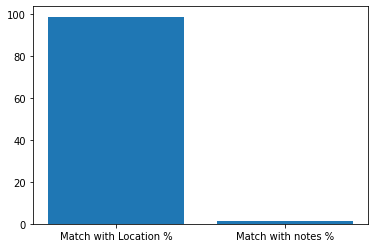

In [240]:
plt.bar(["Match with Location %","Match with notes %"],[locationMatchPerc,notesMatchPerc])

<BarContainer object of 2 artists>

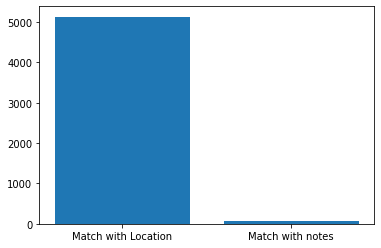

In [241]:
plt.bar(["Match with Location","Match with notes"],[locationMatch,notesMatch])

In [243]:
count=0
for ind,row in data.iterrows():
    if isinstance(row['Backup Notes'],str):
        count+=1
count

361

# Part E

In [69]:
users={}
maxTweets=0
userID=0
for tweet in tweets:
    user_id=tweet.user.id
    if user_id in users:
        users[user_id]+=1
    else:
        users[user_id]=1
    if users[user_id]>maxTweets:
        maxTweets=users[user_id]
        userID=user_id
            

In [70]:
users

{183145504: 9,
 355989081: 319,
 2994621330: 13,
 1056850669: 4,
 134758540: 2,
 4345658112: 1,
 2707085628: 1,
 740689850: 15,
 743517005920141314: 8,
 876997365999190016: 45,
 3240740509: 36,
 101021297: 29,
 35691170: 38,
 2926777939: 15,
 725003596811620353: 2,
 245687754: 97,
 131188226: 12,
 902151402964738051: 1,
 60287499: 1,
 706709499856334848: 29,
 731117568556142592: 26,
 1019887446417215489: 16,
 31059478: 6,
 1242298980660178951: 13,
 902084078882611200: 13,
 826734320018661378: 14,
 1113388720533647362: 1,
 825566197714403328: 14,
 830669077022531584: 9,
 3602209398: 1,
 47045926: 10,
 1149574156683362305: 3,
 1183717772938727425: 6,
 31060961: 7,
 515310146: 4,
 2590878146: 1,
 594676291: 1,
 39743812: 1,
 2348042388: 2,
 3304641168: 9,
 30859231: 1,
 762969396511924224: 1,
 20751449: 5,
 240649814: 3,
 2707179805: 2,
 412981124: 1,
 613357772: 2,
 405427035: 1,
 786893454488039424: 2,
 748509166533230595: 1,
 36327407: 1,
 874241422265769984: 1,
 992966051657756672: 8,

In [71]:
ver=[]
nonver=[]
for i in users.keys():
    user=api.get_user(i)
    if user.verified:
        ver.append(user)
    else:
        nonver.append(user)

In [74]:
len(ver)

55

In [73]:
len(users)

73

In [75]:
len(nonver)

18

<BarContainer object of 2 artists>

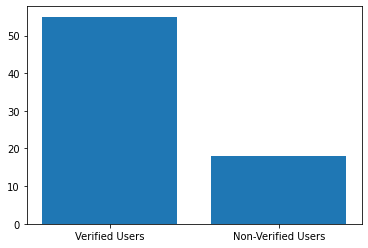

In [77]:
plt.bar(["Verified Users","Non-Verified Users"],[len(ver),len(nonver)])

In [78]:
followers=[]
followee=[]
for user in nonver:
    followers.append(user.followers_count)
    followee.append(user.friends_count)
print(followers)
print(followee)

[16187, 61599, 25493, 882, 3988, 128145, 2680, 85724, 873, 1726, 22573, 78943, 20320, 8426, 4053, 2080, 1511, 2655]
[14, 389, 1728, 58, 356, 298, 158, 171, 334, 127, 158, 19, 47, 565, 1811, 151, 9, 472]


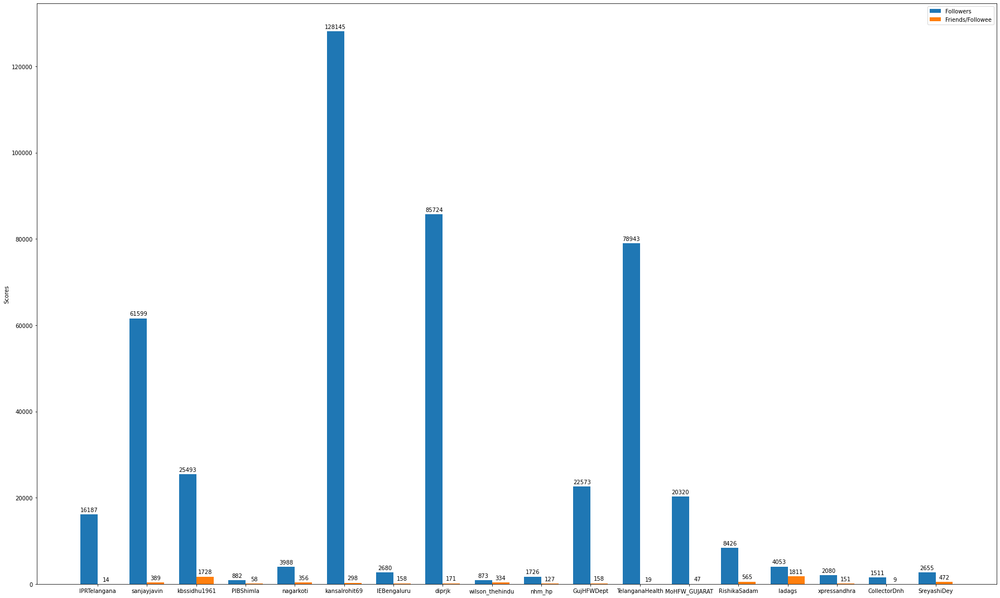

In [83]:
#code from matplotlib documentation(https://matplotlib.org/gallery/lines_bars_and_markers/barchart.html#sphx-glr-gallery-lines-bars-and-markers-barchart-py)
screenNames=[user.screen_name for user in nonver]

def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

x = np.arange(len(nonver))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=(25,15))
rects1 = ax.bar(x - width/2, followers, width, label='Followers')
rects2 = ax.bar(x + width/2, followee, width, label='Friends/Followee')
ax.set_ylabel('Scores')

ax.set_xticks(x)
ax.set_xticklabels(screenNames)
ax.legend()

autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

In [165]:
import datetime, time
startDate=datetime.datetime(2020,4,10)
endDate=datetime.datetime(2020,5,10)

###  Non verified user#1
    screen_name: kansalrohit69
    id: 731117568556142592

In [164]:
user=nonver[5]
print(user.screen_name)

kansalrohit69


In [166]:
tweetsInLastMonth=0
for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items():
    if tweet.created_at>=startDate and tweet.created_at<=endDate:
        tweetsInLastMonth+=1
    if tweet.created_at<startDate:
        break
tweetsInLastMonth

80

<BarContainer object of 2 artists>

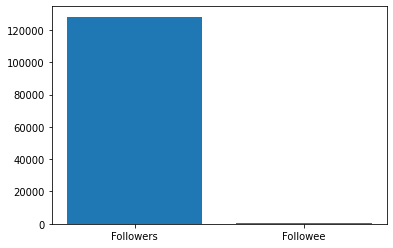

In [88]:
plt.bar(["Followers","Followee"],[user.followers_count,user.friends_count])

In [90]:
totalTweet=0
tweetWM=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        checktype = ""
        try:
            if('media' in tweet.extended_entities):
                tweetWM+=1
                checktype = tweet.extended_entities['media'][0]['type']
        except (AttributeError):
            if('media' in tweet.entities):
                tweetWM+=1
                checktype = tweet.entities['media'][0]['type']
        totalTweet+=1

kansalrohit69


In [94]:
print(totalTweet-tweetWM,tweetWM)

375 26


<BarContainer object of 2 artists>

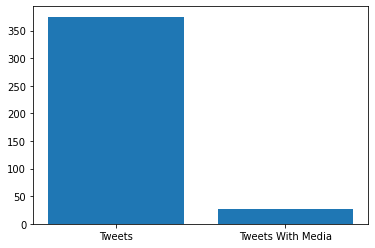

In [93]:
plt.bar(["Tweets","Tweets With Media"],[totalTweet-tweetWM,tweetWM])

In [98]:
verRT=0
totalRT=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        if tweet.full_text.startswith("RT"):
            if tweet.retweeted_status.user.verified:
                verRT+=1
            totalRT+=1
print(verRT,totalRT)

kansalrohit69


In [99]:
print(verRT,totalRT)

36 83


<BarContainer object of 2 artists>

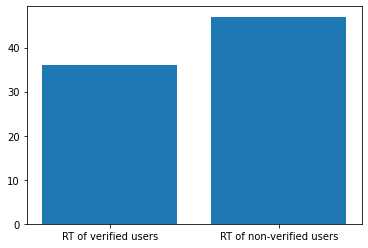

In [100]:
plt.bar(["RT of verified users","RT of non-verified users"],[verRT,totalRT-verRT])

In [101]:
totalT=0
totalRT=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        if tweet.full_text.startswith("RT"):
            totalRT+=1
        totalT+=1

kansalrohit69


<BarContainer object of 2 artists>

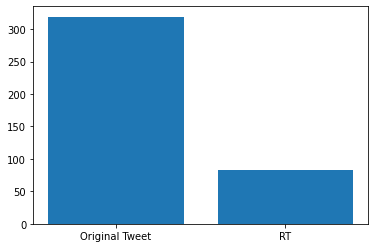

In [102]:
plt.bar(["Original Tweet","RT"],[totalT-totalRT,totalRT])

In [103]:
totalRT

83

###  Non verified user#2
    screen_name: diprjk
    id: 830669077022531584

In [167]:
user=nonver[7]

In [168]:
tweetsInLastMonth=0
for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items():
    if tweet.created_at>=startDate and tweet.created_at<=endDate:
        tweetsInLastMonth+=1
    if tweet.created_at<startDate:
        break
tweetsInLastMonth

246

In [105]:
print(user.id,user.screen_name)

830669077022531584 diprjk


<BarContainer object of 2 artists>

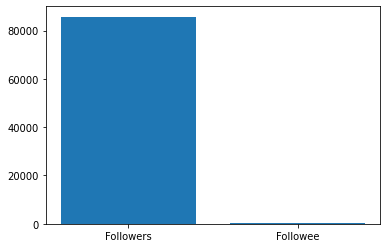

In [106]:
plt.bar(["Followers","Followee"],[user.followers_count,user.friends_count])

In [107]:
totalTweet=0
tweetWM=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        checktype = ""
        try:
            if('media' in tweet.extended_entities):
                tweetWM+=1
                checktype = tweet.extended_entities['media'][0]['type']
        except (AttributeError):
            if('media' in tweet.entities):
                tweetWM+=1
                checktype = tweet.entities['media'][0]['type']
        totalTweet+=1
print(totalTweet,tweetWM)

diprjk


In [109]:
print(totalTweet,tweetWM)

1000 500


<BarContainer object of 2 artists>

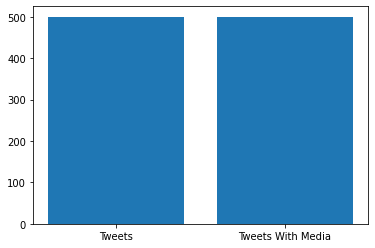

In [110]:
plt.bar(["Tweets","Tweets With Media"],[totalTweet-tweetWM,tweetWM])

In [111]:
verRT=0
totalRT=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        if tweet.full_text.startswith("RT"):
            if tweet.retweeted_status.user.verified:
                verRT+=1
            totalRT+=1
print(verRT,totalRT)

diprjk
150 282


<BarContainer object of 2 artists>

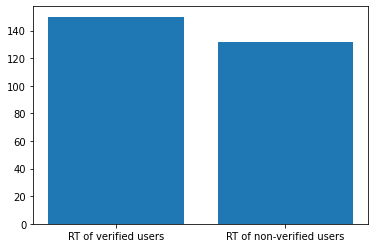

In [113]:
plt.bar(["RT of verified users","RT of non-verified users"],[verRT,totalRT-verRT])

In [114]:
totalT=0
totalRT=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        if tweet.full_text.startswith("RT"):
            totalRT+=1
        totalT+=1

diprjk


<BarContainer object of 2 artists>

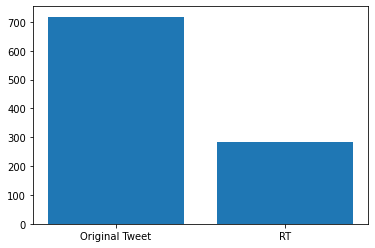

In [115]:
plt.bar(["Original Tweet","RT"],[totalT-totalRT,totalRT])

###  Non verified user#3
    screen_name: TelanganaHealth
    id: 992966051657756672

In [169]:
user=nonver[11]
print(user.id,user.screen_name)

992966051657756672 TelanganaHealth


In [170]:
tweetsInLastMonth=0
for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items():
    if tweet.created_at>=startDate and tweet.created_at<=endDate:
        tweetsInLastMonth+=1
    if tweet.created_at<startDate:
        break
tweetsInLastMonth

61

<BarContainer object of 2 artists>

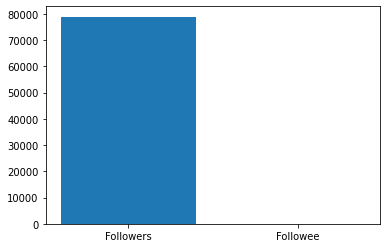

In [118]:
plt.bar(["Followers","Followee"],[user.followers_count,user.friends_count])

In [119]:
user.friends_count

19

In [120]:
totalTweet=0
tweetWM=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        checktype = ""
        try:
            if('media' in tweet.extended_entities):
                tweetWM+=1
                checktype = tweet.extended_entities['media'][0]['type']
        except (AttributeError):
            if('media' in tweet.entities):
                tweetWM+=1
                checktype = tweet.entities['media'][0]['type']
        totalTweet+=1
print(totalTweet,tweetWM)

TelanganaHealth
436 157


<BarContainer object of 2 artists>

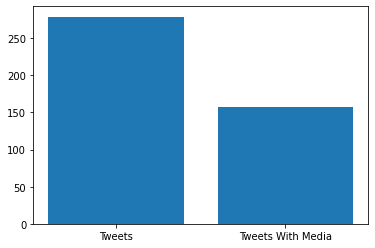

In [121]:
plt.bar(["Tweets","Tweets With Media"],[totalTweet-tweetWM,tweetWM])

In [122]:
verRT=0
totalRT=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        if tweet.full_text.startswith("RT"):
            if tweet.retweeted_status.user.verified:
                verRT+=1
            totalRT+=1
print(verRT,totalRT)

TelanganaHealth
135 149


<BarContainer object of 2 artists>

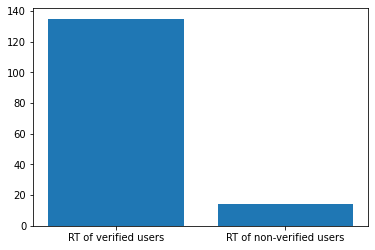

In [123]:
plt.bar(["RT of verified users","RT of non-verified users"],[verRT,totalRT-verRT])

In [124]:
totalT=0
totalRT=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        if tweet.full_text.startswith("RT"):
            totalRT+=1
        totalT+=1

TelanganaHealth


<BarContainer object of 2 artists>

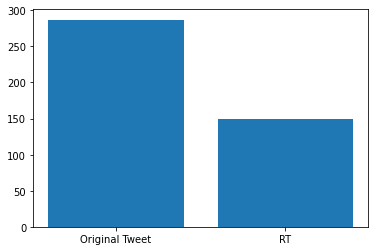

In [125]:
plt.bar(["Original Tweet","RT"],[totalT-totalRT,totalRT])

In [127]:
print(totalT-totalRT,totalRT)

287 149


###  Non verified user#4
    screen_name: wilson_thehindu
    id: 3602209398

In [171]:
user=nonver[8]
print(user.id,user.screen_name)

3602209398 wilson_thehindu


In [172]:
tweetsInLastMonth=0
for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items():
    if tweet.created_at>=startDate and tweet.created_at<=endDate:
        tweetsInLastMonth+=1
    if tweet.created_at<startDate:
        break
tweetsInLastMonth

105

<BarContainer object of 2 artists>

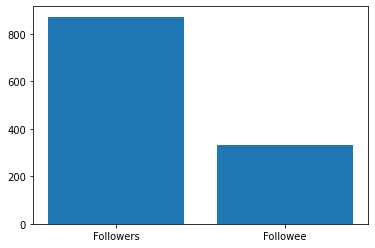

In [129]:
plt.bar(["Followers","Followee"],[user.followers_count,user.friends_count])

In [131]:
totalTweet=0
tweetWM=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        checktype = ""
        try:
            if('media' in tweet.extended_entities):
                tweetWM+=1
                checktype = tweet.extended_entities['media'][0]['type']
        except (AttributeError):
            if('media' in tweet.entities):
                tweetWM+=1
                checktype = tweet.entities['media'][0]['type']
        totalTweet+=1
print(totalTweet-tweetWM,tweetWM)

wilson_thehindu
854 146


<BarContainer object of 2 artists>

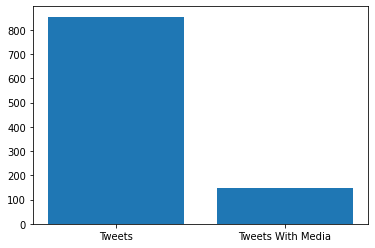

In [132]:
plt.bar(["Tweets","Tweets With Media"],[totalTweet-tweetWM,tweetWM])

In [133]:
verRT=0
totalRT=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        if tweet.full_text.startswith("RT"):
            if tweet.retweeted_status.user.verified:
                verRT+=1
            totalRT+=1
print(verRT,totalRT-verRT)

wilson_thehindu
48 72


<BarContainer object of 2 artists>

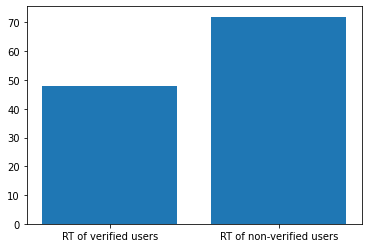

In [134]:
plt.bar(["RT of verified users","RT of non-verified users"],[verRT,totalRT-verRT])

In [135]:
totalT=0
totalRT=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        if tweet.full_text.startswith("RT"):
            totalRT+=1
        totalT+=1

wilson_thehindu


In [136]:
print(totalT-totalRT,totalRT)

880 120


<BarContainer object of 2 artists>

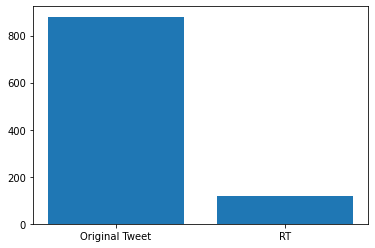

In [137]:
plt.bar(["Original Tweet","RT"],[totalT-totalRT,totalRT])

###  Non verified user#5
    screen_name: CollectorDnh
    id: 1240909753359851520

In [173]:
user=nonver[16]
print(user.id,user.screen_name)

1240909753359851520 CollectorDnh


In [174]:
tweetsInLastMonth=0
for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items():
    if tweet.created_at>=startDate and tweet.created_at<=endDate:
        tweetsInLastMonth+=1
    if tweet.created_at<startDate:
        break
tweetsInLastMonth

41

1511 9


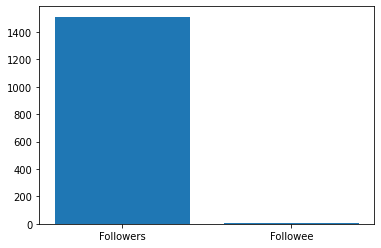

In [140]:
plt.bar(["Followers","Followee"],[user.followers_count,user.friends_count])
print(user.followers_count,user.friends_count)

In [141]:
totalTweet=0
tweetWM=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        checktype = ""
        try:
            if('media' in tweet.extended_entities):
                tweetWM+=1
                checktype = tweet.extended_entities['media'][0]['type']
        except (AttributeError):
            if('media' in tweet.entities):
                tweetWM+=1
                checktype = tweet.entities['media'][0]['type']
        totalTweet+=1
print(totalTweet-tweetWM,tweetWM)

CollectorDnh
30 34


<BarContainer object of 2 artists>

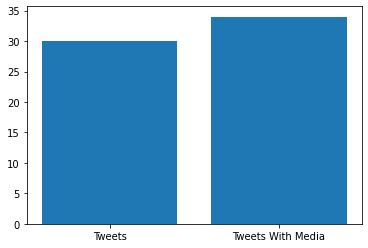

In [142]:
plt.bar(["Tweets","Tweets With Media"],[totalTweet-tweetWM,tweetWM])

In [143]:
verRT=0
totalRT=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        if tweet.full_text.startswith("RT"):
            if tweet.retweeted_status.user.verified:
                verRT+=1
            totalRT+=1
print(verRT,totalRT-verRT)

CollectorDnh
1 7


<BarContainer object of 2 artists>

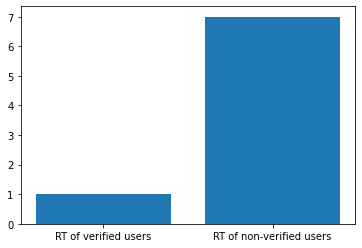

In [144]:
plt.bar(["RT of verified users","RT of non-verified users"],[verRT,totalRT-verRT])

In [145]:
totalT=0
totalRT=0
for i in range(1):
    print(user.screen_name)
    for tweet in tweepy.Cursor(api.user_timeline,id = user.id,tweet_mode="extended").items(1000):
        if tweet.full_text.startswith("RT"):
            totalRT+=1
        totalT+=1

CollectorDnh


<BarContainer object of 2 artists>

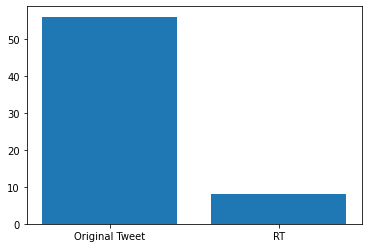

In [146]:
plt.bar(["Original Tweet","RT"],[totalT-totalRT,totalRT])

# Part D

In [147]:
import re 
#regular expression library

In [148]:
puncRemoved=[]
#removing punctutations
for tweet in tweets:
    puncRemoved.append(re.sub('[,\.!?]', '', tweet.full_text))


In [150]:
import nltk
from nltk.corpus import stopwords

In [151]:
lowerTextTweets=[]
for tweet in puncRemoved:
    tweet=re.sub('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+','',tweet)
    words=tweet.split()
    withoutStop=[i for i in words if i.lower() not in stopwords.words('english')]
    tweet=' '.join(withoutStop)
    lowerTextTweets.append(tweet.lower())

lowerTextTweets

['current count covid19 patients state maharashtra 2916 today newly 232 patients identified positive covid19 295 covid19 patients cured discharged respective hospitals #coronavirusupdates #meechmazarakshak',
 'two #covid19 positive cases confirmed kangra district: himachal pradesh cm jai ram thakur',
 'media bulletin status positive cases #covid19 telangana@telanganahealth',
 'haryana: number cases positive #covid19 rises 20 include six positive persons discharged treatment #coronaupdates #indiafightscorona',
 '23 new #coronavirus positive cases reported maharashtra today - sangali 1 pimpri-chinchwad 4 ahmednagar 3 buldhana 2 bmc 10 thane 1 &amp; nagpur 2 total number positive cases state rises 891',
 '2 #coronavirus positive cases found bihar - one siwan travel history dubai another nalanda travel history foreign country total positive cases state rises 9: rajendra memorial research institute medical sciences (rmri) official',
 '11 new #covid19 cases reported punjab today 9 contact hi

In [153]:
from sklearn.feature_extraction.text import CountVectorizer

In [154]:
bagOfWords = CountVectorizer().fit(lowerTextTweets)
countOfWords=bagOfWords.transform(lowerTextTweets)
totalCounts=np.zeros(len(bagOfWords.get_feature_names()))

In [155]:
for t in countOfWords:
    totalCounts+=t.toarray()[0]
totalCounts

array([6., 1., 2., ..., 2., 1., 2.])

In [156]:
zipCount=(zip(bagOfWords.get_feature_names(),totalCounts))
#dictionary for count of all words=> words:count
dictCount={}
for w in zipCount:
    dictCount[w[0]]=w[1]
dictCount

{'00': 6.0,
 '0019': 1.0,
 '00pm': 2.0,
 '01': 9.0,
 '0104': 1.0,
 '01042020': 1.0,
 '02': 6.0,
 '03': 14.0,
 '03042020': 1.0,
 '04': 16.0,
 '05': 2.0,
 '06': 2.0,
 '08': 1.0,
 '080': 1.0,
 '09': 1.0,
 '10': 45.0,
 '100': 3.0,
 '1000': 2.0,
 '10042020': 1.0,
 '1005': 1.0,
 '101': 1.0,
 '1018': 1.0,
 '102': 2.0,
 '1021': 1.0,
 '1025': 1.0,
 '103': 1.0,
 '1034': 1.0,
 '104': 3.0,
 '1046': 1.0,
 '105': 2.0,
 '106': 4.0,
 '1062': 1.0,
 '107': 3.0,
 '10714': 1.0,
 '1076': 1.0,
 '1078': 2.0,
 '108': 1.0,
 '10pm': 2.0,
 '10th': 2.0,
 '11': 43.0,
 '110': 2.0,
 '1101': 1.0,
 '1104': 1.0,
 '111': 1.0,
 '1112': 1.0,
 '1115': 1.0,
 '1115pm': 1.0,
 '1116': 1.0,
 '112': 1.0,
 '1120': 1.0,
 '113': 2.0,
 '1131': 1.0,
 '1135': 1.0,
 '1142': 1.0,
 '1155': 1.0,
 '116': 2.0,
 '1169': 1.0,
 '117': 3.0,
 '1173': 3.0,
 '118': 2.0,
 '1187': 1.0,
 '1193': 1.0,
 '11th': 2.0,
 '11we': 1.0,
 '12': 40.0,
 '120': 3.0,
 '121': 3.0,
 '121822': 1.0,
 '122': 2.0,
 '1227': 1.0,
 '1229': 1.0,
 '124': 3.0,
 '125': 3.0,
 '

In [158]:
from collections import Counter

In [159]:
top=Counter(dictCount)
topTenWords=top.most_common(20)
topTenWords

[('positive', 965.0),
 ('cases', 845.0),
 ('total', 412.0),
 ('covid19', 407.0),
 ('state', 339.0),
 ('coronavirus', 252.0),
 ('health', 250.0),
 ('today', 244.0),
 ('number', 232.0),
 ('new', 223.0),
 ('tested', 214.0),
 ('reported', 197.0),
 ('19', 171.0),
 ('amp', 165.0),
 ('covid', 160.0),
 ('department', 126.0),
 ('case', 113.0),
 ('history', 112.0),
 ('rajasthan', 112.0),
 ('taking', 111.0)]

In [160]:
mostFreqWords={}
for word in topTenWords:
    mostFreqWords[word[0]]=word[1]
mostFreqWords


{'positive': 965.0,
 'cases': 845.0,
 'total': 412.0,
 'covid19': 407.0,
 'state': 339.0,
 'coronavirus': 252.0,
 'health': 250.0,
 'today': 244.0,
 'number': 232.0,
 'new': 223.0,
 'tested': 214.0,
 'reported': 197.0,
 '19': 171.0,
 'amp': 165.0,
 'covid': 160.0,
 'department': 126.0,
 'case': 113.0,
 'history': 112.0,
 'rajasthan': 112.0,
 'taking': 111.0}

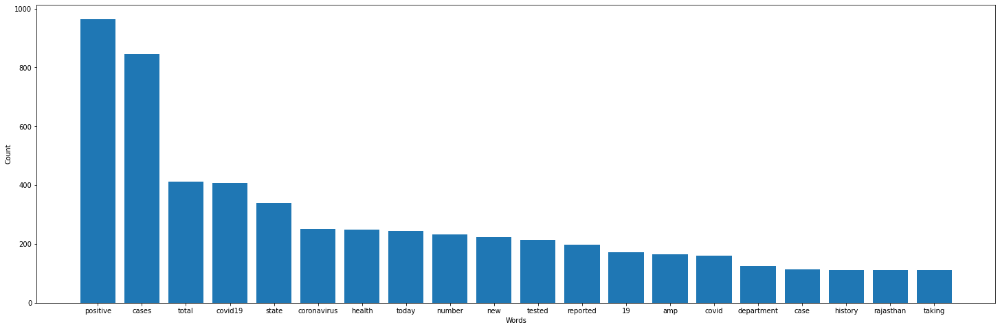

In [161]:
plt.figure(figsize=(25,8))
plt.bar(mostFreqWords.keys(), mostFreqWords.values())
plt.xlabel('Words')
plt.ylabel('Count')
plt.show()